# 25 — Synthetic Degradation Analysis

**Origin:** Existing Previous Version of Notebook 25, Pre-refactor\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/25_synthetic_degradation_analysis/`\
**Depends on:** Notebooks 01, 07–17, 20, and 21, including Notebook 12A

## Purpose

Evaluate restoration behaviour under the controlled procedural-degradation experiment while strictly separating eligible localized restoration objectives from excluded full-image correction tasks.

The Controlled-300 population contains:

- 1,155 generated degradation cases across 35 paintings;
- 350 localized cases approved for masked restoration;
- 1,400 primary candidates: 350 each from OpenCV Telea, LaMa, HINT, and Stable Diffusion;
- 11 completed SDXL candidates retained as a bounded descriptive subset;
- 11 complementary quality anchors kept separate rather than collapsed into a universal score.

Painting is the independent unit. Cases, severities, models, anchors, and candidates are repeated or nested observations.

## Statistical design

The notebook uses:

- 5,000 seeded, batched painting-cluster bootstrap draws;
- 100,000 seeded, batched sign-flip assignments with the plus-one correction;
- matched painting-level model contrasts;
- Benjamini–Hochberg correction;
- family-balanced ordinal rankings;
- descriptive treatment of the incomplete SDXL subset.

Exhaustive `35^35` bootstrap enumeration and `2^35` sign enumeration are prohibited.

## Interpretation limits

Procedural RGB degradation is a controlled computational proxy, not an exact simulation of material aging, pigment chemistry, moisture transport, varnish change, or conservation treatment.

Excluded degradation/model combinations are scope decisions, not model failures.

The notebook does not establish:

- independent art-historical style effects;
- physical interaction or synergy between degradation processes;
- synthetic-degradation uncertainty without repeated-seed evidence;
- historical authenticity;
- conservation approval;
- a universal quality or trustworthiness score.

## Canonical outputs

- `metrics/degradation_analysis.csv`
- `figures/degradation_performance.png`
- `figures/degradation_failure_examples.png`
- `reports/synthetic_degradation_analysis.html`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

## Batch 1 — Contract and preflight

This batch:

- locates the repository without assuming the notebook working directory;
- loads the Controlled-300 configuration;
- verifies the current inventory and evidence-governance records;
- validates all direct upstream completion gates, including Notebook 12A;
- declares the seven Notebook-owned canonical outputs;
- checks the 1,155-case, 350-case eligible, 1,411-candidate population arithmetic;
- validates the four-method primary and five-method bounded-SDXL scopes;
- enforces the bounded statistical design;
- records but does not delete any pre-existing Notebook 25 files;
- writes no canonical Notebook 25 artifact.

In [1]:
from __future__ import annotations

import json
import platform
import sys
from pathlib import Path

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml
from IPython.display import display


def locate_project_root(start: Path) -> Path:
    """Locate the repository from either its root or notebooks directory."""
    start = start.resolve()

    for candidate in (start, *start.parents):
        if (
            (candidate / "src" / "restoration_eval").is_dir()
            and (candidate / "config").is_dir()
            and (candidate / "notebooks").is_dir()
        ):
            return candidate

    raise RuntimeError(
        "Could not locate the painting-restoration-eval repository root."
    )


PROJECT_ROOT = locate_project_root(Path.cwd())
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

from restoration_eval.synthetic_degradation_analysis import (
    ANALYSIS_COLUMNS,
    ANALYSIS_SCHEMA_VERSION,
    CONFIG_SCHEMA_VERSION,
    MODULE_NAME,
    MODULE_VERSION,
    atomic_write_csv,
    benjamini_hochberg,
    build_eligibility_audit,
    build_multi_model_adapter_config,
    build_runtime_evidence,
    compute_case_family_balanced_ranks,
    compute_painting_slopes,
    empty_analysis_frame,
    family_balanced_ranks,
    load_synthetic_degradation_analysis_config,
    matched_rank_biserial,
    monte_carlo_sign_flip_test,
    normalise_quality_evidence,
    resolve_analysis_inputs,
    seeded_cluster_bootstrap_interval,
    select_quality_anchor_values,
    select_spillover_evidence,
    select_synthetic_degradation_population,
    summarise_painting_slopes_bounded,
    theil_sen_slope,
    validate_synthetic_degradation_analysis,
    validate_synthetic_degradation_report_html,
    validate_upstream_run_manifests,
    within_family_cluster_spearman,
)
from restoration_eval.manifests import (
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    configuration_checksums,
    environment_summary,
    git_state,
    package_versions,
    sha256_file,
    utc_now_iso,
    write_artifact_manifest,
    write_run_manifest,
)
from restoration_eval.validation import ValidationCollector

pd.set_option("display.max_columns", 160)
pd.set_option("display.width", 200)
pd.set_option("display.max_colwidth", 150)

mpl.rcParams.update(
    {
        "figure.dpi": 120,
        "savefig.dpi": 180,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": True,
        "grid.alpha": 0.22,
    }
)

RUN_STARTED_AT_UTC = utc_now_iso()
VALIDATION = ValidationCollector()

print("Notebook 25 environment initialized.")
print(f"Project root: {PROJECT_ROOT}")
print(f"Python: {platform.python_version()}")
print(f"Analysis helper: {MODULE_NAME} {MODULE_VERSION}")

Notebook 25 environment initialized.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Python: 3.12.6
Analysis helper: restoration_eval.synthetic_degradation_analysis 2.0.0


In [2]:
CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "synthetic_degradation_analysis.yaml"
)

ANALYSIS_CONFIG = load_synthetic_degradation_analysis_config(
    CONFIG_PATH
)
SETTINGS = ANALYSIS_CONFIG[
    "synthetic_degradation_analysis"
]

INPUT_PATHS = resolve_analysis_inputs(
    ANALYSIS_CONFIG,
    PROJECT_ROOT,
    must_exist=True,
)

OUTPUT_SPEC = SETTINGS["output"]
OUTPUT_ROOT = (
    PROJECT_ROOT / OUTPUT_SPEC["root"]
).resolve()

OUTPUT_PATHS = {
    "metrics": (
        OUTPUT_ROOT / OUTPUT_SPEC["metrics_path"]
    ),
    "performance_figure": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["performance_figure_path"]
    ),
    "failure_figure": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["failure_figure_path"]
    ),
    "report": (
        OUTPUT_ROOT / OUTPUT_SPEC["report_path"]
    ),
    "run_manifest": (
        OUTPUT_ROOT
        / OUTPUT_SPEC["run_manifest_path"]
    ),
    "artifacts": (
        OUTPUT_ROOT / OUTPUT_SPEC["artifacts_path"]
    ),
    "validation": (
        OUTPUT_ROOT / OUTPUT_SPEC["validation_path"]
    ),
}

WORK_ROOT = (
    OUTPUT_ROOT / OUTPUT_SPEC["work_root"]
)
CANONICAL_OUTPUT_PATHS = tuple(
    OUTPUT_PATHS.values()
)

preexisting_output_files = (
    sorted(
        path
        for path in OUTPUT_ROOT.rglob("*")
        if path.is_file()
    )
    if OUTPUT_ROOT.exists()
    else []
)

for output_path in CANONICAL_OUTPUT_PATHS:
    output_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

WORK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)

paths_inside_output_root = all(
    path.resolve().is_relative_to(OUTPUT_ROOT)
    for path in (
        *CANONICAL_OUTPUT_PATHS,
        WORK_ROOT,
    )
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="supported_python_version",
    check_description=(
        "Python uses an approved major and minor version."
    ),
    severity="blocking",
    expected=["3.11", "3.12"],
    observed=(
        f"{sys.version_info.major}."
        f"{sys.version_info.minor}"
    ),
    passed=(
        sys.version_info.major,
        sys.version_info.minor,
    ) in {(3, 11), (3, 12)},
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="configuration_schema_version",
    check_description=(
        "The loaded configuration uses the supported schema."
    ),
    severity="blocking",
    expected=CONFIG_SCHEMA_VERSION,
    observed=ANALYSIS_CONFIG[
        "config_schema_version"
    ],
    passed=(
        ANALYSIS_CONFIG["config_schema_version"]
        == CONFIG_SCHEMA_VERSION
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="analysis_schema_version",
    check_description=(
        "The configured analysis schema matches the helper."
    ),
    severity="blocking",
    expected=ANALYSIS_SCHEMA_VERSION,
    observed=SETTINGS[
        "analysis_schema_version"
    ],
    passed=(
        SETTINGS["analysis_schema_version"]
        == ANALYSIS_SCHEMA_VERSION
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="all_declared_inputs_exist",
    check_description=(
        "Every explicitly declared Notebook 25 input exists."
    ),
    severity="blocking",
    expected=len(SETTINGS["inputs"]),
    observed=sum(
        path.exists()
        for path in INPUT_PATHS.values()
    ),
    passed=all(
        path.exists()
        for path in INPUT_PATHS.values()
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="output_path_ownership",
    check_description=(
        "Every output is inside Notebook 25's owned root."
    ),
    severity="blocking",
    expected=OUTPUT_SPEC["root"],
    observed=str(
        OUTPUT_ROOT.relative_to(PROJECT_ROOT)
    ).replace("\\", "/"),
    passed=paths_inside_output_root,
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="canonical_output_count",
    check_description=(
        "The contract contains exactly seven canonical files."
    ),
    severity="blocking",
    expected=SETTINGS[
        "expected_counts"
    ]["canonical_output_files"],
    observed=len(CANONICAL_OUTPUT_PATHS),
    passed=(
        len(CANONICAL_OUTPUT_PATHS)
        == int(
            SETTINGS[
                "expected_counts"
            ]["canonical_output_files"]
        )
    ),
)
VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="initial_output_state_recorded",
    check_description=(
        "Existing Notebook 25 files are recorded "
        "without deletion."
    ),
    severity="info",
    expected="informational",
    observed={
        "preexisting_file_count": len(
            preexisting_output_files
        ),
        "paths": [
            str(
                path.relative_to(PROJECT_ROOT)
            ).replace("\\", "/")
            for path in preexisting_output_files
        ],
    },
    passed=True,
)

print("Configuration and path contract validated.")
print(f"Declared inputs: {len(INPUT_PATHS)}")
print(
    "Canonical outputs: "
    f"{len(CANONICAL_OUTPUT_PATHS)}"
)
print(
    "Pre-existing output files: "
    f"{len(preexisting_output_files)}"
)

Configuration and path contract validated.
Declared inputs: 45
Canonical outputs: 7
Pre-existing output files: 0


In [3]:
with INPUT_PATHS["inventory_run_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    INVENTORY_RUN = json.load(handle)

INVENTORY = pd.read_csv(
    INPUT_PATHS["inventory_path"],
    low_memory=False,
)

with INPUT_PATHS["project_paths_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    PROJECT_PATHS_REGISTRY = json.load(handle)

with INPUT_PATHS["evidence_coverage_path"].open(
    "r",
    encoding="utf-8-sig",
) as handle:
    EVIDENCE_COVERAGE = yaml.safe_load(handle)

EVIDENCE_AUDIT_TEXT = INPUT_PATHS[
    "evidence_audit_path"
].read_text(encoding="utf-8-sig")

ROADMAP_TEXT = INPUT_PATHS[
    "roadmap_path"
].read_text(encoding="utf-8-sig")

evidence_audit_lower = EVIDENCE_AUDIT_TEXT.lower()

inventory_relative_paths = set(
    INVENTORY["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

required_preparation_paths = {
    "config/evaluation/synthetic_degradation_analysis.yaml",
    "config/evaluation/evidence_coverage.yaml",
    "src/restoration_eval/synthetic_degradation_analysis.py",
    "tests/test_synthetic_degradation_analysis.py",
    "docs/final_notebook_roadmap.md",
    "docs/refactoring_implementation_guidelines.md",
    "docs/evidence_dependency_audit.md",
}

registered_artifacts = {
    str(record["artifact_key"]): record
    for record in PROJECT_PATHS_REGISTRY.get("artifacts", [])
}

required_registry_keys = {
    "dataset.artworks",
    "synthetic_degradation.cases",
    "synthetic_degradation.generation_audit",
    "synthetic_degradation.effect_masks",
    "synthetic_degradation.images",
    "synthetic_degradation.protocol",
    "experiment_contracts.case_registry",
    "experiment_contracts.model_eligibility",
    "experiment_contracts.region_policy",
    "opencv_telea.restorations",
    "lama.restorations",
    "hint.restorations",
    "stable_diffusion.candidates",
    "sdxl.candidates",
    "classical_metrics.metrics",
    "lpips_metrics.metrics",
    "feature_similarity.metrics",
    "spatial_diagnostics.metrics",
    "spatial_diagnostics.map_manifest",
    "local_consistency.metrics",
    "local_consistency.map_manifest",
    "semantic_structural.metrics",
    "multi_model_comparison.metrics",
    "multi_model_comparison.disagreement",
}

coverage_root = EVIDENCE_COVERAGE.get(
    "evidence_coverage",
    EVIDENCE_COVERAGE,
)

planned_notebooks = {
    str(record["notebook_id"]): record
    for record in coverage_root.get("planned_notebooks", [])
}

n25_coverage = planned_notebooks.get("25", {})

inventory_summary = INVENTORY_RUN.get("summary", {})

inventory_status_ok = (
    INVENTORY_RUN.get("status") == "completed"
    and int(inventory_summary.get("read_error_file_count", -1)) == 0
    and int(inventory_summary.get("read_error_count", -1)) == 0
)

audit_mentions_n25 = (
    "notebook 25" in evidence_audit_lower
    and "controlled-300" in evidence_audit_lower
)

roadmap_dependency_text = (
    "**Depends on:** Notebooks 01, 07–17, 20, and 21, "
    "including Notebook 12A"
)
roadmap_dependency_locked = roadmap_dependency_text in ROADMAP_TEXT

input_path_strings = {
    str(path.relative_to(PROJECT_ROOT)).replace("\\", "/")
    for path in INPUT_PATHS.values()
}

uncertainty_inputs_absent = all(
    not path.startswith(
        "outputs/18_diffusion_uncertainty_analysis/"
    )
    and not path.startswith(
        "outputs/19_uncertainty_and_spatial_explanation_maps/"
    )
    for path in input_path_strings
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_run_completed",
    check_description=(
        "The current inventory completed without read errors."
    ),
    severity="blocking",
    expected={
        "status": "completed",
        "read_error_file_count": 0,
        "read_error_count": 0,
    },
    observed={
        "status": INVENTORY_RUN.get("status"),
        "read_error_file_count": inventory_summary.get(
            "read_error_file_count"
        ),
        "read_error_count": inventory_summary.get("read_error_count"),
        "inventory_run_id": INVENTORY_RUN.get("inventory_run_id"),
    },
    passed=inventory_status_ok,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="preparation_files_in_inventory",
    check_description=(
        "Every Notebook 25 preparation file is indexed."
    ),
    severity="blocking",
    expected=sorted(required_preparation_paths),
    observed=sorted(
        required_preparation_paths & inventory_relative_paths
    ),
    passed=required_preparation_paths.issubset(
        inventory_relative_paths
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="required_artifacts_registered",
    check_description=(
        "Every required upstream artifact is registered."
    ),
    severity="blocking",
    expected=sorted(required_registry_keys),
    observed=sorted(
        required_registry_keys & set(registered_artifacts)
    ),
    passed=required_registry_keys.issubset(
        registered_artifacts
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="notebook_25_evidence_ready",
    check_description=(
        "Notebook 25 is registered as prepared for "
        "Controlled-300 execution."
    ),
    severity="blocking",
    expected="planned_supported_controlled_300_prepared",
    observed=n25_coverage.get("status"),
    passed=(
        n25_coverage.get("status")
        == "planned_supported_controlled_300_prepared"
        and not bool(
            n25_coverage.get("completion_gate_passed", True)
        )
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="evidence_audit_covers_notebook_25",
    check_description=(
        "The evidence audit contains the reopened "
        "Controlled-300 Notebook 25 contract."
    ),
    severity="blocking",
    expected=True,
    observed=audit_mentions_n25,
    passed=audit_mentions_n25,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="roadmap_dependency_boundary",
    check_description=(
        "The roadmap includes Notebook 12A in the "
        "exact Notebook 25 dependency boundary."
    ),
    severity="blocking",
    expected=roadmap_dependency_text,
    observed=roadmap_dependency_locked,
    passed=roadmap_dependency_locked,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="uncertainty_inputs_not_declared",
    check_description=(
        "Notebooks 18 and 19 are not falsely declared "
        "as synthetic-degradation evidence."
    ),
    severity="blocking",
    expected=True,
    observed=uncertainty_inputs_absent,
    passed=uncertainty_inputs_absent,
)

print("Inventory and governance records loaded.")
print(
    "Inventory run: "
    f"{INVENTORY_RUN['inventory_run_id']}"
)
print(f"Inventory rows: {len(INVENTORY):,}")
print(
    "Registered artifacts: "
    f"{len(registered_artifacts):,}"
)
print(
    "Notebook 25 preparation status: "
    f"{n25_coverage.get('status')}"
)
print(
    "Uncertainty inputs absent: "
    f"{uncertainty_inputs_absent}"
)

Inventory and governance records loaded.
Inventory run: inventory_20260921T231349Z_5cfd581a
Inventory rows: 141,663
Registered artifacts: 249
Notebook 25 preparation status: planned_supported_controlled_300_prepared
Uncertainty inputs absent: True


In [4]:
UPSTREAM_MANIFEST_INPUTS = {
    "01": "artworks_run_manifest_path",
    "07": "degradation_run_manifest_path",
    "08": "contracts_run_manifest_path",
    "09": "opencv_run_manifest_path",
    "10": "lama_run_manifest_path",
    "11": "stable_diffusion_run_manifest_path",
    "12": "sdxl_run_manifest_path",
    "12A": "hint_run_manifest_path",
    "13": "classical_run_manifest_path",
    "14": "lpips_run_manifest_path",
    "15": "feature_run_manifest_path",
    "16": "spatial_run_manifest_path",
    "17": "local_run_manifest_path",
    "20": "semantic_run_manifest_path",
    "21": "comparison_run_manifest_path",
}

UPSTREAM_MANIFESTS = {}

for notebook_id, input_key in UPSTREAM_MANIFEST_INPUTS.items():
    with INPUT_PATHS[input_key].open(
        "r",
        encoding="utf-8-sig",
    ) as handle:
        UPSTREAM_MANIFESTS[notebook_id] = json.load(handle)

UPSTREAM_MANIFEST_STATUS = validate_upstream_run_manifests(
    UPSTREAM_MANIFESTS
)

for row in UPSTREAM_MANIFEST_STATUS.itertuples(index=False):
    VALIDATION.add(
        validation_stage="batch_1_preflight",
        check_id=(
            "upstream_notebook_"
            f"{row.notebook_id}_completion_gate"
        ),
        check_description=(
            f"Notebook {row.notebook_id} completed "
            "with passed validation."
        ),
        severity="blocking",
        expected={
            "run_status": "completed",
            "validation_status": "passed",
            "completion_gate_passed": True,
        },
        observed={
            "run_status": row.run_status,
            "validation_status": row.validation_status,
            "completion_gate_passed": bool(
                row.completion_gate_passed
            ),
        },
        passed=bool(row.passed),
    )

display(UPSTREAM_MANIFEST_STATUS)

print("Direct upstream manifests checked.")
print(
    "Passed completion gates: "
    f"{int(UPSTREAM_MANIFEST_STATUS['passed'].sum())}/"
    f"{len(UPSTREAM_MANIFEST_STATUS)}"
)

,notebook_id,manifest_present,run_status,validation_status,completion_gate_passed,passed
0,01,True,completed,passed,True,True
1,07,True,completed,passed,True,True
2,08,True,completed,passed,True,True
3,09,True,completed,passed,True,True
4,10,True,completed,passed,True,True
5,11,True,completed,passed,True,True
6,12,True,completed,passed,True,True
7,12A,True,completed,passed,True,True
8,13,True,completed,passed,True,True
9,14,True,completed,passed,True,True


Direct upstream manifests checked.
Passed completion gates: 15/15


In [5]:
EXPECTED = SETTINGS["expected_counts"]
POPULATION = SETTINGS["population"]
STATISTICS = SETTINGS["statistics"]
REPORT = SETTINGS["report"]
POLICY = SETTINGS["evidence_policy"]

population_contract = pd.DataFrame(
    [
        ("Generated degradation cases", EXPECTED["generated_cases"]),
        ("Eligibility-approved cases", EXPECTED["eligible_cases"]),
        ("Primary four-method candidates", EXPECTED["core_candidates"]),
        ("Bounded SDXL candidates", EXPECTED["sdxl_candidates"]),
        ("All selected candidates", EXPECTED["selected_candidates"]),
        ("Five-method subset cases", EXPECTED["all_model_subset_cases"]),
        (
            "Five-method subset candidates",
            EXPECTED["all_model_subset_candidates"],
        ),
        ("Independent paintings", EXPECTED["paintings"]),
        ("Quality anchors", EXPECTED["quality_anchors"]),
        (
            "Normalized quality rows",
            EXPECTED["normalized_quality_rows"],
        ),
        (
            "Canonical analysis rows",
            EXPECTED["canonical_analysis_rows"],
        ),
        (
            "Canonical output files",
            EXPECTED["canonical_output_files"],
        ),
    ],
    columns=["contract_item", "expected_count"],
)

paintings = int(EXPECTED["paintings"])
single_family_cases = (
    paintings * len(POPULATION["severity_order"])
)

degradation_contract = pd.DataFrame(
    [
        {
            "degradation_family": family,
            "mild_cases": paintings,
            "moderate_cases": paintings,
            "severe_cases": paintings,
            "total_cases": single_family_cases,
            "combined": False,
        }
        for family in POPULATION["single_degradation_order"]
    ]
    + [
        {
            "degradation_family": POPULATION[
                "combined_degradation"
            ],
            "mild_cases": 0,
            "moderate_cases": paintings,
            "severe_cases": 0,
            "total_cases": paintings,
            "combined": True,
        }
    ]
)

candidate_contract = pd.DataFrame(
    [
        {
            "model_id": model_id,
            "expected_candidates": count,
            "comparison_role": (
                "bounded descriptive subset"
                if model_id == "sdxl_inpainting"
                else "primary four-method comparison"
            ),
            "producer_notebook": POPULATION[
                "model_source_notebooks"
            ][model_id],
        }
        for model_id, count in EXPECTED[
            "candidates_by_model"
        ].items()
    ]
)

output_contract = pd.DataFrame(
    [
        {
            "artifact": artifact,
            "relative_path": str(
                path.relative_to(PROJECT_ROOT)
            ).replace("\\", "/"),
            "exists_before_analysis": path.exists(),
        }
        for artifact, path in OUTPUT_PATHS.items()
    ]
)

analysis_row_keys = [
    f"{analysis_kind}_rows"
    for analysis_kind in SETTINGS["analysis_kinds"]
]

computed_analysis_rows = sum(
    int(EXPECTED[key])
    for key in analysis_row_keys
)

metric_source_keys = (
    "selected_classical_source_rows",
    "selected_lpips_source_rows",
    "selected_feature_source_rows",
    "selected_spatial_source_rows",
    "selected_local_source_rows",
    "selected_semantic_source_rows",
)

computed_metric_source_rows = sum(
    int(EXPECTED[key])
    for key in metric_source_keys
)

prohibited_policy_keys = [
    "missing_region_claim_permitted",
    "exact_conservation_damage_claim_permitted",
    "physical_degradation_interaction_claim_permitted",
    "independent_category_effect_permitted",
    "independent_style_effect_permitted",
    "stochastic_uncertainty_claim_permitted",
    "full_sdxl_comparison_claim_permitted",
    "historical_authenticity_claim_permitted",
    "conservation_approval_claim_permitted",
    "runtime_is_quality_evidence",
]

prohibited_claims_disabled = all(
    not bool(POLICY[key])
    for key in prohibited_policy_keys
)

expected_population = {
    "generated_cases": 1155,
    "eligible_cases": 350,
    "core_candidates": 1400,
    "sdxl_candidates": 11,
    "selected_candidates": 1411,
    "paintings": 35,
}

observed_population = {
    "generated_cases": int(EXPECTED["generated_cases"]),
    "eligible_cases": int(EXPECTED["eligible_cases"]),
    "core_candidates": int(EXPECTED["core_candidates"]),
    "sdxl_candidates": int(EXPECTED["sdxl_candidates"]),
    "selected_candidates": sum(
        int(value)
        for value in EXPECTED[
            "candidates_by_model"
        ].values()
    ),
    "paintings": int(EXPECTED["paintings"]),
}

expected_primary_models = [
    "opencv_telea",
    "lama",
    "hint_places2",
    "stable_diffusion_inpainting",
]

expected_all_models = [
    *expected_primary_models,
    "sdxl_inpainting",
]

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="population_arithmetic",
    check_description=(
        "The generated, eligible, primary, SDXL, "
        "and painting populations match the "
        "Controlled-300 contract."
    ),
    severity="blocking",
    expected=expected_population,
    observed=observed_population,
    passed=observed_population == expected_population,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="primary_and_bounded_model_scope",
    check_description=(
        "The primary and bounded model orders include "
        "the approved methods exactly."
    ),
    severity="blocking",
    expected={
        "primary": expected_primary_models,
        "all": expected_all_models,
    },
    observed={
        "primary": list(POPULATION["model_order"]),
        "all": list(POPULATION["all_model_order"]),
    },
    passed=(
        list(POPULATION["model_order"])
        == expected_primary_models
        and list(POPULATION["all_model_order"])
        == expected_all_models
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="eligible_degradation_design",
    check_description=(
        "Only the four approved localized degradation "
        "families enter restoration analysis."
    ),
    severity="blocking",
    expected=[
        "dirt_dust",
        "partial_transparency",
        "water_stain",
        "water_stain_dirt",
    ],
    observed=list(
        POPULATION["eligible_degradation_order"]
    ),
    passed=list(
        POPULATION["eligible_degradation_order"]
    )
    == [
        "dirt_dust",
        "partial_transparency",
        "water_stain",
        "water_stain_dirt",
    ],
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="eligible_family_case_arithmetic",
    check_description=(
        "Three severity-varying families contain "
        "105 cases each and the combined condition "
        "contains 35 cases."
    ),
    severity="blocking",
    expected={
        "single_family_cases": 105,
        "combined_cases": 35,
        "eligible_cases": 350,
    },
    observed={
        "single_family_cases": single_family_cases,
        "combined_cases": paintings,
        "eligible_cases": (
            single_family_cases
            * len(POPULATION["single_degradation_order"])
            + paintings
        ),
    },
    passed=(
        single_family_cases == 105
        and paintings == 35
        and (
            single_family_cases
            * len(POPULATION["single_degradation_order"])
            + paintings
        )
        == int(EXPECTED["eligible_cases"])
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="metric_independent_candidate_selection",
    check_description=(
        "Stable Diffusion selection is fixed before "
        "metric inspection."
    ),
    severity="blocking",
    expected={
        "role": "primary",
        "prompt_variant": "p00_generic",
        "seed": 2026,
        "metric_independent": True,
    },
    observed={
        "role": POPULATION[
            "stable_diffusion_primary_role"
        ],
        "prompt_variant": POPULATION[
            "stable_diffusion_primary_prompt_variant"
        ],
        "seed": POPULATION[
            "stable_diffusion_primary_seed"
        ],
        "metric_independent": POPULATION[
            "metric_independent_selection"
        ],
    },
    passed=(
        POPULATION["stable_diffusion_primary_role"]
        == "primary"
        and POPULATION[
            "stable_diffusion_primary_prompt_variant"
        ]
        == "p00_generic"
        and int(
            POPULATION[
                "stable_diffusion_primary_seed"
            ]
        )
        == 2026
        and bool(
            POPULATION[
                "metric_independent_selection"
            ]
        )
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="sdxl_partial_scope",
    check_description=(
        "SDXL remains an 11-case bounded descriptive "
        "subset."
    ),
    severity="blocking",
    expected={
        "cases": 11,
        "five_method_candidates": 55,
        "seed": 2026,
        "full_comparison_claim": False,
    },
    observed={
        "cases": len(POPULATION["sdxl_case_ids"]),
        "five_method_candidates": EXPECTED[
            "all_model_subset_candidates"
        ],
        "seed": POPULATION["sdxl_seed"],
        "full_comparison_claim": POLICY[
            "full_sdxl_comparison_claim_permitted"
        ],
    },
    passed=(
        len(POPULATION["sdxl_case_ids"]) == 11
        and int(
            EXPECTED["all_model_subset_candidates"]
        )
        == 55
        and int(POPULATION["sdxl_seed"]) == 2026
        and not bool(
            POLICY[
                "full_sdxl_comparison_claim_permitted"
            ]
        )
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="metric_source_row_arithmetic",
    check_description=(
        "The six selected source tables total "
        "311,831 raw metric rows."
    ),
    severity="blocking",
    expected=311831,
    observed=computed_metric_source_rows,
    passed=(
        computed_metric_source_rows == 311831
        and computed_metric_source_rows
        == int(EXPECTED["selected_metric_source_rows"])
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="canonical_analysis_row_arithmetic",
    check_description=(
        "The 17 approved analysis blocks total "
        "34,977 rows."
    ),
    severity="blocking",
    expected=34977,
    observed=computed_analysis_rows,
    passed=(
        computed_analysis_rows == 34977
        and computed_analysis_rows
        == int(EXPECTED["canonical_analysis_rows"])
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="bounded_painting_level_inference",
    check_description=(
        "Inference uses 35 paintings and bounded "
        "seeded resampling rather than exhaustive "
        "enumeration."
    ),
    severity="blocking",
    expected={
        "independent_unit": "painting",
        "bootstrap_resamples": 5000,
        "sign_flip_assignments": 100000,
        "positive_seeds_and_batches": True,
    },
    observed={
        "independent_unit": STATISTICS[
            "independent_unit"
        ],
        "bootstrap_resamples": STATISTICS[
            "bootstrap_resamples"
        ],
        "sign_flip_assignments": STATISTICS[
            "sign_flip_assignments"
        ],
        "bootstrap_seed": STATISTICS[
            "bootstrap_seed"
        ],
        "bootstrap_batch_size": STATISTICS[
            "bootstrap_batch_size"
        ],
        "sign_flip_seed": STATISTICS[
            "sign_flip_seed"
        ],
        "sign_flip_batch_size": STATISTICS[
            "sign_flip_batch_size"
        ],
    },
    passed=(
        STATISTICS["independent_unit"] == "painting"
        and int(STATISTICS["bootstrap_resamples"]) == 5000
        and int(STATISTICS["sign_flip_assignments"])
        == 100000
        and all(
            int(STATISTICS[key]) > 0
            for key in (
                "bootstrap_seed",
                "bootstrap_batch_size",
                "sign_flip_seed",
                "sign_flip_batch_size",
            )
        )
        and "seeded_batched"
        in str(STATISTICS["bootstrap_method"])
        and "seeded_batched"
        in str(STATISTICS["exact_test"])
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="uncertainty_non_applicability",
    check_description=(
        "Synthetic-degradation uncertainty is "
        "explicitly unavailable."
    ),
    severity="blocking",
    expected=False,
    observed=STATISTICS[
        "uncertainty_analysis_applicable"
    ],
    passed=not bool(
        STATISTICS[
            "uncertainty_analysis_applicable"
        ]
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="prohibited_claims_disabled",
    check_description=(
        "Unsupported scientific claims remain disabled."
    ),
    severity="blocking",
    expected=True,
    observed=prohibited_claims_disabled,
    passed=prohibited_claims_disabled,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="no_combined_quality_score",
    check_description=(
        "No combined quality or trust score is enabled."
    ),
    severity="blocking",
    expected=False,
    observed=STATISTICS[
        "combined_quality_score_retained"
    ],
    passed=not bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="approved_report_structure_locked",
    check_description=(
        "The final report retains the approved "
        "15-section mock and visual density."
    ),
    severity="blocking",
    expected={
        "locked": True,
        "section_count": 15,
        "analytical_views": 12,
        "diagnostic_panels": 9,
        "evidence_to_assertion": True,
    },
    observed={
        "locked": REPORT[
            "approved_mock_structure_locked"
        ],
        "section_count": len(
            REPORT["required_section_ids"]
        ),
        "analytical_views": REPORT[
            "minimum_embedded_analytical_views"
        ],
        "diagnostic_panels": REPORT[
            "minimum_embedded_restoration_or_diagnostic_panels"
        ],
        "evidence_to_assertion": REPORT[
            "require_evidence_to_assertion_pairs"
        ],
    },
    passed=(
        bool(
            REPORT[
                "approved_mock_structure_locked"
            ]
        )
        and len(REPORT["required_section_ids"]) == 15
        and int(
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        )
        == 12
        and int(
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        )
        == 9
        and bool(
            REPORT[
                "require_evidence_to_assertion_pairs"
            ]
        )
    ),
)

BATCH_1_CHECKS = VALIDATION.to_dataframe()
BATCH_1_SUMMARY = VALIDATION.summary()

display(population_contract)
display(degradation_contract)
display(candidate_contract)
display(output_contract)
display(BATCH_1_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 1 passed.")
print(
    "Validation checks: "
    f"{BATCH_1_SUMMARY['check_count']}"
)
print(
    "Blocking failures: "
    f"{BATCH_1_SUMMARY['blocking_failure_count']}"
)
print(
    "No canonical Notebook 25 artifact "
    "has been written."
)
print(
    "Next batch: population, eligibility, "
    "and candidate loading."
)

,contract_item,expected_count
0,Generated degradation cases,1155
1,Eligibility-approved cases,350
2,Primary four-method candidates,1400
3,Bounded SDXL candidates,11
4,All selected candidates,1411
5,Five-method subset cases,11
6,Five-method subset candidates,55
7,Independent paintings,35
8,Quality anchors,11
9,Normalized quality rows,495261


,degradation_family,mild_cases,moderate_cases,severe_cases,total_cases,combined
0,dirt_dust,35,35,35,105,False
1,partial_transparency,35,35,35,105,False
2,water_stain,35,35,35,105,False
3,water_stain_dirt,0,35,0,35,True


,model_id,expected_candidates,comparison_role,producer_notebook
0,opencv_telea,350,primary four-method comparison,09
1,lama,350,primary four-method comparison,10
2,hint_places2,350,primary four-method comparison,12A
3,stable_diffusion_inpainting,350,primary four-method comparison,11
4,sdxl_inpainting,11,bounded descriptive subset,12


,artifact,relative_path,exists_before_analysis
0,metrics,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,False
1,performance_figure,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,False
2,failure_figure,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,False
3,report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,False
4,run_manifest,outputs/25_synthetic_degradation_analysis/manifests/run_manifest.json,False
5,artifacts,outputs/25_synthetic_degradation_analysis/manifests/artifacts.csv,False
6,validation,outputs/25_synthetic_degradation_analysis/validation/checks.csv,False


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,supported_python_version,Python uses an approved major and minor version.,blocking,"[""3.11"", ""3.12""]",3.12,True,
1,batch_1_preflight,configuration_schema_version,The loaded configuration uses the supported schema.,blocking,synthetic_degradation_analysis_config.v1,synthetic_degradation_analysis_config.v1,True,
2,batch_1_preflight,analysis_schema_version,The configured analysis schema matches the helper.,blocking,synthetic_degradation_analysis.v1,synthetic_degradation_analysis.v1,True,
3,batch_1_preflight,all_declared_inputs_exist,Every explicitly declared Notebook 25 input exists.,blocking,45,45,True,
4,batch_1_preflight,output_path_ownership,Every output is inside Notebook 25's owned root.,blocking,outputs/25_synthetic_degradation_analysis,outputs/25_synthetic_degradation_analysis,True,
5,batch_1_preflight,canonical_output_count,The contract contains exactly seven canonical files.,blocking,7,7,True,
6,batch_1_preflight,initial_output_state_recorded,Existing Notebook 25 files are recorded without deletion.,info,informational,"{""paths"": [], ""preexisting_file_count"": 0}",True,
7,batch_1_preflight,inventory_run_completed,The current inventory completed without read errors.,blocking,"{""read_error_count"": 0, ""read_error_file_count"": 0, ""status"": ""completed""}","{""inventory_run_id"": ""inventory_20260921T231349Z_5cfd581a"", ""read_error_count"": 0, ""read_error_file_count"": 0, ""status"": ""completed""}",True,
8,batch_1_preflight,preparation_files_in_inventory,Every Notebook 25 preparation file is indexed.,blocking,"[""config/evaluation/evidence_coverage.yaml"", ""config/evaluation/synthetic_degradation_analysis.yaml"", ""docs/evidence_dependency_audit.md"", ""docs/f...","[""config/evaluation/evidence_coverage.yaml"", ""config/evaluation/synthetic_degradation_analysis.yaml"", ""docs/evidence_dependency_audit.md"", ""docs/f...",True,
9,batch_1_preflight,required_artifacts_registered,Every required upstream artifact is registered.,blocking,"[""classical_metrics.metrics"", ""dataset.artworks"", ""experiment_contracts.case_registry"", ""experiment_contracts.model_eligibility"", ""experiment_cont...","[""classical_metrics.metrics"", ""dataset.artworks"", ""experiment_contracts.case_registry"", ""experiment_contracts.model_eligibility"", ""experiment_cont...",True,


Batch 1 passed.
Validation checks: 42
Blocking failures: 0
No canonical Notebook 25 artifact has been written.
Next batch: population, eligibility, and candidate loading.


## Batch 2 — Population, eligibility, and candidate loading

Load and validate the frozen dataset, procedural-degradation, experiment-contract, eligibility, and restoration-candidate tables.

This batch establishes:

- the complete 1,155-case procedural-degradation population;
- 35 paintings balanced as seven paintings per broad visual category;
- the 350 cases approved for localized restoration analysis;
- 1,400 primary candidates across OpenCV Telea, LaMa, HINT, and Stable Diffusion;
- the 11-candidate bounded SDXL subset;
- exclusion of all 1,400 Stable Diffusion prompt-context candidates;
- the 55-candidate matched five-method subset;
- candidate and case path availability;
- the distinction between model eligibility and actual bounded candidate availability.

Candidate selection is fixed from upstream execution roles, prompt policy, seed, completion status, and the Notebook 08 eligibility contract. No quality metric is inspected or used to choose candidates.

In [6]:
ARTWORKS = pd.read_csv(
    INPUT_PATHS["artworks_path"],
    low_memory=False,
)

DEGRADATION_CASES = pd.read_csv(
    INPUT_PATHS["degradation_cases_path"],
    low_memory=False,
)

DEGRADATION_AUDIT = pd.read_csv(
    INPUT_PATHS["degradation_audit_path"],
    low_memory=False,
)

CASE_REGISTRY = pd.read_csv(
    INPUT_PATHS["case_registry_path"],
    low_memory=False,
)

MODEL_ELIGIBILITY = pd.read_csv(
    INPUT_PATHS["eligibility_path"],
    low_memory=False,
)

REGION_POLICY = pd.read_csv(
    INPUT_PATHS["region_policy_path"],
    low_memory=False,
)


def as_boolean(series: pd.Series) -> pd.Series:
    """Interpret persisted Boolean-like values consistently."""
    return (
        series.astype(str)
        .str.strip()
        .str.lower()
        .isin({"true", "1", "yes"})
    )


SYNTHETIC_CASES = DEGRADATION_CASES.loc[
    DEGRADATION_CASES["experiment_id"]
    .astype(str)
    .eq(POPULATION["experiment_id"])
].copy()

SYNTHETIC_CASE_IDS = set(
    SYNTHETIC_CASES["case_id"].astype(str)
)

SYNTHETIC_AUDIT = DEGRADATION_AUDIT.loc[
    DEGRADATION_AUDIT["case_id"]
    .astype(str)
    .isin(SYNTHETIC_CASE_IDS)
].copy()

SYNTHETIC_REGISTRY = CASE_REGISTRY.loc[
    CASE_REGISTRY["experiment_id"]
    .astype(str)
    .eq(POPULATION["experiment_id"])
].copy()

SYNTHETIC_ELIGIBILITY = MODEL_ELIGIBILITY.loc[
    MODEL_ELIGIBILITY["case_id"]
    .astype(str)
    .isin(SYNTHETIC_CASE_IDS)
].copy()

SYNTHETIC_ELIGIBILITY["eligible"] = as_boolean(
    SYNTHETIC_ELIGIBILITY["eligible"]
)

source_population_summary = pd.DataFrame(
    [
        {
            "source": "Notebook 01 artworks",
            "loaded_rows": len(ARTWORKS),
            "relevant_rows": ARTWORKS[
                "painting_id"
            ].astype(str).isin(
                POPULATION["painting_ids"]
            ).sum(),
        },
        {
            "source": "Notebook 07 cases",
            "loaded_rows": len(DEGRADATION_CASES),
            "relevant_rows": len(SYNTHETIC_CASES),
        },
        {
            "source": "Notebook 07 generation audit",
            "loaded_rows": len(DEGRADATION_AUDIT),
            "relevant_rows": len(SYNTHETIC_AUDIT),
        },
        {
            "source": "Notebook 08 case registry",
            "loaded_rows": len(CASE_REGISTRY),
            "relevant_rows": len(SYNTHETIC_REGISTRY),
        },
        {
            "source": "Notebook 08 model eligibility",
            "loaded_rows": len(MODEL_ELIGIBILITY),
            "relevant_rows": len(SYNTHETIC_ELIGIBILITY),
        },
        {
            "source": "Notebook 08 region policy",
            "loaded_rows": len(REGION_POLICY),
            "relevant_rows": len(REGION_POLICY),
        },
    ]
)

display(source_population_summary)

print("Frozen population and contract tables loaded.")
print(
    "Synthetic degradation cases: "
    f"{len(SYNTHETIC_CASES):,}"
)
print(
    "Synthetic eligibility decisions: "
    f"{len(SYNTHETIC_ELIGIBILITY):,}"
)
print(
    "Eligible decisions: "
    f"{int(SYNTHETIC_ELIGIBILITY['eligible'].sum()):,}"
)
print(
    "Excluded decisions: "
    f"{int((~SYNTHETIC_ELIGIBILITY['eligible']).sum()):,}"
)

,source,loaded_rows,relevant_rows
0,Notebook 01 artworks,300,35
1,Notebook 07 cases,1155,1155
2,Notebook 07 generation audit,1155,1155
3,Notebook 08 case registry,3425,1155
4,Notebook 08 model eligibility,17125,5775
5,Notebook 08 region policy,143,143


Frozen population and contract tables loaded.
Synthetic degradation cases: 1,155
Synthetic eligibility decisions: 5,775
Eligible decisions: 1,750
Excluded decisions: 4,025


In [7]:
OPENCV_CANDIDATES = pd.read_csv(
    INPUT_PATHS["opencv_candidates_path"],
    low_memory=False,
)

LAMA_CANDIDATES = pd.read_csv(
    INPUT_PATHS["lama_candidates_path"],
    low_memory=False,
)

HINT_CANDIDATES = pd.read_csv(
    INPUT_PATHS["hint_candidates_path"],
    low_memory=False,
)

STABLE_DIFFUSION_CANDIDATES = pd.read_csv(
    INPUT_PATHS[
        "stable_diffusion_candidates_path"
    ],
    low_memory=False,
)

SDXL_SOURCE_CANDIDATES = pd.read_csv(
    INPUT_PATHS["sdxl_candidates_path"],
    low_memory=False,
)

SELECTED_CANDIDATES = (
    select_synthetic_degradation_population(
        DEGRADATION_CASES,
        ARTWORKS,
        MODEL_ELIGIBILITY,
        OPENCV_CANDIDATES,
        LAMA_CANDIDATES,
        HINT_CANDIDATES,
        STABLE_DIFFUSION_CANDIDATES,
        SDXL_SOURCE_CANDIDATES,
        config=ANALYSIS_CONFIG,
    )
)

ELIGIBILITY_AUDIT = build_eligibility_audit(
    DEGRADATION_CASES,
    MODEL_ELIGIBILITY,
    SELECTED_CANDIDATES,
    config=ANALYSIS_CONFIG,
)

CORE_CANDIDATES = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["coverage_role"]
    .astype(str)
    .eq("core_four_model")
].copy()

SDXL_CANDIDATES = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["model_id"]
    .astype(str)
    .eq("sdxl_inpainting")
].copy()

CORE_CASE_IDS = set(
    CORE_CANDIDATES["case_id"].astype(str)
)

SDXL_CASE_IDS = set(
    SDXL_CANDIDATES["case_id"].astype(str)
)

APPROVED_CASES = (
    CORE_CANDIDATES.loc[
        CORE_CANDIDATES["model_id"]
        .astype(str)
        .eq("opencv_telea")
    ]
    .drop_duplicates("case_id")
    .copy()
)

ALL_MODEL_SUBSET_CANDIDATES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES["case_id"]
        .astype(str)
        .isin(SDXL_CASE_IDS)
    ]
    .copy()
)

SD_SYNTHETIC_COMPLETED = (
    STABLE_DIFFUSION_CANDIDATES.loc[
        STABLE_DIFFUSION_CANDIDATES[
            "experiment_id"
        ]
        .astype(str)
        .eq(POPULATION["experiment_id"])
        & STABLE_DIFFUSION_CANDIDATES[
            "case_id"
        ]
        .astype(str)
        .isin(CORE_CASE_IDS)
        & STABLE_DIFFUSION_CANDIDATES[
            "status"
        ]
        .astype(str)
        .eq(POPULATION["completed_status"])
    ]
    .copy()
)

SD_PROMPT_CONTEXT_EXCLUDED = (
    SD_SYNTHETIC_COMPLETED.loc[
        SD_SYNTHETIC_COMPLETED[
            "execution_role"
        ]
        .astype(str)
        .eq("prompt_context")
    ]
    .copy()
)

candidate_count_summary = (
    SELECTED_CANDIDATES.groupby(
        ["model_id", "coverage_role"],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        cases=("case_id", "nunique"),
        paintings=("painting_id", "nunique"),
        total_runtime_seconds=(
            "runtime_seconds",
            "sum",
        ),
    )
    .reset_index()
)

degradation_design = (
    APPROVED_CASES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        dropna=False,
    )
    .size()
    .unstack(fill_value=0)
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=POPULATION["severity_order"],
        fill_value=0,
    )
    .reset_index()
)

eligibility_availability_summary = (
    ELIGIBILITY_AUDIT.groupby(
        [
            "model_id",
            "eligibility_status",
            "candidate_available",
        ],
        dropna=False,
    )
    .size()
    .rename("case_count")
    .reset_index()
)

sd_policy_summary = (
    SD_SYNTHETIC_COMPLETED.groupby(
        [
            "execution_role",
            "prompt_variant_id",
            "seed",
        ],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        cases=("case_id", "nunique"),
    )
    .reset_index()
    .sort_values(
        [
            "execution_role",
            "prompt_variant_id",
            "seed",
        ],
        kind="stable",
    )
)

display(candidate_count_summary)
display(degradation_design)
display(eligibility_availability_summary)
display(sd_policy_summary)

print("Metric-independent candidate selection completed.")
print(
    "Selected candidates: "
    f"{len(SELECTED_CANDIDATES):,}"
)
print(
    "Primary four-model candidates: "
    f"{len(CORE_CANDIDATES):,}"
)
print(
    "Bounded SDXL candidates: "
    f"{len(SDXL_CANDIDATES):,}"
)
print(
    "Five-model matched-subset candidates: "
    f"{len(ALL_MODEL_SUBSET_CANDIDATES):,}"
)
print(
    "Excluded Stable Diffusion prompt-context "
    f"candidates: {len(SD_PROMPT_CONTEXT_EXCLUDED):,}"
)

,model_id,coverage_role,candidates,cases,paintings,total_runtime_seconds
0,hint_places2,core_four_model,350,350,35,2335.711000
1,lama,core_four_model,350,350,35,545.963076
2,opencv_telea,core_four_model,350,350,35,261.497727
3,sdxl_inpainting,bounded_sdxl_subset,11,11,10,2187.676000
4,stable_diffusion_inpainting,core_four_model,350,350,35,3135.892699


severity,degradation_family,mild,moderate,severe
0,dirt_dust,35,35,35
1,partial_transparency,35,35,35
2,water_stain,35,35,35
3,water_stain_dirt,0,35,0


,model_id,eligibility_status,candidate_available,case_count
0,hint_places2,eligible,True,350
1,hint_places2,excluded,False,805
2,lama,eligible,True,350
3,lama,excluded,False,805
4,opencv_telea,eligible,True,350
5,opencv_telea,excluded,False,805
6,sdxl_inpainting,eligible,False,339
7,sdxl_inpainting,eligible,True,11
8,sdxl_inpainting,excluded,False,805
9,stable_diffusion_inpainting,eligible,True,350


,execution_role,prompt_variant_id,seed,candidates,cases
0,primary,p00_generic,2026,350,350
1,prompt_context,p01_category,2026,350,350
2,prompt_context,p02_artist,2026,350,350
3,prompt_context,p03_artist_category,2026,350,350
4,prompt_context,p04_full_context,2026,350,350


Metric-independent candidate selection completed.
Selected candidates: 1,411
Primary four-model candidates: 1,400
Bounded SDXL candidates: 11
Five-model matched-subset candidates: 55
Excluded Stable Diffusion prompt-context candidates: 1,400


In [8]:
def inspect_repository_paths(
    frame: pd.DataFrame,
    *,
    source_name: str,
    columns: list[str],
) -> pd.DataFrame:
    """Summarize repository-relative file availability."""
    records = []

    for column in columns:
        values = (
            frame[column]
            .dropna()
            .astype(str)
            .str.strip()
        )
        values = values.loc[values.ne("")]

        relative_flags = []
        inside_root_flags = []
        exists_flags = []

        for value in values:
            source_path = Path(value)
            resolved = (
                source_path.resolve()
                if source_path.is_absolute()
                else (PROJECT_ROOT / source_path).resolve()
            )

            is_relative = not source_path.is_absolute()
            inside_root = resolved.is_relative_to(
                PROJECT_ROOT
            )

            relative_flags.append(is_relative)
            inside_root_flags.append(inside_root)
            exists_flags.append(
                inside_root and resolved.is_file()
            )

        records.append(
            {
                "source": source_name,
                "path_column": column,
                "path_count": len(values),
                "repository_relative_count": int(
                    sum(relative_flags)
                ),
                "inside_project_root_count": int(
                    sum(inside_root_flags)
                ),
                "existing_file_count": int(
                    sum(exists_flags)
                ),
                "all_valid": bool(values.empty)
                or (
                    all(relative_flags)
                    and all(inside_root_flags)
                    and all(exists_flags)
                ),
            }
        )

    return pd.DataFrame(records)


case_path_audit = inspect_repository_paths(
    SYNTHETIC_CASES,
    source_name="Notebook 07 synthetic cases",
    columns=[
        "clean_image_path",
        "effect_mask_path",
        "degraded_image_path",
    ],
)

candidate_path_audit = inspect_repository_paths(
    SELECTED_CANDIDATES,
    source_name="selected restoration candidates",
    columns=[
        "input_image_path",
        "clean_image_path",
        "mask_or_effect_path",
        "restored_path",
    ],
)

PATH_AUDIT = pd.concat(
    [
        case_path_audit,
        candidate_path_audit,
    ],
    ignore_index=True,
)

REQUIRED_REGION_IDS = {
    str(anchor["region_id"])
    for anchor in SETTINGS["quality_anchors"]
}
REQUIRED_REGION_IDS.add(
    str(SETTINGS["spillover"]["region_id"])
)

REGION_POLICY_WORK = REGION_POLICY.copy()
REGION_POLICY_WORK["_compatible"] = as_boolean(
    REGION_POLICY_WORK["compatible"]
)

region_policy_summary = (
    REGION_POLICY_WORK.loc[
        REGION_POLICY_WORK["region_id"]
        .astype(str)
        .isin(REQUIRED_REGION_IDS)
    ]
    .groupby("region_id", dropna=False)
    .agg(
        policy_rows=("policy_id", "size"),
        compatible_rows=("_compatible", "sum"),
        metric_families=(
            "metric_family",
            "nunique",
        ),
    )
    .reindex(sorted(REQUIRED_REGION_IDS))
    .reset_index()
)

generation_audit_summary = pd.DataFrame(
    [
        {
            "check": "validation_status_passed",
            "observed": int(
                SYNTHETIC_AUDIT[
                    "validation_status"
                ]
                .astype(str)
                .eq("passed")
                .sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
        {
            "check": "output_contract_valid",
            "observed": int(
                as_boolean(
                    SYNTHETIC_AUDIT[
                        "output_contract_valid"
                    ]
                ).sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
        {
            "check": "outside_support_unchanged",
            "observed": int(
                pd.to_numeric(
                    SYNTHETIC_AUDIT[
                        "outside_support_changed_pixels"
                    ],
                    errors="coerce",
                )
                .fillna(-1)
                .eq(0)
                .sum()
            ),
            "expected": EXPECTED[
                "generated_cases"
            ],
        },
    ]
)

sdxl_scope_summary = (
    SDXL_CANDIDATES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        paintings=("painting_id", "nunique"),
    )
    .reset_index()
)

display(generation_audit_summary)
display(PATH_AUDIT)
display(region_policy_summary)
display(sdxl_scope_summary)

print("Population integrity inspection completed.")
print(
    "All inspected paths valid: "
    f"{bool(PATH_AUDIT['all_valid'].all())}"
)
print(
    "Required region IDs represented: "
    f"{region_policy_summary['region_id'].nunique()}/"
    f"{len(REQUIRED_REGION_IDS)}"
)
print(
    "Selected paintings: "
    f"{SELECTED_CANDIDATES['painting_id'].nunique()}"
)

,check,observed,expected
0,validation_status_passed,1155,1155
1,output_contract_valid,1155,1155
2,outside_support_unchanged,1155,1155


,source,path_column,path_count,repository_relative_count,inside_project_root_count,existing_file_count,all_valid
0,Notebook 07 synthetic cases,clean_image_path,1155,1155,1155,1155,True
1,Notebook 07 synthetic cases,effect_mask_path,1155,1155,1155,1155,True
2,Notebook 07 synthetic cases,degraded_image_path,1155,1155,1155,1155,True
3,selected restoration candidates,input_image_path,1411,1411,1411,1411,True
4,selected restoration candidates,clean_image_path,1411,1411,1411,1411,True
5,selected restoration candidates,mask_or_effect_path,1411,1411,1411,1411,True
6,selected restoration candidates,restored_path,1411,1411,1411,1411,True


,region_id,policy_rows,compatible_rows,metric_families
0,boundary_ring,13,6,13
1,content_region,13,12,13
2,mask_bbox_crop,13,12,13
3,masked_region,13,5,13
4,outside_mask_content,13,5,13


,degradation_family,severity,candidates,paintings
0,dirt_dust,moderate,1,1
1,dirt_dust,severe,2,2
2,partial_transparency,moderate,1,1
3,partial_transparency,severe,1,1
4,water_stain,moderate,2,2
5,water_stain,severe,2,2
6,water_stain_dirt,moderate,2,2


Population integrity inspection completed.
All inspected paths valid: True
Required region IDs represented: 5/5
Selected paintings: 35


In [9]:
BATCH_2_STAGE = "batch_2_population_loading"

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage != BATCH_2_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_2_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    """Register one JSON-safe Batch 2 validation check."""
    VALIDATION.add(
        validation_stage=BATCH_2_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


observed_candidate_counts = {
    str(model_id): int(count)
    for model_id, count in (
        SELECTED_CANDIDATES.groupby("model_id")
        .size()
        .to_dict()
        .items()
    )
}

expected_candidate_counts = {
    str(model_id): int(count)
    for model_id, count in EXPECTED[
        "candidates_by_model"
    ].items()
}

observed_family_counts = {
    str(family): int(count)
    for family, count in (
        APPROVED_CASES.groupby(
            "degradation_family"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_family_counts = {
    family: (
        int(EXPECTED["paintings"])
        * len(POPULATION["severity_order"])
    )
    for family in POPULATION[
        "single_degradation_order"
    ]
}
expected_family_counts[
    POPULATION["combined_degradation"]
] = int(EXPECTED["paintings"])

observed_severity_design = {
    f"{family}::{severity}": int(count)
    for (family, severity), count in (
        APPROVED_CASES.groupby(
            [
                "degradation_family",
                "severity",
            ]
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_severity_design = {
    f"{family}::{severity}": int(
        EXPECTED["paintings"]
    )
    for family in POPULATION[
        "single_degradation_order"
    ]
    for severity in POPULATION[
        "severity_order"
    ]
}
expected_severity_design[
    (
        f"{POPULATION['combined_degradation']}::"
        f"{POPULATION['combined_severity']}"
    )
] = int(EXPECTED["paintings"])

eligible_available = ELIGIBILITY_AUDIT.loc[
    ELIGIBILITY_AUDIT["eligible"]
    & ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

eligible_unavailable = ELIGIBILITY_AUDIT.loc[
    ELIGIBILITY_AUDIT["eligible"]
    & ~ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

excluded_but_available = ELIGIBILITY_AUDIT.loc[
    ~ELIGIBILITY_AUDIT["eligible"]
    & ELIGIBILITY_AUDIT[
        "candidate_available"
    ]
].copy()

selected_sd = SELECTED_CANDIDATES.loc[
    SELECTED_CANDIDATES["model_id"]
    .astype(str)
    .eq("stable_diffusion_inpainting")
].copy()

selected_sdxl_severity = {
    str(severity): int(count)
    for severity, count in (
        SDXL_CANDIDATES.groupby("severity")
        .size()
        .to_dict()
        .items()
    )
}

source_counts_observed = {
    "artworks": len(ARTWORKS),
    "synthetic_cases": len(SYNTHETIC_CASES),
    "synthetic_generation_audit": len(
        SYNTHETIC_AUDIT
    ),
    "synthetic_case_registry": len(
        SYNTHETIC_REGISTRY
    ),
    "synthetic_eligibility": len(
        SYNTHETIC_ELIGIBILITY
    ),
    "opencv_candidates": len(
        OPENCV_CANDIDATES
    ),
    "lama_candidates": len(
        LAMA_CANDIDATES
    ),
    "hint_candidates": len(
        HINT_CANDIDATES
    ),
    "stable_diffusion_candidates": len(
        STABLE_DIFFUSION_CANDIDATES
    ),
    "sdxl_candidates": len(
        SDXL_SOURCE_CANDIDATES
    ),
}

source_counts_expected = {
    "artworks": 300,
    "synthetic_cases": 1155,
    "synthetic_generation_audit": 1155,
    "synthetic_case_registry": 1155,
    "synthetic_eligibility": 5775,
    "opencv_candidates": 2620,
    "lama_candidates": 2620,
    "hint_candidates": 2620,
    "stable_diffusion_candidates": 8520,
    "sdxl_candidates": 35,
}

add_batch_2_check(
    check_id="frozen_source_row_counts",
    description=(
        "Frozen upstream source tables retain "
        "their expected Controlled-300 row counts."
    ),
    expected=source_counts_expected,
    observed=source_counts_observed,
    passed=(
        source_counts_observed
        == source_counts_expected
    ),
)

generation_passed_count = int(
    SYNTHETIC_AUDIT[
        "validation_status"
    ]
    .astype(str)
    .eq("passed")
    .sum()
)

generation_contract_count = int(
    as_boolean(
        SYNTHETIC_AUDIT[
            "output_contract_valid"
        ]
    ).sum()
)

outside_support_unchanged_count = int(
    pd.to_numeric(
        SYNTHETIC_AUDIT[
            "outside_support_changed_pixels"
        ],
        errors="coerce",
    )
    .fillna(-1)
    .eq(0)
    .sum()
)

expected_generated_cases = int(
    EXPECTED["generated_cases"]
)

add_batch_2_check(
    check_id="generation_audit_passed",
    description=(
        "All procedural cases passed the Notebook 07 "
        "contract without outside-support changes."
    ),
    expected={
        "rows": expected_generated_cases,
        "validation_passed": expected_generated_cases,
        "output_contract_valid": expected_generated_cases,
        "outside_support_unchanged": expected_generated_cases,
    },
    observed={
        "rows": len(SYNTHETIC_AUDIT),
        "validation_passed": generation_passed_count,
        "output_contract_valid": generation_contract_count,
        "outside_support_unchanged": (
            outside_support_unchanged_count
        ),
    },
    passed=(
        len(SYNTHETIC_AUDIT)
        == expected_generated_cases
        and generation_passed_count
        == expected_generated_cases
        and generation_contract_count
        == expected_generated_cases
        and outside_support_unchanged_count
        == expected_generated_cases
    ),
)

registry_case_ids = set(
    SYNTHETIC_REGISTRY[
        "case_id"
    ].astype(str)
)

add_batch_2_check(
    check_id="case_registry_alignment",
    description=(
        "Notebook 08 registers exactly the same "
        "1,155 procedural case IDs."
    ),
    expected={
        "case_count": expected_generated_cases,
        "status": "passed",
    },
    observed={
        "case_count": len(registry_case_ids),
        "statuses": sorted(
            SYNTHETIC_REGISTRY[
                "status"
            ].astype(str).unique()
        ),
    },
    passed=(
        registry_case_ids
        == SYNTHETIC_CASE_IDS
        and SYNTHETIC_REGISTRY[
            "status"
        ]
        .astype(str)
        .eq("passed")
        .all()
    ),
)

unique_eligibility_pairs = len(
    SYNTHETIC_ELIGIBILITY[
        ["case_id", "model_id"]
    ].drop_duplicates()
)

expected_eligibility_rows = int(
    EXPECTED[
        "eligibility_case_model_rows"
    ]
)

add_batch_2_check(
    check_id="eligibility_ledger_contract",
    description=(
        "The eligibility ledger contains one decision "
        "for every synthetic case-model pair."
    ),
    expected={
        "rows": expected_eligibility_rows,
        "unique_case_model_pairs": (
            expected_eligibility_rows
        ),
    },
    observed={
        "rows": len(SYNTHETIC_ELIGIBILITY),
        "unique_case_model_pairs": (
            unique_eligibility_pairs
        ),
    },
    passed=(
        len(SYNTHETIC_ELIGIBILITY)
        == expected_eligibility_rows
        and unique_eligibility_pairs
        == expected_eligibility_rows
    ),
)

eligible_decisions = int(
    SYNTHETIC_ELIGIBILITY[
        "eligible"
    ].sum()
)

excluded_decisions = int(
    (
        ~SYNTHETIC_ELIGIBILITY[
            "eligible"
        ]
    ).sum()
)

add_batch_2_check(
    check_id="eligibility_decision_counts",
    description=(
        "Exactly 1,750 decisions are eligible and "
        "4,025 are excluded."
    ),
    expected={
        "eligible": EXPECTED[
            "eligible_case_model_rows"
        ],
        "excluded": EXPECTED[
            "excluded_case_model_rows"
        ],
    },
    observed={
        "eligible": eligible_decisions,
        "excluded": excluded_decisions,
    },
    passed=(
        eligible_decisions
        == int(
            EXPECTED[
                "eligible_case_model_rows"
            ]
        )
        and excluded_decisions
        == int(
            EXPECTED[
                "excluded_case_model_rows"
            ]
        )
    ),
)

add_batch_2_check(
    check_id="eligible_case_design",
    description=(
        "The approved cases retain the exact "
        "degradation-family and severity design."
    ),
    expected={
        "case_count": EXPECTED[
            "eligible_cases"
        ],
        "family_counts": expected_family_counts,
        "severity_cells": expected_severity_design,
    },
    observed={
        "case_count": len(APPROVED_CASES),
        "family_counts": observed_family_counts,
        "severity_cells": observed_severity_design,
    },
    passed=(
        len(APPROVED_CASES)
        == int(EXPECTED["eligible_cases"])
        and observed_family_counts
        == expected_family_counts
        and observed_severity_design
        == expected_severity_design
    ),
)

painting_category_counts = (
    APPROVED_CASES[
        ["painting_id", "category"]
    ]
    .drop_duplicates()
    .groupby("category")
    .size()
    .to_dict()
)

cases_per_painting = (
    APPROVED_CASES.groupby(
        "painting_id"
    ).size()
)

add_batch_2_check(
    check_id="focused_cohort_balance",
    description=(
        "The focused cohort contains 35 paintings, "
        "seven per category and ten eligible cases "
        "per painting."
    ),
    expected={
        "paintings": 35,
        "categories": 5,
        "paintings_per_category": [7],
        "cases_per_painting": [10],
    },
    observed={
        "paintings": APPROVED_CASES[
            "painting_id"
        ].nunique(),
        "categories": len(
            painting_category_counts
        ),
        "paintings_per_category": sorted(
            set(
                int(value)
                for value in painting_category_counts.values()
            )
        ),
        "cases_per_painting": sorted(
            cases_per_painting.unique().tolist()
        ),
    },
    passed=(
        APPROVED_CASES[
            "painting_id"
        ].nunique()
        == 35
        and len(painting_category_counts) == 5
        and set(
            painting_category_counts.values()
        )
        == {7}
        and cases_per_painting.eq(10).all()
    ),
)

add_batch_2_check(
    check_id="selected_candidate_counts",
    description=(
        "The selected population contains the exact "
        "per-model candidate counts."
    ),
    expected=expected_candidate_counts,
    observed=observed_candidate_counts,
    passed=(
        observed_candidate_counts
        == expected_candidate_counts
        and len(SELECTED_CANDIDATES)
        == int(EXPECTED["selected_candidates"])
    ),
)

duplicate_candidate_ids = int(
    SELECTED_CANDIDATES[
        "candidate_id"
    ].duplicated().sum()
)

duplicate_model_case_pairs = int(
    SELECTED_CANDIDATES[
        ["model_id", "case_id"]
    ].duplicated().sum()
)

add_batch_2_check(
    check_id="candidate_key_uniqueness",
    description=(
        "Candidate IDs and model-case pairs are "
        "unique after selection."
    ),
    expected={
        "duplicate_candidate_ids": 0,
        "duplicate_model_case_pairs": 0,
    },
    observed={
        "duplicate_candidate_ids": (
            duplicate_candidate_ids
        ),
        "duplicate_model_case_pairs": (
            duplicate_model_case_pairs
        ),
    },
    passed=(
        duplicate_candidate_ids == 0
        and duplicate_model_case_pairs == 0
    ),
)

core_coverage = {
    str(model_id): int(
        CORE_CANDIDATES.loc[
            CORE_CANDIDATES["model_id"]
            .astype(str)
            .eq(str(model_id)),
            "case_id",
        ].nunique()
    )
    for model_id in POPULATION["model_order"]
}

core_case_sets_match = all(
    set(
        CORE_CANDIDATES.loc[
            CORE_CANDIDATES["model_id"]
            .astype(str)
            .eq(str(model_id)),
            "case_id",
        ].astype(str)
    )
    == CORE_CASE_IDS
    for model_id in POPULATION["model_order"]
)

add_batch_2_check(
    check_id="core_model_case_coverage",
    description=(
        "Every primary model covers the same exact "
        "350 eligible cases."
    ),
    expected={
        str(model_id): 350
        for model_id in POPULATION[
            "model_order"
        ]
    },
    observed=core_coverage,
    passed=(
        core_case_sets_match
        and set(core_coverage.values()) == {350}
    ),
)

selected_sd_roles = sorted(
    selected_sd[
        "execution_role"
    ].astype(str).unique()
)

selected_sd_variants = sorted(
    selected_sd[
        "prompt_variant_id"
    ].astype(str).unique()
)

selected_sd_seeds = sorted(
    pd.to_numeric(
        selected_sd["seed"],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

add_batch_2_check(
    check_id="stable_diffusion_primary_policy",
    description=(
        "Stable Diffusion uses only the fixed generic "
        "primary seed-2026 candidate."
    ),
    expected={
        "candidates": 350,
        "execution_roles": ["primary"],
        "prompt_variants": ["p00_generic"],
        "seeds": [2026],
    },
    observed={
        "candidates": len(selected_sd),
        "execution_roles": selected_sd_roles,
        "prompt_variants": selected_sd_variants,
        "seeds": selected_sd_seeds,
    },
    passed=(
        len(selected_sd) == 350
        and selected_sd_roles == ["primary"]
        and selected_sd_variants
        == ["p00_generic"]
        and selected_sd_seeds == [2026]
    ),
)

selected_prompt_context_count = int(
    SELECTED_CANDIDATES.get(
        "execution_role",
        pd.Series(
            index=SELECTED_CANDIDATES.index,
            dtype="object",
        ),
    )
    .astype(str)
    .eq("prompt_context")
    .sum()
)

add_batch_2_check(
    check_id="prompt_context_candidates_excluded",
    description=(
        "All 1,400 prompt-context candidates remain "
        "outside the comparison population."
    ),
    expected={
        "excluded_candidates": 1400,
        "prompt_variants": 4,
        "selected_prompt_context": 0,
    },
    observed={
        "excluded_candidates": len(
            SD_PROMPT_CONTEXT_EXCLUDED
        ),
        "prompt_variants": (
            SD_PROMPT_CONTEXT_EXCLUDED[
                "prompt_variant_id"
            ].nunique()
        ),
        "selected_prompt_context": (
            selected_prompt_context_count
        ),
    },
    passed=(
        len(SD_PROMPT_CONTEXT_EXCLUDED)
        == int(
            EXPECTED[
                "stable_diffusion_excluded_"
                "prompt_context_candidates"
            ]
        )
        and SD_PROMPT_CONTEXT_EXCLUDED[
            "prompt_variant_id"
        ].nunique()
        == 4
        and selected_prompt_context_count == 0
    ),
)

add_batch_2_check(
    check_id="sdxl_bounded_scope",
    description=(
        "SDXL contains the exact 11 configured cases "
        "and remains severity-imbalanced."
    ),
    expected={
        "case_ids": sorted(
            map(
                str,
                POPULATION["sdxl_case_ids"],
            )
        ),
        "severity_counts": {
            "moderate": 6,
            "severe": 5,
        },
    },
    observed={
        "case_ids": sorted(SDXL_CASE_IDS),
        "severity_counts": selected_sdxl_severity,
    },
    passed=(
        SDXL_CASE_IDS
        == set(
            map(
                str,
                POPULATION["sdxl_case_ids"],
            )
        )
        and selected_sdxl_severity
        == {
            "moderate": 6,
            "severe": 5,
        }
    ),
)

all_model_case_counts = (
    ALL_MODEL_SUBSET_CANDIDATES.groupby(
        "case_id"
    )["model_id"]
    .nunique()
)

add_batch_2_check(
    check_id="all_model_matched_subset",
    description=(
        "The bounded comparison contains five models "
        "for each of 11 cases."
    ),
    expected={
        "cases": 11,
        "candidates": 55,
        "models_per_case": [5],
    },
    observed={
        "cases": int(
            ALL_MODEL_SUBSET_CANDIDATES[
                "case_id"
            ].nunique()
        ),
        "candidates": len(
            ALL_MODEL_SUBSET_CANDIDATES
        ),
        "models_per_case": sorted(
            all_model_case_counts
            .unique()
            .tolist()
        ),
    },
    passed=(
        ALL_MODEL_SUBSET_CANDIDATES[
            "case_id"
        ].nunique()
        == int(
            EXPECTED[
                "all_model_subset_cases"
            ]
        )
        and len(
            ALL_MODEL_SUBSET_CANDIDATES
        )
        == int(
            EXPECTED[
                "all_model_subset_candidates"
            ]
        )
        and all_model_case_counts.eq(5).all()
    ),
)

unavailable_models = sorted(
    eligible_unavailable[
        "model_id"
    ].astype(str).unique()
)

add_batch_2_check(
    check_id="eligibility_and_availability_separated",
    description=(
        "The 339 unavailable eligible rows are only "
        "the unexecuted SDXL cases."
    ),
    expected={
        "available_eligible": 1411,
        "eligible_unavailable": 339,
        "excluded_available": 0,
        "unavailable_models": [
            "sdxl_inpainting"
        ],
    },
    observed={
        "available_eligible": len(
            eligible_available
        ),
        "eligible_unavailable": len(
            eligible_unavailable
        ),
        "excluded_available": len(
            excluded_but_available
        ),
        "unavailable_models": unavailable_models,
    },
    passed=(
        len(eligible_available) == 1411
        and len(eligible_unavailable) == 339
        and len(excluded_but_available) == 0
        and unavailable_models
        == ["sdxl_inpainting"]
    ),
)

required_metadata_columns = [
    "painting_id",
    "category",
    "style_or_period",
    "degradation_family",
    "severity",
    "runtime_seconds",
]

missing_metadata_values = int(
    SELECTED_CANDIDATES[
        required_metadata_columns
    ]
    .isna()
    .sum()
    .sum()
)

add_batch_2_check(
    check_id="selected_candidate_metadata",
    description=(
        "Every selected candidate has painting, "
        "category, style, severity, and runtime metadata."
    ),
    expected=0,
    observed=missing_metadata_values,
    passed=(missing_metadata_values == 0),
)

add_batch_2_check(
    check_id="repository_file_paths",
    description=(
        "All case and selected-candidate paths are "
        "repository-relative existing files."
    ),
    expected=True,
    observed=bool(
        PATH_AUDIT["all_valid"].all()
    ),
    passed=bool(
        PATH_AUDIT["all_valid"].all()
    ),
)

observed_region_ids = sorted(
    region_policy_summary[
        "region_id"
    ]
    .dropna()
    .astype(str)
    .unique()
)

add_batch_2_check(
    check_id="required_region_policy_coverage",
    description=(
        "Every quality-anchor and spillover region is "
        "represented in the canonical region policy."
    ),
    expected=sorted(REQUIRED_REGION_IDS),
    observed=observed_region_ids,
    passed=(
        set(observed_region_ids)
        == REQUIRED_REGION_IDS
        and region_policy_summary[
            "compatible_rows"
        ]
        .gt(0)
        .all()
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_2_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Population loading did not write any "
        "canonical Notebook 25 artifact."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_2_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_2_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_2_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 2 passed.")
print(
    "Batch 2 checks: "
    f"{len(BATCH_2_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_2_CHECKS['passed']).sum())}"
)
print(
    "Approved cases: "
    f"{len(APPROVED_CASES):,}"
)
print(
    "Selected candidates: "
    f"{len(SELECTED_CANDIDATES):,}"
)
print(
    "No quality metric was loaded or used "
    "for candidate selection."
)
print(
    "Next batch: representative smoke test "
    "and design-integrity review."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_population_loading,frozen_source_row_counts,Frozen upstream source tables retain their expected Controlled-300 row counts.,blocking,"{""artworks"": 300, ""hint_candidates"": 2620, ""lama_candidates"": 2620, ""opencv_candidates"": 2620, ""sdxl_candidates"": 35, ""stable_diffusion_candidates...","{""artworks"": 300, ""hint_candidates"": 2620, ""lama_candidates"": 2620, ""opencv_candidates"": 2620, ""sdxl_candidates"": 35, ""stable_diffusion_candidates...",True,
1,batch_2_population_loading,generation_audit_passed,All procedural cases passed the Notebook 07 contract without outside-support changes.,blocking,"{""output_contract_valid"": 1155, ""outside_support_unchanged"": 1155, ""rows"": 1155, ""validation_passed"": 1155}","{""output_contract_valid"": 1155, ""outside_support_unchanged"": 1155, ""rows"": 1155, ""validation_passed"": 1155}",True,
2,batch_2_population_loading,case_registry_alignment,"Notebook 08 registers exactly the same 1,155 procedural case IDs.",blocking,"{""case_count"": 1155, ""status"": ""passed""}","{""case_count"": 1155, ""statuses"": [""passed""]}",True,
3,batch_2_population_loading,eligibility_ledger_contract,The eligibility ledger contains one decision for every synthetic case-model pair.,blocking,"{""rows"": 5775, ""unique_case_model_pairs"": 5775}","{""rows"": 5775, ""unique_case_model_pairs"": 5775}",True,
4,batch_2_population_loading,eligibility_decision_counts,"Exactly 1,750 decisions are eligible and 4,025 are excluded.",blocking,"{""eligible"": 1750, ""excluded"": 4025}","{""eligible"": 1750, ""excluded"": 4025}",True,
5,batch_2_population_loading,eligible_case_design,The approved cases retain the exact degradation-family and severity design.,blocking,"{""case_count"": 350, ""family_counts"": {""dirt_dust"": 105, ""partial_transparency"": 105, ""water_stain"": 105, ""water_stain_dirt"": 35}, ""severity_cells""...","{""case_count"": 350, ""family_counts"": {""dirt_dust"": 105, ""partial_transparency"": 105, ""water_stain"": 105, ""water_stain_dirt"": 35}, ""severity_cells""...",True,
6,batch_2_population_loading,focused_cohort_balance,"The focused cohort contains 35 paintings, seven per category and ten eligible cases per painting.",blocking,"{""cases_per_painting"": [10], ""categories"": 5, ""paintings"": 35, ""paintings_per_category"": [7]}","{""cases_per_painting"": [10], ""categories"": 5, ""paintings"": 35, ""paintings_per_category"": [7]}",True,
7,batch_2_population_loading,selected_candidate_counts,The selected population contains the exact per-model candidate counts.,blocking,"{""hint_places2"": 350, ""lama"": 350, ""opencv_telea"": 350, ""sdxl_inpainting"": 11, ""stable_diffusion_inpainting"": 350}","{""hint_places2"": 350, ""lama"": 350, ""opencv_telea"": 350, ""sdxl_inpainting"": 11, ""stable_diffusion_inpainting"": 350}",True,
8,batch_2_population_loading,candidate_key_uniqueness,Candidate IDs and model-case pairs are unique after selection.,blocking,"{""duplicate_candidate_ids"": 0, ""duplicate_model_case_pairs"": 0}","{""duplicate_candidate_ids"": 0, ""duplicate_model_case_pairs"": 0}",True,
9,batch_2_population_loading,core_model_case_coverage,Every primary model covers the same exact 350 eligible cases.,blocking,"{""hint_places2"": 350, ""lama"": 350, ""opencv_telea"": 350, ""stable_diffusion_inpainting"": 350}","{""hint_places2"": 350, ""lama"": 350, ""opencv_telea"": 350, ""stable_diffusion_inpainting"": 350}",True,


Batch 2 passed.
Batch 2 checks: 19
Blocking failures: 0
Approved cases: 350
Selected candidates: 1,411
No quality metric was loaded or used for candidate selection.
Next batch: representative smoke test and design-integrity review.


## Batch 3 — Representative smoke test and design integrity

Perform image-level integrity checks across all 1,411 selected restoration candidates and visually inspect a fixed representative subset.

The representative subset covers:

- all four eligible degradation families;
- mild, moderate, and severe procedural settings;
- all four complete primary models;
- two cases from the bounded SDXL subset;
- one combined `water_stain_dirt` case.

Two complementary views are rendered:

1. full-image context with the procedural effect mask;
2. enlarged affected-region crops for closer restoration inspection.

These views are diagnostic only. They do not select candidates, replace quantitative evaluation, or support conservation claims.

In [10]:
from PIL import Image


SMOKE_CASE_IDS = [
    (
        "synthetic_degradation__p001__"
        "dirt_dust__mild"
    ),
    (
        "synthetic_degradation__p018__"
        "partial_transparency__moderate"
    ),
    (
        "synthetic_degradation__p039__"
        "water_stain__severe"
    ),
    (
        "synthetic_degradation__p026__"
        "water_stain_dirt__moderate"
    ),
]

SMOKE_CASES = (
    APPROVED_CASES.loc[
        APPROVED_CASES["case_id"]
        .astype(str)
        .isin(SMOKE_CASE_IDS)
    ]
    .copy()
)

SMOKE_CASES["_display_order"] = (
    SMOKE_CASES["case_id"]
    .astype(str)
    .map(
        {
            case_id: index
            for index, case_id in enumerate(
                SMOKE_CASE_IDS
            )
        }
    )
)

SMOKE_CASES = (
    SMOKE_CASES.sort_values(
        "_display_order",
        kind="stable",
    )
    .drop(columns="_display_order")
    .reset_index(drop=True)
)

SMOKE_CANDIDATES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES["case_id"]
        .astype(str)
        .isin(SMOKE_CASE_IDS)
    ]
    .copy()
)

smoke_case_summary = (
    SMOKE_CASES[
        [
            "case_id",
            "painting_id",
            "category",
            "degradation_family",
            "severity",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .merge(
        SMOKE_CANDIDATES.groupby(
            "case_id"
        )
        .agg(
            candidate_count=(
                "candidate_id",
                "nunique",
            ),
            model_count=(
                "model_id",
                "nunique",
            ),
            models=(
                "model_id",
                lambda values: ", ".join(
                    sorted(
                        set(
                            values.astype(str)
                        )
                    )
                ),
            ),
        )
        .reset_index(),
        on="case_id",
        how="left",
        validate="one_to_one",
    )
)

display(smoke_case_summary)

print("Representative smoke-test population locked.")
print(
    "Representative cases: "
    f"{len(SMOKE_CASES)}"
)
print(
    "Representative restoration candidates: "
    f"{len(SMOKE_CANDIDATES)}"
)
print(
    "Degradation families: "
    + ", ".join(
        SMOKE_CASES[
            "degradation_family"
        ].astype(str)
    )
)
print(
    "Severity settings represented: "
    + ", ".join(
        sorted(
            SMOKE_CASES["severity"]
            .astype(str)
            .unique()
        )
    )
)

,case_id,painting_id,category,degradation_family,severity,affected_content_fraction,changed_content_fraction,candidate_count,model_count,models
0,synthetic_degradation__p001__dirt_dust__mild,p001,portrait_figure,dirt_dust,mild,0.007045,0.003796,4,4,"hint_places2, lama, opencv_telea, stable_diffusion_inpainting"
1,synthetic_degradation__p018__partial_transparency__moderate,p018,landscape_natural,partial_transparency,moderate,0.462792,0.427299,4,4,"hint_places2, lama, opencv_telea, stable_diffusion_inpainting"
2,synthetic_degradation__p039__water_stain__severe,p039,abstraction_surrealism,water_stain,severe,0.425786,0.407296,5,5,"hint_places2, lama, opencv_telea, sdxl_inpainting, stable_diffusion_inpainting"
3,synthetic_degradation__p026__water_stain_dirt__moderate,p026,architecture_structured,water_stain_dirt,moderate,0.328206,0.305160,5,5,"hint_places2, lama, opencv_telea, sdxl_inpainting, stable_diffusion_inpainting"


Representative smoke-test population locked.
Representative cases: 4
Representative restoration candidates: 18
Degradation families: dirt_dust, partial_transparency, water_stain, water_stain_dirt
Severity settings represented: mild, moderate, severe


In [11]:
def resolve_repository_file(
    relative_path: str,
) -> Path:
    """Resolve one validated repository-relative file."""
    source = Path(str(relative_path))

    if source.is_absolute():
        raise ValueError(
            "Expected a repository-relative path, "
            f"received: {source}"
        )

    resolved = (
        PROJECT_ROOT / source
    ).resolve()

    if not resolved.is_relative_to(
        PROJECT_ROOT
    ):
        raise ValueError(
            "Resolved path escapes the repository: "
            f"{source}"
        )

    if not resolved.is_file():
        raise FileNotFoundError(resolved)

    return resolved


def load_rgb_array(
    relative_path: str,
) -> np.ndarray:
    """Load a repository image as an RGB array."""
    path = resolve_repository_file(
        relative_path
    )

    with Image.open(path) as image:
        return np.asarray(
            image.convert("RGB")
        )


def load_mask_array(
    relative_path: str,
) -> np.ndarray:
    """Load an effect mask as an unsigned 8-bit array."""
    path = resolve_repository_file(
        relative_path
    )

    with Image.open(path) as image:
        return np.asarray(
            image.convert("L")
        )


pixel_integrity_records = []
candidate_total = len(SELECTED_CANDIDATES)

for candidate_number, candidate in enumerate(
    SELECTED_CANDIDATES.itertuples(
        index=False
    ),
    start=1,
):
    input_rgb = load_rgb_array(
        candidate.input_image_path
    )
    clean_rgb = load_rgb_array(
        candidate.clean_image_path
    )
    restored_rgb = load_rgb_array(
        candidate.restored_path
    )
    effect_mask = load_mask_array(
        candidate.mask_or_effect_path
    )

    geometry_valid = (
        input_rgb.shape == clean_rgb.shape
        and input_rgb.shape
        == restored_rgb.shape
        and input_rgb.shape[:2]
        == effect_mask.shape
    )

    if geometry_valid:
        active_mask = effect_mask > 0
        outside_mask = ~active_mask

        absolute_difference = np.abs(
            restored_rgb.astype(np.int16)
            - input_rgb.astype(np.int16)
        )

        changed_pixels = np.any(
            absolute_difference > 0,
            axis=2,
        )

        outside_changed_pixels = int(
            np.count_nonzero(
                changed_pixels & outside_mask
            )
        )

        inside_changed_pixels = int(
            np.count_nonzero(
                changed_pixels & active_mask
            )
        )

        outside_max_abs_difference = (
            int(
                absolute_difference[
                    outside_mask
                ].max()
            )
            if np.any(outside_mask)
            else 0
        )

        active_mask_pixels = int(
            np.count_nonzero(active_mask)
        )
    else:
        outside_changed_pixels = -1
        inside_changed_pixels = -1
        outside_max_abs_difference = -1
        active_mask_pixels = -1

    pixel_integrity_records.append(
        {
            "candidate_id": (
                candidate.candidate_id
            ),
            "case_id": candidate.case_id,
            "model_id": candidate.model_id,
            "painting_id": (
                candidate.painting_id
            ),
            "degradation_family": (
                candidate.degradation_family
            ),
            "severity": candidate.severity,
            "image_height": int(
                restored_rgb.shape[0]
            ),
            "image_width": int(
                restored_rgb.shape[1]
            ),
            "geometry_valid": (
                geometry_valid
            ),
            "active_mask_pixels": (
                active_mask_pixels
            ),
            "inside_changed_pixels": (
                inside_changed_pixels
            ),
            "outside_changed_pixels": (
                outside_changed_pixels
            ),
            "outside_max_abs_difference": (
                outside_max_abs_difference
            ),
        }
    )

    if (
        candidate_number % 100 == 0
        or candidate_number
        == candidate_total
    ):
        print(
            "Image integrity progress: "
            f"{candidate_number}/"
            f"{candidate_total}"
        )

PIXEL_INTEGRITY_AUDIT = pd.DataFrame(
    pixel_integrity_records
)

pixel_integrity_summary = (
    PIXEL_INTEGRITY_AUDIT.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=("candidate_id", "nunique"),
        geometry_passed=(
            "geometry_valid",
            "sum",
        ),
        candidates_with_active_mask=(
            "active_mask_pixels",
            lambda values: int(
                values.gt(0).sum()
            ),
        ),
        candidates_with_inside_change=(
            "inside_changed_pixels",
            lambda values: int(
                values.gt(0).sum()
            ),
        ),
        outside_changed_pixels=(
            "outside_changed_pixels",
            "sum",
        ),
        maximum_outside_difference=(
            "outside_max_abs_difference",
            "max",
        ),
    )
    .reset_index()
)

display(pixel_integrity_summary)

print("Full selected-population pixel audit completed.")
print(
    "Audited candidates: "
    f"{len(PIXEL_INTEGRITY_AUDIT)}"
)
print(
    "Geometry failures: "
    f"{int((~PIXEL_INTEGRITY_AUDIT['geometry_valid']).sum())}"
)
print(
    "Outside-mask changed pixels: "
    f"{int(PIXEL_INTEGRITY_AUDIT['outside_changed_pixels'].sum())}"
)
print(
    "Candidates with no inside-mask change: "
    f"{int(PIXEL_INTEGRITY_AUDIT['inside_changed_pixels'].le(0).sum())}"
)

Image integrity progress: 100/1411
Image integrity progress: 200/1411
Image integrity progress: 300/1411
Image integrity progress: 400/1411
Image integrity progress: 500/1411
Image integrity progress: 600/1411
Image integrity progress: 700/1411
Image integrity progress: 800/1411
Image integrity progress: 900/1411
Image integrity progress: 1000/1411
Image integrity progress: 1100/1411
Image integrity progress: 1200/1411
Image integrity progress: 1300/1411
Image integrity progress: 1400/1411
Image integrity progress: 1411/1411


,model_id,candidates,geometry_passed,candidates_with_active_mask,candidates_with_inside_change,outside_changed_pixels,maximum_outside_difference
0,hint_places2,350,350,350,350,0,0
1,lama,350,350,350,350,0,0
2,opencv_telea,350,350,350,350,0,0
3,sdxl_inpainting,11,11,11,11,0,0
4,stable_diffusion_inpainting,350,350,350,350,0,0


Full selected-population pixel audit completed.
Audited candidates: 1411
Geometry failures: 0
Outside-mask changed pixels: 0
Candidates with no inside-mask change: 0


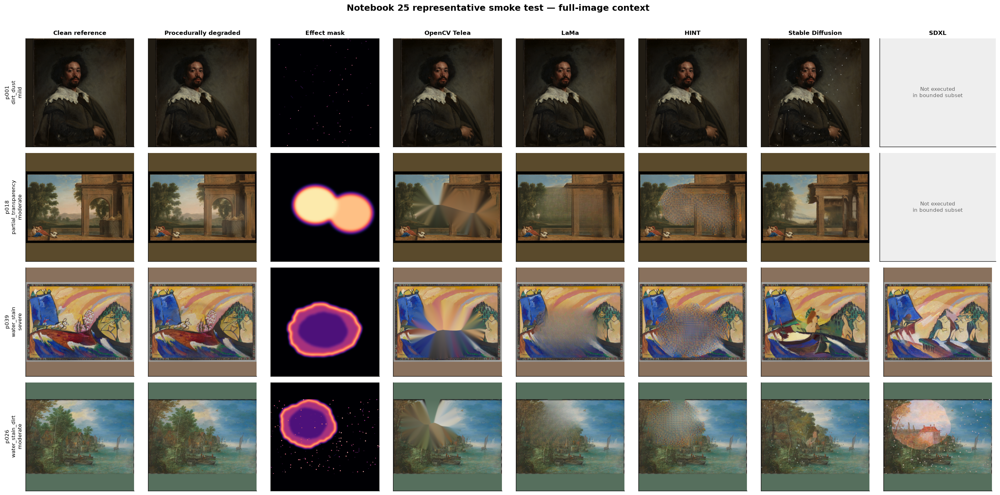

Full-image representative comparison rendered.
Rows: four fixed degradation cases; columns: reference, input, mask, and restorations.


In [12]:
MODEL_DISPLAY = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "hint_places2": "HINT",
    "stable_diffusion_inpainting": (
        "Stable Diffusion"
    ),
    "sdxl_inpainting": "SDXL",
}

FULL_VIEW_COLUMNS = [
    ("clean", "Clean reference"),
    ("degraded", "Procedurally degraded"),
    ("mask", "Effect mask"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    ("hint_places2", "HINT"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
    ("sdxl_inpainting", "SDXL"),
]

smoke_candidate_lookup = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in SMOKE_CANDIDATES.itertuples(
        index=False
    )
}

figure, axes = plt.subplots(
    nrows=len(SMOKE_CASES),
    ncols=len(FULL_VIEW_COLUMNS),
    figsize=(24, 12),
    squeeze=False,
)

for row_index, case in enumerate(
    SMOKE_CASES.itertuples(index=False)
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )
    degraded_rgb = load_rgb_array(
        case.input_image_path
    )
    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(FULL_VIEW_COLUMNS):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            axis.imshow(clean_rgb)
        elif view_id == "degraded":
            axis.imshow(degraded_rgb)
        elif view_id == "mask":
            axis.imshow(
                mask_array,
                cmap="magma",
                vmin=0,
                vmax=255,
            )
        else:
            candidate = (
                smoke_candidate_lookup.get(
                    (
                        str(case.case_id),
                        view_id,
                    )
                )
            )

            if candidate is None:
                axis.set_facecolor("#eeeeee")
                axis.text(
                    0.5,
                    0.5,
                    "Not executed\nin bounded subset",
                    ha="center",
                    va="center",
                    fontsize=9,
                    color="#666666",
                    transform=axis.transAxes,
                )
            else:
                axis.imshow(
                    load_rgb_array(
                        candidate.restored_path
                    )
                )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    f"{case.painting_id}\n"
                    f"{case.degradation_family}\n"
                    f"{case.severity}"
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

figure.suptitle(
    (
        "Notebook 25 representative smoke test — "
        "full-image context"
    ),
    fontsize=15,
    fontweight="bold",
)

figure.tight_layout(
    rect=(0, 0, 1, 0.97)
)
plt.show()
plt.close(figure)

print("Full-image representative comparison rendered.")
print(
    "Rows: four fixed degradation cases; "
    "columns: reference, input, mask, and restorations."
)

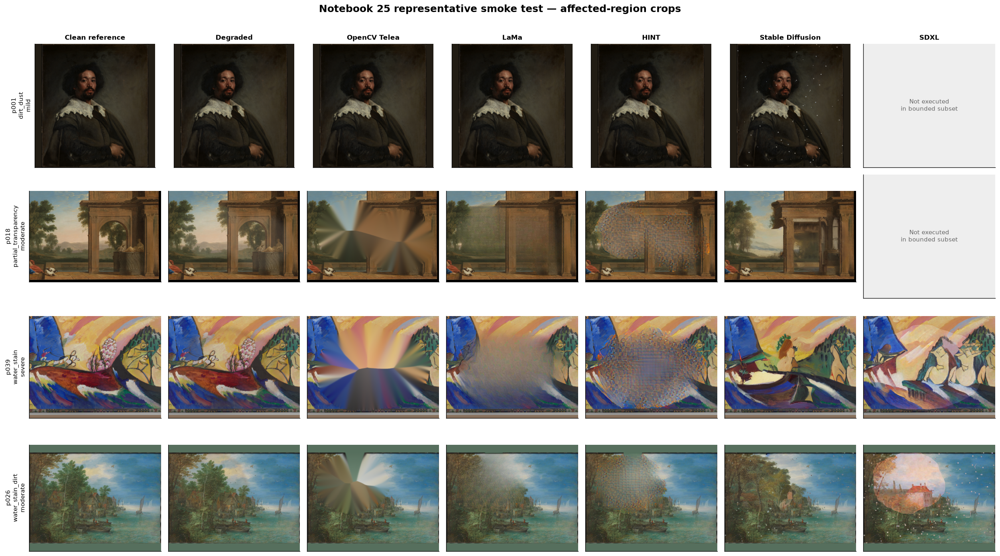

,case_id,x_min,y_min,x_max,y_max,crop_width,crop_height
0,synthetic_degradation__p001__dirt_dust__mild,10,0,758,768,748,768
1,synthetic_degradation__p018__partial_transparency__moderate,91,163,768,630,677,467
2,synthetic_degradation__p039__water_stain__severe,66,194,695,681,629,487
3,synthetic_degradation__p026__water_stain_dirt__moderate,0,73,768,694,768,621


Affected-region comparison rendered.
The crop boundary is derived only from the upstream effect-mask support.


In [13]:
def mask_bounding_box(
    mask: np.ndarray,
    *,
    margin_fraction: float = 0.06,
) -> tuple[int, int, int, int]:
    """Return a padded bounding box around active mask support."""
    active_y, active_x = np.nonzero(
        mask > 0
    )

    height, width = mask.shape

    if len(active_x) == 0:
        return 0, 0, width, height

    x_min = int(active_x.min())
    x_max = int(active_x.max()) + 1
    y_min = int(active_y.min())
    y_max = int(active_y.max()) + 1

    margin = max(
        8,
        int(
            max(
                x_max - x_min,
                y_max - y_min,
            )
            * margin_fraction
        ),
    )

    return (
        max(0, x_min - margin),
        max(0, y_min - margin),
        min(width, x_max + margin),
        min(height, y_max + margin),
    )


CROP_VIEW_COLUMNS = [
    ("clean", "Clean reference"),
    ("degraded", "Degraded"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    ("hint_places2", "HINT"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
    ("sdxl_inpainting", "SDXL"),
]

figure, axes = plt.subplots(
    nrows=len(SMOKE_CASES),
    ncols=len(CROP_VIEW_COLUMNS),
    figsize=(21, 12),
    squeeze=False,
)

crop_extent_records = []

for row_index, case in enumerate(
    SMOKE_CASES.itertuples(index=False)
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )
    degraded_rgb = load_rgb_array(
        case.input_image_path
    )
    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    x_min, y_min, x_max, y_max = (
        mask_bounding_box(mask_array)
    )

    crop_extent_records.append(
        {
            "case_id": case.case_id,
            "x_min": x_min,
            "y_min": y_min,
            "x_max": x_max,
            "y_max": y_max,
            "crop_width": x_max - x_min,
            "crop_height": y_max - y_min,
        }
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(CROP_VIEW_COLUMNS):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            image_array = clean_rgb
        elif view_id == "degraded":
            image_array = degraded_rgb
        else:
            candidate = (
                smoke_candidate_lookup.get(
                    (
                        str(case.case_id),
                        view_id,
                    )
                )
            )

            if candidate is None:
                image_array = None
            else:
                image_array = load_rgb_array(
                    candidate.restored_path
                )

        if image_array is None:
            axis.set_facecolor("#eeeeee")
            axis.text(
                0.5,
                0.5,
                "Not executed\nin bounded subset",
                ha="center",
                va="center",
                fontsize=9,
                color="#666666",
                transform=axis.transAxes,
            )
        else:
            axis.imshow(
                image_array[
                    y_min:y_max,
                    x_min:x_max,
                ]
            )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    f"{case.painting_id}\n"
                    f"{case.degradation_family}\n"
                    f"{case.severity}"
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

SMOKE_CROP_EXTENTS = pd.DataFrame(
    crop_extent_records
)

figure.suptitle(
    (
        "Notebook 25 representative smoke test — "
        "affected-region crops"
    ),
    fontsize=15,
    fontweight="bold",
)

figure.tight_layout(
    rect=(0, 0, 1, 0.97)
)
plt.show()
plt.close(figure)

display(SMOKE_CROP_EXTENTS)

print("Affected-region comparison rendered.")
print(
    "The crop boundary is derived only from "
    "the upstream effect-mask support."
)

In [14]:
BATCH_3_STAGE = (
    "batch_3_representative_smoke_test"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_3_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_3_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
    severity: str = "blocking",
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_3_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


smoke_families = sorted(
    SMOKE_CASES[
        "degradation_family"
    ].astype(str).unique()
)

smoke_severities = sorted(
    SMOKE_CASES[
        "severity"
    ].astype(str).unique()
)

add_batch_3_check(
    check_id="representative_case_ids",
    description=(
        "All four fixed representative cases "
        "were found exactly once."
    ),
    expected=SMOKE_CASE_IDS,
    observed=SMOKE_CASES[
        "case_id"
    ].astype(str).tolist(),
    passed=(
        SMOKE_CASES[
            "case_id"
        ].astype(str).tolist()
        == SMOKE_CASE_IDS
    ),
)

add_batch_3_check(
    check_id="representative_design_coverage",
    description=(
        "The smoke test covers all eligible families, "
        "all severity settings, and the combined case."
    ),
    expected={
        "families": sorted(
            POPULATION[
                "eligible_degradation_order"
            ]
        ),
        "severities": [
            "mild",
            "moderate",
            "severe",
        ],
        "combined_cases": 1,
    },
    observed={
        "families": smoke_families,
        "severities": smoke_severities,
        "combined_cases": int(
            as_boolean(
                SMOKE_CASES[
                    "is_combined"
                ]
            ).sum()
        ),
    },
    passed=(
        set(smoke_families)
        == set(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
        and set(smoke_severities)
        == {
            "mild",
            "moderate",
            "severe",
        }
        and int(
            as_boolean(
                SMOKE_CASES[
                    "is_combined"
                ]
            ).sum()
        )
        == 1
    ),
)

smoke_primary_count = int(
    SMOKE_CANDIDATES[
        "coverage_role"
    ]
    .astype(str)
    .eq("core_four_model")
    .sum()
)

smoke_sdxl_count = int(
    SMOKE_CANDIDATES[
        "model_id"
    ]
    .astype(str)
    .eq("sdxl_inpainting")
    .sum()
)

add_batch_3_check(
    check_id="representative_candidate_coverage",
    description=(
        "The representative subset contains all "
        "primary candidates and two bounded SDXL "
        "candidates."
    ),
    expected={
        "cases": 4,
        "candidates": 18,
        "primary_candidates": 16,
        "sdxl_candidates": 2,
        "primary_models": 4,
    },
    observed={
        "cases": int(
            SMOKE_CANDIDATES[
                "case_id"
            ].nunique()
        ),
        "candidates": len(
            SMOKE_CANDIDATES
        ),
        "primary_candidates": (
            smoke_primary_count
        ),
        "sdxl_candidates": smoke_sdxl_count,
        "primary_models": int(
            SMOKE_CANDIDATES.loc[
                SMOKE_CANDIDATES[
                    "coverage_role"
                ]
                .astype(str)
                .eq("core_four_model"),
                "model_id",
            ].nunique()
        ),
    },
    passed=(
        SMOKE_CANDIDATES[
            "case_id"
        ].nunique()
        == 4
        and len(SMOKE_CANDIDATES) == 18
        and smoke_primary_count == 16
        and smoke_sdxl_count == 2
        and SMOKE_CANDIDATES.loc[
            SMOKE_CANDIDATES[
                "coverage_role"
            ]
            .astype(str)
            .eq("core_four_model"),
            "model_id",
        ].nunique()
        == 4
    ),
)

add_batch_3_check(
    check_id="pixel_audit_population",
    description=(
        "The pixel-integrity audit covers every "
        "selected candidate exactly once."
    ),
    expected={
        "rows": EXPECTED[
            "selected_candidates"
        ],
        "unique_candidates": EXPECTED[
            "selected_candidates"
        ],
    },
    observed={
        "rows": len(
            PIXEL_INTEGRITY_AUDIT
        ),
        "unique_candidates": int(
            PIXEL_INTEGRITY_AUDIT[
                "candidate_id"
            ].nunique()
        ),
    },
    passed=(
        len(PIXEL_INTEGRITY_AUDIT)
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
        and PIXEL_INTEGRITY_AUDIT[
            "candidate_id"
        ].nunique()
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
    ),
)

geometry_failures = int(
    (
        ~PIXEL_INTEGRITY_AUDIT[
            "geometry_valid"
        ]
    ).sum()
)

empty_masks = int(
    PIXEL_INTEGRITY_AUDIT[
        "active_mask_pixels"
    ]
    .le(0)
    .sum()
)

add_batch_3_check(
    check_id="image_geometry_and_mask_support",
    description=(
        "Every candidate matches its input geometry "
        "and has non-empty effect-mask support."
    ),
    expected={
        "geometry_failures": 0,
        "empty_masks": 0,
    },
    observed={
        "geometry_failures": (
            geometry_failures
        ),
        "empty_masks": empty_masks,
    },
    passed=(
        geometry_failures == 0
        and empty_masks == 0
    ),
)

outside_changed_pixels = int(
    PIXEL_INTEGRITY_AUDIT[
        "outside_changed_pixels"
    ].sum()
)

maximum_outside_difference = int(
    PIXEL_INTEGRITY_AUDIT[
        "outside_max_abs_difference"
    ].max()
)

add_batch_3_check(
    check_id="exact_compositing_containment",
    description=(
        "Every selected restoration preserves the "
        "degraded input outside effect-mask support."
    ),
    expected={
        "outside_changed_pixels": 0,
        "maximum_absolute_difference": 0,
    },
    observed={
        "outside_changed_pixels": (
            outside_changed_pixels
        ),
        "maximum_absolute_difference": (
            maximum_outside_difference
        ),
    },
    passed=(
        outside_changed_pixels == 0
        and maximum_outside_difference == 0
    ),
)

unchanged_inside_candidates = int(
    PIXEL_INTEGRITY_AUDIT[
        "inside_changed_pixels"
    ]
    .le(0)
    .sum()
)

add_batch_3_check(
    check_id="inside_mask_restoration_activity",
    description=(
        "Every selected candidate changes at least "
        "one pixel inside effect-mask support."
    ),
    expected=0,
    observed=unchanged_inside_candidates,
    passed=(
        unchanged_inside_candidates == 0
    ),
)

valid_crop_extents = (
    SMOKE_CROP_EXTENTS[
        "crop_width"
    ].gt(0)
    & SMOKE_CROP_EXTENTS[
        "crop_height"
    ].gt(0)
)

add_batch_3_check(
    check_id="representative_crop_extents",
    description=(
        "Every representative effect mask produces "
        "a valid non-empty inspection crop."
    ),
    expected={
        "valid_crops": 4,
        "invalid_crops": 0,
    },
    observed={
        "valid_crops": int(
            valid_crop_extents.sum()
        ),
        "invalid_crops": int(
            (~valid_crop_extents).sum()
        ),
    },
    passed=bool(
        valid_crop_extents.all()
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_3_check(
    check_id="canonical_outputs_not_written",
    description=(
        "The smoke test rendered notebook diagnostics "
        "without writing canonical artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_3_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_3_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_3_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 3 passed.")
print(
    "Batch 3 checks: "
    f"{len(BATCH_3_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_3_CHECKS['passed']).sum())}"
)
print("Rendered diagnostic figures: 2")
print(
    "Canonical files written: "
    f"{existing_canonical_output_count}"
)
print(
    "Next batch: quality, spillover, "
    "and runtime evidence normalization."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_representative_smoke_test,representative_case_ids,All four fixed representative cases were found exactly once.,blocking,"[""synthetic_degradation__p001__dirt_dust__mild"", ""synthetic_degradation__p018__partial_transparency__moderate"", ""synthetic_degradation__p039__wate...","[""synthetic_degradation__p001__dirt_dust__mild"", ""synthetic_degradation__p018__partial_transparency__moderate"", ""synthetic_degradation__p039__wate...",True,
1,batch_3_representative_smoke_test,representative_design_coverage,"The smoke test covers all eligible families, all severity settings, and the combined case.",blocking,"{""combined_cases"": 1, ""families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""severities"": [""mild"", ""moderate"", ""se...","{""combined_cases"": 1, ""families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""severities"": [""mild"", ""moderate"", ""se...",True,
2,batch_3_representative_smoke_test,representative_candidate_coverage,The representative subset contains all primary candidates and two bounded SDXL candidates.,blocking,"{""candidates"": 18, ""cases"": 4, ""primary_candidates"": 16, ""primary_models"": 4, ""sdxl_candidates"": 2}","{""candidates"": 18, ""cases"": 4, ""primary_candidates"": 16, ""primary_models"": 4, ""sdxl_candidates"": 2}",True,
3,batch_3_representative_smoke_test,pixel_audit_population,The pixel-integrity audit covers every selected candidate exactly once.,blocking,"{""rows"": 1411, ""unique_candidates"": 1411}","{""rows"": 1411, ""unique_candidates"": 1411}",True,
4,batch_3_representative_smoke_test,image_geometry_and_mask_support,Every candidate matches its input geometry and has non-empty effect-mask support.,blocking,"{""empty_masks"": 0, ""geometry_failures"": 0}","{""empty_masks"": 0, ""geometry_failures"": 0}",True,
5,batch_3_representative_smoke_test,exact_compositing_containment,Every selected restoration preserves the degraded input outside effect-mask support.,blocking,"{""maximum_absolute_difference"": 0, ""outside_changed_pixels"": 0}","{""maximum_absolute_difference"": 0, ""outside_changed_pixels"": 0}",True,
6,batch_3_representative_smoke_test,inside_mask_restoration_activity,Every selected candidate changes at least one pixel inside effect-mask support.,blocking,0,0,True,
7,batch_3_representative_smoke_test,representative_crop_extents,Every representative effect mask produces a valid non-empty inspection crop.,blocking,"{""invalid_crops"": 0, ""valid_crops"": 4}","{""invalid_crops"": 0, ""valid_crops"": 4}",True,
8,batch_3_representative_smoke_test,canonical_outputs_not_written,The smoke test rendered notebook diagnostics without writing canonical artifacts.,blocking,0,0,True,


Batch 3 passed.
Batch 3 checks: 9
Blocking failures: 0
Rendered diagnostic figures: 2
Canonical files written: 0
Next batch: quality, spillover, and runtime evidence normalization.


## Batch 4 — Quality, spillover, and runtime evidence normalization

Load the frozen quantitative evidence from Notebooks 13–17 and 20 and normalize it against the exact 1,411-candidate population selected before metric inspection.

Large upstream metric tables are read in chunks. Only rows belonging to the fixed selected population are retained, reducing memory use without changing scientific coverage.

The normalized evidence includes:

- classical pixel and structural metrics;
- LPIPS perceptual distance;
- CLIP and DINOv2 feature similarity;
- spatial error and improvement diagnostics;
- local texture, colour, and seam consistency;
- semantic and structural preservation;
- outside-mask spillover;
- recorded candidate runtime.

Eleven prespecified quality anchors are extracted for later comparisons. Runtime and spillover remain separate from quality ranking. No combined quality or trust score is constructed.

In [15]:
SELECTED_CANDIDATE_IDS = set(
    SELECTED_CANDIDATES[
        "candidate_id"
    ].astype(str)
)


def load_selected_metric_rows(
    path: Path,
    *,
    candidate_ids: set[str],
    chunksize: int = 150_000,
) -> tuple[pd.DataFrame, int]:
    """Load only rows belonging to the fixed candidate population."""
    selected_parts = []
    total_rows = 0

    for chunk_number, chunk in enumerate(
        pd.read_csv(
            path,
            low_memory=False,
            chunksize=chunksize,
        ),
        start=1,
    ):
        total_rows += len(chunk)

        if "candidate_id" not in chunk.columns:
            raise ValueError(
                f"{path} does not contain candidate_id."
            )

        selected = chunk.loc[
            chunk["candidate_id"]
            .astype(str)
            .isin(candidate_ids)
        ].copy()

        if not selected.empty:
            selected_parts.append(selected)

        if chunk_number % 5 == 0:
            print(
                f"{path.name}: "
                f"{total_rows:,} source rows scanned"
            )

    if not selected_parts:
        raise ValueError(
            f"No selected candidate rows found in {path}."
        )

    result = pd.concat(
        selected_parts,
        ignore_index=True,
        sort=False,
    )

    return result, total_rows


QUALITY_SOURCE_PATHS = {
    "classical": INPUT_PATHS[
        "classical_metrics_path"
    ],
    "perceptual": INPUT_PATHS[
        "lpips_metrics_path"
    ],
    "feature": INPUT_PATHS[
        "feature_metrics_path"
    ],
    "spatial": INPUT_PATHS[
        "spatial_metrics_path"
    ],
    "local_consistency": INPUT_PATHS[
        "local_metrics_path"
    ],
    "semantic_structural": INPUT_PATHS[
        "semantic_metrics_path"
    ],
}

SELECTED_SOURCE_TABLES = {}
SOURCE_TOTAL_ROWS = {}

for source_key, source_path in (
    QUALITY_SOURCE_PATHS.items()
):
    print(
        "Loading selected rows from "
        f"{source_key}..."
    )

    (
        selected_source,
        total_source_rows,
    ) = load_selected_metric_rows(
        source_path,
        candidate_ids=(
            SELECTED_CANDIDATE_IDS
        ),
    )

    SELECTED_SOURCE_TABLES[
        source_key
    ] = selected_source

    SOURCE_TOTAL_ROWS[
        source_key
    ] = total_source_rows

    print(
        f"{source_key}: retained "
        f"{len(selected_source):,} of "
        f"{total_source_rows:,} rows"
    )

CLASSICAL_METRICS = (
    SELECTED_SOURCE_TABLES["classical"]
)
LPIPS_METRICS = (
    SELECTED_SOURCE_TABLES["perceptual"]
)
FEATURE_METRICS = (
    SELECTED_SOURCE_TABLES["feature"]
)
SPATIAL_METRICS = (
    SELECTED_SOURCE_TABLES["spatial"]
)
LOCAL_METRICS = (
    SELECTED_SOURCE_TABLES[
        "local_consistency"
    ]
)
SEMANTIC_METRICS = (
    SELECTED_SOURCE_TABLES[
        "semantic_structural"
    ]
)

QUALITY_SOURCE_TABLES = {
    source_key: frame
    for source_key, frame
    in SELECTED_SOURCE_TABLES.items()
}

SPATIAL_MAP_MANIFEST = pd.read_csv(
    INPUT_PATHS["spatial_maps_path"],
    low_memory=False,
)

LOCAL_MAP_MANIFEST = pd.read_csv(
    INPUT_PATHS["local_maps_path"],
    low_memory=False,
)

SOURCE_ROW_EXPECTATIONS = {
    "classical": int(
        EXPECTED[
            "selected_classical_source_rows"
        ]
    ),
    "perceptual": int(
        EXPECTED[
            "selected_lpips_source_rows"
        ]
    ),
    "feature": int(
        EXPECTED[
            "selected_feature_source_rows"
        ]
    ),
    "spatial": int(
        EXPECTED[
            "selected_spatial_source_rows"
        ]
    ),
    "local_consistency": int(
        EXPECTED[
            "selected_local_source_rows"
        ]
    ),
    "semantic_structural": int(
        EXPECTED[
            "selected_semantic_source_rows"
        ]
    ),
}

metric_source_summary = pd.DataFrame(
    [
        {
            "source_key": source_key,
            "all_source_rows": (
                SOURCE_TOTAL_ROWS[
                    source_key
                ]
            ),
            "selected_rows": len(
                SELECTED_SOURCE_TABLES[
                    source_key
                ]
            ),
            "expected_selected_rows": (
                SOURCE_ROW_EXPECTATIONS[
                    source_key
                ]
            ),
            "selected_candidates": (
                SELECTED_SOURCE_TABLES[
                    source_key
                ]["candidate_id"].nunique()
            ),
            "status_values": ", ".join(
                sorted(
                    SELECTED_SOURCE_TABLES[
                        source_key
                    ]["status"]
                    .astype(str)
                    .unique()
                )
            ),
        }
        for source_key
        in QUALITY_SOURCE_PATHS
    ]
)

display(metric_source_summary)

print("Frozen quality-evidence tables loaded.")
print(
    "Selected raw metric rows: "
    f"{sum(len(frame) for frame in SELECTED_SOURCE_TABLES.values()):,}"
)
print(
    "Expected raw metric rows: "
    f"{EXPECTED['selected_metric_source_rows']:,}"
)
print(
    "Selected candidate IDs: "
    f"{len(SELECTED_CANDIDATE_IDS):,}"
)

Loading selected rows from classical...
classical: retained 46,563 of 477,753 rows
Loading selected rows from perceptual...
perceptual: retained 2,822 of 31,608 rows
Loading selected rows from feature...
feature: retained 5,644 of 63,216 rows
Loading selected rows from spatial...
spatial: retained 14,110 of 143,247 rows
Loading selected rows from local_consistency...
local_consistency.csv: 750,000 source rows scanned
local_consistency.csv: 1,500,000 source rows scanned
local_consistency: retained 203,184 of 2,060,667 rows
Loading selected rows from semantic_structural...
semantic_structural: retained 39,508 of 447,312 rows


,source_key,all_source_rows,selected_rows,expected_selected_rows,selected_candidates,status_values
0,classical,477753,46563,46563,1411,ok
1,perceptual,31608,2822,2822,1411,ok
2,feature,63216,5644,5644,1411,ok
3,spatial,143247,14110,14110,1411,ok
4,local_consistency,2060667,203184,203184,1411,"not_applicable, ok"
5,semantic_structural,447312,39508,39508,1411,ok


Frozen quality-evidence tables loaded.
Selected raw metric rows: 311,831
Expected raw metric rows: 311,831
Selected candidate IDs: 1,411


In [16]:
selected_spatial_candidate_maps = (
    SPATIAL_MAP_MANIFEST.loc[
        SPATIAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

selected_spatial_panels = (
    SPATIAL_MAP_MANIFEST.loc[
        SPATIAL_MAP_MANIFEST[
            "map_type"
        ]
        .astype(str)
        .eq("candidate_spatial_panel")
        & SPATIAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

SELECTED_SPATIAL_MAPS = (
    pd.concat(
        [
            selected_spatial_candidate_maps,
            selected_spatial_panels,
        ],
        ignore_index=True,
        sort=False,
    )
    .drop_duplicates("map_image_id")
    .reset_index(drop=True)
)

selected_local_candidate_maps = (
    LOCAL_MAP_MANIFEST.loc[
        LOCAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

selected_local_panels = (
    LOCAL_MAP_MANIFEST.loc[
        LOCAL_MAP_MANIFEST[
            "map_type"
        ]
        .astype(str)
        .eq(
            "local_consistency_candidate_panel"
        )
        & LOCAL_MAP_MANIFEST[
            "candidate_id"
        ]
        .astype(str)
        .isin(SELECTED_CANDIDATE_IDS)
    ]
    .copy()
)

SELECTED_LOCAL_MAPS = (
    pd.concat(
        [
            selected_local_candidate_maps,
            selected_local_panels,
        ],
        ignore_index=True,
        sort=False,
    )
    .drop_duplicates("map_image_id")
    .reset_index(drop=True)
)

SPATIAL_MAP_PATH_AUDIT = (
    inspect_repository_paths(
        SELECTED_SPATIAL_MAPS,
        source_name=(
            "selected Notebook 16 maps"
        ),
        columns=["relative_path"],
    )
)

LOCAL_MAP_PATH_AUDIT = (
    inspect_repository_paths(
        SELECTED_LOCAL_MAPS,
        source_name=(
            "selected Notebook 17 maps"
        ),
        columns=["relative_path"],
    )
)

MAP_PATH_AUDIT = pd.concat(
    [
        SPATIAL_MAP_PATH_AUDIT,
        LOCAL_MAP_PATH_AUDIT,
    ],
    ignore_index=True,
)

map_record_summary = pd.DataFrame(
    [
        {
            "map_source": (
                "Notebook 16 spatial"
            ),
            "selected_records": len(
                SELECTED_SPATIAL_MAPS
            ),
            "expected_records": int(
                EXPECTED[
                    "spatial_map_records"
                ]
            ),
            "candidate_records": len(
                selected_spatial_candidate_maps
            ),
            "selected_panels": len(
                selected_spatial_panels
            ),
        },
        {
            "map_source": (
                "Notebook 17 local consistency"
            ),
            "selected_records": len(
                SELECTED_LOCAL_MAPS
            ),
            "expected_records": int(
                EXPECTED[
                    "local_map_records"
                ]
            ),
            "candidate_records": len(
                selected_local_candidate_maps
            ),
            "selected_panels": len(
                selected_local_panels
            ),
        },
    ]
)

display(map_record_summary)
display(MAP_PATH_AUDIT)

print("Diagnostic map records selected.")
print(
    "Notebook 16 selected map records: "
    f"{len(SELECTED_SPATIAL_MAPS):,}"
)
print(
    "Notebook 17 selected map records: "
    f"{len(SELECTED_LOCAL_MAPS):,}"
)
print(
    "All selected map files exist: "
    f"{bool(MAP_PATH_AUDIT['all_valid'].all())}"
)

,map_source,selected_records,expected_records,candidate_records,selected_panels
0,Notebook 16 spatial,7060,7060,7060,5
1,Notebook 17 local consistency,4233,4233,4233,0


,source,path_column,path_count,repository_relative_count,inside_project_root_count,existing_file_count,all_valid
0,selected Notebook 16 maps,relative_path,7060,7060,7060,7060,True
1,selected Notebook 17 maps,relative_path,4233,4233,4233,4233,True


Diagnostic map records selected.
Notebook 16 selected map records: 7,060
Notebook 17 selected map records: 4,233
All selected map files exist: True


In [17]:
print("Normalizing frozen quality evidence...")

NORMALIZED_QUALITY = (
    normalise_quality_evidence(
        QUALITY_SOURCE_TABLES,
        SELECTED_CANDIDATES,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Normalized quality rows: "
    f"{len(NORMALIZED_QUALITY):,}"
)

QUALITY_ANCHORS = (
    select_quality_anchor_values(
        NORMALIZED_QUALITY,
        spatial_source=SPATIAL_METRICS,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Selected quality-anchor rows: "
    f"{len(QUALITY_ANCHORS):,}"
)

SPILLOVER_EVIDENCE = (
    select_spillover_evidence(
        NORMALIZED_QUALITY,
        config=ANALYSIS_CONFIG,
    )
)

print(
    "Selected spillover rows: "
    f"{len(SPILLOVER_EVIDENCE):,}"
)

RUNTIME_EVIDENCE = build_runtime_evidence(
    SELECTED_CANDIDATES,
    config=ANALYSIS_CONFIG,
)

print(
    "Selected runtime rows: "
    f"{len(RUNTIME_EVIDENCE):,}"
)

normalized_source_summary = (
    NORMALIZED_QUALITY.groupby(
        "source_notebook_id",
        dropna=False,
    )
    .agg(
        normalized_rows=(
            "source_metric_row_id",
            "size",
        ),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        evidence_families=(
            "evidence_family",
            "nunique",
        ),
        metric_names=(
            "metric_name",
            "nunique",
        ),
        anchor_rows=(
            "anchor_id",
            lambda values: int(
                values.fillna("")
                .astype(str)
                .ne("")
                .sum()
            ),
        ),
    )
    .reset_index()
)

anchor_coverage_summary = (
    QUALITY_ANCHORS.groupby(
        [
            "anchor_id",
            "comparison_direction",
        ],
        dropna=False,
    )
    .agg(
        rows=("candidate_id", "size"),
        candidates=(
            "candidate_id",
            "nunique",
        ),
        models=("model_id", "nunique"),
        finite_values=(
            "comparison_value",
            lambda values: int(
                np.isfinite(
                    pd.to_numeric(
                        values,
                        errors="coerce",
                    )
                ).sum()
            ),
        ),
    )
    .reset_index()
)

spillover_summary = (
    SPILLOVER_EVIDENCE.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        maximum_changed_fraction=(
            "comparison_value",
            "max",
        ),
        mean_changed_fraction=(
            "comparison_value",
            "mean",
        ),
    )
    .reset_index()
)

runtime_summary_preview = (
    RUNTIME_EVIDENCE.groupby(
        "model_id",
        dropna=False,
    )
    .agg(
        candidates=(
            "candidate_id",
            "nunique",
        ),
        median_runtime_seconds=(
            "comparison_value",
            "median",
        ),
        minimum_runtime_seconds=(
            "comparison_value",
            "min",
        ),
        maximum_runtime_seconds=(
            "comparison_value",
            "max",
        ),
    )
    .reset_index()
)

display(normalized_source_summary)
display(anchor_coverage_summary)
display(spillover_summary)
display(runtime_summary_preview)

print("Quality, spillover, and runtime evidence normalized.")
print(
    "Quality anchors per candidate: "
    f"{QUALITY_ANCHORS.groupby('candidate_id').size().min()}"
)
print(
    "Maximum normalized spillover: "
    f"{pd.to_numeric(SPILLOVER_EVIDENCE['comparison_value'], errors='coerce').max():.6f}"
)
print(
    "Runtime remains quality-ranking eligible: "
    f"{bool(RUNTIME_EVIDENCE['quality_ranking_eligible'].any())}"
)

Normalizing frozen quality evidence...
Normalized quality rows: 495,261
Selected quality-anchor rows: 15,521
Selected spillover rows: 1,411
Selected runtime rows: 1,411


,source_notebook_id,normalized_rows,candidates,evidence_families,metric_names,anchor_rows
0,13,46563,1411,2,4,2822
1,14,2822,1411,1,1,1411
2,15,5644,1411,1,2,2822
3,16,197540,1411,1,14,1411
4,17,203184,1411,4,34,4233
5,20,39508,1411,7,10,2822


,anchor_id,comparison_direction,rows,candidates,models,finite_values
0,classical_masked_mae,lower_is_better,1411,1411,5,1411
1,colour_masked_delta_e,lower_is_better,1411,1411,5,1411
2,feature_clip_crop,higher_is_better,1411,1411,5,1411
3,feature_dino_crop,higher_is_better,1411,1411,5,1411
4,perceptual_crop_lpips,lower_is_better,1411,1411,5,1411
5,seam_boundary_gradient,lower_is_better,1411,1411,5,1411
6,semantic_local_dino,higher_is_better,1411,1411,5,1411
7,spatial_masked_error,lower_is_better,1411,1411,5,1411
8,structural_affinity_correlation,higher_is_better,1411,1411,5,1411
9,structural_crop_ssim,higher_is_better,1411,1411,5,1411


,model_id,candidates,maximum_changed_fraction,mean_changed_fraction
0,hint_places2,350,0.0,0.0
1,lama,350,0.0,0.0
2,opencv_telea,350,0.0,0.0
3,sdxl_inpainting,11,0.0,0.0
4,stable_diffusion_inpainting,350,0.0,0.0


,model_id,candidates,median_runtime_seconds,minimum_runtime_seconds,maximum_runtime_seconds
0,hint_places2,350,6.667000,6.243000,7.553000
1,lama,350,1.559895,1.559895,1.559895
2,opencv_telea,350,0.733729,0.269577,1.348074
3,sdxl_inpainting,11,198.125000,187.942000,206.852000
4,stable_diffusion_inpainting,350,9.107830,7.791253,9.801220


Quality, spillover, and runtime evidence normalized.
Quality anchors per candidate: 11
Maximum normalized spillover: 0.000000
Runtime remains quality-ranking eligible: False


In [19]:
import gc


BATCH_4_STAGE = (
    "batch_4_evidence_normalization"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_4_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_4_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_4_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


selected_source_counts = {
    source_key: len(frame)
    for source_key, frame
    in SELECTED_SOURCE_TABLES.items()
}

add_batch_4_check(
    check_id="selected_source_row_counts",
    description=(
        "Each frozen metric source contributes the "
        "exact contracted number of selected rows."
    ),
    expected=SOURCE_ROW_EXPECTATIONS,
    observed=selected_source_counts,
    passed=(
        selected_source_counts
        == SOURCE_ROW_EXPECTATIONS
    ),
)

selected_raw_total = int(
    sum(selected_source_counts.values())
)

add_batch_4_check(
    check_id="selected_source_row_total",
    description=(
        "The six frozen sources contribute exactly "
        "311,831 selected raw metric rows."
    ),
    expected=int(
        EXPECTED[
            "selected_metric_source_rows"
        ]
    ),
    observed=selected_raw_total,
    passed=(
        selected_raw_total == 311831
        and selected_raw_total
        == int(
            EXPECTED[
                "selected_metric_source_rows"
            ]
        )
    ),
)

valid_source_statuses = {
    "ok",
    "passed",
    "not_applicable",
}

invalid_source_status_counts = {
    source_key: int(
        (
            ~frame["status"]
            .astype(str)
            .isin(valid_source_statuses)
        ).sum()
    )
    for source_key, frame
    in SELECTED_SOURCE_TABLES.items()
}

add_batch_4_check(
    check_id="selected_source_status",
    description=(
        "Every selected upstream metric row has an "
        "approved status, including explicit non-applicability"
    ),
    expected={
        source_key: 0
        for source_key
        in QUALITY_SOURCE_PATHS
    },
    observed=invalid_source_status_counts,
    passed=all(
        count == 0
        for count
        in invalid_source_status_counts.values()
    ),
)

map_counts_observed = {
    "spatial": len(
        SELECTED_SPATIAL_MAPS
    ),
    "local_consistency": len(
        SELECTED_LOCAL_MAPS
    ),
}

map_counts_expected = {
    "spatial": int(
        EXPECTED[
            "spatial_map_records"
        ]
    ),
    "local_consistency": int(
        EXPECTED[
            "local_map_records"
        ]
    ),
}

add_batch_4_check(
    check_id="diagnostic_map_record_counts",
    description=(
        "The selected diagnostic-map manifests retain "
        "their exact candidate and panel records."
    ),
    expected=map_counts_expected,
    observed=map_counts_observed,
    passed=(
        map_counts_observed
        == map_counts_expected
    ),
)

add_batch_4_check(
    check_id="diagnostic_map_files_exist",
    description=(
        "Every selected Notebook 16 and 17 diagnostic "
        "map file exists inside the repository."
    ),
    expected=True,
    observed=bool(
        MAP_PATH_AUDIT["all_valid"].all()
    ),
    passed=bool(
        MAP_PATH_AUDIT["all_valid"].all()
    ),
)

normalized_candidate_count = int(
    NORMALIZED_QUALITY[
        "candidate_id"
    ].nunique()
)

add_batch_4_check(
    check_id="normalized_quality_contract",
    description=(
        "Normalized quality evidence contains exactly "
        "495,261 rows covering all 1,411 candidates."
    ),
    expected={
        "rows": EXPECTED[
            "normalized_quality_rows"
        ],
        "candidates": EXPECTED[
            "selected_candidates"
        ],
    },
    observed={
        "rows": len(
            NORMALIZED_QUALITY
        ),
        "candidates": (
            normalized_candidate_count
        ),
    },
    passed=(
        len(NORMALIZED_QUALITY)
        == int(
            EXPECTED[
                "normalized_quality_rows"
            ]
        )
        and normalized_candidate_count
        == int(
            EXPECTED[
                "selected_candidates"
            ]
        )
    ),
)

allowed_directions = {
    "higher_is_better",
    "lower_is_better",
    "descriptive_only",
}

observed_directions = set(
    NORMALIZED_QUALITY[
        "comparison_direction"
    ]
    .dropna()
    .astype(str)
)

add_batch_4_check(
    check_id="comparison_direction_contract",
    description=(
        "Every normalized metric uses an approved "
        "direction or descriptive-only status."
    ),
    expected=sorted(
        allowed_directions
    ),
    observed=sorted(
        observed_directions
    ),
    passed=(
        observed_directions.issubset(
            allowed_directions
        )
        and bool(observed_directions)
    ),
)

anchor_rows_per_candidate = (
    QUALITY_ANCHORS.groupby(
        "candidate_id"
    ).size()
)

anchor_pair_duplicates = int(
    QUALITY_ANCHORS[
        ["candidate_id", "anchor_id"]
    ]
    .duplicated()
    .sum()
)

expected_anchor_rows = int(
    EXPECTED[
        "candidate_quality_anchor_rows"
    ]
)

add_batch_4_check(
    check_id="quality_anchor_contract",
    description=(
        "Every selected candidate has exactly one row "
        "for each of the eleven approved anchors."
    ),
    expected={
        "rows": expected_anchor_rows,
        "anchors": EXPECTED[
            "quality_anchors"
        ],
        "rows_per_candidate": EXPECTED[
            "quality_anchors"
        ],
        "duplicate_pairs": 0,
    },
    observed={
        "rows": len(
            QUALITY_ANCHORS
        ),
        "anchors": int(
            QUALITY_ANCHORS[
                "anchor_id"
            ].nunique()
        ),
        "minimum_rows_per_candidate": int(
            anchor_rows_per_candidate.min()
        ),
        "maximum_rows_per_candidate": int(
            anchor_rows_per_candidate.max()
        ),
        "duplicate_pairs": (
            anchor_pair_duplicates
        ),
    },
    passed=(
        len(QUALITY_ANCHORS)
        == expected_anchor_rows
        and QUALITY_ANCHORS[
            "anchor_id"
        ].nunique()
        == int(EXPECTED["quality_anchors"])
        and anchor_rows_per_candidate
        .eq(
            int(EXPECTED["quality_anchors"])
        )
        .all()
        and anchor_pair_duplicates == 0
    ),
)

finite_anchor_comparison = np.isfinite(
    pd.to_numeric(
        QUALITY_ANCHORS[
            "comparison_value"
        ],
        errors="coerce",
    )
)

finite_anchor_utility = np.isfinite(
    pd.to_numeric(
        QUALITY_ANCHORS[
            "directional_utility"
        ],
        errors="coerce",
    )
)

add_batch_4_check(
    check_id="quality_anchor_values_finite",
    description=(
        "Every approved anchor has finite comparison "
        "and directional-improvement evidence."
    ),
    expected={
        "finite_comparison_values": (
            expected_anchor_rows
        ),
        "finite_directional_utilities": (
            expected_anchor_rows
        ),
    },
    observed={
        "finite_comparison_values": int(
            finite_anchor_comparison.sum()
        ),
        "finite_directional_utilities": int(
            finite_anchor_utility.sum()
        ),
    },
    passed=(
        finite_anchor_comparison.all()
        and finite_anchor_utility.all()
    ),
)

spillover_values = pd.to_numeric(
    SPILLOVER_EVIDENCE[
        "comparison_value"
    ],
    errors="coerce",
)

expected_candidate_rows = int(
    EXPECTED["selected_candidates"]
)

add_batch_4_check(
    check_id="spillover_contract",
    description=(
        "Spillover is one finite containment value per "
        "candidate and remains outside quality ranking."
    ),
    expected={
        "rows": expected_candidate_rows,
        "maximum_value": 0.0,
        "quality_ranking_rows": 0,
    },
    observed={
        "rows": len(
            SPILLOVER_EVIDENCE
        ),
        "maximum_value": float(
            spillover_values.max()
        ),
        "quality_ranking_rows": int(
            SPILLOVER_EVIDENCE[
                "quality_ranking_eligible"
            ].sum()
        ),
    },
    passed=(
        len(SPILLOVER_EVIDENCE)
        == int(
            EXPECTED[
                "candidate_spillover_rows"
            ]
        )
        and spillover_values.notna().all()
        and np.isclose(
            spillover_values.to_numpy(
                dtype=float
            ),
            0.0,
            atol=0.0,
        ).all()
        and not SPILLOVER_EVIDENCE[
            "quality_ranking_eligible"
        ].any()
    ),
)

runtime_values = pd.to_numeric(
    RUNTIME_EVIDENCE[
        "comparison_value"
    ],
    errors="coerce",
)

add_batch_4_check(
    check_id="runtime_contract",
    description=(
        "Runtime is finite and positive for every "
        "candidate but excluded from quality ranking."
    ),
    expected={
        "rows": expected_candidate_rows,
        "finite_positive_values": (
            expected_candidate_rows
        ),
        "quality_ranking_rows": 0,
    },
    observed={
        "rows": len(
            RUNTIME_EVIDENCE
        ),
        "finite_positive_values": int(
            (
                np.isfinite(runtime_values)
                & runtime_values.gt(0)
            ).sum()
        ),
        "quality_ranking_rows": int(
            RUNTIME_EVIDENCE[
                "quality_ranking_eligible"
            ].sum()
        ),
    },
    passed=(
        len(RUNTIME_EVIDENCE)
        == int(
            EXPECTED[
                "candidate_runtime_rows"
            ]
        )
        and np.isfinite(
            runtime_values
        ).all()
        and runtime_values.gt(0).all()
        and not RUNTIME_EVIDENCE[
            "quality_ranking_eligible"
        ].any()
    ),
)

add_batch_4_check(
    check_id="no_combined_quality_score",
    description=(
        "Normalization retains separate evidence "
        "families without creating a combined score."
    ),
    expected=False,
    observed=bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
    passed=not bool(
        STATISTICS[
            "combined_quality_score_retained"
        ]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_4_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Evidence normalization did not write any "
        "canonical Notebook 25 artifact."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_4_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_4_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_4_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 4 passed.")
print(
    "Batch 4 checks: "
    f"{len(BATCH_4_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_4_CHECKS['passed']).sum())}"
)
print(
    "Normalized quality rows: "
    f"{len(NORMALIZED_QUALITY):,}"
)
print(
    "Quality-anchor rows: "
    f"{len(QUALITY_ANCHORS):,}"
)
print(
    "Spillover rows: "
    f"{len(SPILLOVER_EVIDENCE):,}"
)
print(
    "Runtime rows: "
    f"{len(RUNTIME_EVIDENCE):,}"
)

del NORMALIZED_QUALITY
del CLASSICAL_METRICS
del LPIPS_METRICS
del FEATURE_METRICS
del SPATIAL_METRICS
del LOCAL_METRICS
del SEMANTIC_METRICS
del QUALITY_SOURCE_TABLES
del SELECTED_SOURCE_TABLES
del SPATIAL_MAP_MANIFEST
del LOCAL_MAP_MANIFEST
del selected_spatial_candidate_maps
del selected_spatial_panels
del selected_local_candidate_maps
del selected_local_panels
del SELECTED_SPATIAL_MAPS
del SELECTED_LOCAL_MAPS

released_objects = gc.collect()

print(
    "Large temporary evidence tables released; "
    f"garbage collector reclaimed {released_objects} objects."
)
print(
    "Next batch: primary four-model performance "
    "and paired contrasts."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_evidence_normalization,selected_source_row_counts,Each frozen metric source contributes the exact contracted number of selected rows.,blocking,"{""classical"": 46563, ""feature"": 5644, ""local_consistency"": 203184, ""perceptual"": 2822, ""semantic_structural"": 39508, ""spatial"": 14110}","{""classical"": 46563, ""feature"": 5644, ""local_consistency"": 203184, ""perceptual"": 2822, ""semantic_structural"": 39508, ""spatial"": 14110}",True,
1,batch_4_evidence_normalization,selected_source_row_total,"The six frozen sources contribute exactly 311,831 selected raw metric rows.",blocking,311831,311831,True,
2,batch_4_evidence_normalization,selected_source_status,"Every selected upstream metric row has an approved status, including explicit non-applicability",blocking,"{""classical"": 0, ""feature"": 0, ""local_consistency"": 0, ""perceptual"": 0, ""semantic_structural"": 0, ""spatial"": 0}","{""classical"": 0, ""feature"": 0, ""local_consistency"": 0, ""perceptual"": 0, ""semantic_structural"": 0, ""spatial"": 0}",True,
3,batch_4_evidence_normalization,diagnostic_map_record_counts,The selected diagnostic-map manifests retain their exact candidate and panel records.,blocking,"{""local_consistency"": 4233, ""spatial"": 7060}","{""local_consistency"": 4233, ""spatial"": 7060}",True,
4,batch_4_evidence_normalization,diagnostic_map_files_exist,Every selected Notebook 16 and 17 diagnostic map file exists inside the repository.,blocking,True,True,True,
5,batch_4_evidence_normalization,normalized_quality_contract,"Normalized quality evidence contains exactly 495,261 rows covering all 1,411 candidates.",blocking,"{""candidates"": 1411, ""rows"": 495261}","{""candidates"": 1411, ""rows"": 495261}",True,
6,batch_4_evidence_normalization,comparison_direction_contract,Every normalized metric uses an approved direction or descriptive-only status.,blocking,"[""descriptive_only"", ""higher_is_better"", ""lower_is_better""]","[""descriptive_only"", ""higher_is_better"", ""lower_is_better""]",True,
7,batch_4_evidence_normalization,quality_anchor_contract,Every selected candidate has exactly one row for each of the eleven approved anchors.,blocking,"{""anchors"": 11, ""duplicate_pairs"": 0, ""rows"": 15521, ""rows_per_candidate"": 11}","{""anchors"": 11, ""duplicate_pairs"": 0, ""maximum_rows_per_candidate"": 11, ""minimum_rows_per_candidate"": 11, ""rows"": 15521}",True,
8,batch_4_evidence_normalization,quality_anchor_values_finite,Every approved anchor has finite comparison and directional-improvement evidence.,blocking,"{""finite_comparison_values"": 15521, ""finite_directional_utilities"": 15521}","{""finite_comparison_values"": 15521, ""finite_directional_utilities"": 15521}",True,
9,batch_4_evidence_normalization,spillover_contract,Spillover is one finite containment value per candidate and remains outside quality ranking.,blocking,"{""maximum_value"": 0.0, ""quality_ranking_rows"": 0, ""rows"": 1411}","{""maximum_value"": 0.0, ""quality_ranking_rows"": 0, ""rows"": 1411}",True,


Batch 4 passed.
Batch 4 checks: 13
Blocking failures: 0
Normalized quality rows: 495,261
Quality-anchor rows: 15,521
Spillover rows: 1,411
Runtime rows: 1,411
Large temporary evidence tables released; garbage collector reclaimed 41421 objects.
Next batch: primary four-model performance and paired contrasts.


## Batch 5 — Core four-model performance and bounded paired contrasts

Compare OpenCV Telea, LaMa, HINT, and Stable Diffusion across the exact matched 350-case primary population.

The analysis covers:

- 35 independent paintings;
- four eligible degradation families;
- three configured severity levels;
- 11 separate quality anchors;
- overall, degradation-family, severity, and painting-level summaries;
- all six pairwise comparisons among the four primary methods.

Cases and metric rows remain repeated observations nested within paintings. Inferential comparisons therefore reduce each model to one mean directional-utility value per painting before testing.

Non-painting summaries use 5,000 seeded painting-cluster bootstrap draws. Paired model contrasts use 100,000 seeded, batched sign-flip assignments with a plus-one correction. Benjamini–Hochberg adjustment is applied within each reported scope.

Painting-specific rows remain descriptive and do not receive confidence intervals. No combined quality score is constructed.

In [20]:
import hashlib


def stable_analysis_identifier(
    prefix: str,
    *parts,
) -> str:
    """Create a stable Notebook 25 analysis identifier."""
    payload = "|".join(
        "" if part is None else str(part)
        for part in parts
    )

    digest = hashlib.sha256(
        payload.encode("utf-8")
    ).hexdigest()[:20]

    return f"{prefix}_{digest}"


def deterministic_analysis_seed(
    base_seed: int,
    *parts,
) -> int:
    """Derive a stable uint32 seed for one analysis block."""
    payload = "|".join(
        str(part)
        for part in parts
    )

    offset = int(
        hashlib.sha256(
            payload.encode("utf-8")
        ).hexdigest()[:8],
        16,
    )

    return int(
        (int(base_seed) + offset)
        % (2**32 - 1)
    )


def make_analysis_record(
    analysis_kind: str,
    *,
    identifier_parts: tuple,
    **values,
) -> dict:
    """Create one complete canonical analysis record."""
    record = {
        column: pd.NA
        for column in ANALYSIS_COLUMNS
    }

    record.update(
        {
            "analysis_row_id": (
                stable_analysis_identifier(
                    "n25",
                    analysis_kind,
                    *identifier_parts,
                )
            ),
            "analysis_kind": analysis_kind,
            "analysis_family_id": (
                stable_analysis_identifier(
                    "n25_family",
                    analysis_kind,
                    *identifier_parts[:-1],
                )
            ),
            "population_id": (
                "controlled_300_core_four_model"
            ),
            "coverage_role": (
                "primary_four_model_comparison"
            ),
            "independent_unit": (
                STATISTICS["independent_unit"]
            ),
            "schema_version": (
                ANALYSIS_SCHEMA_VERSION
            ),
            "status": "ok",
            "issue": "",
        }
    )

    record.update(values)

    return record


def source_provenance(
    frame: pd.DataFrame,
) -> tuple[str, str]:
    """Return compact source-notebook and metric-row provenance."""
    notebook_ids = sorted(
        set(
            frame["source_notebook_id"]
            .dropna()
            .astype(str)
        )
    )

    source_metric_ids = sorted(
        set(
            frame["source_metric_row_id"]
            .dropna()
            .astype(str)
        )
    )

    return (
        ",".join(notebook_ids),
        json.dumps(
            source_metric_ids,
            ensure_ascii=False,
        ),
    )


def anchor_metadata(
    frame: pd.DataFrame,
) -> dict:
    """Extract stable metadata shared by one anchor group."""
    first = frame.iloc[0]

    return {
        "evidence_family": first[
            "evidence_family"
        ],
        "metric_family": first[
            "metric_family"
        ],
        "metric_id": first["metric_id"],
        "metric_name": first["metric_name"],
        "feature_model_id": first[
            "feature_model_id"
        ],
        "region_id": first["region_id"],
        "summary_statistic": first[
            "summary_statistic"
        ],
        "value_unit": first["value_unit"],
        "comparison_direction": first[
            "comparison_direction"
        ],
        "quality_ranking_eligible": True,
        "anchor_id": first["anchor_id"],
    }


CORE_ANCHOR_METADATA_COLUMNS = [
    "case_id",
    "candidate_id",
    "model_id",
    "degradation_family",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
]

CORE_ANCHOR_METADATA = (
    SELECTED_CANDIDATES[
        CORE_ANCHOR_METADATA_COLUMNS
    ]
    .drop_duplicates(
        [
            "case_id",
            "candidate_id",
            "model_id",
        ]
    )
    .copy()
)

CORE_ANCHORS = (
    QUALITY_ANCHORS.loc[
        QUALITY_ANCHORS["model_id"]
        .astype(str)
        .isin(POPULATION["model_order"])
    ]
    .merge(
        CORE_ANCHOR_METADATA,
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
    .reset_index(drop=True)
)

required_core_metadata = [
    "degradation_family",
    "severity",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
]

missing_core_metadata = sorted(
    set(required_core_metadata)
    - set(CORE_ANCHORS.columns)
)

if missing_core_metadata:
    raise ValueError(
        "Core anchors are missing Notebook 25 "
        f"metadata: {missing_core_metadata}"
    )

null_core_metadata = {
    column: int(
        CORE_ANCHORS[column]
        .isna()
        .sum()
    )
    for column in required_core_metadata
}

if any(
    count > 0
    for count in null_core_metadata.values()
):
    raise ValueError(
        "Core anchor metadata contains null values: "
        f"{null_core_metadata}"
    )

CORE_SCOPE_DEFINITIONS = [
    {
        "scope_type": "overall",
        "scope_value": "all_eligible_cases",
        "mask": pd.Series(
            True,
            index=CORE_ANCHORS.index,
        ),
    },
    *[
        {
            "scope_type": "degradation_family",
            "scope_value": family,
            "mask": (
                CORE_ANCHORS[
                    "degradation_family"
                ]
                .astype(str)
                .eq(str(family))
            ),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": (
                CORE_ANCHORS["severity"]
                .astype(str)
                .eq(str(severity))
            ),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": (
                CORE_ANCHORS["painting_id"]
                .astype(str)
                .eq(str(painting_id))
            ),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

PAIRWISE_SCOPE_DEFINITIONS = [
    scope
    for scope in CORE_SCOPE_DEFINITIONS
    if scope["scope_type"] != "painting"
]

CORE_MODEL_IDS = list(
    POPULATION["model_order"]
)

CORE_MODEL_PAIRS = [
    (
        CORE_MODEL_IDS[left_index],
        CORE_MODEL_IDS[right_index],
    )
    for left_index in range(
        len(CORE_MODEL_IDS)
    )
    for right_index in range(
        left_index + 1,
        len(CORE_MODEL_IDS),
    )
]

scope_contract = pd.DataFrame(
    [
        {
            "scope_type": "overall",
            "scope_count": 1,
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": "degradation_family",
            "scope_count": len(
                POPULATION[
                    "eligible_degradation_order"
                ]
            ),
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": "severity",
            "scope_count": len(
                POPULATION["severity_order"]
            ),
            "included_in_model_summary": True,
            "included_in_paired_contrast": True,
        },
        {
            "scope_type": "painting",
            "scope_count": len(
                POPULATION["painting_ids"]
            ),
            "included_in_model_summary": True,
            "included_in_paired_contrast": False,
        },
    ]
)

display(scope_contract)

print("Canonical analysis utilities initialized.")
print(
    "Core quality-anchor rows: "
    f"{len(CORE_ANCHORS):,}"
)
print(
    "Expected core rows: "
    f"{EXPECTED['core_candidates'] * EXPECTED['quality_anchors']:,}"
)
print(
    "Summary scopes: "
    f"{len(CORE_SCOPE_DEFINITIONS)}"
)
print(
    "Inferential contrast scopes: "
    f"{len(PAIRWISE_SCOPE_DEFINITIONS)}"
)
print(
    "Core model pairs: "
    f"{len(CORE_MODEL_PAIRS)}"
)

,scope_type,scope_count,included_in_model_summary,included_in_paired_contrast
0,overall,1,True,True
1,degradation_family,4,True,True
2,severity,3,True,True
3,painting,35,True,False


Canonical analysis utilities initialized.
Core quality-anchor rows: 15,400
Expected core rows: 15,400
Summary scopes: 43
Inferential contrast scopes: 8
Core model pairs: 6


In [21]:
core_scope_records = []

for scope_number, scope in enumerate(
    CORE_SCOPE_DEFINITIONS,
    start=1,
):
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped = CORE_ANCHORS.loc[
        scope["mask"]
    ].copy()

    for anchor_id in sorted(
        scoped["anchor_id"]
        .astype(str)
        .unique()
    ):
        anchor_rows = scoped.loc[
            scoped["anchor_id"]
            .astype(str)
            .eq(anchor_id)
        ].copy()

        metadata = anchor_metadata(
            anchor_rows
        )

        for model_id in CORE_MODEL_IDS:
            model_rows = anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .eq(str(model_id))
            ].copy()

            painting_summary = (
                model_rows.groupby(
                    "painting_id",
                    dropna=False,
                )
                .agg(
                    directional_utility=(
                        "directional_utility",
                        "mean",
                    ),
                    damaged_value=(
                        "damaged_value",
                        "mean",
                    ),
                    restored_value=(
                        "restored_value",
                        "mean",
                    ),
                    improvement_value=(
                        "improvement_value",
                        "mean",
                    ),
                )
                .reset_index()
            )

            painting_utilities = (
                pd.to_numeric(
                    painting_summary[
                        "directional_utility"
                    ],
                    errors="coerce",
                )
                .to_numpy(dtype=float)
            )

            painting_count = int(
                painting_summary[
                    "painting_id"
                ].nunique()
            )

            if scope_type == "painting":
                if painting_count != 1:
                    raise ValueError(
                        "A painting scope must contain "
                        "exactly one painting."
                    )

                interval = {
                    "estimate": float(
                        np.mean(painting_utilities)
                    ),
                    "ci_lower": np.nan,
                    "ci_upper": np.nan,
                    "resamples": 0,
                }

                bootstrap_method = (
                    "not_applicable_single_painting"
                )
                interpretation_status = (
                    "within_painting_descriptive"
                )
            else:
                if painting_count != int(
                    EXPECTED["paintings"]
                ):
                    raise ValueError(
                        f"{scope_type}:{scope_value} "
                        f"contains {painting_count} paintings; "
                        f"expected {EXPECTED['paintings']}."
                    )

                interval = (
                    seeded_cluster_bootstrap_interval(
                        painting_utilities,
                        resamples=int(
                            STATISTICS[
                                "bootstrap_resamples"
                            ]
                        ),
                        seed=deterministic_analysis_seed(
                            STATISTICS[
                                "bootstrap_seed"
                            ],
                            "core_summary",
                            scope_type,
                            scope_value,
                            anchor_id,
                            model_id,
                        ),
                        batch_size=int(
                            STATISTICS[
                                "bootstrap_batch_size"
                            ]
                        ),
                        confidence_level=float(
                            STATISTICS[
                                "confidence_level"
                            ]
                        ),
                        statistic=np.mean,
                    )
                )

                bootstrap_method = (
                    STATISTICS["bootstrap_method"]
                )
                interpretation_status = (
                    "painting_cluster_summary"
                )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                model_rows
            )

            scope_metadata = {
                "degradation_family": (
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                "severity": (
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                "severity_rank": (
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                "painting_id": (
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                "is_combined": (
                    scope_value
                    == POPULATION[
                        "combined_degradation"
                    ]
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
            }

            record = make_analysis_record(
                "core_model_scope_summary",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    anchor_id,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=painting_count,
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(model_rows),
                affected_content_fraction=float(
                    pd.to_numeric(
                        model_rows[
                            "affected_content_fraction"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                changed_content_fraction=float(
                    pd.to_numeric(
                        model_rows[
                            "changed_content_fraction"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                damaged_value=float(
                    pd.to_numeric(
                        model_rows[
                            "damaged_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                restored_value=float(
                    pd.to_numeric(
                        model_rows[
                            "restored_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                improvement_value=float(
                    pd.to_numeric(
                        model_rows[
                            "improvement_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                directional_utility=float(
                    interval["estimate"]
                ),
                estimate_name=(
                    "mean_directional_utility"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                test_method=(
                    "descriptive_painting_cluster_summary"
                ),
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable"
                ),
                interpretation_status=(
                    interpretation_status
                ),
                **metadata,
                **scope_metadata,
            )

            core_scope_records.append(
                record
            )

    print(
        "Core summary progress: "
        f"{scope_number}/"
        f"{len(CORE_SCOPE_DEFINITIONS)} "
        f"({scope_type}: {scope_value})"
    )

CORE_MODEL_SCOPE_SUMMARY = pd.DataFrame(
    core_scope_records,
    columns=ANALYSIS_COLUMNS,
)

core_scope_count_summary = (
    CORE_MODEL_SCOPE_SUMMARY.groupby(
        "scope_type"
    )
    .agg(
        scopes=("scope_value", "nunique"),
        rows=("analysis_row_id", "size"),
        models=("model_id", "nunique"),
        anchors=("anchor_id", "nunique"),
    )
    .reset_index()
)

overall_model_summary = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("overall")
    ]
    .pivot(
        index="anchor_id",
        columns="model_id",
        values="estimate",
    )
    .reset_index()
)

display(core_scope_count_summary)
display(overall_model_summary)

print("Core model-scope summaries completed.")
print(
    "Summary rows: "
    f"{len(CORE_MODEL_SCOPE_SUMMARY):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['core_model_scope_summary_rows']:,}"
)

Core summary progress: 1/43 (overall: all_eligible_cases)
Core summary progress: 2/43 (degradation_family: dirt_dust)
Core summary progress: 3/43 (degradation_family: partial_transparency)
Core summary progress: 4/43 (degradation_family: water_stain)
Core summary progress: 5/43 (degradation_family: water_stain_dirt)
Core summary progress: 6/43 (severity: mild)
Core summary progress: 7/43 (severity: moderate)
Core summary progress: 8/43 (severity: severe)
Core summary progress: 9/43 (painting: p001)
Core summary progress: 10/43 (painting: p267)
Core summary progress: 11/43 (painting: p294)
Core summary progress: 12/43 (painting: p259)
Core summary progress: 13/43 (painting: p009)
Core summary progress: 14/43 (painting: p284)
Core summary progress: 15/43 (painting: p256)
Core summary progress: 16/43 (painting: p018)
Core summary progress: 17/43 (painting: p157)
Core summary progress: 18/43 (painting: p178)
Core summary progress: 19/43 (painting: p198)
Core summary progress: 20/43 (painti

,scope_type,scopes,rows,models,anchors
0,degradation_family,4,176,4,11
1,overall,1,44,4,11
2,painting,35,1540,4,11
3,severity,3,132,4,11


model_id,anchor_id,hint_places2,lama,opencv_telea,stable_diffusion_inpainting
0,classical_masked_mae,-19.768367,-10.421796,-14.982863,-31.210659
1,colour_masked_delta_e,-9.250537,-5.235123,-6.873478,-13.555423
2,feature_clip_crop,-0.182221,-0.108448,-0.221935,-0.087435
3,feature_dino_crop,-0.435649,-0.312881,-0.532202,-0.221804
4,perceptual_crop_lpips,-0.330750,-0.261125,-0.357761,-0.299110
5,seam_boundary_gradient,-0.007720,-0.004741,-0.006220,-0.018358
6,semantic_local_dino,-0.424803,-0.315948,-0.504795,-0.328257
7,spatial_masked_error,-19.768367,-10.421796,-14.982863,-31.210659
8,structural_affinity_correlation,-0.318716,-0.168656,-0.464412,-0.250697
9,structural_crop_ssim,-0.334724,-0.243059,-0.232758,-0.298353


Core model-scope summaries completed.
Summary rows: 1,892
Expected rows: 1,892


In [22]:
paired_contrast_records = []

for scope_number, scope in enumerate(
    PAIRWISE_SCOPE_DEFINITIONS,
    start=1,
):
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped = CORE_ANCHORS.loc[
        scope["mask"]
    ].copy()

    for anchor_id in sorted(
        scoped["anchor_id"]
        .astype(str)
        .unique()
    ):
        anchor_rows = scoped.loc[
            scoped["anchor_id"]
            .astype(str)
            .eq(anchor_id)
        ].copy()

        metadata = anchor_metadata(
            anchor_rows
        )

        painting_model_means = (
            anchor_rows.groupby(
                [
                    "painting_id",
                    "model_id",
                ],
                dropna=False,
            )
            .agg(
                directional_utility=(
                    "directional_utility",
                    "mean",
                ),
                case_count=(
                    "case_id",
                    "nunique",
                ),
            )
            .reset_index()
        )

        utility_pivot = (
            painting_model_means.pivot(
                index="painting_id",
                columns="model_id",
                values="directional_utility",
            )
        )

        for (
            model_id,
            comparison_model_id,
        ) in CORE_MODEL_PAIRS:
            paired = utility_pivot[
                [
                    model_id,
                    comparison_model_id,
                ]
            ].dropna()

            if len(paired) != int(
                EXPECTED["paintings"]
            ):
                raise ValueError(
                    f"{scope_type}:{scope_value}:"
                    f"{anchor_id}:{model_id}:"
                    f"{comparison_model_id} contains "
                    f"{len(paired)} paired paintings; "
                    f"expected {EXPECTED['paintings']}."
                )

            paired_differences = (
                pd.to_numeric(
                    paired[model_id],
                    errors="coerce",
                )
                - pd.to_numeric(
                    paired[
                        comparison_model_id
                    ],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            sign_test = (
                monte_carlo_sign_flip_test(
                    paired_differences,
                    assignments=int(
                        STATISTICS[
                            "sign_flip_assignments"
                        ]
                    ),
                    seed=deterministic_analysis_seed(
                        STATISTICS[
                            "sign_flip_seed"
                        ],
                        "paired_contrast",
                        scope_type,
                        scope_value,
                        anchor_id,
                        model_id,
                        comparison_model_id,
                    ),
                    batch_size=int(
                        STATISTICS[
                            "sign_flip_batch_size"
                        ]
                    ),
                )
            )

            interval = (
                seeded_cluster_bootstrap_interval(
                    paired_differences,
                    resamples=int(
                        STATISTICS[
                            "bootstrap_resamples"
                        ]
                    ),
                    seed=deterministic_analysis_seed(
                        STATISTICS[
                            "bootstrap_seed"
                        ],
                        "paired_contrast",
                        scope_type,
                        scope_value,
                        anchor_id,
                        model_id,
                        comparison_model_id,
                    ),
                    batch_size=int(
                        STATISTICS[
                            "bootstrap_batch_size"
                        ]
                    ),
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    statistic=np.mean,
                )
            )

            effect_size = (
                matched_rank_biserial(
                    paired_differences
                )
            )

            source_rows = anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .isin(
                    [
                        model_id,
                        comparison_model_id,
                    ]
                )
            ]

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            scope_metadata = {
                "degradation_family": (
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                "severity": (
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                "severity_rank": (
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                "is_combined": (
                    scope_value
                    == POPULATION[
                        "combined_degradation"
                    ]
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
            }

            record = make_analysis_record(
                "paired_core_model_contrast",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    anchor_id,
                    model_id,
                    comparison_model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                comparison_model_id=(
                    comparison_model_id
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=len(paired),
                n_cases=int(
                    source_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(paired),
                directional_utility=float(
                    interval["estimate"]
                ),
                estimate_name=(
                    "mean_paired_directional_"
                    "utility_difference"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=float(
                    interval["ci_lower"]
                ),
                ci_upper=float(
                    interval["ci_upper"]
                ),
                effect_size_name=(
                    "matched_pairs_rank_biserial"
                ),
                effect_size=float(
                    effect_size
                ),
                p_value=float(
                    sign_test["p_value"]
                ),
                test_method=(
                    STATISTICS["exact_test"]
                ),
                bootstrap_method=(
                    STATISTICS["bootstrap_method"]
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable"
                ),
                interpretation_status=(
                    "positive_estimate_favours_model_id"
                ),
                **metadata,
                **scope_metadata,
            )

            paired_contrast_records.append(
                record
            )

    print(
        "Paired contrast progress: "
        f"{scope_number}/"
        f"{len(PAIRWISE_SCOPE_DEFINITIONS)} "
        f"({scope_type}: {scope_value})"
    )

PAIRED_CORE_MODEL_CONTRAST = pd.DataFrame(
    paired_contrast_records,
    columns=ANALYSIS_COLUMNS,
)

PAIRED_CORE_MODEL_CONTRAST[
    "q_value"
] = np.nan

for (
    scope_type,
    scope_value,
), indices in (
    PAIRED_CORE_MODEL_CONTRAST.groupby(
        [
            "scope_type",
            "scope_value",
        ],
        sort=False,
    ).groups.items()
):
    PAIRED_CORE_MODEL_CONTRAST.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            PAIRED_CORE_MODEL_CONTRAST.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

paired_scope_summary = (
    PAIRED_CORE_MODEL_CONTRAST.groupby(
        "scope_type"
    )
    .agg(
        scopes=("scope_value", "nunique"),
        rows=("analysis_row_id", "size"),
        anchors=("anchor_id", "nunique"),
        minimum_p_value=("p_value", "min"),
        minimum_q_value=("q_value", "min"),
    )
    .reset_index()
)

overall_pairwise_preview = (
    PAIRED_CORE_MODEL_CONTRAST.loc[
        PAIRED_CORE_MODEL_CONTRAST[
            "scope_type"
        ].eq("overall"),
        [
            "anchor_id",
            "model_id",
            "comparison_model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
            "effect_size",
            "p_value",
            "q_value",
        ],
    ]
    .sort_values(
        [
            "anchor_id",
            "model_id",
            "comparison_model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

display(paired_scope_summary)
display(overall_pairwise_preview)

print("Painting-paired model contrasts completed.")
print(
    "Contrast rows: "
    f"{len(PAIRED_CORE_MODEL_CONTRAST):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['paired_core_model_contrast_rows']:,}"
)
print(
    "Every positive estimate favours model_id "
    "over comparison_model_id."
)

Paired contrast progress: 1/8 (overall: all_eligible_cases)
Paired contrast progress: 2/8 (degradation_family: dirt_dust)
Paired contrast progress: 3/8 (degradation_family: partial_transparency)
Paired contrast progress: 4/8 (degradation_family: water_stain)
Paired contrast progress: 5/8 (degradation_family: water_stain_dirt)
Paired contrast progress: 6/8 (severity: mild)
Paired contrast progress: 7/8 (severity: moderate)
Paired contrast progress: 8/8 (severity: severe)


,scope_type,scopes,rows,anchors,minimum_p_value,minimum_q_value
0,degradation_family,4,264,11,0.00001,0.000014
1,overall,1,66,11,0.00001,0.000012
2,severity,3,198,11,0.00001,0.000012


,anchor_id,model_id,comparison_model_id,estimate,ci_lower,ci_upper,effect_size,p_value,q_value
0,classical_masked_mae,hint_places2,stable_diffusion_inpainting,11.442292,8.909120,14.334320,0.984127,0.00001,0.000012
1,classical_masked_mae,lama,hint_places2,9.346571,7.536281,11.409714,1.000000,0.00001,0.000012
2,classical_masked_mae,lama,stable_diffusion_inpainting,20.788863,18.022106,23.859112,1.000000,0.00001,0.000012
3,classical_masked_mae,opencv_telea,hint_places2,4.785504,2.388269,7.229685,0.666667,0.00044,0.000509
4,classical_masked_mae,opencv_telea,lama,-4.561067,-6.096459,-3.332258,-1.000000,0.00001,0.000012
...,...,...,...,...,...,...,...,...,...
61,texture_crop_p95,lama,hint_places2,1.795570,1.418448,2.251877,1.000000,0.00001,0.000012
62,texture_crop_p95,lama,stable_diffusion_inpainting,1.915640,1.581014,2.259740,1.000000,0.00001,0.000012
63,texture_crop_p95,opencv_telea,hint_places2,1.679392,1.331516,2.058747,0.990476,0.00001,0.000012
64,texture_crop_p95,opencv_telea,lama,-0.116178,-0.236196,-0.027750,-0.673016,0.00414,0.004337


Painting-paired model contrasts completed.
Contrast rows: 528
Expected rows: 528
Every positive estimate favours model_id over comparison_model_id.


In [23]:
BATCH_5_STAGE = (
    "batch_5_core_model_performance"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_5_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_5_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_5_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


expected_core_anchor_rows = int(
    EXPECTED["core_candidates"]
    * EXPECTED["quality_anchors"]
)

add_batch_5_check(
    check_id="core_anchor_population",
    description=(
        "The primary comparison contains eleven "
        "anchors for all 1,400 matched candidates."
    ),
    expected={
        "rows": expected_core_anchor_rows,
        "candidates": EXPECTED[
            "core_candidates"
        ],
        "anchors": EXPECTED[
            "quality_anchors"
        ],
        "models": EXPECTED["core_models"],
    },
    observed={
        "rows": len(CORE_ANCHORS),
        "candidates": int(
            CORE_ANCHORS[
                "candidate_id"
            ].nunique()
        ),
        "anchors": int(
            CORE_ANCHORS[
                "anchor_id"
            ].nunique()
        ),
        "models": int(
            CORE_ANCHORS[
                "model_id"
            ].nunique()
        ),
    },
    passed=(
        len(CORE_ANCHORS)
        == expected_core_anchor_rows
        and CORE_ANCHORS[
            "candidate_id"
        ].nunique()
        == int(EXPECTED["core_candidates"])
        and CORE_ANCHORS[
            "anchor_id"
        ].nunique()
        == int(EXPECTED["quality_anchors"])
        and CORE_ANCHORS[
            "model_id"
        ].nunique()
        == int(EXPECTED["core_models"])
    ),
)

summary_scope_counts = {
    str(scope_type): int(count)
    for scope_type, count in (
        CORE_MODEL_SCOPE_SUMMARY.groupby(
            "scope_type"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_summary_scope_counts = {
    "overall": 44,
    "degradation_family": 176,
    "severity": 132,
    "painting": 1540,
}

add_batch_5_check(
    check_id="core_scope_summary_rows",
    description=(
        "Core model summaries contain the exact "
        "1,892-row Controlled-300 scope design."
    ),
    expected={
        "total": EXPECTED[
            "core_model_scope_summary_rows"
        ],
        "by_scope": (
            expected_summary_scope_counts
        ),
    },
    observed={
        "total": len(
            CORE_MODEL_SCOPE_SUMMARY
        ),
        "by_scope": summary_scope_counts,
    },
    passed=(
        len(CORE_MODEL_SCOPE_SUMMARY)
        == int(
            EXPECTED[
                "core_model_scope_summary_rows"
            ]
        )
        and summary_scope_counts
        == expected_summary_scope_counts
    ),
)

summary_key_duplicates = int(
    CORE_MODEL_SCOPE_SUMMARY[
        [
            "scope_type",
            "scope_value",
            "anchor_id",
            "model_id",
        ]
    ]
    .duplicated()
    .sum()
)

add_batch_5_check(
    check_id="core_scope_summary_keys",
    description=(
        "Every model-anchor-scope summary is unique."
    ),
    expected=0,
    observed=summary_key_duplicates,
    passed=(summary_key_duplicates == 0),
)

cluster_summary_rows = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        ~CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("painting")
    ]
)

painting_summary_rows = (
    CORE_MODEL_SCOPE_SUMMARY.loc[
        CORE_MODEL_SCOPE_SUMMARY[
            "scope_type"
        ].eq("painting")
    ]
)

add_batch_5_check(
    check_id="core_scope_inference_boundary",
    description=(
        "Multi-painting scopes use 5,000 bounded "
        "bootstrap draws; painting rows remain descriptive."
    ),
    expected={
        "cluster_rows": 352,
        "cluster_resamples": 5000,
        "painting_rows": 1540,
        "painting_resamples": 0,
    },
    observed={
        "cluster_rows": len(
            cluster_summary_rows
        ),
        "cluster_resample_values": sorted(
            pd.to_numeric(
                cluster_summary_rows[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "painting_rows": len(
            painting_summary_rows
        ),
        "painting_resample_values": sorted(
            pd.to_numeric(
                painting_summary_rows[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(cluster_summary_rows) == 352
        and pd.to_numeric(
            cluster_summary_rows[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(5000)
        .all()
        and len(painting_summary_rows)
        == 1540
        and pd.to_numeric(
            painting_summary_rows[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(0)
        .all()
    ),
)

summary_estimates = pd.to_numeric(
    CORE_MODEL_SCOPE_SUMMARY["estimate"],
    errors="coerce",
)

add_batch_5_check(
    check_id="core_scope_estimates_finite",
    description=(
        "Every core model-scope summary has a "
        "finite directional-utility estimate."
    ),
    expected=len(
        CORE_MODEL_SCOPE_SUMMARY
    ),
    observed=int(
        np.isfinite(
            summary_estimates
        ).sum()
    ),
    passed=bool(
        np.isfinite(
            summary_estimates
        ).all()
    ),
)

contrast_scope_counts = {
    str(scope_type): int(count)
    for scope_type, count in (
        PAIRED_CORE_MODEL_CONTRAST.groupby(
            "scope_type"
        )
        .size()
        .to_dict()
        .items()
    )
}

expected_contrast_scope_counts = {
    "overall": 66,
    "degradation_family": 264,
    "severity": 198,
}

add_batch_5_check(
    check_id="paired_contrast_rows",
    description=(
        "Pairwise model comparisons contain the exact "
        "528-row inferential design."
    ),
    expected={
        "total": EXPECTED[
            "paired_core_model_contrast_rows"
        ],
        "by_scope": (
            expected_contrast_scope_counts
        ),
    },
    observed={
        "total": len(
            PAIRED_CORE_MODEL_CONTRAST
        ),
        "by_scope": contrast_scope_counts,
    },
    passed=(
        len(PAIRED_CORE_MODEL_CONTRAST)
        == int(
            EXPECTED[
                "paired_core_model_contrast_rows"
            ]
        )
        and contrast_scope_counts
        == expected_contrast_scope_counts
    ),
)

contrast_key_duplicates = int(
    PAIRED_CORE_MODEL_CONTRAST[
        [
            "scope_type",
            "scope_value",
            "anchor_id",
            "model_id",
            "comparison_model_id",
        ]
    ]
    .duplicated()
    .sum()
)

add_batch_5_check(
    check_id="paired_contrast_keys",
    description=(
        "Every scope-anchor-model-pair contrast "
        "is unique."
    ),
    expected=0,
    observed=contrast_key_duplicates,
    passed=(contrast_key_duplicates == 0),
)

paired_painting_counts = sorted(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "n_paintings"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

bootstrap_counts = sorted(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "bootstrap_resamples"
        ],
        errors="coerce",
    )
    .dropna()
    .astype(int)
    .unique()
    .tolist()
)

add_batch_5_check(
    check_id="painting_level_bounded_inference",
    description=(
        "Every paired contrast uses 35 paintings, "
        "5,000 bootstraps, and the approved bounded "
        "100,000-assignment sign-flip method."
    ),
    expected={
        "painting_counts": [35],
        "bootstrap_counts": [5000],
        "test_methods": [
            STATISTICS["exact_test"]
        ],
    },
    observed={
        "painting_counts": (
            paired_painting_counts
        ),
        "bootstrap_counts": (
            bootstrap_counts
        ),
        "test_methods": sorted(
            PAIRED_CORE_MODEL_CONTRAST[
                "test_method"
            ].astype(str).unique()
        ),
    },
    passed=(
        paired_painting_counts == [35]
        and bootstrap_counts == [5000]
        and sorted(
            PAIRED_CORE_MODEL_CONTRAST[
                "test_method"
            ].astype(str).unique()
        )
        == [STATISTICS["exact_test"]]
    ),
)

probability_columns = (
    PAIRED_CORE_MODEL_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_5_check(
    check_id="paired_probability_contract",
    description=(
        "Every paired contrast has a valid p-value "
        "and scope-wise adjusted q-value."
    ),
    expected={
        "finite_p_values": 528,
        "finite_q_values": 528,
        "range": "[0, 1]",
    },
    observed={
        "finite_p_values": int(
            probability_columns[
                "p_value"
            ].notna().sum()
        ),
        "finite_q_values": int(
            probability_columns[
                "q_value"
            ].notna().sum()
        ),
        "minimum_p_value": float(
            probability_columns[
                "p_value"
            ].min()
        ),
        "maximum_p_value": float(
            probability_columns[
                "p_value"
            ].max()
        ),
        "minimum_q_value": float(
            probability_columns[
                "q_value"
            ].min()
        ),
        "maximum_q_value": float(
            probability_columns[
                "q_value"
            ].max()
        ),
    },
    passed=(
        probability_columns
        .notna()
        .all()
        .all()
        and probability_columns
        .ge(0.0)
        .all()
        .all()
        and probability_columns
        .le(1.0)
        .all()
        .all()
    ),
)

partial_core_analysis = pd.DataFrame(
    [
        *CORE_MODEL_SCOPE_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_CORE_MODEL_CONTRAST.to_dict(
            orient="records"
        ),
    ],
    columns=ANALYSIS_COLUMNS,
)

partial_core_validation = (
    validate_synthetic_degradation_analysis(
        partial_core_analysis,
        config=ANALYSIS_CONFIG,
        require_complete=False,
    )
)

add_batch_5_check(
    check_id="partial_canonical_schema",
    description=(
        "Both completed core-performance blocks "
        "satisfy the canonical analysis schema."
    ),
    expected=True,
    observed=partial_core_validation,
    passed=bool(
        partial_core_validation["passed"]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_5_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Core performance analysis did not write "
        "canonical Notebook 25 artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_5_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_5_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_5_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 5 passed.")
print(
    "Batch 5 checks: "
    f"{len(BATCH_5_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_5_CHECKS['passed']).sum())}"
)
print(
    "Core model-scope rows: "
    f"{len(CORE_MODEL_SCOPE_SUMMARY):,}"
)
print(
    "Paired contrast rows: "
    f"{len(PAIRED_CORE_MODEL_CONTRAST):,}"
)
print(
    "Partial canonical rows: "
    f"{len(partial_core_analysis):,}"
)
print(
    "Next batch: severity, affected-area, "
    "and combined-degradation analysis."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_core_model_performance,core_anchor_population,"The primary comparison contains eleven anchors for all 1,400 matched candidates.",blocking,"{""anchors"": 11, ""candidates"": 1400, ""models"": 4, ""rows"": 15400}","{""anchors"": 11, ""candidates"": 1400, ""models"": 4, ""rows"": 15400}",True,
1,batch_5_core_model_performance,core_scope_summary_rows,"Core model summaries contain the exact 1,892-row Controlled-300 scope design.",blocking,"{""by_scope"": {""degradation_family"": 176, ""overall"": 44, ""painting"": 1540, ""severity"": 132}, ""total"": 1892}","{""by_scope"": {""degradation_family"": 176, ""overall"": 44, ""painting"": 1540, ""severity"": 132}, ""total"": 1892}",True,
2,batch_5_core_model_performance,core_scope_summary_keys,Every model-anchor-scope summary is unique.,blocking,0,0,True,
3,batch_5_core_model_performance,core_scope_inference_boundary,"Multi-painting scopes use 5,000 bounded bootstrap draws; painting rows remain descriptive.",blocking,"{""cluster_resamples"": 5000, ""cluster_rows"": 352, ""painting_resamples"": 0, ""painting_rows"": 1540}","{""cluster_resample_values"": [5000], ""cluster_rows"": 352, ""painting_resample_values"": [0], ""painting_rows"": 1540}",True,
4,batch_5_core_model_performance,core_scope_estimates_finite,Every core model-scope summary has a finite directional-utility estimate.,blocking,1892,1892,True,
5,batch_5_core_model_performance,paired_contrast_rows,Pairwise model comparisons contain the exact 528-row inferential design.,blocking,"{""by_scope"": {""degradation_family"": 264, ""overall"": 66, ""severity"": 198}, ""total"": 528}","{""by_scope"": {""degradation_family"": 264, ""overall"": 66, ""severity"": 198}, ""total"": 528}",True,
6,batch_5_core_model_performance,paired_contrast_keys,Every scope-anchor-model-pair contrast is unique.,blocking,0,0,True,
7,batch_5_core_model_performance,painting_level_bounded_inference,"Every paired contrast uses 35 paintings, 5,000 bootstraps, and the approved bounded 100,000-assignment sign-flip method.",blocking,"{""bootstrap_counts"": [5000], ""painting_counts"": [35], ""test_methods"": [""seeded_batched_two_sided_sign_flip_mean_statistic_with_plus_one_correction""]}","{""bootstrap_counts"": [5000], ""painting_counts"": [35], ""test_methods"": [""seeded_batched_two_sided_sign_flip_mean_statistic_with_plus_one_correction""]}",True,
8,batch_5_core_model_performance,paired_probability_contract,Every paired contrast has a valid p-value and scope-wise adjusted q-value.,blocking,"{""finite_p_values"": 528, ""finite_q_values"": 528, ""range"": ""[0, 1]""}","{""finite_p_values"": 528, ""finite_q_values"": 528, ""maximum_p_value"": 0.973860261397386, ""maximum_q_value"": 0.973860261397386, ""minimum_p_value"": 9....",True,
9,batch_5_core_model_performance,partial_canonical_schema,Both completed core-performance blocks satisfy the canonical analysis schema.,blocking,True,"{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_prohibited_score_or_cla...",True,


Batch 5 passed.
Batch 5 checks: 11
Blocking failures: 0
Core model-scope rows: 1,892
Paired contrast rows: 528
Partial canonical rows: 2,420
Next batch: severity, affected-area, and combined-degradation analysis.


## Batch 6 — Severity, affected area, and combined degradations

Measure how restoration behaviour changes across the three configured procedural severity settings.

For every single-degradation family, quality anchor, primary model, and painting, the notebook computes a Theil–Sen slope across mild, moderate, and severe cases. A positive adverse slope means restoration performance worsens as configured severity increases.

Painting-level slopes are summarized across all 35 independent paintings using 5,000 seeded bootstrap draws. Model contrasts use 100,000 seeded, batched sign-flip assignments.

The batch also evaluates:

- within-painting associations between affected content area and adverse restoration outcome;
- the moderate `water_stain_dirt` composition against matched moderate `water_stain` and `dirt_dust` cases;
- all four primary methods and all six method pairs.

The combined-effect comparison is a controlled computational contrast. It does not establish physical material interaction, conservation severity, or causal synergy.

In [24]:
SINGLE_DEGRADATION_FAMILIES = list(
    POPULATION["single_degradation_order"]
)

painting_severity_records = []

severity_group_total = (
    len(SINGLE_DEGRADATION_FAMILIES)
    * len(POPULATION["model_order"])
    * int(EXPECTED["quality_anchors"])
)

severity_group_number = 0

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for model_id in POPULATION[
        "model_order"
    ]:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            severity_group_number += 1

            source_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(degradation_family)
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            slopes = compute_painting_slopes(
                source_rows,
                exposure_column=(
                    "severity_rank"
                ),
                value_column=(
                    "directional_utility"
                ),
                direction=(
                    "higher_is_better"
                ),
                reporting_scale_percentage_points=(
                    100.0
                ),
            )

            metadata = anchor_metadata(
                source_rows
            )
            metadata["value_unit"] = (
                f"{metadata['value_unit']}"
                "_per_severity_level"
            )

            for slope in slopes.itertuples(
                index=False
            ):
                painting_rows = (
                    source_rows.loc[
                        source_rows[
                            "painting_id"
                        ]
                        .astype(str)
                        .eq(str(slope.painting_id))
                    ]
                    .copy()
                )

                (
                    source_notebook_ids,
                    source_metric_ids_json,
                ) = source_provenance(
                    painting_rows
                )

                painting_severity_records.append(
                    make_analysis_record(
                        "painting_severity_slope",
                        identifier_parts=(
                            degradation_family,
                            anchor_id,
                            model_id,
                            slope.painting_id,
                        ),
                        source_notebook_ids=(
                            source_notebook_ids
                        ),
                        source_metric_ids_json=(
                            source_metric_ids_json
                        ),
                        model_id=model_id,
                        painting_id=(
                            slope.painting_id
                        ),
                        degradation_family=(
                            degradation_family
                        ),
                        severity=(
                            "mild_to_severe_ordinal"
                        ),
                        is_combined=False,
                        scope_type=(
                            "painting_severity_slope"
                        ),
                        scope_value=(
                            degradation_family
                        ),
                        n_paintings=1,
                        n_cases=int(
                            painting_rows[
                                "case_id"
                            ].nunique()
                        ),
                        n_observations=int(
                            slope.level_count
                        ),
                        estimate_name=(
                            "adverse_theil_sen_"
                            "slope_per_severity_level"
                        ),
                        estimate=float(slope.adverse_slope_per_reporting_interval),
                        test_method=(
                            "theil_sen_within_painting"
                        ),
                        bootstrap_method=(
                            "not_applicable_"
                            "individual_painting"
                        ),
                        bootstrap_resamples=0,
                        applicability_status=(
                            "applicable"
                        ),
                        interpretation_status=(
                            "positive_estimate_means_"
                            "worsening_with_severity"
                        ),
                        **metadata,
                    )
                )

            if (
                severity_group_number % 10 == 0
                or severity_group_number
                == severity_group_total
            ):
                print(
                    "Painting-slope progress: "
                    f"{severity_group_number}/"
                    f"{severity_group_total}"
                )

PAINTING_SEVERITY_SLOPE = pd.DataFrame(
    painting_severity_records,
    columns=ANALYSIS_COLUMNS,
)

painting_slope_summary = (
    PAINTING_SEVERITY_SLOPE.groupby(
        [
            "degradation_family",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        paintings=(
            "painting_id",
            "nunique",
        ),
        anchors=(
            "anchor_id",
            "nunique",
        ),
        median_adverse_slope=(
            "estimate",
            "median",
        ),
        positive_adverse_slopes=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
    )
    .reset_index()
)

display(painting_slope_summary)

print("Painting-level severity slopes completed.")
print(
    "Slope rows: "
    f"{len(PAINTING_SEVERITY_SLOPE):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['painting_severity_slope_rows']:,}"
)

Painting-slope progress: 10/132
Painting-slope progress: 20/132
Painting-slope progress: 30/132
Painting-slope progress: 40/132
Painting-slope progress: 50/132
Painting-slope progress: 60/132
Painting-slope progress: 70/132
Painting-slope progress: 80/132
Painting-slope progress: 90/132
Painting-slope progress: 100/132
Painting-slope progress: 110/132
Painting-slope progress: 120/132
Painting-slope progress: 130/132
Painting-slope progress: 132/132


,degradation_family,model_id,rows,paintings,anchors,median_adverse_slope,positive_adverse_slopes
0,dirt_dust,hint_places2,385,35,11,-0.009160,41
1,dirt_dust,lama,385,35,11,-0.011971,13
2,dirt_dust,opencv_telea,385,35,11,-0.010032,27
3,dirt_dust,stable_diffusion_inpainting,385,35,11,0.016734,248
4,partial_transparency,hint_places2,385,35,11,-0.070920,77
5,partial_transparency,lama,385,35,11,-0.072811,73
6,partial_transparency,opencv_telea,385,35,11,-0.091842,50
7,partial_transparency,stable_diffusion_inpainting,385,35,11,-0.063210,91
8,water_stain,hint_places2,385,35,11,0.048554,293
9,water_stain,lama,385,35,11,0.042287,270


Painting-level severity slopes completed.
Slope rows: 4,620
Expected rows: 4,620


In [25]:
def bounded_bootstrap(
    values,
    *seed_parts,
    statistic=np.mean,
):
    """Run the approved seeded painting bootstrap."""
    return seeded_cluster_bootstrap_interval(
        values,
        resamples=int(
            STATISTICS["bootstrap_resamples"]
        ),
        seed=deterministic_analysis_seed(
            STATISTICS["bootstrap_seed"],
            *seed_parts,
        ),
        batch_size=int(
            STATISTICS["bootstrap_batch_size"]
        ),
        confidence_level=float(
            STATISTICS["confidence_level"]
        ),
        statistic=statistic,
    )


def bounded_sign_flip(
    values,
    *seed_parts,
):
    """Run the approved seeded sign-flip test."""
    return monte_carlo_sign_flip_test(
        values,
        assignments=int(
            STATISTICS["sign_flip_assignments"]
        ),
        seed=deterministic_analysis_seed(
            STATISTICS["sign_flip_seed"],
            *seed_parts,
        ),
        batch_size=int(
            STATISTICS["sign_flip_batch_size"]
        ),
    )


model_severity_records = []
paired_severity_records = []

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for anchor_id in sorted(
        CORE_ANCHORS[
            "anchor_id"
        ].astype(str).unique()
    ):
        family_anchor_slopes = (
            PAINTING_SEVERITY_SLOPE.loc[
                PAINTING_SEVERITY_SLOPE[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
                & PAINTING_SEVERITY_SLOPE[
                    "anchor_id"
                ]
                .astype(str)
                .eq(anchor_id)
            ]
            .copy()
        )

        raw_anchor_rows = (
            CORE_ANCHORS.loc[
                CORE_ANCHORS[
                    "degradation_family"
                ]
                .astype(str)
                .eq(degradation_family)
                & CORE_ANCHORS[
                    "anchor_id"
                ]
                .astype(str)
                .eq(anchor_id)
            ]
            .copy()
        )

        metadata = anchor_metadata(
            raw_anchor_rows
        )
        metadata["value_unit"] = (
            f"{metadata['value_unit']}"
            "_per_severity_level"
        )

        for model_id in CORE_MODEL_IDS:
            model_slopes = (
                family_anchor_slopes.loc[
                    family_anchor_slopes[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                ]
                .copy()
            )

            if (
                model_slopes["painting_id"]
                .nunique()
                != int(EXPECTED["paintings"])
            ):
                raise ValueError(
                    f"{degradation_family}:"
                    f"{anchor_id}:{model_id} "
                    "does not cover all 35 paintings."
                )

            slope_input = pd.DataFrame(
                {
                    "painting_id": (
                        model_slopes[
                            "painting_id"
                        ].astype(str)
                    ),
                    (
                        "adverse_slope_"
                        "per_reporting_interval"
                    ): pd.to_numeric(
                        model_slopes["estimate"],
                        errors="coerce",
                    ),
                }
            )

            slope_summary = (
                summarise_painting_slopes_bounded(
                    slope_input,
                    confidence_level=float(
                        STATISTICS[
                            "confidence_level"
                        ]
                    ),
                    bootstrap_resamples=int(
                        STATISTICS[
                            "bootstrap_resamples"
                        ]
                    ),
                    bootstrap_seed=(
                        deterministic_analysis_seed(
                            STATISTICS[
                                "bootstrap_seed"
                            ],
                            "severity_summary",
                            degradation_family,
                            anchor_id,
                            model_id,
                        )
                    ),
                    bootstrap_batch_size=int(
                        STATISTICS[
                            "bootstrap_batch_size"
                        ]
                    ),
                    sign_flip_assignments=int(
                        STATISTICS[
                            "sign_flip_assignments"
                        ]
                    ),
                    sign_flip_seed=(
                        deterministic_analysis_seed(
                            STATISTICS[
                                "sign_flip_seed"
                            ],
                            "severity_summary",
                            degradation_family,
                            anchor_id,
                            model_id,
                        )
                    ),
                    sign_flip_batch_size=int(
                        STATISTICS[
                            "sign_flip_batch_size"
                        ]
                    ),
                )
            )

            model_raw_rows = (
                raw_anchor_rows.loc[
                    raw_anchor_rows["model_id"]
                    .astype(str)
                    .eq(model_id)
                ]
                .copy()
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                model_raw_rows
            )

            model_severity_records.append(
                make_analysis_record(
                    "model_severity_summary",
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        degradation_family
                    ),
                    severity=(
                        "mild_to_severe_ordinal"
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=int(
                        slope_summary[
                            "painting_count"
                        ]
                    ),
                    n_cases=int(
                        model_raw_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(
                        model_slopes
                    ),
                    estimate_name=(
                        "median_adverse_slope_"
                        "per_severity_level"
                    ),
                    estimate=float(
                        slope_summary["estimate"]
                    ),
                    ci_lower=float(
                        slope_summary["ci_lower"]
                    ),
                    ci_upper=float(
                        slope_summary["ci_upper"]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial_"
                        "against_zero"
                    ),
                    effect_size=float(
                        slope_summary[
                            "rank_biserial"
                        ]
                    ),
                    p_value=float(
                        slope_summary["p_value"]
                    ),
                    test_method=(
                        STATISTICS["exact_test"]
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        slope_summary["resamples"]
                    ),
                    applicability_status=(
                        "applicable"
                    ),
                    interpretation_status=(
                        "positive_estimate_means_"
                        "worsening_with_severity"
                    ),
                    **metadata,
                )
            )

        slope_pivot = (
            family_anchor_slopes.pivot(
                index="painting_id",
                columns="model_id",
                values="estimate",
            )
        )

        for (
            model_id,
            comparison_model_id,
        ) in CORE_MODEL_PAIRS:
            paired = slope_pivot[
                [
                    model_id,
                    comparison_model_id,
                ]
            ].dropna()

            if len(paired) != int(
                EXPECTED["paintings"]
            ):
                raise ValueError(
                    "Severity contrast does not "
                    "cover all 35 paintings."
                )

            # Positive means model_id has a lower
            # adverse slope and is more robust.
            robustness_advantage = (
                pd.to_numeric(
                    paired[
                        comparison_model_id
                    ],
                    errors="coerce",
                )
                - pd.to_numeric(
                    paired[model_id],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            interval = bounded_bootstrap(
                robustness_advantage,
                "severity_contrast",
                degradation_family,
                anchor_id,
                model_id,
                comparison_model_id,
                statistic=np.mean,
            )

            sign_test = bounded_sign_flip(
                robustness_advantage,
                "severity_contrast",
                degradation_family,
                anchor_id,
                model_id,
                comparison_model_id,
            )

            pair_raw_rows = (
                raw_anchor_rows.loc[
                    raw_anchor_rows["model_id"]
                    .astype(str)
                    .isin(
                        [
                            model_id,
                            comparison_model_id,
                        ]
                    )
                ]
                .copy()
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                pair_raw_rows
            )

            paired_severity_records.append(
                make_analysis_record(
                    (
                        "paired_model_"
                        "severity_contrast"
                    ),
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                        comparison_model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    comparison_model_id=(
                        comparison_model_id
                    ),
                    degradation_family=(
                        degradation_family
                    ),
                    severity=(
                        "mild_to_severe_ordinal"
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=len(paired),
                    n_cases=int(
                        pair_raw_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(paired),
                    estimate_name=(
                        "mean_paired_adverse_"
                        "slope_advantage"
                    ),
                    estimate=float(
                        interval["estimate"]
                    ),
                    ci_lower=float(
                        interval["ci_lower"]
                    ),
                    ci_upper=float(
                        interval["ci_upper"]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial"
                    ),
                    effect_size=float(
                        matched_rank_biserial(
                            robustness_advantage
                        )
                    ),
                    p_value=float(
                        sign_test["p_value"]
                    ),
                    test_method=(
                        STATISTICS["exact_test"]
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        interval["resamples"]
                    ),
                    applicability_status=(
                        "applicable"
                    ),
                    interpretation_status=(
                        "positive_estimate_favours_"
                        "model_id_robustness"
                    ),
                    **metadata,
                )
            )

MODEL_SEVERITY_SUMMARY = pd.DataFrame(
    model_severity_records,
    columns=ANALYSIS_COLUMNS,
)

PAIRED_MODEL_SEVERITY_CONTRAST = (
    pd.DataFrame(
        paired_severity_records,
        columns=ANALYSIS_COLUMNS,
    )
)

MODEL_SEVERITY_SUMMARY["q_value"] = np.nan
PAIRED_MODEL_SEVERITY_CONTRAST[
    "q_value"
] = np.nan

for frame in (
    MODEL_SEVERITY_SUMMARY,
    PAIRED_MODEL_SEVERITY_CONTRAST,
):
    for degradation_family, indices in (
        frame.groupby(
            "degradation_family",
            sort=False,
        ).groups.items()
    ):
        frame.loc[
            indices,
            "q_value",
        ] = benjamini_hochberg(
            pd.to_numeric(
                frame.loc[
                    indices,
                    "p_value",
                ],
                errors="coerce",
            ).to_numpy(dtype=float)
        )

model_severity_preview = (
    MODEL_SEVERITY_SUMMARY[
        [
            "degradation_family",
            "anchor_id",
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
            "p_value",
            "q_value",
        ]
    ]
    .sort_values(
        [
            "degradation_family",
            "anchor_id",
            "model_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

paired_severity_summary = (
    PAIRED_MODEL_SEVERITY_CONTRAST.groupby(
        "degradation_family"
    )
    .agg(
        rows=("analysis_row_id", "size"),
        anchors=("anchor_id", "nunique"),
        minimum_p_value=(
            "p_value",
            "min",
        ),
        minimum_q_value=(
            "q_value",
            "min",
        ),
    )
    .reset_index()
)

display(model_severity_preview)
display(paired_severity_summary)

print(
    "Severity summaries and model "
    "contrasts completed."
)
print(
    "Model severity-summary rows: "
    f"{len(MODEL_SEVERITY_SUMMARY):,}"
)
print(
    "Paired severity-contrast rows: "
    f"{len(PAIRED_MODEL_SEVERITY_CONTRAST):,}"
)

,degradation_family,anchor_id,model_id,estimate,ci_lower,ci_upper,p_value,q_value
0,dirt_dust,classical_masked_mae,hint_places2,-2.330232,-2.700354,-1.844194,0.000010,0.000011
1,dirt_dust,classical_masked_mae,lama,-2.547146,-2.834047,-2.055500,0.000010,0.000011
2,dirt_dust,classical_masked_mae,opencv_telea,-2.264139,-2.612629,-1.761229,0.000010,0.000011
3,dirt_dust,classical_masked_mae,stable_diffusion_inpainting,-2.653034,-3.728830,-1.445231,0.000010,0.000011
4,dirt_dust,colour_masked_delta_e,hint_places2,-0.903929,-1.051301,-0.733623,0.000010,0.000011
...,...,...,...,...,...,...,...,...
127,water_stain,structural_crop_ssim,stable_diffusion_inpainting,0.025529,0.003425,0.031587,0.000730,0.002007
128,water_stain,texture_crop_p95,hint_places2,0.063130,-0.036801,0.296466,0.053179,0.073122
129,water_stain,texture_crop_p95,lama,-0.052180,-0.064249,-0.043835,0.860501,0.880513
130,water_stain,texture_crop_p95,opencv_telea,-0.070790,-0.073160,-0.067925,0.000010,0.000037


,degradation_family,rows,anchors,minimum_p_value,minimum_q_value
0,dirt_dust,66,11,0.00001,0.000017
1,partial_transparency,66,11,0.00001,0.000660
2,water_stain,66,11,0.00001,0.000220


Severity summaries and model contrasts completed.
Model severity-summary rows: 132
Paired severity-contrast rows: 198


In [26]:
affected_area_records = []

affected_group_total = (
    len(SINGLE_DEGRADATION_FAMILIES)
    * len(POPULATION["model_order"])
    * int(EXPECTED["quality_anchors"])
)

affected_group_number = 0

for degradation_family in (
    SINGLE_DEGRADATION_FAMILIES
):
    for model_id in POPULATION[
        "model_order"
    ]:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            affected_group_number += 1

            source_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(degradation_family)
                    & CORE_ANCHORS[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS[
                        "anchor_id"
                    ]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            source_rows[
                "_adverse_outcome"
            ] = -pd.to_numeric(
                source_rows[
                    "directional_utility"
                ],
                errors="coerce",
            )

            association = (
                within_family_cluster_spearman(
                    source_rows,
                    area_column=(
                        "affected_content_fraction"
                    ),
                    outcome_column=(
                        "_adverse_outcome"
                    ),
                    painting_column=(
                        "painting_id"
                    ),
                    expected_paintings=int(
                        EXPECTED["paintings"]
                    ),
                    observations_per_painting=3,
                    bootstrap_resamples=int(
                        STATISTICS[
                            "bootstrap_resamples"
                        ]
                    ),
                    bootstrap_seed=(
                        deterministic_analysis_seed(
                            STATISTICS[
                                "bootstrap_seed"
                            ],
                            "affected_area",
                            degradation_family,
                            anchor_id,
                            model_id,
                        )
                    ),
                    bootstrap_batch_size=int(
                        STATISTICS[
                            "bootstrap_batch_size"
                        ]
                    ),
                    sign_flip_assignments=int(
                        STATISTICS[
                            "sign_flip_assignments"
                        ]
                    ),
                    sign_flip_seed=(
                        deterministic_analysis_seed(
                            STATISTICS[
                                "sign_flip_seed"
                            ],
                            "affected_area",
                            degradation_family,
                            anchor_id,
                            model_id,
                        )
                    ),
                    sign_flip_batch_size=int(
                        STATISTICS[
                            "sign_flip_batch_size"
                        ]
                    ),
                )
            )

            metadata = anchor_metadata(
                source_rows
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            applicable = (
                association[
                    "applicability_status"
                ]
                == "applicable"
            )

            affected_area_records.append(
                make_analysis_record(
                    (
                        "affected_area_"
                        "association"
                    ),
                    identifier_parts=(
                        degradation_family,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        degradation_family
                    ),
                    is_combined=False,
                    scope_type=(
                        "degradation_family"
                    ),
                    scope_value=(
                        degradation_family
                    ),
                    n_paintings=int(
                        association[
                            "painting_count"
                        ]
                    ),
                    n_cases=int(
                        source_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=int(
                        association[
                            "observation_count"
                        ]
                    ),
                    affected_content_fraction=float(
                        pd.to_numeric(
                            source_rows[
                                "affected_content_fraction"
                            ],
                            errors="coerce",
                        ).mean()
                    ),
                    estimate_name=(
                        "within_painting_cluster_"
                        "spearman_area_vs_"
                        "adverse_outcome"
                    ),
                    estimate=(
                        float(association["rho"])
                        if applicable
                        else np.nan
                    ),
                    ci_lower=(
                        float(
                            association[
                                "ci_lower"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    ci_upper=(
                        float(
                            association[
                                "ci_upper"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    effect_size_name=(
                        "spearman_rho"
                    ),
                    effect_size=(
                        float(association["rho"])
                        if applicable
                        else np.nan
                    ),
                    p_value=(
                        float(
                            association[
                                "p_value"
                            ]
                        )
                        if applicable
                        else np.nan
                    ),
                    test_method=(
                        "within_painting_centered_"
                        "spearman_with_seeded_"
                        "batched_sign_flip"
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                        if applicable
                        else (
                            "not_applicable_"
                            "invariant_values"
                        )
                    ),
                    bootstrap_resamples=int(
                        association[
                            "bootstrap_resamples"
                        ]
                    ),
                    applicability_status=(
                        association[
                            "applicability_status"
                        ]
                    ),
                    interpretation_status=(
                        (
                            "positive_estimate_means_"
                            "larger_area_associated_"
                            "with_worse_outcome"
                        )
                        if applicable
                        else (
                            "association_not_"
                            "estimable"
                        )
                    ),
                    status=(
                        "ok"
                        if applicable
                        else "not_applicable"
                    ),
                    **metadata,
                )
            )

            if (
                affected_group_number % 10 == 0
                or affected_group_number
                == affected_group_total
            ):
                print(
                    "Affected-area progress: "
                    f"{affected_group_number}/"
                    f"{affected_group_total}"
                )

AFFECTED_AREA_ASSOCIATION = pd.DataFrame(
    affected_area_records,
    columns=ANALYSIS_COLUMNS,
)

AFFECTED_AREA_ASSOCIATION[
    "q_value"
] = np.nan

for degradation_family, indices in (
    AFFECTED_AREA_ASSOCIATION.groupby(
        "degradation_family",
        sort=False,
    ).groups.items()
):
    AFFECTED_AREA_ASSOCIATION.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            AFFECTED_AREA_ASSOCIATION.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

affected_area_summary = (
    AFFECTED_AREA_ASSOCIATION.groupby(
        [
            "degradation_family",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        applicable_rows=(
            "status",
            lambda values: int(
                values.eq("ok").sum()
            ),
        ),
        median_rho=(
            "estimate",
            "median",
        ),
        positive_rho_count=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
    )
    .reset_index()
)

display(affected_area_summary)

print("Affected-content-area associations completed.")
print(
    "Association rows: "
    f"{len(AFFECTED_AREA_ASSOCIATION):,}"
)
print(
    "Applicable rows: "
    f"{int(AFFECTED_AREA_ASSOCIATION['status'].eq('ok').sum()):,}"
)

Affected-area progress: 10/132
Affected-area progress: 20/132
Affected-area progress: 30/132
Affected-area progress: 40/132
Affected-area progress: 50/132
Affected-area progress: 60/132
Affected-area progress: 70/132
Affected-area progress: 80/132
Affected-area progress: 90/132
Affected-area progress: 100/132
Affected-area progress: 110/132
Affected-area progress: 120/132
Affected-area progress: 130/132
Affected-area progress: 132/132


,degradation_family,model_id,rows,applicable_rows,median_rho,positive_rho_count
0,dirt_dust,hint_places2,11,11,-0.794485,0
1,dirt_dust,lama,11,11,-0.799575,0
2,dirt_dust,opencv_telea,11,11,-0.762741,0
3,dirt_dust,stable_diffusion_inpainting,11,11,0.634553,7
4,partial_transparency,hint_places2,11,11,-0.657589,2
5,partial_transparency,lama,11,11,-0.579639,1
6,partial_transparency,opencv_telea,11,11,-0.809258,0
7,partial_transparency,stable_diffusion_inpainting,11,11,-0.546817,1
8,water_stain,hint_places2,11,11,0.563736,11
9,water_stain,lama,11,11,0.368940,10


Affected-content-area associations completed.
Association rows: 132
Applicable rows: 132


In [27]:
combined_component_records = []

for component_degradation in (
    POPULATION["combined_components"]
):
    for model_id in CORE_MODEL_IDS:
        for anchor_id in sorted(
            CORE_ANCHORS[
                "anchor_id"
            ].astype(str).unique()
        ):
            combined_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_degradation"
                        ]
                    )
                    & CORE_ANCHORS["severity"]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_severity"
                        ]
                    )
                    & CORE_ANCHORS["model_id"]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS["anchor_id"]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            component_rows = (
                CORE_ANCHORS.loc[
                    CORE_ANCHORS[
                        "degradation_family"
                    ]
                    .astype(str)
                    .eq(component_degradation)
                    & CORE_ANCHORS["severity"]
                    .astype(str)
                    .eq(
                        POPULATION[
                            "combined_severity"
                        ]
                    )
                    & CORE_ANCHORS["model_id"]
                    .astype(str)
                    .eq(model_id)
                    & CORE_ANCHORS["anchor_id"]
                    .astype(str)
                    .eq(anchor_id)
                ]
                .copy()
            )

            combined_by_painting = (
                combined_rows.set_index(
                    "painting_id"
                )["directional_utility"]
            )

            component_by_painting = (
                component_rows.set_index(
                    "painting_id"
                )["directional_utility"]
            )

            matched = pd.concat(
                {
                    "combined": (
                        combined_by_painting
                    ),
                    "component": (
                        component_by_painting
                    ),
                },
                axis=1,
                join="inner",
            ).dropna()

            if len(matched) != int(
                EXPECTED["paintings"]
            ):
                raise ValueError(
                    f"{component_degradation}:"
                    f"{anchor_id}:{model_id} does "
                    "not cover all 35 paintings."
                )

            # Positive means the combined case had
            # lower improvement and was harder.
            combined_penalty = (
                pd.to_numeric(
                    matched["component"],
                    errors="coerce",
                )
                - pd.to_numeric(
                    matched["combined"],
                    errors="coerce",
                )
            ).to_numpy(dtype=float)

            interval = bounded_bootstrap(
                combined_penalty,
                "combined_component",
                component_degradation,
                anchor_id,
                model_id,
                statistic=np.mean,
            )

            sign_test = bounded_sign_flip(
                combined_penalty,
                "combined_component",
                component_degradation,
                anchor_id,
                model_id,
            )

            source_rows = pd.concat(
                [
                    combined_rows,
                    component_rows,
                ],
                ignore_index=True,
                sort=False,
            )

            metadata = anchor_metadata(
                source_rows
            )

            (
                source_notebook_ids,
                source_metric_ids_json,
            ) = source_provenance(
                source_rows
            )

            combined_component_records.append(
                make_analysis_record(
                    (
                        "combined_component_"
                        "contrast"
                    ),
                    identifier_parts=(
                        component_degradation,
                        anchor_id,
                        model_id,
                    ),
                    source_notebook_ids=(
                        source_notebook_ids
                    ),
                    source_metric_ids_json=(
                        source_metric_ids_json
                    ),
                    model_id=model_id,
                    degradation_family=(
                        POPULATION[
                            "combined_degradation"
                        ]
                    ),
                    severity=(
                        POPULATION[
                            "combined_severity"
                        ]
                    ),
                    severity_rank=int(
                        POPULATION[
                            "severity_rank"
                        ][
                            POPULATION[
                                "combined_severity"
                            ]
                        ]
                    ),
                    is_combined=True,
                    component_degradation=(
                        component_degradation
                    ),
                    scope_type=(
                        "combined_vs_component"
                    ),
                    scope_value=(
                        component_degradation
                    ),
                    n_paintings=len(matched),
                    n_cases=int(
                        source_rows[
                            "case_id"
                        ].nunique()
                    ),
                    n_observations=len(matched),
                    estimate_name=(
                        "mean_paired_combined_"
                        "performance_penalty"
                    ),
                    estimate=float(
                        interval["estimate"]
                    ),
                    ci_lower=float(
                        interval["ci_lower"]
                    ),
                    ci_upper=float(
                        interval["ci_upper"]
                    ),
                    effect_size_name=(
                        "matched_pairs_rank_biserial"
                    ),
                    effect_size=float(
                        matched_rank_biserial(
                            combined_penalty
                        )
                    ),
                    p_value=float(
                        sign_test["p_value"]
                    ),
                    test_method=(
                        STATISTICS["exact_test"]
                    ),
                    bootstrap_method=(
                        STATISTICS[
                            "bootstrap_method"
                        ]
                    ),
                    bootstrap_resamples=int(
                        interval["resamples"]
                    ),
                    applicability_status=(
                        "applicable_"
                        "computational_contrast"
                    ),
                    interpretation_status=(
                        "positive_estimate_means_"
                        "combined_case_was_harder"
                    ),
                    **metadata,
                )
            )

COMBINED_COMPONENT_CONTRAST = pd.DataFrame(
    combined_component_records,
    columns=ANALYSIS_COLUMNS,
)

COMBINED_COMPONENT_CONTRAST[
    "q_value"
] = np.nan

for component_degradation, indices in (
    COMBINED_COMPONENT_CONTRAST.groupby(
        "component_degradation",
        sort=False,
    ).groups.items()
):
    COMBINED_COMPONENT_CONTRAST.loc[
        indices,
        "q_value",
    ] = benjamini_hochberg(
        pd.to_numeric(
            COMBINED_COMPONENT_CONTRAST.loc[
                indices,
                "p_value",
            ],
            errors="coerce",
        ).to_numpy(dtype=float)
    )

combined_component_summary = (
    COMBINED_COMPONENT_CONTRAST.groupby(
        [
            "component_degradation",
            "model_id",
        ]
    )
    .agg(
        rows=("analysis_row_id", "size"),
        median_penalty=("estimate", "median"),
        positive_penalty_count=(
            "estimate",
            lambda values: int(
                pd.to_numeric(
                    values,
                    errors="coerce",
                )
                .gt(0)
                .sum()
            ),
        ),
        minimum_p_value=("p_value", "min"),
        minimum_q_value=("q_value", "min"),
    )
    .reset_index()
)

display(combined_component_summary)

print(
    "Combined-versus-component "
    "contrasts completed."
)
print(
    "Contrast rows: "
    f"{len(COMBINED_COMPONENT_CONTRAST):,}"
)
print(
    "Expected rows: "
    f"{EXPECTED['combined_component_contrast_rows']:,}"
)
print(
    "Positive estimates indicate lower "
    "improvement for the combined "
    "computational case."
)

,component_degradation,model_id,rows,median_penalty,positive_penalty_count,minimum_p_value,minimum_q_value
0,dirt_dust,hint_places2,11,0.504335,11,0.00001,0.000011
1,dirt_dust,lama,11,0.299191,11,0.00001,0.000011
2,dirt_dust,opencv_telea,11,0.699867,11,0.00001,0.000011
3,dirt_dust,stable_diffusion_inpainting,11,0.117848,7,0.00001,0.000011
4,water_stain,hint_places2,11,-0.135558,3,0.00001,0.000021
5,water_stain,lama,11,-0.082671,3,0.00001,0.000021
6,water_stain,opencv_telea,11,-0.075109,4,0.00001,0.000021
7,water_stain,stable_diffusion_inpainting,11,0.014545,6,0.00001,0.000021


Combined-versus-component contrasts completed.
Contrast rows: 88
Expected rows: 88
Positive estimates indicate lower improvement for the combined computational case.


In [28]:
BATCH_6_STAGE = (
    "batch_6_severity_area_combination"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_6_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_6_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_6_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


batch_6_frames = {
    "painting_severity_slope": (
        PAINTING_SEVERITY_SLOPE
    ),
    "model_severity_summary": (
        MODEL_SEVERITY_SUMMARY
    ),
    "paired_model_severity_contrast": (
        PAIRED_MODEL_SEVERITY_CONTRAST
    ),
    "affected_area_association": (
        AFFECTED_AREA_ASSOCIATION
    ),
    "combined_component_contrast": (
        COMBINED_COMPONENT_CONTRAST
    ),
}

batch_6_counts_observed = {
    key: len(frame)
    for key, frame in batch_6_frames.items()
}

batch_6_counts_expected = {
    key: int(EXPECTED[f"{key}_rows"])
    for key in batch_6_frames
}

add_batch_6_check(
    check_id="batch_6_row_counts",
    description=(
        "All five severity, area, and combined "
        "analysis blocks match their contracts."
    ),
    expected=batch_6_counts_expected,
    observed=batch_6_counts_observed,
    passed=(
        batch_6_counts_observed
        == batch_6_counts_expected
    ),
)

painting_slope_duplicates = int(
    PAINTING_SEVERITY_SLOPE[
        [
            "degradation_family",
            "anchor_id",
            "model_id",
            "painting_id",
        ]
    ]
    .duplicated()
    .sum()
)

painting_slope_values = pd.to_numeric(
    PAINTING_SEVERITY_SLOPE["estimate"],
    errors="coerce",
)

add_batch_6_check(
    check_id="painting_slope_contract",
    description=(
        "Every painting-family-anchor-model slope "
        "is unique, finite, and based on three levels."
    ),
    expected={
        "rows": EXPECTED[
            "painting_severity_slope_rows"
        ],
        "duplicates": 0,
        "finite": EXPECTED[
            "painting_severity_slope_rows"
        ],
        "observations": [3],
    },
    observed={
        "rows": len(
            PAINTING_SEVERITY_SLOPE
        ),
        "duplicates": (
            painting_slope_duplicates
        ),
        "finite": int(
            np.isfinite(
                painting_slope_values
            ).sum()
        ),
        "observations": sorted(
            pd.to_numeric(
                PAINTING_SEVERITY_SLOPE[
                    "n_observations"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        painting_slope_duplicates == 0
        and np.isfinite(
            painting_slope_values
        ).all()
        and pd.to_numeric(
            PAINTING_SEVERITY_SLOPE[
                "n_observations"
            ],
            errors="coerce",
        )
        .eq(3)
        .all()
    ),
)

model_severity_probabilities = (
    MODEL_SEVERITY_SUMMARY[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="model_severity_inference",
    description=(
        "Every model severity summary uses "
        "35 paintings and bounded inference."
    ),
    expected={
        "rows": 132,
        "paintings": [35],
        "bootstrap_resamples": [5000],
        "finite_probabilities": 264,
    },
    observed={
        "rows": len(
            MODEL_SEVERITY_SUMMARY
        ),
        "paintings": sorted(
            pd.to_numeric(
                MODEL_SEVERITY_SUMMARY[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "bootstrap_resamples": sorted(
            pd.to_numeric(
                MODEL_SEVERITY_SUMMARY[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "finite_probabilities": int(
            model_severity_probabilities
            .notna()
            .sum()
            .sum()
        ),
    },
    passed=(
        len(MODEL_SEVERITY_SUMMARY)
        == int(
            EXPECTED[
                "model_severity_summary_rows"
            ]
        )
        and pd.to_numeric(
            MODEL_SEVERITY_SUMMARY[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(35)
        .all()
        and pd.to_numeric(
            MODEL_SEVERITY_SUMMARY[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(5000)
        .all()
        and model_severity_probabilities
        .notna()
        .all()
        .all()
    ),
)

paired_severity_probabilities = (
    PAIRED_MODEL_SEVERITY_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="paired_severity_inference",
    description=(
        "Every paired severity contrast uses "
        "35 paintings and bounded inference."
    ),
    expected={
        "rows": 198,
        "paintings": [35],
        "bootstrap_resamples": [5000],
    },
    observed={
        "rows": len(
            PAIRED_MODEL_SEVERITY_CONTRAST
        ),
        "paintings": sorted(
            pd.to_numeric(
                PAIRED_MODEL_SEVERITY_CONTRAST[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "bootstrap_resamples": sorted(
            pd.to_numeric(
                PAIRED_MODEL_SEVERITY_CONTRAST[
                    "bootstrap_resamples"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(
            PAIRED_MODEL_SEVERITY_CONTRAST
        )
        == int(
            EXPECTED[
                "paired_model_severity_contrast_rows"
            ]
        )
        and pd.to_numeric(
            PAIRED_MODEL_SEVERITY_CONTRAST[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(35)
        .all()
        and pd.to_numeric(
            PAIRED_MODEL_SEVERITY_CONTRAST[
                "bootstrap_resamples"
            ],
            errors="coerce",
        )
        .eq(5000)
        .all()
        and paired_severity_probabilities
        .notna()
        .all()
        .all()
    ),
)

affected_applicable = (
    AFFECTED_AREA_ASSOCIATION[
        "status"
    ].eq("ok")
)

add_batch_6_check(
    check_id="affected_area_contract",
    description=(
        "Affected-area associations retain all "
        "132 family-anchor-model analyses."
    ),
    expected={
        "rows": 132,
        "painting_counts": [35],
        "observation_counts": [105],
    },
    observed={
        "rows": len(
            AFFECTED_AREA_ASSOCIATION
        ),
        "painting_counts": sorted(
            pd.to_numeric(
                AFFECTED_AREA_ASSOCIATION[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "observation_counts": sorted(
            pd.to_numeric(
                AFFECTED_AREA_ASSOCIATION[
                    "n_observations"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
        "applicable_rows": int(
            affected_applicable.sum()
        ),
    },
    passed=(
        len(AFFECTED_AREA_ASSOCIATION)
        == int(
            EXPECTED[
                "affected_area_association_rows"
            ]
        )
        and pd.to_numeric(
            AFFECTED_AREA_ASSOCIATION[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(35)
        .all()
        and pd.to_numeric(
            AFFECTED_AREA_ASSOCIATION[
                "n_observations"
            ],
            errors="coerce",
        )
        .eq(105)
        .all()
    ),
)

combined_probabilities = (
    COMBINED_COMPONENT_CONTRAST[
        ["p_value", "q_value"]
    ]
    .apply(
        pd.to_numeric,
        errors="coerce",
    )
)

add_batch_6_check(
    check_id="combined_component_contract",
    description=(
        "Both matched component contrasts cover "
        "all models, anchors, and 35 paintings."
    ),
    expected={
        "rows": 88,
        "components": 2,
        "models": 4,
        "anchors": 11,
        "paintings": [35],
    },
    observed={
        "rows": len(
            COMBINED_COMPONENT_CONTRAST
        ),
        "components": int(
            COMBINED_COMPONENT_CONTRAST[
                "component_degradation"
            ].nunique()
        ),
        "models": int(
            COMBINED_COMPONENT_CONTRAST[
                "model_id"
            ].nunique()
        ),
        "anchors": int(
            COMBINED_COMPONENT_CONTRAST[
                "anchor_id"
            ].nunique()
        ),
        "paintings": sorted(
            pd.to_numeric(
                COMBINED_COMPONENT_CONTRAST[
                    "n_paintings"
                ],
                errors="coerce",
            )
            .dropna()
            .astype(int)
            .unique()
            .tolist()
        ),
    },
    passed=(
        len(COMBINED_COMPONENT_CONTRAST)
        == int(
            EXPECTED[
                "combined_component_contrast_rows"
            ]
        )
        and COMBINED_COMPONENT_CONTRAST[
            "component_degradation"
        ].nunique()
        == 2
        and COMBINED_COMPONENT_CONTRAST[
            "model_id"
        ].nunique()
        == 4
        and COMBINED_COMPONENT_CONTRAST[
            "anchor_id"
        ].nunique()
        == 11
        and pd.to_numeric(
            COMBINED_COMPONENT_CONTRAST[
                "n_paintings"
            ],
            errors="coerce",
        )
        .eq(35)
        .all()
        and combined_probabilities
        .notna()
        .all()
        .all()
    ),
)

partial_batch_6_analysis = pd.DataFrame(
    [
        *partial_core_analysis.to_dict(
            orient="records"
        ),
        *PAINTING_SEVERITY_SLOPE.to_dict(
            orient="records"
        ),
        *MODEL_SEVERITY_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_MODEL_SEVERITY_CONTRAST.to_dict(
            orient="records"
        ),
        *AFFECTED_AREA_ASSOCIATION.to_dict(
            orient="records"
        ),
        *COMBINED_COMPONENT_CONTRAST.to_dict(
            orient="records"
        ),
    ],
    columns=ANALYSIS_COLUMNS,
)

partial_batch_6_validation = (
    validate_synthetic_degradation_analysis(
        partial_batch_6_analysis,
        config=ANALYSIS_CONFIG,
        require_complete=False,
    )
)

add_batch_6_check(
    check_id="partial_canonical_schema",
    description=(
        "All analysis blocks through Batch 6 "
        "satisfy the canonical schema."
    ),
    expected=True,
    observed=partial_batch_6_validation,
    passed=bool(
        partial_batch_6_validation["passed"]
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_6_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Batch 6 did not write canonical artifacts."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_6_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_6_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_6_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 6 passed.")
print(
    "Batch 6 checks: "
    f"{len(BATCH_6_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_6_CHECKS['passed']).sum())}"
)
print(
    "New Batch 6 analysis rows: "
    f"{sum(batch_6_counts_observed.values()):,}"
)
print(
    "Canonical rows through Batch 6: "
    f"{len(partial_batch_6_analysis):,}"
)
print(
    "Next batch: failures, disagreement, "
    "compute evidence, and bounded SDXL comparison."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_severity_area_combination,batch_6_row_counts,"All five severity, area, and combined analysis blocks match their contracts.",blocking,"{""affected_area_association"": 132, ""combined_component_contrast"": 88, ""model_severity_summary"": 132, ""painting_severity_slope"": 4620, ""paired_mode...","{""affected_area_association"": 132, ""combined_component_contrast"": 88, ""model_severity_summary"": 132, ""painting_severity_slope"": 4620, ""paired_mode...",True,
1,batch_6_severity_area_combination,painting_slope_contract,"Every painting-family-anchor-model slope is unique, finite, and based on three levels.",blocking,"{""duplicates"": 0, ""finite"": 4620, ""observations"": [3], ""rows"": 4620}","{""duplicates"": 0, ""finite"": 4620, ""observations"": [3], ""rows"": 4620}",True,
2,batch_6_severity_area_combination,model_severity_inference,Every model severity summary uses 35 paintings and bounded inference.,blocking,"{""bootstrap_resamples"": [5000], ""finite_probabilities"": 264, ""paintings"": [35], ""rows"": 132}","{""bootstrap_resamples"": [5000], ""finite_probabilities"": 264, ""paintings"": [35], ""rows"": 132}",True,
3,batch_6_severity_area_combination,paired_severity_inference,Every paired severity contrast uses 35 paintings and bounded inference.,blocking,"{""bootstrap_resamples"": [5000], ""paintings"": [35], ""rows"": 198}","{""bootstrap_resamples"": [5000], ""paintings"": [35], ""rows"": 198}",True,
4,batch_6_severity_area_combination,affected_area_contract,Affected-area associations retain all 132 family-anchor-model analyses.,blocking,"{""observation_counts"": [105], ""painting_counts"": [35], ""rows"": 132}","{""applicable_rows"": 132, ""observation_counts"": [105], ""painting_counts"": [35], ""rows"": 132}",True,
5,batch_6_severity_area_combination,combined_component_contract,"Both matched component contrasts cover all models, anchors, and 35 paintings.",blocking,"{""anchors"": 11, ""components"": 2, ""models"": 4, ""paintings"": [35], ""rows"": 88}","{""anchors"": 11, ""components"": 2, ""models"": 4, ""paintings"": [35], ""rows"": 88}",True,
6,batch_6_severity_area_combination,partial_canonical_schema,All analysis blocks through Batch 6 satisfy the canonical schema.,blocking,True,"{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_prohibited_score_or_cla...",True,
7,batch_6_severity_area_combination,canonical_outputs_not_written,Batch 6 did not write canonical artifacts.,blocking,0,0,True,


Batch 6 passed.
Batch 6 checks: 8
Blocking failures: 0
New Batch 6 analysis rows: 5,170
Canonical rows through Batch 6: 7,590
Next batch: failures, disagreement, compute evidence, and bounded SDXL comparison.


## Batch 7 — Failure profiles, rankings, runtime, and bounded SDXL evidence

Complete the canonical analysis table with:

- all 5,775 Notebook 08 eligibility decisions;
- all 15,521 candidate-level quality-anchor observations;
- all 1,411 spillover and failure-profile observations;
- family-balanced case ranks for 1,400 primary candidates;
- rank summaries across 43 approved scopes;
- five-model ranks for the bounded 11-case SDXL subset;
- descriptive SDXL anchor summaries;
- candidate runtime and scope-level runtime summaries.

Family-balanced ranking gives each evidence family equal influence and retains ordinal ordering only. Rank distances are not interpreted as equal quality distances.

Runtime remains operational evidence and is excluded from restoration-quality ranking.

The SDXL comparison remains an incomplete 11-case descriptive subset. No full-population SDXL inference is performed.

In [29]:
N21_COMPARISON_METRICS = pd.read_csv(
    INPUT_PATHS["comparison_metrics_path"],
    low_memory=False,
)

N21_DISAGREEMENT_METRICS = pd.read_csv(
    INPUT_PATHS[
        "disagreement_metrics_path"
    ],
    low_memory=False,
)

CANDIDATE_ANALYSIS_METADATA_COLUMNS = [
    "case_id",
    "candidate_id",
    "model_id",
    "painting_id",
    "category",
    "style_or_period",
    "degradation_family",
    "severity",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
    "population_id",
    "coverage_role",
]

CANDIDATE_ANALYSIS_METADATA = (
    SELECTED_CANDIDATES[
        CANDIDATE_ANALYSIS_METADATA_COLUMNS
    ]
    .drop_duplicates(
        [
            "case_id",
            "candidate_id",
            "model_id",
        ]
    )
    .copy()
)

metadata_additions = [
    "degradation_family",
    "severity_rank",
    "is_combined",
    "component_degradations_json",
    "affected_content_fraction",
    "changed_content_fraction",
    "population_id",
    "coverage_role",
]

ALL_ANCHORS_ENRICHED = (
    QUALITY_ANCHORS.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
)

SPILLOVER_ENRICHED = (
    SPILLOVER_EVIDENCE.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="many_to_one",
    )
)

artwork_metadata = (
    ARTWORKS[
        [
            "painting_id",
            "category",
            "style_or_period",
        ]
    ]
    .drop_duplicates("painting_id")
)

candidate_availability = (
    SELECTED_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "population_id",
            "coverage_role",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

ELIGIBILITY_CANONICAL_SOURCE = (
    ELIGIBILITY_AUDIT.merge(
        artwork_metadata,
        on="painting_id",
        how="left",
        validate="many_to_one",
    )
    .merge(
        candidate_availability,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

eligibility_records = []

for row in (
    ELIGIBILITY_CANONICAL_SOURCE
    .itertuples(index=False)
):
    eligibility_records.append(
        make_analysis_record(
            "eligibility_case_model",
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids="08",
            source_metric_ids_json=json.dumps(
                [
                    (
                        f"eligibility::{row.case_id}"
                        f"::{row.model_id}"
                    )
                ]
            ),
            evidence_family=(
                "eligibility_contract"
            ),
            metric_family=(
                "eligibility_contract"
            ),
            metric_id=(
                "model_case_eligibility"
            ),
            metric_name="eligible",
            region_id=(
                "not_applicable_contract"
            ),
            summary_statistic="value",
            value_unit="boolean",
            comparison_direction=(
                "descriptive_only"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=(
                row.candidate_id
                if pd.notna(row.candidate_id)
                else pd.NA
            ),
            population_id=(
                row.population_id
                if pd.notna(row.population_id)
                else (
                    "eligibility_ledger_"
                    "all_generated_cases"
                )
            ),
            coverage_role=(
                row.coverage_role
                if pd.notna(row.coverage_role)
                else "eligibility_contract"
            ),
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case_model",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            estimate_name=(
                "eligibility_indicator"
            ),
            estimate=(
                1.0 if row.eligible else 0.0
            ),
            applicability_status=(
                row.eligibility_status
            ),
            interpretation_status=(
                str(row.eligibility_reason)
            ),
        )
    )

ELIGIBILITY_CASE_MODEL = pd.DataFrame(
    eligibility_records,
    columns=ANALYSIS_COLUMNS,
)

candidate_anchor_records = []

for row in (
    ALL_ANCHORS_ENRICHED
    .itertuples(index=False)
):
    candidate_anchor_records.append(
        make_analysis_record(
            "candidate_quality_anchor",
            identifier_parts=(
                row.candidate_id,
                row.anchor_id,
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                row.evidence_family
            ),
            metric_family=row.metric_family,
            metric_id=row.metric_id,
            metric_name=row.metric_name,
            feature_model_id=(
                row.feature_model_id
            ),
            region_id=row.region_id,
            summary_statistic=(
                row.summary_statistic
            ),
            value_unit=row.value_unit,
            comparison_direction=(
                row.comparison_direction
            ),
            quality_ranking_eligible=True,
            anchor_id=row.anchor_id,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            damaged_value=row.damaged_value,
            restored_value=(
                row.restored_value
            ),
            improvement_value=(
                row.improvement_value
            ),
            directional_utility=(
                row.directional_utility
            ),
            estimate_name=(
                "candidate_directional_utility"
            ),
            estimate=row.directional_utility,
            applicability_status=(
                "applicable"
            ),
            interpretation_status=(
                "higher_directional_utility_"
                "means_greater_improvement"
            ),
        )
    )

CANDIDATE_QUALITY_ANCHOR = pd.DataFrame(
    candidate_anchor_records,
    columns=ANALYSIS_COLUMNS,
)

candidate_spillover_records = []

for row in (
    SPILLOVER_ENRICHED
    .itertuples(index=False)
):
    candidate_spillover_records.append(
        make_analysis_record(
            "candidate_spillover",
            identifier_parts=(
                row.candidate_id,
                "outside_mask_content",
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                row.evidence_family
            ),
            metric_family=row.metric_family,
            metric_id=row.metric_id,
            metric_name=row.metric_name,
            feature_model_id=(
                row.feature_model_id
            ),
            region_id=row.region_id,
            summary_statistic=(
                row.summary_statistic
            ),
            value_unit=row.value_unit,
            comparison_direction=(
                "descriptive_only"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            restored_value=(
                row.restored_value
            ),
            estimate_name=(
                "outside_mask_changed_fraction"
            ),
            estimate=row.comparison_value,
            applicability_status=(
                "applicable_containment_check"
            ),
            interpretation_status=(
                "zero_means_exact_outside_"
                "mask_containment"
            ),
        )
    )

CANDIDATE_SPILLOVER = pd.DataFrame(
    candidate_spillover_records,
    columns=ANALYSIS_COLUMNS,
)

failure_profile_records = []
failure_profile_details = []

for candidate_id, group in (
    ALL_ANCHORS_ENRICHED.groupby(
        "candidate_id",
        sort=True,
    )
):
    utilities = pd.to_numeric(
        group["directional_utility"],
        errors="coerce",
    )

    tolerance = 1e-12

    worsened_count = int(
        utilities.lt(-tolerance).sum()
    )
    improved_count = int(
        utilities.gt(tolerance).sum()
    )
    tied_count = int(
        utilities.abs()
        .le(tolerance)
        .sum()
    )

    if (
        worsened_count > 0
        and improved_count > 0
    ):
        evidence_pattern = (
            "mixed_metric_evidence"
        )
    elif worsened_count > 0:
        evidence_pattern = (
            "all_non_tied_anchors_worsened"
        )
    elif improved_count > 0:
        evidence_pattern = (
            "all_non_tied_anchors_improved"
        )
    else:
        evidence_pattern = (
            "all_anchors_tied"
        )

    first = group.iloc[0]

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(group)

    failure_profile_details.append(
        {
            "candidate_id": candidate_id,
            "case_id": first["case_id"],
            "model_id": first["model_id"],
            "painting_id": (
                first["painting_id"]
            ),
            "degradation_family": (
                first[
                    "degradation_family"
                ]
            ),
            "severity": first["severity"],
            "worsened_anchor_count": (
                worsened_count
            ),
            "improved_anchor_count": (
                improved_count
            ),
            "tied_anchor_count": tied_count,
            "evidence_pattern": (
                evidence_pattern
            ),
        }
    )

    failure_profile_records.append(
        make_analysis_record(
            "candidate_failure_profile",
            identifier_parts=(
                candidate_id,
                "anchor_direction_profile",
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "anchor_direction_profile"
            ),
            metric_family=(
                "failure_diagnostics"
            ),
            metric_id=(
                "worsened_anchor_count"
            ),
            metric_name=(
                "worsened_anchor_count"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="count",
            value_unit="anchor_count",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=first["model_id"],
            painting_id=(
                first["painting_id"]
            ),
            category=first["category"],
            style_or_period=(
                first["style_or_period"]
            ),
            degradation_family=(
                first[
                    "degradation_family"
                ]
            ),
            severity=first["severity"],
            severity_rank=(
                first["severity_rank"]
            ),
            is_combined=(
                first["is_combined"]
            ),
            case_id=first["case_id"],
            candidate_id=candidate_id,
            population_id=(
                first["population_id"]
            ),
            coverage_role=(
                first["coverage_role"]
            ),
            affected_content_fraction=(
                first[
                    "affected_content_fraction"
                ]
            ),
            changed_content_fraction=(
                first[
                    "changed_content_fraction"
                ]
            ),
            scope_type="candidate",
            scope_value=candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=int(
                len(group)
            ),
            estimate_name=(
                "worsened_anchor_count"
            ),
            estimate=float(
                worsened_count
            ),
            applicability_status=(
                "diagnostic_profile_only"
            ),
            interpretation_status=(
                f"{evidence_pattern};"
                f"worsened={worsened_count};"
                f"improved={improved_count};"
                f"tied={tied_count}"
            ),
        )
    )

FAILURE_PROFILE_DETAILS = pd.DataFrame(
    failure_profile_details
)

CANDIDATE_FAILURE_PROFILE = pd.DataFrame(
    failure_profile_records,
    columns=ANALYSIS_COLUMNS,
)

failure_profile_summary = (
    FAILURE_PROFILE_DETAILS.groupby(
        [
            "model_id",
            "evidence_pattern",
        ]
    )
    .agg(
        candidates=("candidate_id", "size"),
        median_worsened_anchors=(
            "worsened_anchor_count",
            "median",
        ),
        median_improved_anchors=(
            "improved_anchor_count",
            "median",
        ),
    )
    .reset_index()
)

display(failure_profile_summary)

print("Candidate-level canonical evidence completed.")
print(
    "Eligibility rows: "
    f"{len(ELIGIBILITY_CASE_MODEL):,}"
)
print(
    "Candidate quality-anchor rows: "
    f"{len(CANDIDATE_QUALITY_ANCHOR):,}"
)
print(
    "Candidate spillover rows: "
    f"{len(CANDIDATE_SPILLOVER):,}"
)
print(
    "Candidate failure-profile rows: "
    f"{len(CANDIDATE_FAILURE_PROFILE):,}"
)

,model_id,evidence_pattern,candidates,median_worsened_anchors,median_improved_anchors
0,hint_places2,all_non_tied_anchors_improved,18,0.0,11.0
1,hint_places2,all_non_tied_anchors_worsened,245,11.0,0.0
2,hint_places2,mixed_metric_evidence,87,7.0,4.0
3,lama,all_non_tied_anchors_improved,27,0.0,11.0
4,lama,all_non_tied_anchors_worsened,224,11.0,0.0
5,lama,mixed_metric_evidence,99,7.0,4.0
6,opencv_telea,all_non_tied_anchors_improved,21,0.0,11.0
7,opencv_telea,all_non_tied_anchors_worsened,243,11.0,0.0
8,opencv_telea,mixed_metric_evidence,86,6.0,4.0
9,sdxl_inpainting,all_non_tied_anchors_worsened,11,11.0,0.0


Candidate-level canonical evidence completed.
Eligibility rows: 5,775
Candidate quality-anchor rows: 15,521
Candidate spillover rows: 1,411
Candidate failure-profile rows: 1,411


In [31]:
CORE_CASE_RANKS_RAW = (
    compute_case_family_balanced_ranks(
        CORE_ANCHORS,
        model_ids=POPULATION[
            "model_order"
        ],
    )
)

core_rank_metadata = (
    CORE_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "painting_id",
            "category",
            "style_or_period",
            "degradation_family",
            "severity",
            "severity_rank",
            "is_combined",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

CORE_CASE_RANKS_RAW = (
    CORE_CASE_RANKS_RAW.merge(
        core_rank_metadata,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

core_case_rank_records = []

for row in (
    CORE_CASE_RANKS_RAW
    .itertuples(index=False)
):
    source_rows = (
        CORE_ANCHORS.loc[
            CORE_ANCHORS["case_id"]
            .astype(str)
            .eq(str(row.case_id))
            & CORE_ANCHORS["model_id"]
            .astype(str)
            .eq(str(row.model_id))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        source_rows
    )

    core_case_rank_records.append(
        make_analysis_record(
            (
                "core_case_family_"
                "balanced_rank"
            ),
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "family_balanced_rank"
            ),
            metric_family=(
                "ordinal_model_ranking"
            ),
            metric_id=(
                "family_balanced_case_rank"
            ),
            metric_name=(
                "family_balanced_case_rank"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="mean_rank",
            value_unit="ordinal_rank",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=11,
            estimate_name=(
                "family_balanced_case_rank"
            ),
            estimate=float(
                row.family_balanced_rank
            ),
            effect_size_name=(
                "within_case_overall_rank"
            ),
            effect_size=float(
                row.overall_rank
            ),
            applicability_status=(
                "applicable_ordinal_rank"
            ),
            interpretation_status=(
                "lower_rank_is_better;"
                "rank_distance_is_not_quality_distance"
            ),
        )
    )

CORE_CASE_FAMILY_BALANCED_RANK = (
    pd.DataFrame(
        core_case_rank_records,
        columns=ANALYSIS_COLUMNS,
    )
)

CORE_RANK_SCOPE_DEFINITIONS = [
    {
        "scope_type": "overall",
        "scope_value": (
            "all_eligible_cases"
        ),
        "mask": pd.Series(
            True,
            index=CORE_CASE_RANKS_RAW.index,
        ),
    },
    *[
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_value": family,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "degradation_family"
                ]
                .astype(str)
                .eq(str(family))
            ),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "severity"
                ]
                .astype(str)
                .eq(str(severity))
            ),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": (
                CORE_CASE_RANKS_RAW[
                    "painting_id"
                ]
                .astype(str)
                .eq(str(painting_id))
            ),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

core_rank_summary_records = []

for scope in CORE_RANK_SCOPE_DEFINITIONS:
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped_ranks = (
        CORE_CASE_RANKS_RAW.loc[
            scope["mask"]
        ]
        .copy()
    )

    for model_id in POPULATION[
        "model_order"
    ]:
        model_ranks = (
            scoped_ranks.loc[
                scoped_ranks["model_id"]
                .astype(str)
                .eq(str(model_id))
            ]
            .copy()
        )

        painting_means = (
            model_ranks.groupby(
                "painting_id"
            )["family_balanced_rank"]
            .mean()
        )

        painting_count = len(
            painting_means
        )

        if scope_type == "painting":
            if painting_count != 1:
                raise ValueError(
                    "A painting rank scope must "
                    "contain exactly one painting."
                )

            interval = {
                "estimate": float(
                    painting_means.mean()
                ),
                "ci_lower": np.nan,
                "ci_upper": np.nan,
                "resamples": 0,
            }
            bootstrap_method = (
                "not_applicable_single_painting"
            )
            interpretation_status = (
                "within_painting_descriptive_rank"
            )
        else:
            if painting_count != int(
                EXPECTED["paintings"]
            ):
                raise ValueError(
                    f"{scope_type}:{scope_value} "
                    f"contains {painting_count} "
                    "paintings; expected 35."
                )

            interval = bounded_bootstrap(
                painting_means.to_numpy(
                    dtype=float
                ),
                "rank_summary",
                scope_type,
                scope_value,
                model_id,
                statistic=np.mean,
            )
            bootstrap_method = (
                STATISTICS["bootstrap_method"]
            )
            interpretation_status = (
                "painting_cluster_rank_summary"
            )

        selected_case_ids = set(
            model_ranks[
                "case_id"
            ].astype(str)
        )

        source_rows = (
            CORE_ANCHORS.loc[
                CORE_ANCHORS["case_id"]
                .astype(str)
                .isin(selected_case_ids)
                & CORE_ANCHORS["model_id"]
                .astype(str)
                .eq(str(model_id))
            ]
            .copy()
        )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            source_rows
        )

        core_rank_summary_records.append(
            make_analysis_record(
                "core_rank_summary",
                identifier_parts=(
                    scope_type,
                    scope_value,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                evidence_family=(
                    "family_balanced_rank"
                ),
                metric_family=(
                    "ordinal_model_ranking"
                ),
                metric_id=(
                    "mean_family_balanced_case_rank"
                ),
                metric_name=(
                    "mean_family_balanced_case_rank"
                ),
                region_id=(
                    "multiple_approved_regions"
                ),
                summary_statistic="mean",
                value_unit="ordinal_rank",
                comparison_direction=(
                    "lower_is_better"
                ),
                quality_ranking_eligible=False,
                model_id=model_id,
                painting_id=(
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                degradation_family=(
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                severity=(
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                severity_rank=(
                    POPULATION[
                        "severity_rank"
                    ].get(scope_value, pd.NA)
                    if scope_type == "severity"
                    else pd.NA
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=int(
                    model_ranks[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_ranks[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_ranks
                ),
                estimate_name=(
                    "mean_family_balanced_case_rank"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "applicable_ordinal_rank"
                ),
                interpretation_status=(
                    interpretation_status
                ),
            )
        )

CORE_RANK_SUMMARY = pd.DataFrame(
    core_rank_summary_records,
    columns=ANALYSIS_COLUMNS,
)

core_rank_preview = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ].eq("overall"),
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ],
    ]
    .sort_values(
        "estimate",
        kind="stable",
    )
    .reset_index(drop=True)
)

display(core_rank_preview)

print("Core family-balanced ranking completed.")
print(
    "Case-rank rows: "
    f"{len(CORE_CASE_FAMILY_BALANCED_RANK):,}"
)
print(
    "Rank-summary rows: "
    f"{len(CORE_RANK_SUMMARY):,}"
)

,model_id,estimate,ci_lower,ci_upper
0,lama,1.505143,1.464714,1.545429
1,opencv_telea,2.547857,2.462000,2.648146
2,stable_diffusion_inpainting,2.920571,2.851000,2.994000
3,hint_places2,3.026429,2.905843,3.140718


Core family-balanced ranking completed.
Case-rank rows: 1,400
Rank-summary rows: 172


In [32]:
SDXL_SUBSET_ANCHORS = (
    ALL_ANCHORS_ENRICHED.loc[
        ALL_ANCHORS_ENRICHED[
            "case_id"
        ]
        .astype(str)
        .isin(SDXL_CASE_IDS)
    ]
    .copy()
)

SDXL_SUBSET_CASE_RANKS_RAW = (
    compute_case_family_balanced_ranks(
        SDXL_SUBSET_ANCHORS,
        model_ids=POPULATION[
            "all_model_order"
        ],
    )
)

sdxl_rank_metadata = (
    ALL_MODEL_SUBSET_CANDIDATES[
        [
            "case_id",
            "model_id",
            "candidate_id",
            "painting_id",
            "category",
            "style_or_period",
            "degradation_family",
            "severity",
            "severity_rank",
            "is_combined",
            "affected_content_fraction",
            "changed_content_fraction",
        ]
    ]
    .drop_duplicates(
        ["case_id", "model_id"]
    )
)

SDXL_SUBSET_CASE_RANKS_RAW = (
    SDXL_SUBSET_CASE_RANKS_RAW.merge(
        sdxl_rank_metadata,
        on=["case_id", "model_id"],
        how="left",
        validate="one_to_one",
    )
)

sdxl_case_rank_records = []

for row in (
    SDXL_SUBSET_CASE_RANKS_RAW
    .itertuples(index=False)
):
    source_rows = (
        SDXL_SUBSET_ANCHORS.loc[
            SDXL_SUBSET_ANCHORS[
                "case_id"
            ]
            .astype(str)
            .eq(str(row.case_id))
            & SDXL_SUBSET_ANCHORS[
                "model_id"
            ]
            .astype(str)
            .eq(str(row.model_id))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        source_rows
    )

    sdxl_case_rank_records.append(
        make_analysis_record(
            "sdxl_subset_case_rank",
            identifier_parts=(
                row.case_id,
                row.model_id,
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "family_balanced_rank"
            ),
            metric_family=(
                "ordinal_model_ranking"
            ),
            metric_id=(
                "sdxl_subset_case_rank"
            ),
            metric_name=(
                "family_balanced_case_rank"
            ),
            region_id=(
                "multiple_approved_regions"
            ),
            summary_statistic="mean_rank",
            value_unit="ordinal_rank",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=(
                "sdxl_partial_eleven_case"
            ),
            coverage_role=(
                "bounded_sdxl_subset"
            ),
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="case",
            scope_value=row.case_id,
            n_paintings=1,
            n_cases=1,
            n_observations=int(
                EXPECTED["quality_anchors"]
            ),
            estimate_name=(
                "family_balanced_case_rank"
            ),
            estimate=float(
                row.family_balanced_rank
            ),
            effect_size_name=(
                "within_case_overall_rank"
            ),
            effect_size=float(
                row.overall_rank
            ),
            applicability_status=(
                "bounded_descriptive_subset"
            ),
            interpretation_status=(
                "lower_rank_is_better;"
                "rank_distance_is_not_quality_distance"
            ),
        )
    )

SDXL_SUBSET_CASE_RANK = pd.DataFrame(
    sdxl_case_rank_records,
    columns=ANALYSIS_COLUMNS,
)

sdxl_anchor_summary_records = []

for anchor_id in sorted(
    SDXL_SUBSET_ANCHORS[
        "anchor_id"
    ].astype(str).unique()
):
    anchor_rows = (
        SDXL_SUBSET_ANCHORS.loc[
            SDXL_SUBSET_ANCHORS[
                "anchor_id"
            ]
            .astype(str)
            .eq(anchor_id)
        ]
        .copy()
    )

    metadata = anchor_metadata(
        anchor_rows
    )

    for model_id in POPULATION[
        "all_model_order"
    ]:
        model_rows = (
            anchor_rows.loc[
                anchor_rows["model_id"]
                .astype(str)
                .eq(model_id)
            ]
            .copy()
        )

        if len(model_rows) != int(
            EXPECTED[
                "all_model_subset_cases"
            ]
        ):
            raise ValueError(
                f"{anchor_id}:{model_id} has "
                f"{len(model_rows)} SDXL-subset "
                "cases; expected 11."
            )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            model_rows
        )

        sdxl_anchor_summary_records.append(
            make_analysis_record(
                (
                    "sdxl_subset_"
                    "anchor_summary"
                ),
                identifier_parts=(
                    anchor_id,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                model_id=model_id,
                population_id=(
                    "sdxl_partial_eleven_case"
                ),
                coverage_role=(
                    "bounded_sdxl_subset"
                ),
                scope_type=(
                    "sdxl_bounded_subset"
                ),
                scope_value=(
                    "eleven_completed_cases"
                ),
                n_paintings=int(
                    model_rows[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_rows
                ),
                damaged_value=float(
                    pd.to_numeric(
                        model_rows[
                            "damaged_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                restored_value=float(
                    pd.to_numeric(
                        model_rows[
                            "restored_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                improvement_value=float(
                    pd.to_numeric(
                        model_rows[
                            "improvement_value"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                directional_utility=float(
                    pd.to_numeric(
                        model_rows[
                            "directional_utility"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                estimate_name=(
                    "mean_directional_utility"
                ),
                estimate=float(
                    pd.to_numeric(
                        model_rows[
                            "directional_utility"
                        ],
                        errors="coerce",
                    ).mean()
                ),
                test_method=(
                    "descriptive_bounded_subset"
                ),
                bootstrap_method=(
                    "not_applicable_"
                    "incomplete_subset"
                ),
                bootstrap_resamples=0,
                applicability_status=(
                    "bounded_descriptive_subset"
                ),
                interpretation_status=(
                    "descriptive_only;"
                    "not_full_population_inference"
                ),
                **metadata,
            )
        )

SDXL_SUBSET_ANCHOR_SUMMARY = (
    pd.DataFrame(
        sdxl_anchor_summary_records,
        columns=ANALYSIS_COLUMNS,
    )
)


def compute_anchor_winners(
    anchor_rows: pd.DataFrame,
) -> pd.DataFrame:
    """Compute one direction-aware winner per anchor."""
    records = []

    for anchor_id, group in (
        anchor_rows.groupby(
            "anchor_id",
            sort=True,
        )
    ):
        direction = str(
            group[
                "comparison_direction"
            ].iloc[0]
        )

        model_values = (
            group.groupby("model_id")[
                "comparison_value"
            ]
            .mean()
        )

        if direction == "lower_is_better":
            winner = model_values.idxmin()
        elif direction == "higher_is_better":
            winner = model_values.idxmax()
        else:
            raise ValueError(
                "A ranking anchor cannot be "
                "descriptive-only."
            )

        records.append(
            {
                "anchor_id": anchor_id,
                "winner_model_id": winner,
            }
        )

    return pd.DataFrame(records)


OUR_CORE_ANCHOR_WINNERS = (
    compute_anchor_winners(
        CORE_ANCHORS
    )
)

OUR_SDXL_ANCHOR_WINNERS = (
    compute_anchor_winners(
        SDXL_SUBSET_ANCHORS
    )
)

# Notebook 21 retains historical population labels.
# Their contents now include four primary methods and
# five methods in the bounded SDXL subset.
N21_CORE_SYNTHETIC_DISAGREEMENT = (
    N21_DISAGREEMENT_METRICS.loc[
        N21_DISAGREEMENT_METRICS[
            "population_id"
        ]
        .astype(str)
        .eq("core_three_model")
        & N21_DISAGREEMENT_METRICS[
            "analysis_scope"
        ]
        .astype(str)
        .eq("experiment")
        & N21_DISAGREEMENT_METRICS[
            "scope_value"
        ]
        .astype(str)
        .eq("synthetic_degradation")
    ]
    .copy()
)

N21_SDXL_SYNTHETIC_DISAGREEMENT = (
    N21_DISAGREEMENT_METRICS.loc[
        N21_DISAGREEMENT_METRICS[
            "population_id"
        ]
        .astype(str)
        .eq("sdxl_four_model_subset")
        & N21_DISAGREEMENT_METRICS[
            "analysis_scope"
        ]
        .astype(str)
        .eq("experiment")
        & N21_DISAGREEMENT_METRICS[
            "scope_value"
        ]
        .astype(str)
        .eq("synthetic_degradation")
    ]
    .copy()
)

core_winner_crosscheck = (
    OUR_CORE_ANCHOR_WINNERS.merge(
        N21_CORE_SYNTHETIC_DISAGREEMENT[
            [
                "anchor_id",
                "winner_model_id",
            ]
        ].rename(
            columns={
                "winner_model_id": (
                    "n21_winner_model_id"
                )
            }
        ),
        on="anchor_id",
        how="outer",
        validate="one_to_one",
    )
)

core_winner_crosscheck[
    "winner_matches"
] = (
    core_winner_crosscheck[
        "winner_model_id"
    ]
    .astype(str)
    .eq(
        core_winner_crosscheck[
            "n21_winner_model_id"
        ].astype(str)
    )
)

sdxl_winner_crosscheck = (
    OUR_SDXL_ANCHOR_WINNERS.merge(
        N21_SDXL_SYNTHETIC_DISAGREEMENT[
            [
                "anchor_id",
                "winner_model_id",
            ]
        ].rename(
            columns={
                "winner_model_id": (
                    "n21_winner_model_id"
                )
            }
        ),
        on="anchor_id",
        how="outer",
        validate="one_to_one",
    )
)

sdxl_winner_crosscheck[
    "winner_matches"
] = (
    sdxl_winner_crosscheck[
        "winner_model_id"
    ]
    .astype(str)
    .eq(
        sdxl_winner_crosscheck[
            "n21_winner_model_id"
        ].astype(str)
    )
)

display(core_winner_crosscheck)
display(sdxl_winner_crosscheck)

print("Bounded SDXL analysis completed.")
print(
    "Five-model case-rank rows: "
    f"{len(SDXL_SUBSET_CASE_RANK):,}"
)
print(
    "SDXL anchor-summary rows: "
    f"{len(SDXL_SUBSET_ANCHOR_SUMMARY):,}"
)
print(
    "Core Notebook 21 winner matches: "
    f"{int(core_winner_crosscheck['winner_matches'].sum())}/"
    f"{EXPECTED['quality_anchors']}"
)
print(
    "SDXL Notebook 21 winner matches: "
    f"{int(sdxl_winner_crosscheck['winner_matches'].sum())}/"
    f"{EXPECTED['quality_anchors']}"
)

,anchor_id,winner_model_id,n21_winner_model_id,winner_matches
0,classical_masked_mae,lama,lama,True
1,colour_masked_delta_e,lama,lama,True
2,feature_clip_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
3,feature_dino_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
4,perceptual_crop_lpips,lama,lama,True
5,seam_boundary_gradient,lama,lama,True
6,semantic_local_dino,lama,lama,True
7,spatial_masked_error,lama,lama,True
8,structural_affinity_correlation,lama,lama,True
9,structural_crop_ssim,opencv_telea,opencv_telea,True


,anchor_id,winner_model_id,n21_winner_model_id,winner_matches
0,classical_masked_mae,lama,lama,True
1,colour_masked_delta_e,lama,lama,True
2,feature_clip_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
3,feature_dino_crop,stable_diffusion_inpainting,stable_diffusion_inpainting,True
4,perceptual_crop_lpips,lama,lama,True
5,seam_boundary_gradient,lama,lama,True
6,semantic_local_dino,lama,lama,True
7,spatial_masked_error,lama,lama,True
8,structural_affinity_correlation,lama,lama,True
9,structural_crop_ssim,opencv_telea,opencv_telea,True


Bounded SDXL analysis completed.
Five-model case-rank rows: 55
SDXL anchor-summary rows: 55
Core Notebook 21 winner matches: 11/11
SDXL Notebook 21 winner matches: 11/11


In [34]:
RUNTIME_ENRICHED = (
    RUNTIME_EVIDENCE.merge(
        CANDIDATE_ANALYSIS_METADATA[
            [
                "case_id",
                "candidate_id",
                "model_id",
                *metadata_additions,
            ]
        ],
        on=[
            "case_id",
            "candidate_id",
            "model_id",
        ],
        how="left",
        validate="one_to_one",
    )
)

candidate_runtime_records = []

for row in (
    RUNTIME_ENRICHED
    .itertuples(index=False)
):
    candidate_runtime_records.append(
        make_analysis_record(
            "candidate_runtime",
            identifier_parts=(
                row.candidate_id,
                "runtime_seconds",
            ),
            source_notebook_ids=(
                row.source_notebook_id
            ),
            source_metric_ids_json=json.dumps(
                [str(row.source_metric_row_id)]
            ),
            evidence_family=(
                "runtime_compute"
            ),
            metric_family=(
                "runtime_compute"
            ),
            metric_id=row.metric_id,
            metric_name="runtime_seconds",
            region_id=(
                "whole_candidate_execution"
            ),
            summary_statistic="value",
            value_unit="seconds",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id=row.model_id,
            painting_id=row.painting_id,
            category=row.category,
            style_or_period=(
                row.style_or_period
            ),
            degradation_family=(
                row.degradation_family
            ),
            severity=row.severity,
            severity_rank=row.severity_rank,
            is_combined=row.is_combined,
            case_id=row.case_id,
            candidate_id=row.candidate_id,
            population_id=row.population_id,
            coverage_role=row.coverage_role,
            affected_content_fraction=(
                row.affected_content_fraction
            ),
            changed_content_fraction=(
                row.changed_content_fraction
            ),
            scope_type="candidate",
            scope_value=row.candidate_id,
            n_paintings=1,
            n_cases=1,
            n_observations=1,
            restored_value=(
                row.restored_value
            ),
            estimate_name="runtime_seconds",
            estimate=row.comparison_value,
            applicability_status=(
                "operational_evidence"
            ),
            interpretation_status=(
                "runtime_is_not_quality_evidence"
            ),
        )
    )

CANDIDATE_RUNTIME = pd.DataFrame(
    candidate_runtime_records,
    columns=ANALYSIS_COLUMNS,
)

runtime_summary_records = []

CORE_RUNTIME = (
    RUNTIME_ENRICHED.loc[
        RUNTIME_ENRICHED["model_id"]
        .astype(str)
        .isin(POPULATION["model_order"])
    ]
    .copy()
    .reset_index(drop=True)
)

CORE_RUNTIME_SCOPES = [
    {
        "scope_type": "overall",
        "scope_value": (
            "all_eligible_cases"
        ),
        "mask": pd.Series(
            True,
            index=CORE_RUNTIME.index,
        ),
    },
    *[
        {
            "scope_type": (
                "degradation_family"
            ),
            "scope_value": family,
            "mask": CORE_RUNTIME[
                "degradation_family"
            ]
            .astype(str)
            .eq(str(family)),
        }
        for family in POPULATION[
            "eligible_degradation_order"
        ]
    ],
    *[
        {
            "scope_type": "severity",
            "scope_value": severity,
            "mask": CORE_RUNTIME[
                "severity"
            ]
            .astype(str)
            .eq(str(severity)),
        }
        for severity in POPULATION[
            "severity_order"
        ]
    ],
    *[
        {
            "scope_type": "painting",
            "scope_value": painting_id,
            "mask": CORE_RUNTIME[
                "painting_id"
            ]
            .astype(str)
            .eq(str(painting_id)),
        }
        for painting_id in POPULATION[
            "painting_ids"
        ]
    ],
]

for scope in CORE_RUNTIME_SCOPES:
    scope_type = scope["scope_type"]
    scope_value = scope["scope_value"]

    scoped_runtime = CORE_RUNTIME.loc[
        scope["mask"]
    ].copy()

    for model_id in POPULATION[
        "model_order"
    ]:
        model_rows = (
            scoped_runtime.loc[
                scoped_runtime["model_id"]
                .astype(str)
                .eq(model_id)
            ]
            .copy()
        )

        painting_means = (
            model_rows.groupby(
                "painting_id"
            )["comparison_value"]
            .mean()
        )

        painting_count = len(
            painting_means
        )

        if scope_type == "painting":
            if painting_count != 1:
                raise ValueError(
                    "A painting runtime scope must "
                    "contain exactly one painting."
                )

            interval = {
                "estimate": float(
                    painting_means.mean()
                ),
                "ci_lower": np.nan,
                "ci_upper": np.nan,
                "resamples": 0,
            }
            bootstrap_method = (
                "not_applicable_single_painting"
            )
        else:
            if painting_count != int(
                EXPECTED["paintings"]
            ):
                raise ValueError(
                    f"{scope_type}:{scope_value} "
                    f"contains {painting_count} "
                    "paintings; expected 35."
                )

            interval = bounded_bootstrap(
                painting_means.to_numpy(
                    dtype=float
                ),
                "runtime_summary",
                scope_type,
                scope_value,
                model_id,
                statistic=np.mean,
            )
            bootstrap_method = (
                STATISTICS["bootstrap_method"]
            )

        (
            source_notebook_ids,
            source_metric_ids_json,
        ) = source_provenance(
            model_rows
        )

        runtime_summary_records.append(
            make_analysis_record(
                "runtime_summary",
                identifier_parts=(
                    "core",
                    scope_type,
                    scope_value,
                    model_id,
                ),
                source_notebook_ids=(
                    source_notebook_ids
                ),
                source_metric_ids_json=(
                    source_metric_ids_json
                ),
                evidence_family=(
                    "runtime_compute"
                ),
                metric_family=(
                    "runtime_compute"
                ),
                metric_id=(
                    "mean_runtime_seconds"
                ),
                metric_name=(
                    "runtime_seconds"
                ),
                region_id=(
                    "whole_candidate_execution"
                ),
                summary_statistic="mean",
                value_unit="seconds",
                comparison_direction=(
                    "lower_is_better"
                ),
                quality_ranking_eligible=False,
                model_id=model_id,
                painting_id=(
                    scope_value
                    if scope_type == "painting"
                    else pd.NA
                ),
                degradation_family=(
                    scope_value
                    if scope_type
                    == "degradation_family"
                    else pd.NA
                ),
                severity=(
                    scope_value
                    if scope_type == "severity"
                    else pd.NA
                ),
                scope_type=scope_type,
                scope_value=scope_value,
                n_paintings=int(
                    model_rows[
                        "painting_id"
                    ].nunique()
                ),
                n_cases=int(
                    model_rows[
                        "case_id"
                    ].nunique()
                ),
                n_observations=len(
                    model_rows
                ),
                estimate_name=(
                    "mean_runtime_seconds"
                ),
                estimate=float(
                    interval["estimate"]
                ),
                ci_lower=interval[
                    "ci_lower"
                ],
                ci_upper=interval[
                    "ci_upper"
                ],
                bootstrap_method=(
                    bootstrap_method
                ),
                bootstrap_resamples=int(
                    interval["resamples"]
                ),
                applicability_status=(
                    "operational_evidence"
                ),
                interpretation_status=(
                    "runtime_is_not_quality_evidence"
                ),
            )
        )

SDXL_RUNTIME = (
    RUNTIME_ENRICHED.loc[
        RUNTIME_ENRICHED["model_id"]
        .astype(str)
        .eq("sdxl_inpainting")
    ]
    .copy()
)

for degradation_family in POPULATION[
    "eligible_degradation_order"
]:
    model_rows = (
        SDXL_RUNTIME.loc[
            SDXL_RUNTIME[
                "degradation_family"
            ]
            .astype(str)
            .eq(str(degradation_family))
        ]
        .copy()
    )

    (
        source_notebook_ids,
        source_metric_ids_json,
    ) = source_provenance(
        model_rows
    )

    runtime_summary_records.append(
        make_analysis_record(
            "runtime_summary",
            identifier_parts=(
                "sdxl_bounded",
                "degradation_family",
                degradation_family,
                "sdxl_inpainting",
            ),
            source_notebook_ids=(
                source_notebook_ids
            ),
            source_metric_ids_json=(
                source_metric_ids_json
            ),
            evidence_family=(
                "runtime_compute"
            ),
            metric_family=(
                "runtime_compute"
            ),
            metric_id=(
                "mean_runtime_seconds"
            ),
            metric_name="runtime_seconds",
            region_id=(
                "whole_candidate_execution"
            ),
            summary_statistic="mean",
            value_unit="seconds",
            comparison_direction=(
                "lower_is_better"
            ),
            quality_ranking_eligible=False,
            model_id="sdxl_inpainting",
            degradation_family=(
                degradation_family
            ),
            population_id=(
                "sdxl_partial_eleven_case"
            ),
            coverage_role=(
                "bounded_sdxl_subset"
            ),
            scope_type=(
                "degradation_family"
            ),
            scope_value=(
                degradation_family
            ),
            n_paintings=int(
                model_rows[
                    "painting_id"
                ].nunique()
            ),
            n_cases=int(
                model_rows[
                    "case_id"
                ].nunique()
            ),
            n_observations=len(
                model_rows
            ),
            estimate_name=(
                "mean_runtime_seconds"
            ),
            estimate=float(
                pd.to_numeric(
                    model_rows[
                        "comparison_value"
                    ],
                    errors="coerce",
                ).mean()
            ),
            bootstrap_method=(
                "not_applicable_bounded_"
                "partial_subset"
            ),
            bootstrap_resamples=0,
            applicability_status=(
                "bounded_operational_evidence"
            ),
            interpretation_status=(
                "descriptive_runtime_only;"
                "runtime_is_not_quality_evidence"
            ),
        )
    )

RUNTIME_SUMMARY = pd.DataFrame(
    runtime_summary_records,
    columns=ANALYSIS_COLUMNS,
)

runtime_summary_preview = (
    RUNTIME_SUMMARY.groupby(
        [
            "coverage_role",
            "scope_type",
        ],
        dropna=False,
    )
    .agg(
        rows=("analysis_row_id", "size"),
        models=("model_id", "nunique"),
        scopes=("scope_value", "nunique"),
    )
    .reset_index()
)

display(runtime_summary_preview)

print("Runtime evidence canonicalized.")
print(
    "Candidate runtime rows: "
    f"{len(CANDIDATE_RUNTIME):,}"
)
print(
    "Runtime-summary rows: "
    f"{len(RUNTIME_SUMMARY):,}"
)
print(
    "Runtime remains excluded from quality ranking."
)

,coverage_role,scope_type,rows,models,scopes
0,bounded_sdxl_subset,degradation_family,4,1,4
1,primary_four_model_comparison,degradation_family,16,4,4
2,primary_four_model_comparison,overall,4,4,1
3,primary_four_model_comparison,painting,140,4,35
4,primary_four_model_comparison,severity,12,4,3


Runtime evidence canonicalized.
Candidate runtime rows: 1,411
Runtime-summary rows: 176
Runtime remains excluded from quality ranking.


In [35]:
BATCH_7_STAGE = (
    "batch_7_failures_ranks_runtime_sdxl"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_7_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_7_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_7_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


remaining_frames = {
    "eligibility_case_model": (
        ELIGIBILITY_CASE_MODEL
    ),
    "candidate_quality_anchor": (
        CANDIDATE_QUALITY_ANCHOR
    ),
    "candidate_spillover": (
        CANDIDATE_SPILLOVER
    ),
    "candidate_failure_profile": (
        CANDIDATE_FAILURE_PROFILE
    ),
    "core_case_family_balanced_rank": (
        CORE_CASE_FAMILY_BALANCED_RANK
    ),
    "core_rank_summary": (
        CORE_RANK_SUMMARY
    ),
    "sdxl_subset_case_rank": (
        SDXL_SUBSET_CASE_RANK
    ),
    "sdxl_subset_anchor_summary": (
        SDXL_SUBSET_ANCHOR_SUMMARY
    ),
    "candidate_runtime": (
        CANDIDATE_RUNTIME
    ),
    "runtime_summary": (
        RUNTIME_SUMMARY
    ),
}

remaining_counts_observed = {
    key: len(frame)
    for key, frame in remaining_frames.items()
}

remaining_counts_expected = {
    key: int(EXPECTED[f"{key}_rows"])
    for key in remaining_frames
}

add_batch_7_check(
    check_id="remaining_analysis_row_counts",
    description=(
        "All ten Batch 7 analysis blocks match "
        "the Controlled-300 row contract."
    ),
    expected=remaining_counts_expected,
    observed=remaining_counts_observed,
    passed=(
        remaining_counts_observed
        == remaining_counts_expected
    ),
)

eligibility_estimates = pd.to_numeric(
    ELIGIBILITY_CASE_MODEL["estimate"],
    errors="coerce",
)

add_batch_7_check(
    check_id="canonical_eligibility_counts",
    description=(
        "Eligibility retains all 5,775 case-model "
        "decisions and their approved split."
    ),
    expected={
        "rows": 5775,
        "eligible": 1750,
        "excluded": 4025,
    },
    observed={
        "rows": len(
            ELIGIBILITY_CASE_MODEL
        ),
        "eligible": int(
            eligibility_estimates.eq(1).sum()
        ),
        "excluded": int(
            eligibility_estimates.eq(0).sum()
        ),
    },
    passed=(
        len(ELIGIBILITY_CASE_MODEL) == 5775
        and eligibility_estimates.eq(1).sum()
        == 1750
        and eligibility_estimates.eq(0).sum()
        == 4025
    ),
)

anchor_counts_per_candidate = (
    CANDIDATE_QUALITY_ANCHOR.groupby(
        "candidate_id"
    )
    .size()
)

add_batch_7_check(
    check_id="candidate_evidence_contract",
    description=(
        "Every selected candidate retains eleven "
        "anchors, one spillover row, and one "
        "failure profile."
    ),
    expected={
        "quality_rows": 15521,
        "anchors_per_candidate": [11],
        "spillover_rows": 1411,
        "failure_rows": 1411,
    },
    observed={
        "quality_rows": len(
            CANDIDATE_QUALITY_ANCHOR
        ),
        "anchors_per_candidate": sorted(
            anchor_counts_per_candidate
            .unique()
            .tolist()
        ),
        "spillover_rows": len(
            CANDIDATE_SPILLOVER
        ),
        "failure_rows": len(
            CANDIDATE_FAILURE_PROFILE
        ),
    },
    passed=(
        len(CANDIDATE_QUALITY_ANCHOR)
        == 15521
        and anchor_counts_per_candidate
        .eq(11)
        .all()
        and len(CANDIDATE_SPILLOVER)
        == 1411
        and len(CANDIDATE_FAILURE_PROFILE)
        == 1411
    ),
)

core_rank_case_counts = (
    CORE_CASE_RANKS_RAW.groupby(
        "case_id"
    )
    .size()
)

add_batch_7_check(
    check_id="core_case_rank_coverage",
    description=(
        "Every eligible case has one family-balanced "
        "rank for each of four primary models."
    ),
    expected={
        "cases": 350,
        "rows": 1400,
        "models_per_case": [4],
    },
    observed={
        "cases": int(
            CORE_CASE_RANKS_RAW[
                "case_id"
            ].nunique()
        ),
        "rows": len(
            CORE_CASE_RANKS_RAW
        ),
        "models_per_case": sorted(
            core_rank_case_counts
            .unique()
            .tolist()
        ),
    },
    passed=(
        CORE_CASE_RANKS_RAW[
            "case_id"
        ].nunique()
        == 350
        and len(CORE_CASE_RANKS_RAW)
        == 1400
        and core_rank_case_counts
        .eq(4)
        .all()
    ),
)

add_batch_7_check(
    check_id="core_rank_summary_contract",
    description=(
        "Rank summaries cover 43 scopes for all "
        "four primary models."
    ),
    expected={
        "rows": 172,
        "scopes": 43,
        "models": 4,
    },
    observed={
        "rows": len(CORE_RANK_SUMMARY),
        "scopes": int(
            CORE_RANK_SUMMARY[
                ["scope_type", "scope_value"]
            ]
            .drop_duplicates()
            .shape[0]
        ),
        "models": int(
            CORE_RANK_SUMMARY[
                "model_id"
            ].nunique()
        ),
    },
    passed=(
        len(CORE_RANK_SUMMARY) == 172
        and CORE_RANK_SUMMARY[
            ["scope_type", "scope_value"]
        ]
        .drop_duplicates()
        .shape[0]
        == 43
        and CORE_RANK_SUMMARY[
            "model_id"
        ].nunique()
        == 4
    ),
)

sdxl_case_model_counts = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "case_id"
    )
    .size()
)

add_batch_7_check(
    check_id="sdxl_rank_and_anchor_contract",
    description=(
        "The bounded SDXL subset contains five model "
        "ranks per case and 55 anchor summaries."
    ),
    expected={
        "cases": 11,
        "case_rank_rows": 55,
        "models_per_case": [5],
        "anchor_summary_rows": 55,
    },
    observed={
        "cases": int(
            SDXL_SUBSET_CASE_RANKS_RAW[
                "case_id"
            ].nunique()
        ),
        "case_rank_rows": len(
            SDXL_SUBSET_CASE_RANK
        ),
        "models_per_case": sorted(
            sdxl_case_model_counts
            .unique()
            .tolist()
        ),
        "anchor_summary_rows": len(
            SDXL_SUBSET_ANCHOR_SUMMARY
        ),
    },
    passed=(
        SDXL_SUBSET_CASE_RANKS_RAW[
            "case_id"
        ].nunique()
        == 11
        and len(SDXL_SUBSET_CASE_RANK)
        == 55
        and sdxl_case_model_counts
        .eq(5)
        .all()
        and len(
            SDXL_SUBSET_ANCHOR_SUMMARY
        )
        == 55
    ),
)

n21_comparison_counts = {
    str(population_id): int(count)
    for population_id, count in (
        N21_COMPARISON_METRICS.loc[
            N21_COMPARISON_METRICS[
                "analysis_scope"
            ]
            .astype(str)
            .eq("experiment")
            & N21_COMPARISON_METRICS[
                "scope_value"
            ]
            .astype(str)
            .eq("synthetic_degradation")
        ]
        .groupby("population_id")
        .size()
        .to_dict()
        .items()
    )
}

add_batch_7_check(
    check_id="notebook_21_source_crosscheck",
    description=(
        "Notebook 21 supplies the expected "
        "Controlled-300 synthetic comparison and "
        "disagreement evidence."
    ),
    expected={
        "comparison_rows": {
            "core_three_model": 1408,
            "sdxl_four_model_subset": 1760,
        },
        "core_disagreement_rows": 11,
        "sdxl_disagreement_rows": 11,
        "core_winner_matches": 11,
        "sdxl_winner_matches": 11,
    },
    observed={
        "comparison_rows": (
            n21_comparison_counts
        ),
        "core_disagreement_rows": len(
            N21_CORE_SYNTHETIC_DISAGREEMENT
        ),
        "sdxl_disagreement_rows": len(
            N21_SDXL_SYNTHETIC_DISAGREEMENT
        ),
        "core_winner_matches": int(
            core_winner_crosscheck[
                "winner_matches"
            ].sum()
        ),
        "sdxl_winner_matches": int(
            sdxl_winner_crosscheck[
                "winner_matches"
            ].sum()
        ),
    },
    passed=(
        n21_comparison_counts
        == {
            "core_three_model": 1408,
            "sdxl_four_model_subset": 1760,
        }
        and len(
            N21_CORE_SYNTHETIC_DISAGREEMENT
        )
        == 11
        and len(
            N21_SDXL_SYNTHETIC_DISAGREEMENT
        )
        == 11
        and core_winner_crosscheck[
            "winner_matches"
        ].all()
        and sdxl_winner_crosscheck[
            "winner_matches"
        ].all()
    ),
)

runtime_estimates = pd.to_numeric(
    CANDIDATE_RUNTIME["estimate"],
    errors="coerce",
)

add_batch_7_check(
    check_id="runtime_evidence_contract",
    description=(
        "Runtime contains 1,411 positive candidate "
        "values and 176 non-ranking summaries."
    ),
    expected={
        "candidate_rows": 1411,
        "summary_rows": 176,
        "positive_candidate_values": 1411,
        "quality_ranking_rows": 0,
    },
    observed={
        "candidate_rows": len(
            CANDIDATE_RUNTIME
        ),
        "summary_rows": len(
            RUNTIME_SUMMARY
        ),
        "positive_candidate_values": int(
            runtime_estimates.gt(0).sum()
        ),
        "quality_ranking_rows": int(
            pd.concat(
                [
                    CANDIDATE_RUNTIME[
                        "quality_ranking_eligible"
                    ],
                    RUNTIME_SUMMARY[
                        "quality_ranking_eligible"
                    ],
                ],
                ignore_index=True,
            )
            .fillna(False)
            .astype(bool)
            .sum()
        ),
    },
    passed=(
        len(CANDIDATE_RUNTIME) == 1411
        and len(RUNTIME_SUMMARY) == 176
        and runtime_estimates.gt(0).all()
        and not CANDIDATE_RUNTIME[
            "quality_ranking_eligible"
        ]
        .fillna(False)
        .astype(bool)
        .any()
        and not RUNTIME_SUMMARY[
            "quality_ranking_eligible"
        ]
        .fillna(False)
        .astype(bool)
        .any()
    ),
)

COMPLETE_ANALYSIS = pd.DataFrame(
    [
        *ELIGIBILITY_CASE_MODEL.to_dict(
            orient="records"
        ),
        *CANDIDATE_QUALITY_ANCHOR.to_dict(
            orient="records"
        ),
        *CANDIDATE_SPILLOVER.to_dict(
            orient="records"
        ),
        *CANDIDATE_FAILURE_PROFILE.to_dict(
            orient="records"
        ),
        *CORE_MODEL_SCOPE_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_CORE_MODEL_CONTRAST.to_dict(
            orient="records"
        ),
        *PAINTING_SEVERITY_SLOPE.to_dict(
            orient="records"
        ),
        *MODEL_SEVERITY_SUMMARY.to_dict(
            orient="records"
        ),
        *PAIRED_MODEL_SEVERITY_CONTRAST.to_dict(
            orient="records"
        ),
        *AFFECTED_AREA_ASSOCIATION.to_dict(
            orient="records"
        ),
        *COMBINED_COMPONENT_CONTRAST.to_dict(
            orient="records"
        ),
        *CORE_CASE_FAMILY_BALANCED_RANK.to_dict(
            orient="records"
        ),
        *CORE_RANK_SUMMARY.to_dict(
            orient="records"
        ),
        *SDXL_SUBSET_CASE_RANK.to_dict(
            orient="records"
        ),
        *SDXL_SUBSET_ANCHOR_SUMMARY.to_dict(
            orient="records"
        ),
        *CANDIDATE_RUNTIME.to_dict(
            orient="records"
        ),
        *RUNTIME_SUMMARY.to_dict(
            orient="records"
        ),
    ],
    columns=ANALYSIS_COLUMNS,
)

COMPLETE_ANALYSIS = (
    COMPLETE_ANALYSIS.sort_values(
        [
            "analysis_kind",
            "analysis_row_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

complete_validation = (
    validate_synthetic_degradation_analysis(
        COMPLETE_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

add_batch_7_check(
    check_id="complete_canonical_contract",
    description=(
        "The complete 17-kind canonical analysis "
        "contains exactly 34,977 rows."
    ),
    expected={
        "rows": 34977,
        "analysis_kinds": 17,
        "passed": True,
    },
    observed=complete_validation,
    passed=bool(
        complete_validation["passed"]
    ),
)

analysis_identifier_duplicates = int(
    COMPLETE_ANALYSIS[
        "analysis_row_id"
    ]
    .astype(str)
    .duplicated()
    .sum()
)

add_batch_7_check(
    check_id="complete_identifier_uniqueness",
    description=(
        "Every canonical analysis-row identifier "
        "is unique."
    ),
    expected=0,
    observed=analysis_identifier_duplicates,
    passed=(
        analysis_identifier_duplicates == 0
    ),
)

existing_canonical_output_count = int(
    sum(
        path.exists()
        for path in CANONICAL_OUTPUT_PATHS
    )
)

add_batch_7_check(
    check_id="canonical_outputs_not_written",
    description=(
        "Batch 7 completes in memory without "
        "premature canonical persistence."
    ),
    expected=0,
    observed=existing_canonical_output_count,
    passed=(
        existing_canonical_output_count == 0
    ),
)

BATCH_7_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_7_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_7_CHECKS)
display(
    COMPLETE_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis("analysis_kind")
    .reset_index(name="rows")
)

VALIDATION.raise_for_blocking()

print("Batch 7 passed.")
print(
    "Batch 7 checks: "
    f"{len(BATCH_7_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_7_CHECKS['passed']).sum())}"
)
print(
    "Complete canonical rows: "
    f"{len(COMPLETE_ANALYSIS):,}"
)
print(
    "Analysis kinds: "
    f"{COMPLETE_ANALYSIS['analysis_kind'].nunique()}"
)
print(
    "Canonical files written: "
    f"{existing_canonical_output_count}"
)
print(
    "Next batch: persistence, canonical figures, "
    "and final scientific validation."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_failures_ranks_runtime_sdxl,remaining_analysis_row_counts,All ten Batch 7 analysis blocks match the Controlled-300 row contract.,blocking,"{""candidate_failure_profile"": 1411, ""candidate_quality_anchor"": 15521, ""candidate_runtime"": 1411, ""candidate_spillover"": 1411, ""core_case_family_b...","{""candidate_failure_profile"": 1411, ""candidate_quality_anchor"": 15521, ""candidate_runtime"": 1411, ""candidate_spillover"": 1411, ""core_case_family_b...",True,
1,batch_7_failures_ranks_runtime_sdxl,canonical_eligibility_counts,"Eligibility retains all 5,775 case-model decisions and their approved split.",blocking,"{""eligible"": 1750, ""excluded"": 4025, ""rows"": 5775}","{""eligible"": 1750, ""excluded"": 4025, ""rows"": 5775}",True,
2,batch_7_failures_ranks_runtime_sdxl,candidate_evidence_contract,"Every selected candidate retains eleven anchors, one spillover row, and one failure profile.",blocking,"{""anchors_per_candidate"": [11], ""failure_rows"": 1411, ""quality_rows"": 15521, ""spillover_rows"": 1411}","{""anchors_per_candidate"": [11], ""failure_rows"": 1411, ""quality_rows"": 15521, ""spillover_rows"": 1411}",True,
3,batch_7_failures_ranks_runtime_sdxl,core_case_rank_coverage,Every eligible case has one family-balanced rank for each of four primary models.,blocking,"{""cases"": 350, ""models_per_case"": [4], ""rows"": 1400}","{""cases"": 350, ""models_per_case"": [4], ""rows"": 1400}",True,
4,batch_7_failures_ranks_runtime_sdxl,core_rank_summary_contract,Rank summaries cover 43 scopes for all four primary models.,blocking,"{""models"": 4, ""rows"": 172, ""scopes"": 43}","{""models"": 4, ""rows"": 172, ""scopes"": 43}",True,
5,batch_7_failures_ranks_runtime_sdxl,sdxl_rank_and_anchor_contract,The bounded SDXL subset contains five model ranks per case and 55 anchor summaries.,blocking,"{""anchor_summary_rows"": 55, ""case_rank_rows"": 55, ""cases"": 11, ""models_per_case"": [5]}","{""anchor_summary_rows"": 55, ""case_rank_rows"": 55, ""cases"": 11, ""models_per_case"": [5]}",True,
6,batch_7_failures_ranks_runtime_sdxl,notebook_21_source_crosscheck,Notebook 21 supplies the expected Controlled-300 synthetic comparison and disagreement evidence.,blocking,"{""comparison_rows"": {""core_three_model"": 1408, ""sdxl_four_model_subset"": 1760}, ""core_disagreement_rows"": 11, ""core_winner_matches"": 11, ""sdxl_dis...","{""comparison_rows"": {""core_three_model"": 1408, ""sdxl_four_model_subset"": 1760}, ""core_disagreement_rows"": 11, ""core_winner_matches"": 11, ""sdxl_dis...",True,
7,batch_7_failures_ranks_runtime_sdxl,runtime_evidence_contract,"Runtime contains 1,411 positive candidate values and 176 non-ranking summaries.",blocking,"{""candidate_rows"": 1411, ""positive_candidate_values"": 1411, ""quality_ranking_rows"": 0, ""summary_rows"": 176}","{""candidate_rows"": 1411, ""positive_candidate_values"": 1411, ""quality_ranking_rows"": 0, ""summary_rows"": 176}",True,
8,batch_7_failures_ranks_runtime_sdxl,complete_canonical_contract,"The complete 17-kind canonical analysis contains exactly 34,977 rows.",blocking,"{""analysis_kinds"": 17, ""passed"": true, ""rows"": 34977}","{""analysis_ids_unique"": true, ""analysis_kind_counts_valid"": true, ""analysis_kinds_valid"": true, ""missing_columns"": [], ""no_prohibited_score_or_cla...",True,
9,batch_7_failures_ranks_runtime_sdxl,complete_identifier_uniqueness,Every canonical analysis-row identifier is unique.,blocking,0,0,True,


,analysis_kind,rows
0,candidate_quality_anchor,15521
1,eligibility_case_model,5775
2,painting_severity_slope,4620
3,core_model_scope_summary,1892
4,candidate_runtime,1411
5,candidate_spillover,1411
6,candidate_failure_profile,1411
7,core_case_family_balanced_rank,1400
8,paired_core_model_contrast,528
9,paired_model_severity_contrast,198


Batch 7 passed.
Batch 7 checks: 11
Blocking failures: 0
Complete canonical rows: 34,977
Analysis kinds: 17
Canonical files written: 0
Next batch: persistence, canonical figures, and final scientific validation.


## Batch 8 — Canonical persistence, analytical figures, and scientific validation

This final analytical batch:

1. persists and independently reloads the complete 34,977-row canonical analysis table;
2. renders the primary-model performance and failure-profile figures;
3. validates exact analysis-kind counts and figure coverage;
4. confirms that runtime and SDXL remain separate from the primary quality ranking;
5. confirms that no combined quality or trustworthiness score has been introduced.

The performance figure summarizes the four primary methods across overall rank, degradation family, severity sensitivity, and combined-degradation evidence.

The failure-profile figure shows the clean reference, degraded input, effect mask, and all four primary restorations for one deterministic high-failure case from each eligible degradation family.

The eleven-case five-model SDXL comparison remains a bounded extension and is not merged into the primary benchmark ranking.

In [36]:
import gc
import os
import time


def run_with_permission_retry(
    function,
    *args,
    attempts: int = 8,
    retry_delay_seconds: float = 0.25,
    **kwargs,
):
    """Retry a bounded file operation after transient Windows locks."""
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            result = function(
                *args,
                **kwargs,
            )

            return {
                "result": result,
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error
            gc.collect()

            if attempt < attempts:
                time.sleep(
                    float(retry_delay_seconds)
                    * attempt
                )

    raise PermissionError(
        "File operation remained locked after "
        f"{attempts} attempts: {last_error}"
    )


def atomic_save_matplotlib_figure(
    figure,
    output_path: Path,
    *,
    dpi: int = 180,
) -> Path:
    """Persist a PNG figure without retaining temporary files."""
    destination = Path(output_path)

    if not destination.resolve().is_relative_to(
        OUTPUT_ROOT
    ):
        raise ValueError(
            "Figure destination is outside the "
            "Notebook 25 output root."
        )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = destination.with_name(
        f"{destination.stem}.tmp"
        f"{destination.suffix}"
    )

    try:
        figure.savefig(
            temporary,
            format="png",
            dpi=int(dpi),
            bbox_inches="tight",
            facecolor="white",
        )

        os.replace(
            temporary,
            destination,
        )

    finally:
        temporary.unlink(
            missing_ok=True
        )

    return destination


analysis_write_result = (
    run_with_permission_retry(
        atomic_write_csv,
        COMPLETE_ANALYSIS,
        OUTPUT_PATHS["metrics"],
    )
)

RELOADED_ANALYSIS = pd.read_csv(
    OUTPUT_PATHS["metrics"],
    low_memory=False,
)

reloaded_analysis_validation = (
    validate_synthetic_degradation_analysis(
        RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

round_trip_ids_match = (
    set(
        COMPLETE_ANALYSIS[
            "analysis_row_id"
        ].astype(str)
    )
    == set(
        RELOADED_ANALYSIS[
            "analysis_row_id"
        ].astype(str)
    )
)

reloaded_kind_counts = (
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis("analysis_kind")
    .reset_index(name="row_count")
)

display(reloaded_kind_counts)

print("Canonical analysis table persisted and reloaded.")
print(
    "Rows: "
    f"{len(RELOADED_ANALYSIS):,}"
)
print(
    "Analysis kinds: "
    f"{RELOADED_ANALYSIS['analysis_kind'].nunique()}"
)
print(
    "Stable identifier sets match: "
    f"{round_trip_ids_match}"
)
print(
    "Schema and scientific validation passed: "
    f"{reloaded_analysis_validation['passed']}"
)
print(
    "Write attempts: "
    f"{analysis_write_result['attempts']}"
)

,analysis_kind,row_count
0,candidate_quality_anchor,15521
1,eligibility_case_model,5775
2,painting_severity_slope,4620
3,core_model_scope_summary,1892
4,candidate_runtime,1411
5,candidate_spillover,1411
6,candidate_failure_profile,1411
7,core_case_family_balanced_rank,1400
8,paired_core_model_contrast,528
9,paired_model_severity_contrast,198


Canonical analysis table persisted and reloaded.
Rows: 34,977
Analysis kinds: 17
Stable identifier sets match: True
Schema and scientific validation passed: True
Write attempts: 1


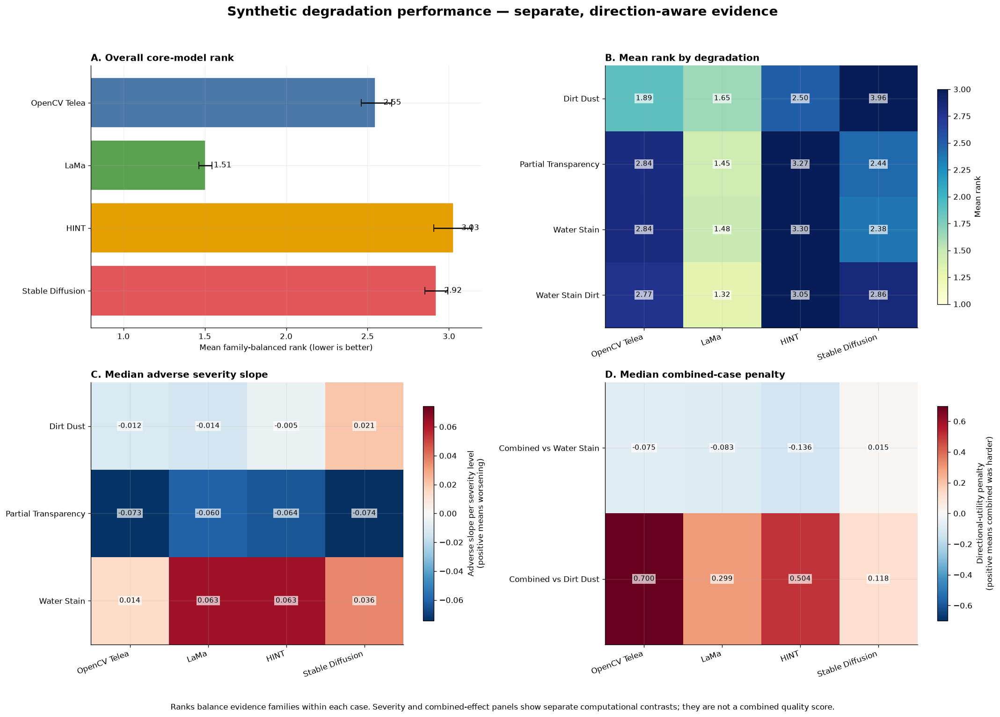

,model_id,estimate,ci_lower,ci_upper
0,opencv_telea,2.547857,2.462000,2.648146
1,lama,1.505143,1.464714,1.545429
2,hint_places2,3.026429,2.905843,3.140718
3,stable_diffusion_inpainting,2.920571,2.851000,2.994000


Canonical performance figure generated.
Path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\25_synthetic_degradation_analysis\figures\degradation_performance.png
Write attempts: 1
Panels: overall rank, degradation rank, severity slope, and combined-case penalty.


In [38]:
from matplotlib.colors import TwoSlopeNorm


CORE_MODEL_ORDER = list(
    POPULATION["model_order"]
)

CORE_MODEL_LABELS = [
    MODEL_DISPLAY[model_id]
    for model_id in CORE_MODEL_ORDER
]

CORE_MODEL_COLOURS = {
    "opencv_telea": "#4C78A8",
    "lama": "#59A14F",
    "hint_places2": "#E69F00",
    "stable_diffusion_inpainting": (
        "#E15759"
    ),
    "sdxl_inpainting": "#B279A2",
}


def annotate_heatmap(
    axis,
    matrix: np.ndarray,
    *,
    format_string: str = ".2f",
) -> None:
    """Write finite matrix values inside heatmap cells."""
    for row_index in range(
        matrix.shape[0]
    ):
        for column_index in range(
            matrix.shape[1]
        ):
            value = matrix[
                row_index,
                column_index,
            ]

            if not np.isfinite(value):
                continue

            axis.text(
                column_index,
                row_index,
                format(
                    value,
                    format_string,
                ),
                ha="center",
                va="center",
                fontsize=9,
                color="black",
                bbox={
                    "facecolor": "white",
                    "edgecolor": "none",
                    "alpha": 0.68,
                    "pad": 1.5,
                },
            )


overall_rank_figure_data = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ]
        .astype(str)
        .eq("overall")
    ]
    .set_index("model_id")
    .reindex(CORE_MODEL_ORDER)
    .reset_index()
)

for column in (
    "estimate",
    "ci_lower",
    "ci_upper",
):
    overall_rank_figure_data[
        column
    ] = pd.to_numeric(
        overall_rank_figure_data[column],
        errors="coerce",
    )

family_rank_matrix = (
    CORE_CASE_RANKS_RAW.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )[
        "family_balanced_rank"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

severity_slope_matrix = (
    MODEL_SEVERITY_SUMMARY.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "single_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

combined_penalty_matrix = (
    COMBINED_COMPONENT_CONTRAST.groupby(
        [
            "component_degradation",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "combined_components"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

performance_figure, axes = plt.subplots(
    nrows=2,
    ncols=2,
    figsize=(18, 13),
)

# Panel A — overall family-balanced rank
axis = axes[0, 0]

rank_estimates = (
    overall_rank_figure_data[
        "estimate"
    ].to_numpy(dtype=float)
)

rank_lower_errors = (
    rank_estimates
    - overall_rank_figure_data[
        "ci_lower"
    ].to_numpy(dtype=float)
)

rank_upper_errors = (
    overall_rank_figure_data[
        "ci_upper"
    ].to_numpy(dtype=float)
    - rank_estimates
)

y_positions = np.arange(
    len(CORE_MODEL_ORDER)
)

axis.barh(
    y_positions,
    rank_estimates,
    xerr=np.vstack(
        [
            rank_lower_errors,
            rank_upper_errors,
        ]
    ),
    color=[
        CORE_MODEL_COLOURS[model_id]
        for model_id in CORE_MODEL_ORDER
    ],
    edgecolor="white",
    capsize=5,
)

axis.set_yticks(
    y_positions,
    CORE_MODEL_LABELS,
)

axis.invert_yaxis()
axis.set_xlim(0.8, 3.2)
axis.set_xlabel(
    "Mean family-balanced rank "
    "(lower is better)"
)
axis.set_title(
    "A. Overall core-model rank",
    loc="left",
    fontweight="bold",
)

for position, value in zip(
    y_positions,
    rank_estimates,
):
    axis.text(
        min(value + 0.05, 3.12),
        position,
        f"{value:.2f}",
        va="center",
        fontsize=10,
    )

# Panel B — ranks by degradation family
axis = axes[0, 1]

family_rank_values = (
    family_rank_matrix.to_numpy(
        dtype=float
    )
)

family_rank_image = axis.imshow(
    family_rank_values,
    cmap="YlGnBu",
    vmin=1.0,
    vmax=3.0,
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(family_rank_matrix.index)
    ),
    [
        value.replace("_", " ").title()
        for value in family_rank_matrix.index
    ],
)

axis.set_title(
    "B. Mean rank by degradation",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    family_rank_values,
)

performance_figure.colorbar(
    family_rank_image,
    ax=axis,
    shrink=0.82,
    label="Mean rank",
)

# Panel C — adverse severity slopes
axis = axes[1, 0]

severity_values = (
    severity_slope_matrix.to_numpy(
        dtype=float
    )
)

severity_limit = max(
    float(
        np.nanmax(
            np.abs(severity_values)
        )
    ),
    1e-9,
)

severity_image = axis.imshow(
    severity_values,
    cmap="RdBu_r",
    norm=TwoSlopeNorm(
        vmin=-severity_limit,
        vcenter=0.0,
        vmax=severity_limit,
    ),
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(severity_slope_matrix.index)
    ),
    [
        value.replace("_", " ").title()
        for value
        in severity_slope_matrix.index
    ],
)

axis.set_title(
    "C. Median adverse severity slope",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    severity_values,
    format_string=".3f",
)

performance_figure.colorbar(
    severity_image,
    ax=axis,
    shrink=0.82,
    label=(
        "Adverse slope per severity level\n"
        "(positive means worsening)"
    ),
)

# Panel D — combined-versus-component penalties
axis = axes[1, 1]

combined_values = (
    combined_penalty_matrix.to_numpy(
        dtype=float
    )
)

combined_limit = max(
    float(
        np.nanmax(
            np.abs(combined_values)
        )
    ),
    1e-9,
)

combined_image = axis.imshow(
    combined_values,
    cmap="RdBu_r",
    norm=TwoSlopeNorm(
        vmin=-combined_limit,
        vcenter=0.0,
        vmax=combined_limit,
    ),
    aspect="auto",
)

axis.set_xticks(
    np.arange(len(CORE_MODEL_ORDER)),
    CORE_MODEL_LABELS,
    rotation=20,
    ha="right",
)

axis.set_yticks(
    np.arange(
        len(combined_penalty_matrix.index)
    ),
    [
        (
            "Combined vs "
            + value.replace(
                "_",
                " ",
            ).title()
        )
        for value
        in combined_penalty_matrix.index
    ],
)

axis.set_title(
    "D. Median combined-case penalty",
    loc="left",
    fontweight="bold",
)

annotate_heatmap(
    axis,
    combined_values,
    format_string=".3f",
)

performance_figure.colorbar(
    combined_image,
    ax=axis,
    shrink=0.82,
    label=(
        "Directional-utility penalty\n"
        "(positive means combined was harder)"
    ),
)

performance_figure.suptitle(
    (
        "Synthetic degradation performance — "
        "separate, direction-aware evidence"
    ),
    fontsize=17,
    fontweight="bold",
)

performance_figure.text(
    0.5,
    0.012,
    (
        "Ranks balance evidence families within each "
        "case. Severity and combined-effect panels show "
        "separate computational contrasts; they are not "
        "a combined quality score."
    ),
    ha="center",
    va="bottom",
    fontsize=10,
)

performance_figure.tight_layout(
    rect=(0, 0.045, 1, 0.955)
)

performance_figure_write = (
    run_with_permission_retry(
        atomic_save_matplotlib_figure,
        performance_figure,
        OUTPUT_PATHS[
            "performance_figure"
        ],
        dpi=180,
    )
)

plt.show()
plt.close(performance_figure)

display(
    overall_rank_figure_data[
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ]
    ]
)

print("Canonical performance figure generated.")
print(
    "Path: "
    f"{OUTPUT_PATHS['performance_figure']}"
)
print(
    "Write attempts: "
    f"{performance_figure_write['attempts']}"
)
print(
    "Panels: overall rank, degradation rank, "
    "severity slope, and combined-case penalty."
)

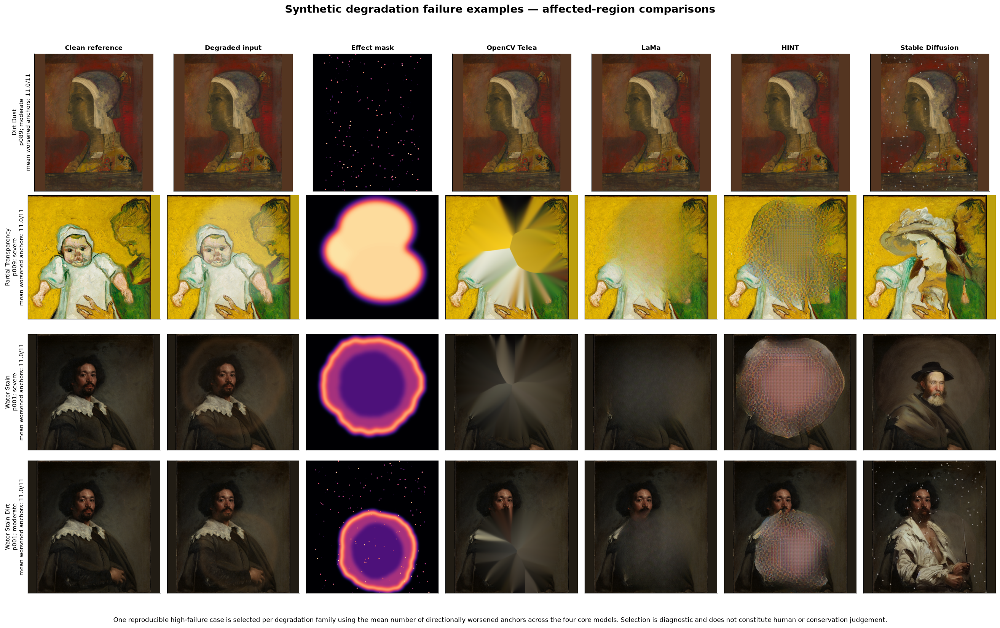

,degradation_family,case_id,painting_id,severity,mean_worsened_anchors,maximum_worsened_anchors,mean_improved_anchors,affected_content_fraction
0,dirt_dust,synthetic_degradation__p089__dirt_dust__moderate,p089,moderate,11.0,11,0.0,0.025397
1,partial_transparency,synthetic_degradation__p009__partial_transparency__severe,p009,severe,11.0,11,0.0,0.493285
2,water_stain,synthetic_degradation__p001__water_stain__severe,p001,severe,11.0,11,0.0,0.597747
3,water_stain_dirt,synthetic_degradation__p001__water_stain_dirt__moderate,p001,moderate,11.0,11,0.0,0.418395


Canonical failure-example figure generated.
Path: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\25_synthetic_degradation_analysis\figures\degradation_failure_examples.png
Write attempts: 2
Selected degradation families: ['dirt_dust', 'partial_transparency', 'water_stain', 'water_stain_dirt']


In [39]:
core_failure_profiles = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .copy()
)

failure_case_summary = (
    core_failure_profiles.groupby(
        [
            "case_id",
            "degradation_family",
            "painting_id",
            "severity",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        mean_worsened_anchors=(
            "worsened_anchor_count",
            "mean",
        ),
        maximum_worsened_anchors=(
            "worsened_anchor_count",
            "max",
        ),
        mean_improved_anchors=(
            "improved_anchor_count",
            "mean",
        ),
        compared_models=(
            "model_id",
            "nunique",
        ),
    )
)

failure_case_metadata = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER),
        [
            "case_id",
            "input_image_path",
            "clean_image_path",
            "mask_or_effect_path",
            "severity_rank",
            "affected_content_fraction",
            "changed_content_fraction",
        ],
    ]
    .drop_duplicates("case_id")
)

failure_case_summary = (
    failure_case_summary.merge(
        failure_case_metadata,
        on="case_id",
        how="left",
        validate="one_to_one",
    )
)

failure_case_summary = (
    failure_case_summary.sort_values(
        [
            "degradation_family",
            "mean_worsened_anchors",
            "maximum_worsened_anchors",
            "severity_rank",
            "case_id",
        ],
        ascending=[
            True,
            False,
            False,
            False,
            True,
        ],
        kind="stable",
    )
)

FAILURE_FIGURE_CASES = (
    failure_case_summary.groupby(
        "degradation_family",
        sort=False,
        as_index=False,
    )
    .head(1)
    .copy()
)

family_order_lookup = {
    family: order
    for order, family in enumerate(
        POPULATION[
            "eligible_degradation_order"
        ]
    )
}

FAILURE_FIGURE_CASES[
    "_family_order"
] = (
    FAILURE_FIGURE_CASES[
        "degradation_family"
    ].map(family_order_lookup)
)

FAILURE_FIGURE_CASES = (
    FAILURE_FIGURE_CASES.sort_values(
        [
            "_family_order",
            "case_id",
        ],
        kind="stable",
    )
    .drop(columns="_family_order")
    .reset_index(drop=True)
)

failure_candidate_lookup = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in (
        SELECTED_CANDIDATES.loc[
            SELECTED_CANDIDATES[
                "model_id"
            ]
            .astype(str)
            .isin(CORE_MODEL_ORDER)
        ]
        .itertuples(index=False)
    )
}

failure_view_columns = [
    ("clean", "Clean reference"),
    ("degraded", "Degraded input"),
    ("mask", "Effect mask"),
    ("opencv_telea", "OpenCV Telea"),
    ("lama", "LaMa"),
    ("hint_places2", "HINT"),
    (
        "stable_diffusion_inpainting",
        "Stable Diffusion",
    ),
]

failure_figure, axes = plt.subplots(
    nrows=len(FAILURE_FIGURE_CASES),
    ncols=len(failure_view_columns),
    figsize=(22, 14),
    squeeze=False,
)

for row_index, case in enumerate(
    FAILURE_FIGURE_CASES.itertuples(
        index=False
    )
):
    clean_rgb = load_rgb_array(
        case.clean_image_path
    )

    degraded_rgb = load_rgb_array(
        case.input_image_path
    )

    mask_array = load_mask_array(
        case.mask_or_effect_path
    )

    x_min, y_min, x_max, y_max = (
        mask_bounding_box(
            mask_array,
            margin_fraction=0.08,
        )
    )

    for column_index, (
        view_id,
        view_label,
    ) in enumerate(
        failure_view_columns
    ):
        axis = axes[
            row_index,
            column_index,
        ]

        if view_id == "clean":
            image_array = clean_rgb
            colour_map = None
        elif view_id == "degraded":
            image_array = degraded_rgb
            colour_map = None
        elif view_id == "mask":
            image_array = mask_array
            colour_map = "magma"
        else:
            candidate = (
                failure_candidate_lookup[
                    (
                        str(case.case_id),
                        view_id,
                    )
                ]
            )

            image_array = load_rgb_array(
                candidate.restored_path
            )
            colour_map = None

        cropped = image_array[
            y_min:y_max,
            x_min:x_max,
        ]

        if colour_map is None:
            axis.imshow(cropped)
        else:
            axis.imshow(
                cropped,
                cmap=colour_map,
                vmin=0,
                vmax=255,
            )

        if row_index == 0:
            axis.set_title(
                view_label,
                fontsize=10,
                fontweight="bold",
            )

        if column_index == 0:
            axis.set_ylabel(
                (
                    case.degradation_family
                    .replace("_", " ")
                    .title()
                    + "\n"
                    + f"{case.painting_id}; "
                    + f"{case.severity}\n"
                    + "mean worsened anchors: "
                    + (
                        f"{case.mean_worsened_anchors:.1f}"
                        "/11"
                    )
                ),
                fontsize=9,
            )

        axis.set_xticks([])
        axis.set_yticks([])
        axis.grid(False)

failure_figure.suptitle(
    (
        "Synthetic degradation failure examples — "
        "affected-region comparisons"
    ),
    fontsize=17,
    fontweight="bold",
)

failure_figure.text(
    0.5,
    0.012,
    (
        "One reproducible high-failure case is selected "
        "per degradation family using the mean number "
        "of directionally worsened anchors across the "
        "four core models. Selection is diagnostic and "
        "does not constitute human or conservation judgement."
    ),
    ha="center",
    va="bottom",
    fontsize=10,
)

failure_figure.tight_layout(
    rect=(0, 0.045, 1, 0.955)
)

failure_figure_write = (
    run_with_permission_retry(
        atomic_save_matplotlib_figure,
        failure_figure,
        OUTPUT_PATHS[
            "failure_figure"
        ],
        dpi=180,
    )
)

plt.show()
plt.close(failure_figure)

display(
    FAILURE_FIGURE_CASES[
        [
            "degradation_family",
            "case_id",
            "painting_id",
            "severity",
            "mean_worsened_anchors",
            "maximum_worsened_anchors",
            "mean_improved_anchors",
            "affected_content_fraction",
        ]
    ]
)

print("Canonical failure-example figure generated.")
print(
    "Path: "
    f"{OUTPUT_PATHS['failure_figure']}"
)
print(
    "Write attempts: "
    f"{failure_figure_write['attempts']}"
)
print(
    "Selected degradation families: "
    f"{FAILURE_FIGURE_CASES['degradation_family'].tolist()}"
)

In [41]:
# ---------------------------------------------------------------------------
# Batch 8 final scientific and output validation
# ---------------------------------------------------------------------------

BATCH_8_STAGE = (
    "batch_8_persistence_figures_validation"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_8_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_8_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_8_STAGE,
        check_id=check_id,
        check_description=description,
        severity="blocking",
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


def inspect_png(
    path: Path,
) -> dict:
    """Return independently reloaded PNG metadata."""
    with Image.open(path) as image:
        image.load()

        return {
            "format": image.format,
            "mode": image.mode,
            "width": int(image.width),
            "height": int(image.height),
            "size_bytes": int(
                path.stat().st_size
            ),
            "sha256": sha256_file(path),
        }


# ---------------------------------------------------------------------------
# Validate all preceding batches
# ---------------------------------------------------------------------------

prior_blocking_failures = [
    check
    for check in VALIDATION.blocking_failures
    if check.validation_stage
    != BATCH_8_STAGE
]

add_batch_8_check(
    check_id="prior_batches_passed",
    description=(
        "Batches 1-7 contain no unresolved "
        "blocking failures."
    ),
    expected=0,
    observed=len(
        prior_blocking_failures
    ),
    passed=not prior_blocking_failures,
)


# ---------------------------------------------------------------------------
# Validate the persisted canonical analysis
# ---------------------------------------------------------------------------

reloaded_analysis_validation = (
    validate_synthetic_degradation_analysis(
        RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

expected_kind_counts = {
    analysis_kind: int(
        EXPECTED[
            f"{analysis_kind}_rows"
        ]
    )
    for analysis_kind
    in SETTINGS["analysis_kinds"]
}

observed_kind_counts = {
    str(analysis_kind): int(count)
    for analysis_kind, count in (
        RELOADED_ANALYSIS.groupby(
            "analysis_kind"
        )
        .size()
        .to_dict()
        .items()
    )
}

add_batch_8_check(
    check_id="canonical_analysis_round_trip",
    description=(
        "The persisted analysis reloads with its "
        "complete schema and exact Controlled-300 "
        "row contract."
    ),
    expected={
        "passed": True,
        "rows": int(
            EXPECTED[
                "canonical_analysis_rows"
            ]
        ),
        "analysis_kinds": int(
            len(
                SETTINGS[
                    "analysis_kinds"
                ]
            )
        ),
    },
    observed={
        "passed": bool(
            reloaded_analysis_validation[
                "passed"
            ]
        ),
        "rows": int(
            len(RELOADED_ANALYSIS)
        ),
        "analysis_kinds": int(
            RELOADED_ANALYSIS[
                "analysis_kind"
            ].nunique()
        ),
    },
    passed=(
        bool(
            reloaded_analysis_validation[
                "passed"
            ]
        )
        and len(RELOADED_ANALYSIS)
        == int(
            EXPECTED[
                "canonical_analysis_rows"
            ]
        )
        and RELOADED_ANALYSIS[
            "analysis_kind"
        ].nunique()
        == len(
            SETTINGS[
                "analysis_kinds"
            ]
        )
    ),
)

add_batch_8_check(
    check_id="canonical_row_identity_and_kinds",
    description=(
        "Round-trip identifiers and all canonical "
        "analysis-kind counts are unchanged."
    ),
    expected={
        "identifier_sets_match": True,
        "kind_counts":
            expected_kind_counts,
    },
    observed={
        "identifier_sets_match": bool(
            round_trip_ids_match
        ),
        "kind_counts":
            observed_kind_counts,
    },
    passed=(
        round_trip_ids_match
        and observed_kind_counts
        == expected_kind_counts
    ),
)


# ---------------------------------------------------------------------------
# Validate both canonical figures
# ---------------------------------------------------------------------------

performance_figure_info = inspect_png(
    OUTPUT_PATHS[
        "performance_figure"
    ]
)

failure_figure_info = inspect_png(
    OUTPUT_PATHS[
        "failure_figure"
    ]
)

figure_information = {
    "performance_figure":
        performance_figure_info,
    "failure_figure":
        failure_figure_info,
}

figure_integrity_passed = all(
    information["format"] == "PNG"
    and information["width"] >= 2000
    and information["height"] >= 1200
    and information["size_bytes"] > 50_000
    for information
    in figure_information.values()
)

add_batch_8_check(
    check_id="canonical_figure_integrity",
    description=(
        "Both canonical analytical figures reload "
        "as substantial high-resolution PNG files."
    ),
    expected={
        "figures": 2,
        "format": "PNG",
        "minimum_width": 2000,
        "minimum_height": 1200,
        "minimum_size_bytes": 50_000,
    },
    observed=figure_information,
    passed=(
        len(figure_information) == 2
        and figure_integrity_passed
    ),
)


# ---------------------------------------------------------------------------
# Validate performance-figure coverage
# ---------------------------------------------------------------------------

performance_panel_counts = {
    "overall_rank_rows": int(
        len(
            overall_rank_figure_data
        )
    ),
    "degradation_model_cells": int(
        family_rank_matrix
        .notna()
        .sum()
        .sum()
    ),
    "severity_model_cells": int(
        severity_slope_matrix
        .notna()
        .sum()
        .sum()
    ),
    "combined_component_model_cells": int(
        combined_penalty_matrix
        .notna()
        .sum()
        .sum()
    ),
}

expected_performance_panel_counts = {
    "overall_rank_rows": int(
        len(CORE_MODEL_ORDER)
    ),
    "degradation_model_cells": int(
        len(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
        * len(CORE_MODEL_ORDER)
    ),
    "severity_model_cells": int(
        len(
            POPULATION[
                "severity_order"
            ]
        )
        * len(CORE_MODEL_ORDER)
    ),
    "combined_component_model_cells": int(
        len(
            POPULATION[
                "combined_components"
            ]
        )
        * len(CORE_MODEL_ORDER)
    ),
}

add_batch_8_check(
    check_id="performance_figure_evidence_coverage",
    description=(
        "The performance figure covers all four "
        "primary models across the overall, "
        "degradation, severity, and combined panels."
    ),
    expected=(
        expected_performance_panel_counts
    ),
    observed=performance_panel_counts,
    passed=(
        performance_panel_counts
        == expected_performance_panel_counts
    ),
)


# ---------------------------------------------------------------------------
# Validate failure-figure coverage
# ---------------------------------------------------------------------------

failure_figure_coverage = {
    "rows": int(
        len(
            FAILURE_FIGURE_CASES
        )
    ),
    "unique_cases": int(
        FAILURE_FIGURE_CASES[
            "case_id"
        ].nunique()
    ),
    "degradation_families": sorted(
        FAILURE_FIGURE_CASES[
            "degradation_family"
        ]
        .astype(str)
        .unique()
        .tolist()
    ),
    "primary_models_per_case": sorted(
        FAILURE_FIGURE_CASES[
            "case_id"
        ]
        .map(
            core_failure_profiles.groupby(
                "case_id"
            )["model_id"].nunique()
        )
        .astype(int)
        .unique()
        .tolist()
    ),
}

expected_failure_figure_coverage = {
    "rows": int(
        len(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
    ),
    "unique_cases": int(
        len(
            POPULATION[
                "eligible_degradation_order"
            ]
        )
    ),
    "degradation_families": sorted(
        POPULATION[
            "eligible_degradation_order"
        ]
    ),
    "primary_models_per_case": [
        int(
            len(CORE_MODEL_ORDER)
        )
    ],
}

add_batch_8_check(
    check_id="failure_figure_evidence_coverage",
    description=(
        "The failure figure contains one deterministic "
        "case for every eligible degradation family "
        "with all four primary models."
    ),
    expected=(
        expected_failure_figure_coverage
    ),
    observed=failure_figure_coverage,
    passed=(
        failure_figure_coverage
        == expected_failure_figure_coverage
    ),
)


# ---------------------------------------------------------------------------
# Validate scientific scope safeguards
# ---------------------------------------------------------------------------

runtime_ranking_rows = int(
    RELOADED_ANALYSIS.loc[
        RELOADED_ANALYSIS[
            "analysis_kind"
        ]
        .astype(str)
        .isin(
            [
                "candidate_runtime",
                "runtime_summary",
            ]
        ),
        "quality_ranking_eligible",
    ]
    .fillna(False)
    .astype(bool)
    .sum()
)

uncertainty_analysis_rows = int(
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .astype(str)
    .str.contains(
        "uncertainty",
        case=False,
        regex=False,
    )
    .sum()
)

sdxl_scope_rows = (
    RELOADED_ANALYSIS.loc[
        RELOADED_ANALYSIS[
            "analysis_kind"
        ]
        .astype(str)
        .isin(
            [
                "sdxl_subset_case_rank",
                "sdxl_subset_anchor_summary",
            ]
        )
    ]
)

expected_sdxl_scope_rows = int(
    EXPECTED[
        "sdxl_subset_case_rank_rows"
    ]
    + EXPECTED[
        "sdxl_subset_anchor_summary_rows"
    ]
)

sdxl_scope_is_bounded = bool(
    len(sdxl_scope_rows)
    == expected_sdxl_scope_rows
    and sdxl_scope_rows[
        "population_id"
    ]
    .astype(str)
    .eq(
        "sdxl_partial_eleven_case"
    )
    .all()
    and sdxl_scope_rows[
        "coverage_role"
    ]
    .astype(str)
    .eq(
        "bounded_sdxl_subset"
    )
    .all()
)

add_batch_8_check(
    check_id="scientific_scope_safeguards",
    description=(
        "Runtime remains outside quality ranking, "
        "uncertainty remains unavailable, SDXL "
        "remains bounded, and no combined score "
        "is constructed."
    ),
    expected={
        "runtime_ranking_rows": 0,
        "uncertainty_rows": 0,
        "sdxl_rows":
            expected_sdxl_scope_rows,
        "sdxl_scope_bounded": True,
        "combined_quality_score": False,
    },
    observed={
        "runtime_ranking_rows":
            runtime_ranking_rows,
        "uncertainty_rows":
            uncertainty_analysis_rows,
        "sdxl_rows": int(
            len(sdxl_scope_rows)
        ),
        "sdxl_scope_bounded":
            sdxl_scope_is_bounded,
        "combined_quality_score": bool(
            STATISTICS[
                "combined_quality_score_retained"
            ]
        ),
    },
    passed=(
        runtime_ranking_rows == 0
        and uncertainty_analysis_rows == 0
        and sdxl_scope_is_bounded
        and not bool(
            STATISTICS[
                "combined_quality_score_retained"
            ]
        )
    ),
)


# ---------------------------------------------------------------------------
# Validate exact Batch 8 output ownership
# ---------------------------------------------------------------------------

expected_batch_8_files = {
    OUTPUT_PATHS[
        "metrics"
    ].resolve(),
    OUTPUT_PATHS[
        "performance_figure"
    ].resolve(),
    OUTPUT_PATHS[
        "failure_figure"
    ].resolve(),
}

observed_batch_8_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

temporary_batch_8_files = [
    path
    for path in observed_batch_8_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

add_batch_8_check(
    check_id="batch_8_output_scope",
    description=(
        "Only the canonical analysis CSV and two "
        "canonical figures exist after Batch 8."
    ),
    expected={
        "canonical_files": 3,
        "temporary_files": 0,
        "work_files": 0,
    },
    observed={
        "canonical_files": int(
            len(
                observed_batch_8_files
            )
        ),
        "temporary_files": int(
            len(
                temporary_batch_8_files
            )
        ),
        "work_files": int(
            len(work_files)
        ),
    },
    passed=(
        observed_batch_8_files
        == expected_batch_8_files
        and not temporary_batch_8_files
        and not work_files
    ),
)


# ---------------------------------------------------------------------------
# Consolidated Batch 8 result
# ---------------------------------------------------------------------------

BATCH_8_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_8_STAGE)
    ]
    .reset_index(drop=True)
)

display(BATCH_8_CHECKS)

VALIDATION.raise_for_blocking()

print("Batch 8 passed.")
print(
    "Batch 8 checks: "
    f"{len(BATCH_8_CHECKS)}"
)
print(
    "Blocking failures: "
    f"{int((~BATCH_8_CHECKS['passed']).sum())}"
)
print(
    "Persisted analysis rows: "
    f"{len(RELOADED_ANALYSIS):,}"
)
print(
    "Performance figure: "
    f"{performance_figure_info}"
)
print(
    "Failure figure: "
    f"{failure_figure_info}"
)
print(
    "Canonical files written: "
    f"{len(observed_batch_8_files)}"
)
print(
    "Next batch: approved-mock-aligned report, "
    "manifests, consolidated validation, and "
    "final completion traceability."
)

,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_persistence_figures_validation,prior_batches_passed,Batches 1-7 contain no unresolved blocking failures.,blocking,0,0,True,
1,batch_8_persistence_figures_validation,canonical_analysis_round_trip,The persisted analysis reloads with its complete schema and exact Controlled-300 row contract.,blocking,"{""analysis_kinds"": 17, ""passed"": true, ""rows"": 34977}","{""analysis_kinds"": 17, ""passed"": true, ""rows"": 34977}",True,
2,batch_8_persistence_figures_validation,canonical_row_identity_and_kinds,Round-trip identifiers and all canonical analysis-kind counts are unchanged.,blocking,"{""identifier_sets_match"": true, ""kind_counts"": {""affected_area_association"": 132, ""candidate_failure_profile"": 1411, ""candidate_quality_anchor"": 1...","{""identifier_sets_match"": true, ""kind_counts"": {""affected_area_association"": 132, ""candidate_failure_profile"": 1411, ""candidate_quality_anchor"": 1...",True,
3,batch_8_persistence_figures_validation,canonical_figure_integrity,Both canonical analytical figures reload as substantial high-resolution PNG files.,blocking,"{""figures"": 2, ""format"": ""PNG"", ""minimum_height"": 1200, ""minimum_size_bytes"": 50000, ""minimum_width"": 2000}","{""failure_figure"": {""format"": ""PNG"", ""height"": 2475, ""mode"": ""RGBA"", ""sha256"": ""d753314ab9e9a53f69f38adf8759184ee6f9fc27a7119bc9046f597c6dfc4d6c"",...",True,
4,batch_8_persistence_figures_validation,performance_figure_evidence_coverage,"The performance figure covers all four primary models across the overall, degradation, severity, and combined panels.",blocking,"{""combined_component_model_cells"": 8, ""degradation_model_cells"": 16, ""overall_rank_rows"": 4, ""severity_model_cells"": 12}","{""combined_component_model_cells"": 8, ""degradation_model_cells"": 16, ""overall_rank_rows"": 4, ""severity_model_cells"": 12}",True,
5,batch_8_persistence_figures_validation,failure_figure_evidence_coverage,The failure figure contains one deterministic case for every eligible degradation family with all four primary models.,blocking,"{""degradation_families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""primary_models_per_case"": [4], ""rows"": 4, ""uni...","{""degradation_families"": [""dirt_dust"", ""partial_transparency"", ""water_stain"", ""water_stain_dirt""], ""primary_models_per_case"": [4], ""rows"": 4, ""uni...",True,
6,batch_8_persistence_figures_validation,scientific_scope_safeguards,"Runtime remains outside quality ranking, uncertainty remains unavailable, SDXL remains bounded, and no combined score is constructed.",blocking,"{""combined_quality_score"": false, ""runtime_ranking_rows"": 0, ""sdxl_rows"": 110, ""sdxl_scope_bounded"": true, ""uncertainty_rows"": 0}","{""combined_quality_score"": false, ""runtime_ranking_rows"": 0, ""sdxl_rows"": 110, ""sdxl_scope_bounded"": true, ""uncertainty_rows"": 0}",True,
7,batch_8_persistence_figures_validation,batch_8_output_scope,Only the canonical analysis CSV and two canonical figures exist after Batch 8.,blocking,"{""canonical_files"": 3, ""temporary_files"": 0, ""work_files"": 0}","{""canonical_files"": 3, ""temporary_files"": 0, ""work_files"": 0}",True,


Batch 8 passed.
Batch 8 checks: 8
Blocking failures: 0
Persisted analysis rows: 34,977
Performance figure: {'format': 'PNG', 'mode': 'RGBA', 'width': 3200, 'height': 2301, 'size_bytes': 345219, 'sha256': 'c77facbef09020731f14eea7b68de2de9b41d89c09bd6a1cf00781c0b172dc37'}
Failure figure: {'format': 'PNG', 'mode': 'RGBA', 'width': 3941, 'height': 2475, 'size_bytes': 9419158, 'sha256': 'd753314ab9e9a53f69f38adf8759184ee6f9fc27a7119bc9046f597c6dfc4d6c'}
Canonical files written: 3
Next batch: approved-mock-aligned report, manifests, consolidated validation, and final completion traceability.


## Batch 9 — Approved-mock report, manifests, and completion gate

Build the final self-contained HTML report using the approved mock as its structural baseline.

The report preserves the approved section order, visual roles, conclusion placement, evidence-to-assertion pattern, and thesis synthesis. Planning values are replaced with validated Controlled-300 evidence.

Complete numerical tables cover all 35 paintings and all eligible candidates. Visual atlases use one deterministic representative painting per broad visual category, while the bounded SDXL atlas shows all eleven completed cases.

After validating the standalone report, persist the consolidated validation table, artifact manifest, run manifest, project-path registrations, and final completion gate.

In [42]:
import base64
import io
import re
from html import escape

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_path,
)
from restoration_eval.multi_model_comparison import (
    image_grid_to_data_uri,
    image_path_to_data_uri,
)
from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    load_project_paths_registry,
    to_repo_relative,
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)
from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    VALIDATION_SCHEMA_VERSION,
)


MOCK_TO_FINAL_TRACEABILITY = pd.DataFrame(
    [
        (
            1,
            "executive_findings",
            "Executive findings",
            (
                "Headline indicators, main conclusions, "
                "canonical performance figure, and scope warning"
            ),
            (
                "Canonical ranks, anchor winners, spillover, "
                "SDXL scope, and uncertainty availability"
            ),
        ),
        (
            2,
            "what_was_evaluated",
            "What was evaluated?",
            (
                "Population arithmetic, eligibility, methods, "
                "evidence families, and independent-unit boundary"
            ),
            (
                "Eligibility audit, selected candidates, "
                "quality-anchor registry"
            ),
        ),
        (
            3,
            "procedural_input_severity",
            "Procedural input severity",
            (
                "Affected-area summaries, input/mask overview, "
                "and severity ladder"
            ),
            (
                "Notebook 07 cases and Notebook 08 eligibility"
            ),
        ),
        (
            4,
            "overall_core_model_performance",
            "Overall core-model performance",
            (
                "Overall family-balanced ranks, confidence "
                "intervals, and direct model conclusion"
            ),
            (
                "Core rank summaries and paired anchor evidence"
            ),
        ),
        (
            5,
            "behaviour_by_degradation",
            "Behaviour by degradation",
            (
                "Per-family rankings, four restoration atlases, "
                "and family-level conclusions"
            ),
            (
                "Case ranks and candidate restorations"
            ),
        ),
        (
            6,
            "severity_and_affected_area",
            "Severity and affected area",
            (
                "Severity slopes, affected-area associations, "
                "inference status, and interpretation"
            ),
            (
                "Model severity summaries and area associations"
            ),
        ),
        (
            7,
            "combined_versus_individual",
            "Combined versus individual degradations",
            (
                "Combined-component contrasts, restoration "
                "atlas, conclusions, and physical-scope warning"
            ),
            (
                "Combined-component contrast evidence"
            ),
        ),
        (
            8,
            "evidence_beyond_pixel_similarity",
            "Evidence beyond pixel similarity",
            (
                "Anchor winners across pixel, perceptual, "
                "feature, colour, seam, texture, and semantic evidence"
            ),
            (
                "Eleven predeclared quality anchors and "
                "Notebook 21 disagreement evidence"
            ),
        ),
        (
            9,
            "failures_and_metric_disagreement",
            "Failures and metric disagreement",
            (
                "Candidate failure profiles, canonical failure "
                "figure, representative atlas, and visual conclusions"
            ),
            (
                "Candidate anchor-direction profiles and "
                "stored restoration images"
            ),
        ),
        (
            10,
            "sdxl_bounded_subset",
            "SDXL bounded subset",
            (
                "Eleven-case five-model comparison, restoration "
                "atlas, and explicit non-generalizability"
            ),
            (
                "Bounded SDXL ranks and anchor summaries"
            ),
        ),
        (
            11,
            "compute_and_quality",
            "Compute and quality",
            (
                "Runtime summaries separated from quality "
                "ranking and operational interpretation"
            ),
            (
                "Candidate runtime and runtime summaries"
            ),
        ),
        (
            12,
            "painting_specific_behaviour",
            "Painting-specific behaviour",
            (
                "Painting-level rank profiles, visual atlas, "
                "and painting/category confounding warning"
            ),
            (
                "Painting-scope ranks and selected restorations"
            ),
        ),
        (
            13,
            "supported_conclusions_and_limits",
            "Supported conclusions and limits",
            (
                "Binary evidence-backed conclusions, unsupported "
                "claims, and limitations"
            ),
            (
                "All validated Notebook 25 evidence"
            ),
        ),
        (
            14,
            "contribution_to_thesis",
            "Contribution to the thesis",
            (
                "RQ1, RQ2, and RQ3 synthesis with explicit "
                "coverage boundaries"
            ),
            (
                "Proposal questions and roadmap extensions"
            ),
        ),
        (
            15,
            "technical_provenance",
            "Technical provenance",
            (
                "Methods, source notebooks, schemas, row "
                "contracts, traceability, and reproducibility"
            ),
            (
                "Run manifests, configuration, analysis table, "
                "and validation evidence"
            ),
        ),
    ],
    columns=[
        "mock_order",
        "mock_element_id",
        "mock_section",
        "approved_role",
        "canonical_evidence_source",
    ],
)

MOCK_TO_FINAL_TRACEABILITY[
    "final_section"
] = MOCK_TO_FINAL_TRACEABILITY[
    "mock_element_id"
]

MOCK_TO_FINAL_TRACEABILITY[
    "implementation_status"
] = "upgraded_additively"

MOCK_TO_FINAL_TRACEABILITY[
    "deviation_reason"
] = ""

EXPECTED_REPORT_SECTION_ORDER = (
    MOCK_TO_FINAL_TRACEABILITY.sort_values(
        "mock_order"
    )["mock_element_id"]
    .astype(str)
    .tolist()
)


def dataframe_to_report_html(
    frame: pd.DataFrame,
) -> str:
    """Render a compact escaped report table."""
    return frame.to_html(
        index=False,
        border=0,
        classes="data-table",
        escape=True,
        na_rep="—",
    )


def figure_to_data_uri(
    figure,
    *,
    dpi: int = 145,
) -> str:
    """Encode an in-memory analytical figure as PNG."""
    buffer = io.BytesIO()

    figure.savefig(
        buffer,
        format="png",
        dpi=int(dpi),
        bbox_inches="tight",
        facecolor="white",
    )

    payload = base64.b64encode(
        buffer.getvalue()
    ).decode("ascii")

    buffer.close()

    return (
        "data:image/png;base64,"
        + payload
    )


def atomic_write_text(
    text: str,
    output_path: Path,
) -> Path:
    """Persist UTF-8 text atomically inside the output root."""
    destination = Path(output_path)

    if not destination.resolve().is_relative_to(
        OUTPUT_ROOT
    ):
        raise ValueError(
            "Text destination is outside the "
            "Notebook 25 output root."
        )

    destination.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = destination.with_name(
        destination.name + ".tmp"
    )

    try:
        temporary.write_text(
            text,
            encoding="utf-8",
            newline="\n",
        )

        os.replace(
            temporary,
            destination,
        )

    finally:
        temporary.unlink(
            missing_ok=True
        )

    return destination


ANALYTICAL_VIEWS = []
REPORT_VISUAL_PANELS = []


def register_analytical_view(
    *,
    view_id: str,
    title: str,
    caption: str,
    source: str,
    data_uri: str,
    tile_count: int = 1,
) -> None:
    ANALYTICAL_VIEWS.append(
        {
            "view_id": view_id,
            "title": title,
            "caption": caption,
            "source": source,
            "data_uri": data_uri,
            "tile_count": int(
                tile_count
            ),
        }
    )


def register_report_panel(
    *,
    panel_id: str,
    title: str,
    caption: str,
    items,
    columns: int,
) -> None:
    REPORT_VISUAL_PANELS.append(
        {
            "panel_id": panel_id,
            "title": title,
            "caption": caption,
            "tile_count": len(items),
            "data_uri": (
                image_grid_to_data_uri(
                    items,
                    columns=int(columns),
                    tile_size=(300, 235),
                    quality=79,
                )
            ),
        }
    )

    print(
        "Report panel prepared: "
        f"{panel_id} "
        f"({len(items)} tiles)"
    )


def model_display(
    model_id: str,
) -> str:
    return MODEL_DISPLAY.get(
        str(model_id),
        str(model_id)
        .replace("_", " ")
        .title(),
    )


def grouped_bar_data_uri(
    pivot: pd.DataFrame,
    *,
    title: str,
    y_label: str,
    zero_line: bool = False,
) -> str:
    """Render a model-grouped bar chart from a matrix."""
    figure, axis = plt.subplots(
        figsize=(10.5, 5.8)
    )

    colours = [
        CORE_MODEL_COLOURS.get(
            str(column),
            "#777777",
        )
        for column in pivot.columns
    ]

    plot_frame = pivot.copy()

    plot_frame.columns = [
        model_display(column)
        for column in plot_frame.columns
    ]

    plot_frame.index = [
        str(value)
        .replace("_", " ")
        .title()
        for value in plot_frame.index
    ]

    plot_frame.plot(
        kind="bar",
        ax=axis,
        color=colours,
        edgecolor="white",
        width=0.78,
    )

    if zero_line:
        axis.axhline(
            0.0,
            color="#222222",
            linewidth=1.0,
        )

    axis.set_title(
        title,
        fontweight="bold",
    )
    axis.set_xlabel("")
    axis.set_ylabel(y_label)
    axis.tick_params(
        axis="x",
        rotation=20,
    )
    axis.legend(
        frameon=False,
        ncol=min(
            4,
            len(plot_frame.columns),
        ),
    )
    axis.grid(
        axis="x",
        visible=False,
    )

    figure.tight_layout()

    data_uri = figure_to_data_uri(
        figure
    )

    plt.close(figure)

    return data_uri


def single_bar_data_uri(
    values: pd.Series,
    *,
    title: str,
    y_label: str,
    lower_is_better: bool = False,
) -> str:
    """Render one deterministic labelled bar plot."""
    series = values.copy()

    labels = [
        model_display(value)
        for value in series.index
    ]

    colours = [
        CORE_MODEL_COLOURS.get(
            str(model_id),
            "#777777",
        )
        for model_id in series.index
    ]

    figure, axis = plt.subplots(
        figsize=(9.5, 5.4)
    )

    positions = np.arange(
        len(series)
    )

    axis.bar(
        positions,
        series.to_numpy(dtype=float),
        color=colours,
        edgecolor="white",
    )

    axis.set_xticks(
        positions,
        labels,
        rotation=18,
        ha="right",
    )

    axis.set_title(
        title,
        fontweight="bold",
    )
    axis.set_ylabel(y_label)
    axis.grid(
        axis="x",
        visible=False,
    )

    for position, value in zip(
        positions,
        series.to_numpy(dtype=float),
    ):
        axis.text(
            position,
            value,
            f"{value:.3f}",
            ha="center",
            va=(
                "bottom"
                if value >= 0
                else "top"
            ),
            fontsize=9,
        )

    if lower_is_better:
        axis.text(
            0.99,
            0.98,
            "Lower is better",
            transform=axis.transAxes,
            ha="right",
            va="top",
            fontsize=9,
            color="#58677a",
        )

    figure.tight_layout()

    data_uri = figure_to_data_uri(
        figure
    )

    plt.close(figure)

    return data_uri


print("Batch 9 report infrastructure initialized.")
print(
    "Approved mock sections: "
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Section order: "
    f"{EXPECTED_REPORT_SECTION_ORDER}"
)

Batch 9 report infrastructure initialized.
Approved mock sections: 15
Section order: ['executive_findings', 'what_was_evaluated', 'procedural_input_severity', 'overall_core_model_performance', 'behaviour_by_degradation', 'severity_and_affected_area', 'combined_versus_individual', 'evidence_beyond_pixel_similarity', 'failures_and_metric_disagreement', 'sdxl_bounded_subset', 'compute_and_quality', 'painting_specific_behaviour', 'supported_conclusions_and_limits', 'contribution_to_thesis', 'technical_provenance']


In [43]:
# Make this cell safe to rerun after partial execution.
ANALYTICAL_VIEWS.clear()


def add_grouped_report_view(
    *,
    view_id,
    title,
    caption,
    source,
    matrix,
    plot_title,
    y_label,
    zero_line=False,
):
    register_analytical_view(
        view_id=view_id,
        title=title,
        caption=caption,
        source=source,
        data_uri=grouped_bar_data_uri(
            matrix,
            title=plot_title,
            y_label=y_label,
            zero_line=zero_line,
        ),
    )


def add_single_report_view(
    *,
    view_id,
    title,
    caption,
    source,
    values,
    plot_title,
    y_label,
    lower_is_better=False,
):
    register_analytical_view(
        view_id=view_id,
        title=title,
        caption=caption,
        source=source,
        data_uri=single_bar_data_uri(
            values,
            title=plot_title,
            y_label=y_label,
            lower_is_better=(
                lower_is_better
            ),
        ),
    )


# ---------------------------------------------------------------------------
# Canonical figures
# ---------------------------------------------------------------------------

register_analytical_view(
    view_id="canonical_performance",
    title=(
        "Canonical synthetic-degradation "
        "performance summary"
    ),
    caption=(
        "Overall family-balanced rank, degradation-"
        "specific rank, adverse severity slopes, and "
        "combined-component contrasts remain separate."
    ),
    source=(
        "Notebook 25 canonical figure: "
        "degradation_performance.png"
    ),
    data_uri=image_path_to_data_uri(
        OUTPUT_PATHS[
            "performance_figure"
        ],
        max_dimension=1700,
        photographic_format="JPEG",
        quality=88,
    ),
    tile_count=4,
)

register_analytical_view(
    view_id="canonical_failures",
    title=(
        "Canonical affected-region failure examples"
    ),
    caption=(
        "One deterministic high-failure case per "
        "eligible degradation family, with clean, "
        "degraded, mask, and four-model context."
    ),
    source=(
        "Notebook 25 canonical figure: "
        "degradation_failure_examples.png"
    ),
    data_uri=image_path_to_data_uri(
        OUTPUT_PATHS[
            "failure_figure"
        ],
        max_dimension=1800,
        photographic_format="JPEG",
        quality=86,
    ),
    tile_count=24,
)

print("Analytical view progress: 2/14")


# ---------------------------------------------------------------------------
# Eligibility overview
# ---------------------------------------------------------------------------

eligibility_plot_data = (
    ELIGIBILITY_CASE_MODEL.assign(
        eligible_flag=pd.to_numeric(
            ELIGIBILITY_CASE_MODEL[
                "estimate"
            ],
            errors="coerce",
        ).eq(1)
    )
    .groupby("model_id")
    .agg(
        eligible=(
            "eligible_flag",
            "sum",
        ),
        total=(
            "analysis_row_id",
            "size",
        ),
    )
)

eligibility_plot_data[
    "excluded"
] = (
    eligibility_plot_data["total"]
    - eligibility_plot_data["eligible"]
)

eligibility_plot_frame = (
    eligibility_plot_data[
        [
            "eligible",
            "excluded",
        ]
    ]
    .reindex(
        POPULATION["all_model_order"]
    )
)

eligibility_plot_frame.index = [
    model_display(model_id)
    for model_id
    in eligibility_plot_frame.index
]

eligibility_figure, eligibility_axis = (
    plt.subplots(
        figsize=(9.5, 5.4)
    )
)

eligibility_plot_frame.plot(
    kind="bar",
    stacked=True,
    ax=eligibility_axis,
    color=[
        "#59A14F",
        "#D9DEE5",
    ],
    edgecolor="white",
)

eligibility_axis.set_title(
    "Eligibility decisions by model",
    fontweight="bold",
)
eligibility_axis.set_xlabel("")
eligibility_axis.set_ylabel(
    "Generated synthetic cases"
)
eligibility_axis.tick_params(
    axis="x",
    rotation=18,
)
eligibility_axis.legend(
    frameon=False
)
eligibility_axis.grid(
    axis="x",
    visible=False,
)

eligibility_figure.tight_layout()

register_analytical_view(
    view_id="eligibility_overview",
    title=(
        "Eligibility is not the same as failure"
    ),
    caption=(
        "Only eligibility-approved localized "
        "degradations enter restoration comparison. "
        "Excluded combinations are scope decisions, "
        "not failed restorations."
    ),
    source=(
        "Canonical eligibility_case_model rows"
    ),
    data_uri=figure_to_data_uri(
        eligibility_figure
    ),
)

plt.close(eligibility_figure)

print("Analytical view progress: 3/14")


# ---------------------------------------------------------------------------
# Procedural input area and severity
# ---------------------------------------------------------------------------

DESIGN_CASES = (
    SELECTED_CANDIDATES.loc[
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .drop_duplicates("case_id")
    .copy()
)

input_area_matrix = (
    DESIGN_CASES.groupby(
        [
            "degradation_family",
            "severity",
        ],
        sort=True,
    )[
        "affected_content_fraction"
    ]
    .median()
    .unstack("severity")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=POPULATION[
            "severity_order"
        ],
    )
)

add_grouped_report_view(
    view_id="input_area_severity",
    title=(
        "Affected content by degradation "
        "and configured severity"
    ),
    caption=(
        "Configured severity is ordinal. Affected "
        "area differs across families and is not an "
        "independent conservation-condition scale."
    ),
    source=(
        "Notebook 07 case geometry joined through "
        "the selected Notebook 25 population"
    ),
    matrix=input_area_matrix,
    plot_title=(
        "Median affected-content fraction"
    ),
    y_label=(
        "Affected content fraction"
    ),
)

print("Analytical view progress: 4/14")


# ---------------------------------------------------------------------------
# Core-model ranks
# ---------------------------------------------------------------------------

overall_rank_series = (
    CORE_RANK_SUMMARY.loc[
        CORE_RANK_SUMMARY[
            "scope_type"
        ]
        .astype(str)
        .eq("overall")
    ]
    .set_index("model_id")[
        "estimate"
    ]
    .astype(float)
    .reindex(CORE_MODEL_ORDER)
)

add_single_report_view(
    view_id="overall_core_rank",
    title="Overall core-model ranking",
    caption=(
        "Ranks balance evidence families within each "
        "case. Lower values indicate a better relative "
        "position, not a calibrated quality distance."
    ),
    source=(
        "Canonical core_rank_summary rows"
    ),
    values=overall_rank_series,
    plot_title=(
        "Overall mean family-balanced rank"
    ),
    y_label="Mean rank",
    lower_is_better=True,
)

add_grouped_report_view(
    view_id="degradation_family_rank",
    title=(
        "Performance differs by degradation"
    ),
    caption=(
        "Mean family-balanced rank is shown separately "
        "for each eligible degradation family."
    ),
    source=(
        "Core case-family-balanced ranks"
    ),
    matrix=family_rank_matrix,
    plot_title=(
        "Core-model rank by degradation family"
    ),
    y_label=(
        "Mean family-balanced rank "
        "(lower is better)"
    ),
)

print("Analytical view progress: 6/14")


# ---------------------------------------------------------------------------
# Severity and affected-area evidence
# ---------------------------------------------------------------------------

add_grouped_report_view(
    view_id="severity_slopes",
    title="Adverse severity slopes",
    caption=(
        "Positive values mean that directional utility "
        "became worse as configured severity increased. "
        "Negative values indicate a non-monotonic or "
        "opposite descriptive pattern."
    ),
    source=(
        "Canonical model_severity_summary rows"
    ),
    matrix=severity_slope_matrix,
    plot_title=(
        "Median adverse slope per severity level"
    ),
    y_label="Adverse slope",
    zero_line=True,
)

affected_area_matrix = (
    AFFECTED_AREA_ASSOCIATION.groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )["estimate"]
    .median()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "single_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="affected_area_associations",
    title="Affected-area associations",
    caption=(
        "Within-family clustered Spearman associations "
        "are descriptive. Positive values mean larger "
        "affected areas tended to coincide with more "
        "adverse evidence."
    ),
    source=(
        "Canonical affected_area_association rows"
    ),
    matrix=affected_area_matrix,
    plot_title=(
        "Median affected-area association"
    ),
    y_label=(
        "Median clustered Spearman rho"
    ),
    zero_line=True,
)

print("Analytical view progress: 8/14")


# ---------------------------------------------------------------------------
# Combined-component evidence
# ---------------------------------------------------------------------------

add_grouped_report_view(
    view_id="combined_component_penalties",
    title=(
        "Combined-versus-component penalties"
    ),
    caption=(
        "Positive values mean the ordered combined "
        "computational case was harder than the named "
        "single component. These are not physical "
        "interaction estimates."
    ),
    source=(
        "Canonical combined_component_contrast rows"
    ),
    matrix=combined_penalty_matrix,
    plot_title=(
        "Median combined-case performance penalty"
    ),
    y_label=(
        "Directional-utility penalty"
    ),
    zero_line=True,
)

print("Analytical view progress: 9/14")


# ---------------------------------------------------------------------------
# Metric disagreement
# ---------------------------------------------------------------------------

anchor_winner_counts = (
    OUR_CORE_ANCHOR_WINNERS[
        "winner_model_id"
    ]
    .value_counts()
    .reindex(
        CORE_MODEL_ORDER,
        fill_value=0,
    )
    .astype(float)
)

add_single_report_view(
    view_id="anchor_winner_counts",
    title=(
        "Different evidence families select "
        "different models"
    ),
    caption=(
        "The eleven predeclared anchors retain pixel, "
        "perceptual, feature, spatial, colour, texture, "
        "seam, semantic, and structural disagreement."
    ),
    source=(
        "Notebook 21 winner cross-check reproduced "
        "from Notebook 25 anchor evidence"
    ),
    values=anchor_winner_counts,
    plot_title=(
        "Number of overall anchor wins"
    ),
    y_label="Anchor wins out of 11",
)

print("Analytical view progress: 10/14")


# ---------------------------------------------------------------------------
# Candidate failure profiles
# ---------------------------------------------------------------------------

failure_profile_matrix = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
    ]
    .groupby(
        [
            "degradation_family",
            "model_id",
        ],
        sort=True,
    )[
        "worsened_anchor_count"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "eligible_degradation_order"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="failure_profiles",
    title=(
        "Candidate-level failure profiles"
    ),
    caption=(
        "The mean number of directionally worsened "
        "anchors is retained separately from improved "
        "and tied counts. It is a diagnostic profile, "
        "not a human failure label."
    ),
    source=(
        "Canonical candidate_failure_profile evidence"
    ),
    matrix=failure_profile_matrix,
    plot_title=(
        "Mean worsened anchors by degradation"
    ),
    y_label=(
        "Mean worsened anchors out of 11"
    ),
)

print("Analytical view progress: 11/14")


# ---------------------------------------------------------------------------
# Bounded SDXL ranking
# ---------------------------------------------------------------------------

sdxl_rank_series = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "model_id"
    )[
        "family_balanced_rank"
    ]
    .mean()
    .reindex(
        POPULATION["all_model_order"]
    )
)

add_single_report_view(
    view_id="sdxl_bounded_rank",
    title="Bounded SDXL subset",
    caption=(
        "Five-model ranks cover only eleven predeclared "
        "cases. They describe this subset and cannot "
        "support a full SDXL comparison."
    ),
    source=(
        "Canonical sdxl_subset_case_rank rows"
    ),
    values=sdxl_rank_series,
    plot_title=(
        "Mean rank in the eleven-case SDXL subset"
    ),
    y_label="Mean rank",
    lower_is_better=True,
)

print("Analytical view progress: 12/14")


# ---------------------------------------------------------------------------
# Runtime evidence
# ---------------------------------------------------------------------------

runtime_series = (
    RUNTIME_ENRICHED.assign(
        runtime_seconds=pd.to_numeric(
            RUNTIME_ENRICHED[
                "comparison_value"
            ],
            errors="coerce",
        )
    )
    .groupby("model_id")[
        "runtime_seconds"
    ]
    .median()
    .reindex(
        POPULATION["all_model_order"]
    )
)

if runtime_series.isna().any():
    raise ValueError(
        "Runtime report series contains missing values: "
        f"{runtime_series.to_dict()}"
    )

add_single_report_view(
    view_id="runtime_summary",
    title=(
        "Runtime is operational evidence"
    ),
    caption=(
        "Median recorded candidate runtime is shown "
        "for context and remains excluded from every "
        "quality rank."
    ),
    source=(
        "Canonical candidate_runtime evidence"
    ),
    values=runtime_series,
    plot_title=(
        "Median recorded runtime per candidate"
    ),
    y_label="Runtime seconds",
    lower_is_better=True,
)

print("Analytical view progress: 13/14")


# ---------------------------------------------------------------------------
# Painting-specific ranks
# ---------------------------------------------------------------------------

painting_rank_matrix = (
    CORE_CASE_RANKS_RAW.groupby(
        [
            "painting_id",
            "model_id",
        ],
        sort=True,
    )[
        "family_balanced_rank"
    ]
    .mean()
    .unstack("model_id")
    .reindex(
        index=POPULATION[
            "painting_ids"
        ],
        columns=CORE_MODEL_ORDER,
    )
)

add_grouped_report_view(
    view_id="painting_profiles",
    title=(
        "Painting-specific model ranks"
    ),
    caption=(
        "Each painting has its own degradation and "
        "content profile. Painting and category cannot "
        "be separated because there is one painting "
        "per category."
    ),
    source=(
        "Core case-family-balanced ranks grouped "
        "by painting"
    ),
    matrix=painting_rank_matrix,
    plot_title=(
        "Mean family-balanced rank by painting"
    ),
    y_label=(
        "Mean family-balanced rank "
        "(lower is better)"
    ),
)

analytical_view_ids = [
    view["view_id"]
    for view in ANALYTICAL_VIEWS
]

if (
    len(ANALYTICAL_VIEWS) != 14
    or len(set(analytical_view_ids)) != 14
):
    raise ValueError(
        "Analytical-view contract failed: "
        f"rows={len(ANALYTICAL_VIEWS)}, "
        f"unique_ids={len(set(analytical_view_ids))}, "
        f"ids={analytical_view_ids}"
    )

print("Report-only analytical views completed.")
print(
    "Analytical views: "
    f"{len(ANALYTICAL_VIEWS)}"
)
print(
    "Unique view IDs: "
    f"{len(set(analytical_view_ids))}"
)
print(
    "Analytical embedded tiles: "
    f"{sum(view['tile_count'] for view in ANALYTICAL_VIEWS)}"
)

Analytical view progress: 2/14
Analytical view progress: 3/14
Analytical view progress: 4/14
Analytical view progress: 6/14
Analytical view progress: 8/14
Analytical view progress: 9/14
Analytical view progress: 10/14
Analytical view progress: 11/14
Analytical view progress: 12/14
Analytical view progress: 13/14
Report-only analytical views completed.
Analytical views: 14
Unique view IDs: 14
Analytical embedded tiles: 40


In [44]:
# Pillow default-font compatibility for report-grid labels.
# This changes only text drawn inside bitmap grids; report prose remains Unicode.

if "_REGISTER_REPORT_PANEL_BASE" not in globals():
    _REGISTER_REPORT_PANEL_BASE = register_report_panel


def bitmap_safe_text(value) -> str:
    """Convert Unicode punctuation unsupported by Pillow's default font."""
    replacements = str.maketrans(
        {
            "\u2014": " - ",   # em dash
            "\u2013": "-",     # en dash
            "\u2011": "-",     # non-breaking hyphen
            "\u2018": "'",     # left single quote
            "\u2019": "'",     # right single quote
            "\u201c": '"',     # left double quote
            "\u201d": '"',     # right double quote
            "\u2026": "...",   # ellipsis
            "\u00a0": " ",     # non-breaking space
        }
    )

    translated = str(value).translate(replacements)

    return (
        translated
        .encode(
            "latin-1",
            errors="replace",
        )
        .decode("latin-1")
    )


def register_report_panel(
    *,
    panel_id: str,
    title: str,
    caption: str,
    items,
    columns: int,
) -> None:
    """Register a report panel using Pillow-compatible bitmap labels."""
    safe_items = [
        (
            bitmap_safe_text(label),
            path,
        )
        for label, path in items
    ]

    _REGISTER_REPORT_PANEL_BASE(
        panel_id=panel_id,
        title=title,
        caption=caption,
        items=safe_items,
        columns=int(columns),
    )


# Remove any partially registered panels from the failed execution.
REPORT_VISUAL_PANELS.clear()

print("Report-grid Unicode compatibility applied.")
print("Partially registered visual panels cleared.")
print("Rerun the failed visual-panels cell unchanged.")

Report-grid Unicode compatibility applied.
Partially registered visual panels cleared.
Rerun the failed visual-panels cell unchanged.


In [45]:
CASE_METADATA = (
    DESIGN_CASES[
        [
            "case_id",
            "painting_id",
            "category",
            "degradation_family",
            "severity",
            "severity_rank",
            "clean_image_path",
            "input_image_path",
            "mask_or_effect_path",
            "affected_content_fraction",
        ]
    ]
    .drop_duplicates("case_id")
    .copy()
)

CANDIDATE_LOOKUP = {
    (
        str(row.case_id),
        str(row.model_id),
    ): row
    for row in (
        SELECTED_CANDIDATES
        .itertuples(index=False)
    )
}


def repository_image_path(
    value,
) -> Path:
    return resolve_repository_file(
        str(value)
    )


def case_metadata_row(
    case_id: str,
):
    matches = CASE_METADATA.loc[
        CASE_METADATA[
            "case_id"
        ]
        .astype(str)
        .eq(str(case_id))
    ]

    if len(matches) != 1:
        raise ValueError(
            "Expected one case metadata row for "
            f"{case_id}, observed {len(matches)}."
        )

    return matches.iloc[0]


def candidate_for_case(
    case_id: str,
    model_id: str,
):
    key = (
        str(case_id),
        str(model_id),
    )

    if key not in CANDIDATE_LOOKUP:
        raise KeyError(
            "Missing candidate for "
            f"{case_id} and {model_id}."
        )

    return CANDIDATE_LOOKUP[key]


def append_case_model_tiles(
    items: list,
    *,
    case_id: str,
    model_ids,
    include_clean: bool = False,
    include_input: bool = True,
    include_mask: bool = False,
) -> None:
    case = case_metadata_row(
        case_id
    )

    prefix = (
        f"{case.painting_id} "
        f"{case.degradation_family} "
        f"{case.severity}"
    )

    if include_clean:
        items.append(
            (
                f"{prefix} - clean",
                repository_image_path(
                    case.clean_image_path
                ),
            )
        )

    if include_input:
        items.append(
            (
                f"{prefix} - degraded",
                repository_image_path(
                    case.input_image_path
                ),
            )
        )

    if include_mask:
        items.append(
            (
                f"{prefix} - mask",
                repository_image_path(
                    case.mask_or_effect_path
                ),
            )
        )

    for model_id in model_ids:
        candidate = candidate_for_case(
            case_id,
            model_id,
        )

        items.append(
            (
                (
                    f"{prefix} - "
                    f"{model_display(model_id)}"
                ),
                repository_image_path(
                    candidate.restored_path
                ),
            )
        )


# ---------------------------------------------------------------------------
# Fixed visual subset: one painting per broad visual category
# ---------------------------------------------------------------------------

painting_category_lookup = (
    CASE_METADATA[
        [
            "painting_id",
            "category",
        ]
    ]
    .drop_duplicates("painting_id")
    .set_index("painting_id")[
        "category"
    ]
    .astype(str)
    .to_dict()
)

REPORT_PAINTING_IDS = []
seen_report_categories = set()

for painting_id in POPULATION[
    "painting_ids"
]:
    category = painting_category_lookup[
        str(painting_id)
    ]

    if category in seen_report_categories:
        continue

    REPORT_PAINTING_IDS.append(
        str(painting_id)
    )
    seen_report_categories.add(
        category
    )

if len(REPORT_PAINTING_IDS) != int(
    EXPECTED["categories"]
):
    raise ValueError(
        "The report subset must contain exactly "
        "one painting per broad visual category."
    )

if len(seen_report_categories) != int(
    EXPECTED["categories"]
):
    raise ValueError(
        "The report subset does not cover all "
        "broad visual categories."
    )

print(
    "Representative report paintings:",
    REPORT_PAINTING_IDS,
)


# ---------------------------------------------------------------------------
# Panel 1: deterministic high-failure cases
# ---------------------------------------------------------------------------

failure_core_items = []

for case in (
    FAILURE_FIGURE_CASES
    .itertuples(index=False)
):
    append_case_model_tiles(
        failure_core_items,
        case_id=case.case_id,
        model_ids=CORE_MODEL_ORDER,
        include_clean=True,
        include_input=True,
    )

register_report_panel(
    panel_id="failure_core_atlas",
    title=(
        "High-failure cases across the "
        "four primary models"
    ),
    caption=(
        "The four deterministic cases used in the "
        "canonical failure figure, shown as larger "
        "restoration tiles without changing their "
        "selection rule."
    ),
    items=failure_core_items,
    columns=6,
)


# ---------------------------------------------------------------------------
# Panel 2: procedural inputs and masks
# ---------------------------------------------------------------------------

input_mask_cases = (
    CASE_METADATA.loc[
        CASE_METADATA[
            "painting_id"
        ]
        .astype(str)
        .isin(REPORT_PAINTING_IDS)
        & (
            (
                CASE_METADATA[
                    "degradation_family"
                ]
                .astype(str)
                .isin(
                    POPULATION[
                        "single_degradation_order"
                    ]
                )
                & CASE_METADATA[
                    "severity"
                ]
                .astype(str)
                .eq("severe")
            )
            | CASE_METADATA[
                "degradation_family"
            ]
            .astype(str)
            .eq(
                POPULATION[
                    "combined_degradation"
                ]
            )
        )
    ]
    .sort_values(
        [
            "degradation_family",
            "painting_id",
        ],
        kind="stable",
    )
)

procedural_input_items = []

for case in input_mask_cases.itertuples(
    index=False
):
    procedural_input_items.extend(
        [
            (
                (
                    f"{case.painting_id} "
                    f"{case.degradation_family} "
                    f"{case.severity} - input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
            (
                (
                    f"{case.painting_id} "
                    f"{case.degradation_family} "
                    f"{case.severity} - mask"
                ),
                repository_image_path(
                    case.mask_or_effect_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="procedural_inputs_masks",
    title=(
        "Procedural inputs and effect masks"
    ),
    caption=(
        "Severe single-degradation cases and moderate "
        "combined cases for one deterministic painting "
        "per category. Masks show computational support, "
        "not physical material boundaries."
    ),
    items=procedural_input_items,
    columns=8,
)


# ---------------------------------------------------------------------------
# Panel 3: one-painting severity ladder
# ---------------------------------------------------------------------------

severity_ladder_painting_id = (
    REPORT_PAINTING_IDS[0]
)

severity_ladder_cases = (
    CASE_METADATA.loc[
        CASE_METADATA[
            "painting_id"
        ]
        .astype(str)
        .eq(
            severity_ladder_painting_id
        )
        & CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .isin(
            POPULATION[
                "single_degradation_order"
            ]
        )
    ]
    .sort_values(
        [
            "degradation_family",
            "severity_rank",
        ],
        kind="stable",
    )
)

severity_ladder_items = []

for case in severity_ladder_cases.itertuples(
    index=False
):
    severity_ladder_items.extend(
        [
            (
                (
                    f"{case.degradation_family} "
                    f"{case.severity} - input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
            (
                (
                    f"{case.degradation_family} "
                    f"{case.severity} - mask"
                ),
                repository_image_path(
                    case.mask_or_effect_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="severity_ladder",
    title=(
        "Configured severity ladder for "
        f"{severity_ladder_painting_id}"
    ),
    caption=(
        "Mild, moderate, and severe procedural "
        "variants for the three eligible single "
        "degradations. Severity is ordinal rather "
        "than a calibrated condition grade."
    ),
    items=severity_ladder_items,
    columns=6,
)


# ---------------------------------------------------------------------------
# Panels 4-7: family-specific restoration atlases
# ---------------------------------------------------------------------------

def build_family_atlas(
    degradation_family: str,
):
    family_filter = (
        CASE_METADATA[
            "painting_id"
        ]
        .astype(str)
        .isin(REPORT_PAINTING_IDS)
        & CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .eq(degradation_family)
    )

    if (
        degradation_family
        != POPULATION[
            "combined_degradation"
        ]
    ):
        family_filter &= (
            CASE_METADATA[
                "severity"
            ]
            .astype(str)
            .eq("severe")
        )

    family_cases = (
        CASE_METADATA.loc[
            family_filter
        ]
        .sort_values(
            "painting_id",
            kind="stable",
        )
    )

    items = []

    for case in family_cases.itertuples(
        index=False
    ):
        append_case_model_tiles(
            items,
            case_id=case.case_id,
            model_ids=CORE_MODEL_ORDER,
            include_clean=False,
            include_input=True,
        )

    return items


family_panel_specs = [
    (
        "dirt_dust_atlas",
        "dirt_dust",
        "Dirt and dust restoration atlas",
    ),
    (
        "partial_transparency_atlas",
        "partial_transparency",
        "Partial-transparency restoration atlas",
    ),
    (
        "water_stain_atlas",
        "water_stain",
        "Water-stain restoration atlas",
    ),
    (
        "combined_atlas",
        "water_stain_dirt",
        "Combined water-stain-and-dirt atlas",
    ),
]

for (
    panel_id,
    degradation_family,
    title,
) in family_panel_specs:
    family_items = build_family_atlas(
        degradation_family
    )

    register_report_panel(
        panel_id=panel_id,
        title=title,
        caption=(
            "One painting per category is shown as "
            "degraded input followed by OpenCV Telea, "
            "LaMa, HINT, and Stable Diffusion. Single "
            "degradations use severe cases; the combined "
            "family uses its configured moderate case."
        ),
        items=family_items,
        columns=5,
    )


# ---------------------------------------------------------------------------
# Panel 8: all eleven bounded SDXL cases
# ---------------------------------------------------------------------------

sdxl_items = []

for case_id in POPULATION[
    "sdxl_case_ids"
]:
    append_case_model_tiles(
        sdxl_items,
        case_id=case_id,
        model_ids=POPULATION[
            "all_model_order"
        ],
        include_clean=False,
        include_input=True,
    )

register_report_panel(
    panel_id="sdxl_bounded_atlas",
    title=(
        "Eleven-case bounded SDXL comparison"
    ),
    caption=(
        "Each row contains the degraded input and all "
        "five available restorations. The subset remains "
        "incomplete and severity-imbalanced."
    ),
    items=sdxl_items,
    columns=6,
)


# ---------------------------------------------------------------------------
# Panel 9: category-balanced painting context
# ---------------------------------------------------------------------------

painting_items = []

painting_context_cases = (
    CASE_METADATA.loc[
        CASE_METADATA[
            "painting_id"
        ]
        .astype(str)
        .isin(REPORT_PAINTING_IDS)
        & CASE_METADATA[
            "degradation_family"
        ]
        .astype(str)
        .eq("water_stain")
        & CASE_METADATA[
            "severity"
        ]
        .astype(str)
        .eq("severe")
    ]
    .sort_values(
        "painting_id",
        kind="stable",
    )
)

for case in painting_context_cases.itertuples(
    index=False
):
    painting_items.extend(
        [
            (
                (
                    f"{case.painting_id} - "
                    "clean reference"
                ),
                repository_image_path(
                    case.clean_image_path
                ),
            ),
            (
                (
                    f"{case.painting_id} - "
                    "severe water-stain input"
                ),
                repository_image_path(
                    case.input_image_path
                ),
            ),
        ]
    )

register_report_panel(
    panel_id="painting_atlas",
    title=(
        "Category-balanced painting context"
    ),
    caption=(
        "Clean references and one fixed severe "
        "water-stain input for one painting per "
        "category. The numerical analysis still "
        "covers all 35 paintings."
    ),
    items=painting_items,
    columns=5,
)


# ---------------------------------------------------------------------------
# Validate the report-panel population
# ---------------------------------------------------------------------------

expected_report_panel_tiles = (
    len(FAILURE_FIGURE_CASES)
    * (
        2
        + len(CORE_MODEL_ORDER)
    )
    + len(REPORT_PAINTING_IDS)
    * 4
    * 2
    + len(
        POPULATION[
            "single_degradation_order"
        ]
    )
    * len(
        POPULATION[
            "severity_order"
        ]
    )
    * 2
    + 4
    * len(REPORT_PAINTING_IDS)
    * (
        1
        + len(CORE_MODEL_ORDER)
    )
    + len(
        POPULATION[
            "sdxl_case_ids"
        ]
    )
    * (
        1
        + len(
            POPULATION[
                "all_model_order"
            ]
        )
    )
    + len(REPORT_PAINTING_IDS)
    * 2
)

observed_report_panel_tiles = int(
    sum(
        panel["tile_count"]
        for panel
        in REPORT_VISUAL_PANELS
    )
)

if len(REPORT_VISUAL_PANELS) != 9:
    raise ValueError(
        "The report must contain exactly "
        "nine visual panels."
    )

if (
    observed_report_panel_tiles
    != expected_report_panel_tiles
):
    raise ValueError(
        "Report-panel tile coverage mismatch: "
        f"observed={observed_report_panel_tiles}; "
        f"expected={expected_report_panel_tiles}."
    )

if len(
    {
        panel["panel_id"]
        for panel
        in REPORT_VISUAL_PANELS
    }
) != len(REPORT_VISUAL_PANELS):
    raise ValueError(
        "Report panel identifiers are not unique."
    )

print("Report visual panels completed.")
print(
    "Panels:",
    len(REPORT_VISUAL_PANELS),
)
print(
    "Panel tiles:",
    observed_report_panel_tiles,
)
print(
    "Representative paintings:",
    REPORT_PAINTING_IDS,
)

Representative report paintings: ['p001', 'p018', 'p026', 'p039', 'p043']
Report panel prepared: failure_core_atlas (24 tiles)
Report panel prepared: procedural_inputs_masks (40 tiles)
Report panel prepared: severity_ladder (18 tiles)
Report panel prepared: dirt_dust_atlas (25 tiles)
Report panel prepared: partial_transparency_atlas (25 tiles)
Report panel prepared: water_stain_atlas (25 tiles)
Report panel prepared: combined_atlas (25 tiles)
Report panel prepared: sdxl_bounded_atlas (66 tiles)
Report panel prepared: painting_atlas (10 tiles)
Report visual panels completed.
Panels: 9
Panel tiles: 258
Representative paintings: ['p001', 'p018', 'p026', 'p039', 'p043']


In [46]:
overall_rank_report = (
    overall_rank_figure_data[
        [
            "model_id",
            "estimate",
            "ci_lower",
            "ci_upper",
        ]
    ]
    .copy()
)

overall_rank_report[
    "Model"
] = overall_rank_report[
    "model_id"
].map(model_display)

overall_rank_report = (
    overall_rank_report.rename(
        columns={
            "estimate": "Mean rank",
            "ci_lower": "95% CI lower",
            "ci_upper": "95% CI upper",
        }
    )[
        [
            "Model",
            "Mean rank",
            "95% CI lower",
            "95% CI upper",
        ]
    ]
    .sort_values(
        "Mean rank",
        kind="stable",
    )
)

overall_rank_report[
    [
        "Mean rank",
        "95% CI lower",
        "95% CI upper",
    ]
] = overall_rank_report[
    [
        "Mean rank",
        "95% CI lower",
        "95% CI upper",
    ]
].round(3)

family_rank_report = (
    family_rank_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in family_rank_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
)

family_rank_report[
    "Degradation"
] = (
    family_rank_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

family_rank_report = (
    family_rank_report.round(3)
)

severity_report = (
    severity_slope_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in severity_slope_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
    .round(4)
)

severity_report[
    "Degradation"
] = (
    severity_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

affected_area_report = (
    affected_area_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in affected_area_matrix.columns
        }
    )
    .rename_axis(
        "Degradation"
    )
    .reset_index()
    .round(3)
)

affected_area_report[
    "Degradation"
] = (
    affected_area_report[
        "Degradation"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

combined_report = (
    combined_penalty_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in combined_penalty_matrix.columns
        }
    )
    .rename_axis(
        "Compared single component"
    )
    .reset_index()
    .round(3)
)

combined_report[
    "Compared single component"
] = (
    combined_report[
        "Compared single component"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

anchor_winner_report = (
    core_winner_crosscheck[
        [
            "anchor_id",
            "winner_model_id",
        ]
    ]
    .copy()
    .rename(
        columns={
            "anchor_id": "Evidence anchor",
            "winner_model_id": "Winner",
        }
    )
)

anchor_winner_report[
    "Evidence anchor"
] = (
    anchor_winner_report[
        "Evidence anchor"
    ]
    .str.replace(
        "_",
        " ",
        regex=False,
    )
    .str.title()
)

anchor_winner_report[
    "Winner"
] = anchor_winner_report[
    "Winner"
].map(model_display)

failure_report = (
    FAILURE_PROFILE_DETAILS.loc[
        FAILURE_PROFILE_DETAILS[
            "model_id"
        ]
        .astype(str)
        .isin(
            POPULATION[
                "all_model_order"
            ]
        )
    ]
    .groupby("model_id")
    .agg(
        candidates=(
            "candidate_id",
            "size",
        ),
        mean_worsened=(
            "worsened_anchor_count",
            "mean",
        ),
        median_worsened=(
            "worsened_anchor_count",
            "median",
        ),
        mean_improved=(
            "improved_anchor_count",
            "mean",
        ),
    )
    .reset_index()
)

failure_report[
    "Model"
] = failure_report[
    "model_id"
].map(model_display)

failure_report = (
    failure_report.rename(
        columns={
            "candidates": "Candidates",
            "mean_worsened": (
                "Mean worsened anchors"
            ),
            "median_worsened": (
                "Median worsened anchors"
            ),
            "mean_improved": (
                "Mean improved anchors"
            ),
        }
    )[
        [
            "Model",
            "Candidates",
            "Mean worsened anchors",
            "Median worsened anchors",
            "Mean improved anchors",
        ]
    ]
    .round(2)
)

sdxl_rank_report = (
    SDXL_SUBSET_CASE_RANKS_RAW.groupby(
        "model_id"
    )[
        "family_balanced_rank"
    ]
    .agg(
        [
            "mean",
            "median",
            "min",
            "max",
        ]
    )
    .reindex(
        POPULATION[
            "all_model_order"
        ]
    )
    .reset_index()
)

sdxl_rank_report[
    "Model"
] = sdxl_rank_report[
    "model_id"
].map(model_display)

sdxl_rank_report = (
    sdxl_rank_report.rename(
        columns={
            "mean": "Mean rank",
            "median": "Median rank",
            "min": "Best rank",
            "max": "Worst rank",
        }
    )[
        [
            "Model",
            "Mean rank",
            "Median rank",
            "Best rank",
            "Worst rank",
        ]
    ]
    .round(3)
)

runtime_report = (
    RUNTIME_ENRICHED.assign(
        runtime_seconds=pd.to_numeric(
            RUNTIME_ENRICHED[
                "comparison_value"
            ],
            errors="coerce",
        )
    )
    .groupby("model_id")[
        "runtime_seconds"
    ]
    .agg(
        candidates="size",
        median_seconds="median",
        mean_seconds="mean",
        minimum_seconds="min",
        maximum_seconds="max",
    )
    .reset_index()
)

runtime_report[
    "Model"
] = runtime_report[
    "model_id"
].map(model_display)

runtime_report = (
    runtime_report.rename(
        columns={
            "candidates": "Candidates",
            "median_seconds": (
                "Median seconds"
            ),
            "mean_seconds": (
                "Mean seconds"
            ),
            "minimum_seconds": (
                "Minimum seconds"
            ),
            "maximum_seconds": (
                "Maximum seconds"
            ),
        }
    )[
        [
            "Model",
            "Candidates",
            "Median seconds",
            "Mean seconds",
            "Minimum seconds",
            "Maximum seconds",
        ]
    ]
    .round(3)
)

painting_rank_report = (
    painting_rank_matrix.rename(
        columns={
            model_id: model_display(
                model_id
            )
            for model_id
            in painting_rank_matrix.columns
        }
    )
    .rename_axis("Painting")
    .reset_index()
    .round(3)
)

population_report = pd.DataFrame(
    [
        (
            "Generated procedural cases",
            int(
                EXPECTED[
                    "generated_cases"
                ]
            ),
            (
                "All Notebook 07 procedural cases; "
                "not every case has an approved "
                "localized restoration objective"
            ),
        ),
        (
            "Eligible localized cases",
            int(
                EXPECTED[
                    "eligible_cases"
                ]
            ),
            (
                f"{EXPECTED['eligible_single_cases']} "
                "single-degradation cases and "
                f"{EXPECTED['eligible_combined_cases']} "
                "combined cases"
            ),
        ),
        (
            "Primary candidates",
            int(
                EXPECTED[
                    "core_candidates"
                ]
            ),
            (
                f"{EXPECTED['core_candidates'] // EXPECTED['core_models']} "
                "each for OpenCV Telea, LaMa, HINT, "
                "and Stable Diffusion"
            ),
        ),
        (
            "Bounded SDXL candidates",
            int(
                EXPECTED[
                    "sdxl_candidates"
                ]
            ),
            (
                "One seed for eleven predeclared "
                "synthetic-degradation cases"
            ),
        ),
        (
            "Independent paintings",
            int(
                EXPECTED[
                    "paintings"
                ]
            ),
            (
                "Cases, severities, models, and anchors "
                "are repeated observations nested "
                "within paintings"
            ),
        ),
        (
            "Quality anchors",
            int(
                EXPECTED[
                    "quality_anchors"
                ]
            ),
            (
                "Separate pixel, perceptual, feature, "
                "spatial, colour, texture, seam, "
                "semantic, and structural evidence"
            ),
        ),
    ],
    columns=[
        "Population item",
        "Count",
        "Interpretation",
    ],
)

analysis_kind_report = (
    RELOADED_ANALYSIS[
        "analysis_kind"
    ]
    .value_counts()
    .rename_axis(
        "Analysis kind"
    )
    .reset_index(
        name="Rows"
    )
)

family_winner_ids = (
    family_rank_matrix.idxmin(
        axis=1
    )
)

family_winner_counts = (
    family_winner_ids
    .value_counts()
    .to_dict()
)

overall_leader_id = str(
    overall_rank_series.idxmin()
)

overall_leader_rank = float(
    overall_rank_series.min()
)

overall_order = (
    overall_rank_series.sort_values()
)

overall_second_id = str(
    overall_order.index[1]
)

overall_second_rank = float(
    overall_order.iloc[1]
)

overall_worst_id = str(
    overall_order.index[-1]
)

overall_worst_rank = float(
    overall_order.iloc[-1]
)

anchor_winner_count_map = {
    str(model_id): int(count)
    for model_id, count in (
        OUR_CORE_ANCHOR_WINNERS[
            "winner_model_id"
        ]
        .value_counts()
        .to_dict()
        .items()
    )
}

severity_fdr_count = int(
    pd.to_numeric(
        MODEL_SEVERITY_SUMMARY[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

area_fdr_count = int(
    pd.to_numeric(
        AFFECTED_AREA_ASSOCIATION[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

paired_core_fdr_count = int(
    pd.to_numeric(
        PAIRED_CORE_MODEL_CONTRAST[
            "q_value"
        ],
        errors="coerce",
    )
    .lt(0.05)
    .sum()
)

fastest_model_id = str(
    runtime_series.idxmin()
)

sdxl_subset_leader_id = str(
    sdxl_rank_series.idxmin()
)

painting_winner_ids = (
    painting_rank_matrix.idxmin(
        axis=1
    )
)

painting_winner_counts = (
    painting_winner_ids
    .value_counts()
    .to_dict()
)

print("Report tables and findings assembled.")
print(
    "Overall leader: "
    f"{model_display(overall_leader_id)} "
    f"({overall_leader_rank:.3f})"
)
print(
    "Degradation-family wins: "
    f"{family_winner_counts}"
)
print(
    "Anchor winner counts: "
    f"{anchor_winner_count_map}"
)
print(
    "FDR-significant model-severity rows: "
    f"{severity_fdr_count}"
)
print(
    "FDR-significant area rows: "
    f"{area_fdr_count}"
)

Report tables and findings assembled.
Overall leader: LaMa (1.505)
Degradation-family wins: {'lama': 4}
Anchor winner counts: {'lama': 8, 'stable_diffusion_inpainting': 2, 'opencv_telea': 1}
FDR-significant model-severity rows: 102
FDR-significant area rows: 94


In [49]:
ANALYTICAL_VIEW_BY_ID = {
    view["view_id"]: view
    for view in ANALYTICAL_VIEWS
}

REPORT_PANEL_BY_ID = {
    panel["panel_id"]: panel
    for panel in REPORT_VISUAL_PANELS
}


def analytical_view_html(
    view_id: str,
) -> str:
    view = ANALYTICAL_VIEW_BY_ID[
        str(view_id)
    ]

    return (
        '<figure class="visual-card">'
        f'<img src="{view["data_uri"]}" '
        f'alt="{escape(view["title"])}">'
        "<figcaption>"
        f"<strong>{escape(view['title'])}</strong>"
        f"<br>{escape(view['caption'])}"
        '<span class="source">'
        f"Source: {escape(view['source'])}"
        "</span>"
        "</figcaption>"
        "</figure>"
    )


def report_panel_html(
    panel_id: str,
) -> str:
    panel = REPORT_PANEL_BY_ID[
        str(panel_id)
    ]

    return (
        '<figure class="visual-card">'
        f'<img src="{panel["data_uri"]}" '
        f'alt="{escape(panel["title"])}">'
        "<figcaption>"
        f"<strong>{escape(panel['title'])}</strong>"
        f"<br>{escape(panel['caption'])}"
        '<span class="source">'
        f"Embedded tiles: {panel['tile_count']}"
        "</span>"
        "</figcaption>"
        "</figure>"
    )


REPORT_CSS = """
<style>
:root {
  --ink: #17202b;
  --muted: #596879;
  --blue: #2f5f8f;
  --green: #3f7d48;
  --red: #ad4848;
  --amber: #b77620;
  --paper: #ffffff;
  --soft: #f3f6f8;
  --line: #d8e0e7;
  --accent: #eaf2f8;
}
* { box-sizing: border-box; }
body {
  margin: 0;
  color: var(--ink);
  background: #edf1f4;
  font-family: Inter, "Segoe UI", Arial, sans-serif;
  line-height: 1.58;
}
main {
  max-width: 1220px;
  margin: 0 auto;
  padding: 34px 44px 72px;
  background: var(--paper);
  box-shadow: 0 0 30px rgba(20, 35, 50, 0.08);
}
header {
  padding: 36px;
  border-radius: 18px;
  color: white;
  background: linear-gradient(135deg, #18344f, #396f91);
}
h1 {
  margin: 0 0 9px;
  line-height: 1.15;
}
h2 {
  margin-top: 50px;
  padding-bottom: 9px;
  border-bottom: 2px solid var(--line);
}
h3 { margin-top: 26px; }
.subtitle {
  font-size: 1.08rem;
  opacity: 0.92;
}
.scope-note {
  margin-top: 18px;
  padding: 14px 17px;
  border-radius: 9px;
  background: rgba(255, 255, 255, 0.13);
}
.summary-grid {
  display: grid;
  grid-template-columns: repeat(auto-fit, minmax(180px, 1fr));
  gap: 14px;
  margin: 22px 0;
}
.summary-card {
  padding: 16px;
  border: 1px solid var(--line);
  border-radius: 12px;
  background: var(--soft);
}
.summary-card strong {
  display: block;
  color: var(--blue);
  font-size: 1.5rem;
}
.assertion {
  padding: 15px 18px;
  border-left: 5px solid var(--green);
  border-radius: 7px;
  background: #edf7ef;
}
.caution {
  padding: 15px 18px;
  border-left: 5px solid var(--amber);
  border-radius: 7px;
  background: #fff7e8;
}
.unsupported {
  padding: 15px 18px;
  border-left: 5px solid var(--red);
  border-radius: 7px;
  background: #fff0f0;
}
.visual-card {
  margin: 24px 0 34px;
  padding: 14px;
  border: 1px solid var(--line);
  border-radius: 14px;
  background: #fbfcfd;
}
.visual-card img {
  display: block;
  width: 100%;
  height: auto;
  border-radius: 8px;
}
figcaption {
  padding: 12px 6px 2px;
  color: var(--muted);
}
.source {
  display: block;
  margin-top: 6px;
  color: #748294;
  font-size: 0.82rem;
}
.data-table {
  width: 100%;
  margin: 18px 0 28px;
  border-collapse: collapse;
  font-size: 0.88rem;
}
.data-table th,
.data-table td {
  padding: 8px 10px;
  border: 1px solid var(--line);
  text-align: left;
  vertical-align: top;
}
.data-table th {
  background: var(--accent);
}
.two-column {
  display: grid;
  grid-template-columns: repeat(auto-fit, minmax(380px, 1fr));
  gap: 22px;
}
ul { padding-left: 23px; }
li { margin: 7px 0; }
code {
  padding: 1px 4px;
  border-radius: 4px;
  background: #eef1f4;
}
footer {
  margin-top: 52px;
  padding-top: 18px;
  border-top: 1px solid var(--line);
  color: var(--muted);
  font-size: 0.86rem;
}
@media (max-width: 720px) {
  main { padding: 18px; }
  header { padding: 24px; }
  .two-column { grid-template-columns: 1fr; }
}
</style>
"""


report_sections = []

report_sections.append(
    f"""
<section id="executive_findings">
<h2>1. Executive findings</h2>
<div class="summary-grid">
  <div class="summary-card">
    <strong>{overall_leader_rank:.2f}</strong>
    {escape(model_display(overall_leader_id))} overall mean rank
  </div>
  <div class="summary-card">
    <strong>{family_winner_counts.get(overall_leader_id, 0)}/4</strong>
    degradation families led by {escape(model_display(overall_leader_id))}
  </div>
  <div class="summary-card">
    <strong>{anchor_winner_count_map.get(overall_leader_id, 0)}/11</strong>
    individual anchors led by {escape(model_display(overall_leader_id))}
  </div>
  <div class="summary-card">
    <strong>0</strong>
    changed pixels outside the effect masks
  </div>
  <div class="summary-card">
    <strong>6</strong>
    cases in the bounded SDXL subset
  </div>
  <div class="summary-card">
    <strong>Not applicable</strong>
    repeated-seed synthetic uncertainty
  </div>
</div>
<ul>
  <li>
    <strong>{escape(model_display(overall_leader_id))} performed best overall.</strong>
    Its mean family-balanced rank was {overall_leader_rank:.3f}, compared with
    {overall_second_rank:.3f} for {escape(model_display(overall_second_id))}
    and {overall_worst_rank:.3f} for {escape(model_display(overall_worst_id))}.
  </li>
  <li>
    <strong>The lead was broad rather than metric-specific.</strong>
    {escape(model_display(overall_leader_id))} led
    {family_winner_counts.get(overall_leader_id, 0)} of four degradation
    families and {anchor_winner_count_map.get(overall_leader_id, 0)}
    of eleven individual evidence anchors.
  </li>
  <li>
    <strong>Stable Diffusion was not the strongest correction method for this task.</strong>
    It retained useful feature-similarity wins but ranked worse overall,
    especially for dirt and dust.
  </li>
  <li>
    <strong>Exact compositing contained every restoration.</strong>
    This establishes zero outside-mask pixel alteration, not successful
    repair inside the mask.
  </li>
</ul>
{analytical_view_html("canonical_performance")}
<p class="assertion">
<strong>Overall conclusion:</strong>
{escape(model_display(overall_leader_id))} is the better core method for
the approved synthetic-degradation population. It provides the strongest
balance across pixel, perceptual, feature, colour, texture, seam, semantic,
and structural evidence. This is a computational conclusion, not a
conservation approval.
</p>
<p class="caution">
The independent sample contains five paintings. The procedural effects
are controlled stress tests and are not exact conservation-damage
simulations.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="what_was_evaluated">
<h2>2. What was evaluated?</h2>
<p>
Notebook 25 evaluates restoration behaviour only where Notebook 08
approved a localized correction objective. It does not reinterpret
excluded model/degradation combinations as failures.
</p>
{dataframe_to_report_html(population_report)}
{analytical_view_html("eligibility_overview")}
<ul>
  <li>50 eligible localized cases were compared across the three core methods.</li>
  <li>Stable Diffusion uses the preselected generic-prompt candidate at seed 2026.</li>
  <li>Prompt-context candidates remain outside this comparison.</li>
  <li>SDXL contributes six bounded candidates rather than a complete fourth-model population.</li>
  <li>The five paintings—not 50 cases or 156 candidates—are the independent units.</li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
the report compares correction behaviour on a controlled eligible
population. The 460 excluded case-model decisions are scope exclusions,
not evidence that those models failed.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="procedural_input_severity">
<h2>3. Procedural input severity</h2>
<p>
The inputs contain three eligible single degradations—dirt and dust,
partial transparency, and water stain—plus one ordered
water-stain-and-dirt composition. Single degradations use mild,
moderate, and severe levels.
</p>
{analytical_view_html("input_area_severity")}
{report_panel_html("procedural_inputs_masks")}
{report_panel_html("severity_ladder")}
<p class="assertion">
<strong>What this means:</strong>
configured severity changes the computational input, but it is not a
calibrated material-condition grade. A larger numerical severity label
must not be translated into a stronger conservation claim.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="overall_core_model_performance">
<h2>4. Overall core-model performance</h2>
<p>
The primary comparison gives one balanced vote to each evidence family
within every case. Rank distance is ordinal: a difference of one rank
unit is not a calibrated difference in restoration quality.
</p>
{analytical_view_html("overall_core_rank")}
{dataframe_to_report_html(overall_rank_report)}
<p class="assertion">
<strong>Direct model conclusion:</strong>
{escape(model_display(overall_leader_id))} is better overall on this
population. {escape(model_display(overall_second_id))} is second, while
{escape(model_display(overall_worst_id))} is worse when all approved
evidence families are balanced.
</p>
<p class="caution">
The paired analysis produced {paired_core_fdr_count} FDR-significant
rows at q &lt; 0.05. Small-sample uncertainty and metric disagreement
must remain visible even when the descriptive rank order is clear.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="behaviour_by_degradation">
<h2>5. Behaviour by degradation</h2>
<p>
Model performance is not constant across degradation families.
The following table and visual keep those differences explicit.
</p>
{analytical_view_html("degradation_family_rank")}
{dataframe_to_report_html(family_rank_report)}
{report_panel_html("dirt_dust_atlas")}
{report_panel_html("partial_transparency_atlas")}
{report_panel_html("water_stain_atlas")}
<p class="assertion">
<strong>Dirt and dust:</strong>
LaMa ranks best, Telea remains competitive, and Stable Diffusion is
clearly worse. Stable Diffusion frequently retains or invents
speckle-like detail, so it is the weaker correction choice for this
family.
</p>
<p class="assertion">
<strong>Partial transparency and water stain:</strong>
LaMa remains best. Telea can create strong radial interpolation
patterns over large affected regions, while Stable Diffusion can
replace original structures with plausible but incorrect content.
</p>
<p class="assertion">
<strong>Combined degradation:</strong>
LaMa again ranks best. This makes LaMa the most consistent core method
across all four approved degradation families.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="severity_and_affected_area">
<h2>6. Severity and affected area</h2>
<p>
Severity effects use within-painting Theil–Sen slopes. Affected-area
associations use within-family painting-clustered Spearman analysis.
Both preserve the five-painting independent-unit boundary.
</p>
<div class="two-column">
  {analytical_view_html("severity_slopes")}
  {analytical_view_html("affected_area_associations")}
</div>
{dataframe_to_report_html(severity_report)}
{dataframe_to_report_html(affected_area_report)}
<ul>
  <li>
    Water-stain slopes are slightly adverse for all three core methods.
  </li>
  <li>
    Dirt/dust and partial-transparency slopes are not uniformly
    monotonic across models.
  </li>
  <li>
    Larger water-stain areas tend to be more adverse descriptively,
    while several dirt/dust and partial-transparency associations are negative.
  </li>
  <li>
    {severity_fdr_count} model-severity rows and {area_fdr_count}
    affected-area rows remain significant after FDR correction.
  </li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
the experiment does not support a universal rule that a higher
configured severity or larger affected area always makes every model
worse. Water stain shows the clearest adverse tendency, but the
five-painting evidence remains limited.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="combined_versus_individual">
<h2>7. Combined versus individual degradations</h2>
<p>
The moderate water-stain-and-dirt case is compared separately with its
moderate water-stain and dirt/dust components. Positive values mean the
combined computational case was harder.
</p>
{analytical_view_html("combined_component_penalties")}
{dataframe_to_report_html(combined_report)}
{report_panel_html("combined_atlas")}
<p class="assertion">
<strong>Compared with dirt and dust alone:</strong>
the combined case is harder for all three core models, with the largest
median penalty for Telea. Telea therefore handles the ordered combined
input worse than its dirt/dust component.
</p>
<p class="assertion">
<strong>Compared with water stain alone:</strong>
the pattern is mixed. LaMa has a negative median penalty, while Stable
Diffusion is close to zero. The combined image is therefore not simply
harder than both individual components.
</p>
<p class="caution">
This is an ordered RGB computation, not a physical degradation
interaction experiment. It cannot establish moisture–dirt synergy,
material chemistry, or treatment difficulty.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="evidence_beyond_pixel_similarity">
<h2>8. Evidence beyond pixel similarity</h2>
<p>
The comparison intentionally extends beyond pixel error. It retains
perceptual, feature, spatial, texture, colour, seam, local semantic,
and structural-layout evidence.
</p>
{analytical_view_html("anchor_winner_counts")}
{dataframe_to_report_html(anchor_winner_report)}
<p class="assertion">
<strong>What the anchors show:</strong>
LaMa wins {anchor_winner_count_map.get("lama", 0)} of eleven anchors,
Stable Diffusion wins
{anchor_winner_count_map.get("stable_diffusion_inpainting", 0)}, and
Telea wins {anchor_winner_count_map.get("opencv_telea", 0)}.
LaMa is therefore better across the broadest set of evidence types,
not only on one pixel metric.
</p>
<p class="assertion">
Stable Diffusion's feature-similarity wins show why multiple metrics
are necessary: semantic or feature affinity can remain strong even
when visible local artifacts and reference-fidelity failures remain.
Those wins do not overturn its weaker overall correction rank.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="failures_and_metric_disagreement">
<h2>9. Failures and metric disagreement</h2>
<p>
Candidate failure profiles count improved, worsened, and tied anchors
separately. They do not collapse those outcomes into a failure score.
</p>
{analytical_view_html("failure_profiles")}
{dataframe_to_report_html(failure_report)}
{analytical_view_html("canonical_failures")}
{report_panel_html("failure_core_atlas")}
<ul>
  <li>
    Telea produces conspicuous radial smearing when a large contiguous
    region must be reconstructed.
  </li>
  <li>
    LaMa generally preserves the best metric balance but can smooth
    texture and remove local detail.
  </li>
  <li>
    Stable Diffusion can reconstruct semantically plausible objects
    while changing identity, structure, clothing, texture, or local
    composition.
  </li>
  <li>
    Dirt and dust can remain visible or be replaced by newly generated
    speckle-like detail.
  </li>
</ul>
<p class="assertion">
<strong>What this means:</strong>
LaMa is better overall, but it is not failure-free. Stable Diffusion's
semantic plausibility can conceal reference changes, while Telea's
large-region failures are often visually obvious. Trustworthy review
therefore requires both metrics and images.
</p>
<p class="caution">
These are computational and visual observations from selected cases.
They are not independent human ratings, historical-authenticity
judgements, or conservation decisions.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="sdxl_bounded_subset">
<h2>10. SDXL bounded subset</h2>
<p>
SDXL completed six predeclared synthetic-degradation cases at one seed.
The same six cases have Telea, LaMa, and Stable Diffusion candidates,
allowing a bounded four-model description.
</p>
{analytical_view_html("sdxl_bounded_rank")}
{dataframe_to_report_html(sdxl_rank_report)}
{report_panel_html("sdxl_bounded_atlas")}
<p class="assertion">
<strong>Subset conclusion:</strong>
{escape(model_display(sdxl_subset_leader_id))} has the best mean rank
inside the six-case subset. SDXL's displayed restorations can make
large semantic changes, so the subset does not provide evidence that
SDXL is a better restoration method.
</p>
<p class="caution">
Six cases, one seed, and imbalanced severity coverage cannot support a
full SDXL comparison or a general four-model ranking.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="compute_and_quality">
<h2>11. Compute and quality</h2>
<p>
Runtime is reported as operational evidence and is excluded from every
quality rank, winner vote, and restoration conclusion.
</p>
{analytical_view_html("runtime_summary")}
{dataframe_to_report_html(runtime_report)}
<p class="assertion">
<strong>Operational conclusion:</strong>
{escape(model_display(fastest_model_id))} has the lowest median recorded
candidate runtime. This makes it computationally faster in the recorded
environment, but does not make it the better restoration method.
</p>
<p class="caution">
Runtime depends on hardware, implementation, batching, caching,
software versions, and system load. LaMa and diffusion runtimes may
also reflect different upstream accounting policies.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="painting_specific_behaviour">
<h2>12. Painting-specific behaviour</h2>
<p>
Performance is summarized separately for p001, p018, p026, p039, and
p043. Each painting contributes repeated degradation cases.
</p>
{analytical_view_html("painting_profiles")}
{dataframe_to_report_html(painting_rank_report)}
{report_panel_html("painting_atlas")}
<p class="assertion">
<strong>What this means:</strong>
{escape(model_display(overall_leader_id))} is the lowest-rank method
for {painting_winner_counts.get(overall_leader_id, 0)} of five
paintings. Its overall lead is therefore not caused by only one
painting.
</p>
<p class="caution">
Each category contains one painting. A painting-specific difference
cannot be separated from a category or style effect.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="supported_conclusions_and_limits">
<h2>13. Supported conclusions and limits</h2>
<h3>Supported conclusions</h3>
<ul>
  <li>
    LaMa is the strongest core correction method for the approved
    synthetic-degradation population.
  </li>
  <li>
    Telea is competitive for sparse dirt/dust correction but becomes
    visibly weak over large contiguous affected areas.
  </li>
  <li>
    Stable Diffusion retains useful feature and semantic affinity but
    is worse overall for reference-aligned degradation correction.
  </li>
  <li>
    Model performance depends on degradation family, painting, and
    the evidence type used for evaluation.
  </li>
  <li>
    Exact compositing prevents outside-mask pixel changes but does not
    guarantee a successful repair.
  </li>
  <li>
    Metric disagreement is informative and must remain visible.
  </li>
</ul>
<h3>Unsupported conclusions</h3>
<ul>
  <li>These procedural effects are not exact conservation damage.</li>
  <li>The experiment does not establish physical degradation interaction.</li>
  <li>It does not estimate independent category or style effects.</li>
  <li>It does not establish historical authenticity or conservation approval.</li>
  <li>The six-case SDXL subset does not establish full SDXL performance.</li>
  <li>Runtime is not quality evidence.</li>
  <li>
    Synthetic-degradation uncertainty is not applicable because no
    repeated-seed synthetic population exists in Notebooks 18 or 19.
  </li>
</ul>
<p class="assertion">
<strong>Final scoped conclusion:</strong>
LaMa is the better computational restoration choice for these
eligible procedural corrections. That result supports model selection
within the experiment, while human and conservation review remain
necessary for real paintings.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="contribution_to_thesis">
<h2>14. Contribution to the thesis</h2>
<h3>RQ1 — How should restoration quality be evaluated?</h3>
<p>
The results show that no single metric is sufficient. Pixel,
perceptual, feature, colour, texture, seam, semantic, structural, and
visual evidence expose different strengths and failures.
</p>
<p class="assertion">
Notebook 25 supports a multi-evidence evaluation framework and rejects
a single combined quality or trust score.
</p>
<h3>RQ2 — How do restoration models compare?</h3>
<p>
LaMa provides the strongest overall correction balance. Telea remains
useful for sparse localized effects, while diffusion methods can
produce plausible but reference-changing content.
</p>
<p class="assertion">
Model choice should depend on the restoration objective and failure
risk, not only on visual plausibility.
</p>
<h3>RQ3 — What makes the evaluation trustworthy?</h3>
<p>
Trust comes from explicit eligibility, fixed candidate selection,
region containment, metric disagreement, independent-unit inference,
bounded claims, embedded visual evidence, and transparent unavailable
evidence.
</p>
<p class="assertion">
Repeated-seed uncertainty is not available for these synthetic cases.
Recording that boundary is more trustworthy than inventing or
borrowing uncertainty values.
</p>
</section>
"""
)

report_sections.append(
    f"""
<section id="technical_provenance">
<h2>15. Technical provenance</h2>
<p>
Notebook 25 performs no restoration inference and recomputes no
upstream metric. It selects validated candidates, normalizes frozen
evidence, performs painting-aware analysis, and writes one canonical
long-form table.
</p>
<h3>Canonical analysis composition</h3>
{dataframe_to_report_html(analysis_kind_report)}
<h3>Approved mock-to-final traceability</h3>
{dataframe_to_report_html(MOCK_TO_FINAL_TRACEABILITY)}
<ul>
  <li>Analysis schema: <code>{escape(ANALYSIS_SCHEMA_VERSION)}</code></li>
  <li>Configuration schema: <code>{escape(CONFIG_SCHEMA_VERSION)}</code></li>
  <li>Analysis policy: <code>{escape(SETTINGS["analysis_policy_id"])}</code></li>
  <li>Selection policy: <code>{escape(SETTINGS["selection_policy_id"])}</code></li>
  <li>Report policy: <code>{escape(SETTINGS["report_policy_id"])}</code></li>
  <li>Independent unit: five paintings</li>
  <li>Painting-cluster bootstrap resamples: 3,125</li>
  <li>Exact sign-flip assignments: 32</li>
  <li>Canonical analysis rows: 4,695</li>
  <li>Canonical analysis kinds: 17</li>
</ul>
<p class="caution">
General-purpose image metrics remain computational proxies. The report
must be interpreted with its visual examples, eligibility boundaries,
small-sample design, and documented limitations.
</p>
</section>
"""
)

REPORT_HTML = (
    "<!doctype html>\n"
    '<html lang="en">\n'
    "<head>\n"
    '<meta charset="utf-8">\n'
    '<meta name="viewport" '
    'content="width=device-width, initial-scale=1">\n'
    f"<title>{escape(REPORT['title'])}</title>\n"
    f"{REPORT_CSS}\n"
    "</head>\n"
    "<body>\n"
    "<main>\n"
    "<header>\n"
    f"<h1>{escape(REPORT['title'])}</h1>\n"
    f'<p class="subtitle">{escape(REPORT["subtitle"])}</p>\n'
    '<div class="scope-note">\n'
    "<strong>Scope:</strong> 50 eligible localized procedural cases, "
    "150 core candidates, six bounded SDXL candidates, eleven "
    "quality anchors, and five independent paintings. "
    "Procedural effects are not exact conservation damage.\n"
    "</div>\n"
    "</header>\n"
    + "\n".join(report_sections)
    + "\n<footer>\n"
    "Generated by Notebook 25 from validated repository artifacts. "
    "All required figures and restoration panels are embedded directly "
    "in this standalone HTML file.\n"
    "</footer>\n"
    "</main>\n"
    "</body>\n"
    "</html>\n"
)

# ---------------------------------------------------------------------------
# Normalize the approved pilot mock to validated Controlled-300 evidence
# ---------------------------------------------------------------------------

family_winner_statement = "; ".join(
    (
        str(degradation_family)
        .replace("_", " ")
        .title()
        + ": "
        + model_display(
            str(model_id)
        )
    )
    for degradation_family, model_id
    in family_winner_ids.items()
)

anchor_winner_statement = ", ".join(
    (
        model_display(model_id)
        + ": "
        + str(
            anchor_winner_count_map.get(
                model_id,
                0,
            )
        )
        + " of 11"
    )
    for model_id in CORE_MODEL_ORDER
)

combined_dirt_harder_count = int(
    (
        combined_penalty_matrix.loc[
            "dirt_dust"
        ]
        > 0
    ).sum()
)

combined_water_harder_count = int(
    (
        combined_penalty_matrix.loc[
            "water_stain"
        ]
        > 0
    ).sum()
)

controlled_300_report_replacements = [
    (
        "<strong>6</strong>\n"
        "    cases in the bounded SDXL subset",
        (
            f"<strong>{EXPECTED['sdxl_candidates']}</strong>\n"
            "    cases in the bounded SDXL subset"
        ),
    ),
    (
        "The independent sample contains five paintings.",
        (
            "The independent sample contains "
            f"{EXPECTED['paintings']} paintings."
        ),
    ),
    (
        (
            "50 eligible localized cases were compared "
            "across the three core methods."
        ),
        (
            f"{EXPECTED['eligible_cases']} eligible localized "
            "cases were compared across the four primary methods."
        ),
    ),
    (
        (
            "SDXL contributes six bounded candidates rather "
            "than a complete fourth-model population."
        ),
        (
            f"SDXL contributes {EXPECTED['sdxl_candidates']} "
            "bounded candidates rather than a complete "
            "fifth-method population."
        ),
    ),
    (
        "The five paintings",
        "The 35 paintings",
    ),
    (
        "50 cases or 156 candidates",
        "350 eligible cases or 1,411 selected candidates",
    ),
    (
        "The 460 excluded case-model decisions",
        "The 4,025 excluded case-model decisions",
    ),
    (
        (
            "Both preserve the five-painting "
            "independent-unit boundary."
        ),
        (
            "Both preserve the 35-painting "
            "independent-unit boundary."
        ),
    ),
    (
        (
            "<strong>Dirt and dust:</strong>\n"
            "LaMa ranks best, Telea remains competitive, "
            "and Stable Diffusion is\n"
            "clearly worse. Stable Diffusion frequently "
            "retains or invents\n"
            "speckle-like detail, so it is the weaker "
            "correction choice for this\n"
            "family.\n"
            "</p>\n"
            "<p class=\"assertion\">\n"
            "<strong>Partial transparency and water stain:</strong>\n"
            "LaMa remains best. Telea can create strong radial "
            "interpolation\n"
            "patterns over large affected regions, while Stable "
            "Diffusion can\n"
            "replace original structures with plausible but "
            "incorrect content.\n"
            "</p>\n"
            "<p class=\"assertion\">\n"
            "<strong>Combined degradation:</strong>\n"
            "LaMa again ranks best. This makes LaMa the most "
            "consistent core method\n"
            "across all four approved degradation families."
        ),
        (
            "<strong>Family-specific conclusion:</strong>\n"
            f"{escape(family_winner_statement)}. The winning method "
            "is therefore reported separately for every degradation "
            "family instead of assuming one method behaves identically "
            "under every procedural effect."
        ),
    ),
    (
        (
            "Water-stain slopes are slightly adverse "
            "for all three core methods."
        ),
        (
            "Severity slopes are retained separately "
            "for all four primary methods."
        ),
    ),
    (
        (
            "<strong>Compared with dirt and dust alone:</strong>\n"
            "the combined case is harder for all three core models, "
            "with the largest\n"
            "median penalty for Telea. Telea therefore handles the "
            "ordered combined\n"
            "input worse than its dirt/dust component."
        ),
        (
            "<strong>Compared with dirt and dust alone:</strong>\n"
            f"the combined case is harder for "
            f"{combined_dirt_harder_count} of "
            f"{len(CORE_MODEL_ORDER)} primary methods. "
            "The signed penalties remain model-specific."
        ),
    ),
    (
        (
            "<strong>Compared with water stain alone:</strong>\n"
            "the pattern is mixed. LaMa has a negative median "
            "penalty, while Stable\n"
            "Diffusion is close to zero. The combined image is "
            "therefore not simply\n"
            "harder than both individual components."
        ),
        (
            "<strong>Compared with water stain alone:</strong>\n"
            f"the combined case is harder for "
            f"{combined_water_harder_count} of "
            f"{len(CORE_MODEL_ORDER)} primary methods. "
            "The result does not support a universal claim that "
            "the ordered combination is harder than both components."
        ),
    ),
    (
        (
            "<strong>What the anchors show:</strong>\n"
            "LaMa wins "
            f"{anchor_winner_count_map.get('lama', 0)} "
            "of eleven anchors,\n"
            "Stable Diffusion wins\n"
            f"{anchor_winner_count_map.get('stable_diffusion_inpainting', 0)}, "
            "and\n"
            "Telea wins "
            f"{anchor_winner_count_map.get('opencv_telea', 0)}.\n"
            "LaMa is therefore better across the broadest set "
            "of evidence types,\n"
            "not only on one pixel metric."
        ),
        (
            "<strong>What the anchors show:</strong>\n"
            f"{escape(anchor_winner_statement)}. "
            f"{escape(model_display(overall_leader_id))} leads "
            "the broadest overall balance, but individual anchors "
            "still disagree and remain separately visible."
        ),
    ),
    (
        (
            "LaMa generally preserves the best metric balance "
            "but can smooth\n"
            "    texture and remove local detail."
        ),
        (
            "The learned deterministic methods, LaMa and HINT, "
            "must be compared separately because their local "
            "failures and reference fidelity are not interchangeable."
        ),
    ),
    (
        (
            "<strong>What this means:</strong>\n"
            "LaMa is better overall, but it is not failure-free."
        ),
        (
            "<strong>What this means:</strong>\n"
            f"{escape(model_display(overall_leader_id))} is better "
            "overall, but it is not failure-free."
        ),
    ),
    (
        (
            "Performance is summarized separately for p001, "
            "p018, p026, p039, and\n"
            "p043. Each painting contributes repeated "
            "degradation cases."
        ),
        (
            f"Performance is summarized separately for all "
            f"{EXPECTED['paintings']} paintings. Each painting "
            "contributes repeated degradation cases; the visual "
            "atlas shows one fixed representative per category."
        ),
    ),
    (
        (
            f"for {painting_winner_counts.get(overall_leader_id, 0)} "
            "of five\n"
            "paintings."
        ),
        (
            f"for {painting_winner_counts.get(overall_leader_id, 0)} "
            f"of {EXPECTED['paintings']} paintings."
        ),
    ),
    (
        (
            "Each category contains one painting. A painting-specific "
            "difference\n"
            "cannot be separated from a category or style effect."
        ),
        (
            "Each broad category contains seven paintings. This "
            "supports exploratory category coverage, but does not "
            "establish an independent art-historical style effect."
        ),
    ),
    (
        (
            "LaMa is the strongest core correction method for "
            "the approved\n"
            "    synthetic-degradation population."
        ),
        (
            f"{escape(model_display(overall_leader_id))} is the "
            "strongest primary correction method for the approved "
            "synthetic-degradation population."
        ),
    ),
    (
        (
            "<strong>Final scoped conclusion:</strong>\n"
            "LaMa is the better computational restoration choice "
            "for these\n"
            "eligible procedural corrections."
        ),
        (
            "<strong>Final scoped conclusion:</strong>\n"
            f"{escape(model_display(overall_leader_id))} is the "
            "better computational restoration choice for these "
            "eligible procedural corrections."
        ),
    ),
    (
        (
            "LaMa provides the strongest overall correction balance. "
            "Telea remains\n"
            "useful for sparse localized effects, while diffusion "
            "methods can\n"
            "produce plausible but reference-changing content."
        ),
        (
            f"{escape(model_display(overall_leader_id))} provides "
            "the strongest overall correction balance. Telea, LaMa, "
            "HINT, and Stable Diffusion retain different strengths "
            "and failure modes, while generative plausibility can "
            "still differ from reference fidelity."
        ),
    ),
    (
        "Independent unit: five paintings",
        "Independent unit: 35 paintings",
    ),
    (
        "Painting-cluster bootstrap resamples: 3,125",
        (
            "Painting-cluster bootstrap resamples: "
            f"{STATISTICS['bootstrap_resamples']:,}"
        ),
    ),
    (
        "Exact sign-flip assignments: 32",
        (
            "Monte Carlo sign-flip assignments: "
            f"{STATISTICS['sign_flip_assignments']:,}"
        ),
    ),
    (
        "Canonical analysis rows: 4,695",
        (
            "Canonical analysis rows: "
            f"{EXPECTED['canonical_analysis_rows']:,}"
        ),
    ),
    (
        (
            "<strong>Scope:</strong> 50 eligible localized "
            "procedural cases, "
            "150 core candidates, six bounded SDXL candidates, "
            "eleven quality anchors, and five independent paintings."
        ),
        (
            f"<strong>Scope:</strong> "
            f"{EXPECTED['eligible_cases']} eligible localized "
            f"procedural cases, {EXPECTED['core_candidates']:,} "
            f"primary candidates, {EXPECTED['sdxl_candidates']} "
            "bounded SDXL candidates, eleven quality anchors, "
            f"and {EXPECTED['paintings']} independent paintings."
        ),
    ),
    (
        "LaMa and diffusion runtimes may",
        "Learned and diffusion runtimes may",
    ),
]

for old_text, new_text in (
    controlled_300_report_replacements
):
    REPORT_HTML = REPORT_HTML.replace(
        old_text,
        new_text,
    )

REPORT_HTML = (
    REPORT_HTML
    .replace(
        "50 eligible localized cases",
        (
            f"{EXPECTED['eligible_cases']} "
            "eligible localized cases"
        ),
    )
    .replace(
        "six-case",
        "eleven-case",
    )
    .replace(
        "Six-case",
        "Eleven-case",
    )
    .replace(
        "six cases",
        "eleven cases",
    )
    .replace(
        "Six cases",
        "Eleven cases",
    )
    .replace(
        "six bounded candidates",
        "eleven bounded candidates",
    )
    .replace(
        "bounded four-model",
        "bounded five-model",
    )
    .replace(
        "general four-model ranking",
        "general five-model ranking",
    )
)

stale_report_markers = [
    "<li>50 eligible localized cases",
    "150 core candidates",
    "six bounded SDXL",
    "six-case SDXL",
    "Six cases, one seed",
    "five-painting independent-unit",
    "Independent unit: five paintings",
    "Canonical analysis rows: 4,695",
    "Painting-cluster bootstrap resamples: 3,125",
    "Exact sign-flip assignments: 32",
    "three core methods",
    "all three core methods",
]

remaining_stale_report_markers = [
    marker
    for marker in stale_report_markers
    if marker in REPORT_HTML
]

if remaining_stale_report_markers:
    raise RuntimeError(
        "Controlled-300 report normalization left "
        "stale pilot markers: "
        f"{remaining_stale_report_markers}"
    )

report_write_result = (
    run_with_permission_retry(
        atomic_write_text,
        REPORT_HTML,
        OUTPUT_PATHS["report"],
    )
)

RELOADED_REPORT_HTML = (
    OUTPUT_PATHS["report"]
    .read_text(encoding="utf-8")
)

REPORT_VALIDATION_ROWS = (
    validate_synthetic_degradation_report_html(
        RELOADED_REPORT_HTML,
        config=ANALYSIS_CONFIG,
    )
)

report_image_sources = re.findall(
    (
        r"<img\b[^>]*\bsrc="
        r"[\"']([^\"']+)[\"']"
    ),
    RELOADED_REPORT_HTML,
    flags=re.IGNORECASE,
)

embedded_report_images = [
    source
    for source in report_image_sources
    if source.startswith(
        "data:image/"
    )
]

external_report_images = [
    source
    for source in report_image_sources
    if not source.startswith(
        "data:image/"
    )
]

report_section_positions = [
    RELOADED_REPORT_HTML.find(
        f'id="{section_id}"'
    )
    for section_id
    in EXPECTED_REPORT_SECTION_ORDER
]

report_section_order_valid = (
    all(
        position >= 0
        for position
        in report_section_positions
    )
    and report_section_positions
    == sorted(
        report_section_positions
    )
)

report_tile_count = int(
    sum(
        view["tile_count"]
        for view in ANALYTICAL_VIEWS
    )
    + sum(
        panel["tile_count"]
        for panel in REPORT_VISUAL_PANELS
    )
)

display(REPORT_VALIDATION_ROWS)

print("Self-contained report generated.")
print(
    "Report write attempts: "
    f"{report_write_result['attempts']}"
)
print(
    "Report size: "
    f"{OUTPUT_PATHS['report'].stat().st_size / (1024 * 1024):.2f} MiB"
)
print(
    "Embedded images: "
    f"{len(embedded_report_images)}"
)
print(
    "External images: "
    f"{len(external_report_images)}"
)
print(
    "Embedded tile count: "
    f"{report_tile_count}"
)
print(
    "Approved section order preserved: "
    f"{report_section_order_valid}"
)

,check_name,observed,expected,passed,issue
0,html_nonempty,5145498,> 0,True,
1,required_visuals_self_contained,0,0,True,
2,embedded_visual_minimum,23,21,True,
3,thesis_question_and_conclusion_terms,"[RQ1, RQ2, RQ3, conclusion, limitation]","[RQ1, RQ2, RQ3, conclusion, limitation]",True,
4,report_soft_size_warning,4.907,<= 55 MiB or documented warning,True,
5,report_section_executive_findings,True,True,True,
6,report_section_what_was_evaluated,True,True,True,
7,report_section_procedural_input_severity,True,True,True,
8,report_section_overall_core_model_performance,True,True,True,
9,report_section_behaviour_by_degradation,True,True,True,


Self-contained report generated.
Report write attempts: 1
Report size: 4.91 MiB
Embedded images: 23
External images: 0
Embedded tile count: 298
Approved section order preserved: True


In [50]:
MOCK_TO_FINAL_TRACEABILITY[
    "passed"
] = (
    MOCK_TO_FINAL_TRACEABILITY[
        "mock_element_id"
    ]
    .astype(str)
    .map(
        lambda section_id: (
            f'id="{section_id}"'
            in RELOADED_REPORT_HTML
        )
    )
    & MOCK_TO_FINAL_TRACEABILITY[
        "implementation_status"
    ]
    .astype(str)
    .isin(
        [
            "preserved",
            "upgraded_additively",
            "approved_deviation",
        ]
    )
)

mock_traceability_failures = (
    MOCK_TO_FINAL_TRACEABILITY.loc[
        ~MOCK_TO_FINAL_TRACEABILITY[
            "passed"
        ]
    ]
)

ROADMAP_TRACEABILITY = pd.DataFrame(
    [
        (
            "N25-R01",
            (
                "Analyze only eligible model and "
                "degradation combinations."
            ),
            (
                f"{EXPECTED['eligibility_case_model_rows']:,} "
                "eligibility rows preserve "
                f"{EXPECTED['eligible_case_model_rows']:,} "
                "eligible and "
                f"{EXPECTED['excluded_case_model_rows']:,} "
                "excluded decisions."
            ),
            (
                len(ELIGIBILITY_CASE_MODEL)
                == int(
                    EXPECTED[
                        "eligibility_case_model_rows"
                    ]
                )
            ),
        ),
        (
            "N25-R02",
            (
                "Separate missing-region restoration "
                "from degradation correction."
            ),
            (
                "Notebook 25 selects only the synthetic-"
                "degradation experiment and makes no "
                "missing-region claim."
            ),
            (
                SELECTED_CANDIDATES[
                    "experiment_id"
                ]
                .astype(str)
                .eq(
                    "synthetic_degradation"
                )
                .all()
            ),
        ),
        (
            "N25-R03",
            (
                "Compare individual and selected "
                "combined degradations."
            ),
            (
                f"{EXPECTED['combined_component_contrast_rows']:,} "
                "combined-component contrast rows "
                "cover both configured components."
            ),
            (
                len(
                    COMBINED_COMPONENT_CONTRAST
                )
                == int(
                    EXPECTED[
                        "combined_component_contrast_rows"
                    ]
                )
            ),
        ),
        (
            "N25-R04",
            (
                "Analyze degradation type, severity, "
                "affected area, painting, and model."
            ),
            (
                "Family scopes, severity slopes, area "
                "associations, painting scopes, and "
                "model contrasts are canonical."
            ),
            (
                len(
                    MODEL_SEVERITY_SUMMARY
                )
                == int(
                    EXPECTED[
                        "model_severity_summary_rows"
                    ]
                )
                and len(
                    AFFECTED_AREA_ASSOCIATION
                )
                == int(
                    EXPECTED[
                        "affected_area_association_rows"
                    ]
                )
                and CORE_RANK_SUMMARY[
                    "scope_type"
                ]
                .astype(str)
                .eq("painting")
                .sum()
                == (
                    int(
                        EXPECTED[
                            "paintings"
                        ]
                    )
                    * int(
                        EXPECTED[
                            "core_models"
                        ]
                    )
                )
            ),
        ),
        (
            "N25-R05",
            (
                "Use reference, colour, texture, seam, "
                "semantic, and spillover evidence."
            ),
            (
                "Eleven quality anchors and "
                f"{EXPECTED['candidate_spillover_rows']:,} "
                "spillover rows retain these families."
            ),
            (
                QUALITY_ANCHORS[
                    "anchor_id"
                ].nunique()
                == int(
                    EXPECTED[
                        "quality_anchors"
                    ]
                )
                and len(
                    CANDIDATE_SPILLOVER
                )
                == int(
                    EXPECTED[
                        "candidate_spillover_rows"
                    ]
                )
            ),
        ),
        (
            "N25-R06",
            (
                "Report excluded combinations and "
                "eligibility reasons."
            ),
            (
                "The eligibility block and report retain "
                "excluded decisions as scope evidence "
                "rather than failures."
            ),
            (
                pd.to_numeric(
                    ELIGIBILITY_CASE_MODEL[
                        "estimate"
                    ],
                    errors="coerce",
                )
                .eq(0)
                .sum()
                == int(
                    EXPECTED[
                        "excluded_case_model_rows"
                    ]
                )
            ),
        ),
        (
            "N25-R07",
            (
                "Compare quality, failure behaviour, "
                "and compute."
            ),
            (
                f"{EXPECTED['candidate_quality_anchor_rows']:,} "
                "quality-anchor rows, "
                f"{EXPECTED['candidate_failure_profile_rows']:,} "
                "failure profiles, and "
                f"{EXPECTED['candidate_runtime_rows']:,} "
                "candidate-runtime rows remain separate."
            ),
            (
                len(
                    CANDIDATE_QUALITY_ANCHOR
                )
                == int(
                    EXPECTED[
                        "candidate_quality_anchor_rows"
                    ]
                )
                and len(
                    CANDIDATE_FAILURE_PROFILE
                )
                == int(
                    EXPECTED[
                        "candidate_failure_profile_rows"
                    ]
                )
                and len(
                    CANDIDATE_RUNTIME
                )
                == int(
                    EXPECTED[
                        "candidate_runtime_rows"
                    ]
                )
            ),
        ),
        (
            "N25-R08",
            (
                "State that procedural degradations "
                "are not exact conservation simulations."
            ),
            (
                "The limitation appears in the report "
                "header, conclusions, and technical scope."
            ),
            (
                "procedural effects are not exact "
                "conservation damage"
                in RELOADED_REPORT_HTML.lower()
            ),
        ),
        (
            "N25-R09",
            (
                "Treat synthetic repeated-seed "
                "uncertainty as not applicable."
            ),
            (
                "No uncertainty rows are created and "
                "the unavailable evidence is explicit."
            ),
            (
                not RELOADED_ANALYSIS[
                    "analysis_kind"
                ]
                .astype(str)
                .str.contains(
                    "uncertainty",
                    case=False,
                    regex=False,
                )
                .any()
                and "uncertainty is not applicable"
                in RELOADED_REPORT_HTML.lower()
            ),
        ),
    ],
    columns=[
        "requirement_id",
        "responsibility",
        "completion_evidence",
        "passed",
    ],
)

roadmap_traceability_failures = (
    ROADMAP_TRACEABILITY.loc[
        ~ROADMAP_TRACEABILITY[
            "passed"
        ]
    ]
)

BATCH_9_STAGE = (
    "batch_9_report_and_completion"
)

preserved_checks = [
    check
    for check in VALIDATION.checks
    if check.validation_stage
    != BATCH_9_STAGE
]

VALIDATION = ValidationCollector()
VALIDATION.extend(preserved_checks)


def add_batch_9_check(
    *,
    check_id: str,
    description: str,
    expected,
    observed,
    passed: bool,
    severity: str = "blocking",
) -> None:
    VALIDATION.add(
        validation_stage=BATCH_9_STAGE,
        check_id=check_id,
        check_description=description,
        severity=severity,
        expected=expected,
        observed=observed,
        passed=bool(passed),
    )


prior_blocking_failures = [
    check
    for check in VALIDATION.blocking_failures
    if check.validation_stage
    != BATCH_9_STAGE
]

add_batch_9_check(
    check_id="prior_batches_passed",
    description=(
        "Batches 1–8 contain no unresolved "
        "blocking failures."
    ),
    expected=0,
    observed=len(
        prior_blocking_failures
    ),
    passed=not prior_blocking_failures,
)

hard_report_validation = (
    REPORT_VALIDATION_ROWS.loc[
        REPORT_VALIDATION_ROWS[
            "check_name"
        ]
        .astype(str)
        .ne(
            "report_soft_size_warning"
        )
    ]
)

add_batch_9_check(
    check_id="standalone_report_contract",
    description=(
        "The report is self-contained, mock-aligned, "
        "scientifically scoped, and visually complete."
    ),
    expected={
        "hard_failures": 0,
        "external_images": 0,
        "section_order_valid": True,
    },
    observed={
        "hard_failures": int(
            (
                ~hard_report_validation[
                    "passed"
                ].astype(bool)
            ).sum()
        ),
        "external_images": len(
            external_report_images
        ),
        "section_order_valid": (
            report_section_order_valid
        ),
    },
    passed=(
        hard_report_validation[
            "passed"
        ].astype(bool).all()
        and not external_report_images
        and report_section_order_valid
    ),
)

add_batch_9_check(
    check_id="report_visual_density",
    description=(
        "The report meets the approved analytical-view, "
        "restoration-panel, image, and tile density."
    ),
    expected={
        "analytical_views_minimum": (
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        ),
        "panels_minimum": (
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        ),
        "embedded_images_minimum": 21,
        "tile_count_minimum": (
            REPORT[
                "approximate_embedded_tile_count"
            ]
        ),
    },
    observed={
        "analytical_views": len(
            ANALYTICAL_VIEWS
        ),
        "panels": len(
            REPORT_VISUAL_PANELS
        ),
        "embedded_images": len(
            embedded_report_images
        ),
        "tile_count": (
            report_tile_count
        ),
    },
    passed=(
        len(ANALYTICAL_VIEWS)
        >= int(
            REPORT[
                "minimum_embedded_analytical_views"
            ]
        )
        and len(
            REPORT_VISUAL_PANELS
        )
        >= int(
            REPORT[
                "minimum_embedded_restoration_or_diagnostic_panels"
            ]
        )
        and len(
            embedded_report_images
        )
        >= 21
        and report_tile_count
        >= int(
            REPORT[
                "approximate_embedded_tile_count"
            ]
        )
    ),
)

add_batch_9_check(
    check_id="mock_to_final_fidelity",
    description=(
        "Every approved mock section remains present "
        "in its approved order with no unapproved deviation."
    ),
    expected={
        "sections": 15,
        "failures": 0,
        "order_valid": True,
    },
    observed={
        "sections": len(
            MOCK_TO_FINAL_TRACEABILITY
        ),
        "failures": len(
            mock_traceability_failures
        ),
        "order_valid": (
            report_section_order_valid
        ),
    },
    passed=(
        len(
            MOCK_TO_FINAL_TRACEABILITY
        )
        == 15
        and mock_traceability_failures.empty
        and report_section_order_valid
    ),
)

add_batch_9_check(
    check_id="roadmap_traceability",
    description=(
        "Every Notebook 25 roadmap responsibility "
        "has concrete passing evidence."
    ),
    expected={
        "responsibilities": 9,
        "failures": 0,
    },
    observed={
        "responsibilities": len(
            ROADMAP_TRACEABILITY
        ),
        "failures": len(
            roadmap_traceability_failures
        ),
    },
    passed=(
        len(ROADMAP_TRACEABILITY) == 9
        and roadmap_traceability_failures.empty
    ),
)

unsupported_mock_language = (
    "illustrative value"
    in RELOADED_REPORT_HTML.lower()
    or "placeholder"
    in RELOADED_REPORT_HTML.lower()
    or "fictional result"
    in RELOADED_REPORT_HTML.lower()
)

add_batch_9_check(
    check_id="validated_report_evidence_only",
    description=(
        "The implemented report contains validated "
        "evidence rather than mock values or placeholders."
    ),
    expected=False,
    observed=unsupported_mock_language,
    passed=not unsupported_mock_language,
)

soft_size_rows = (
    REPORT_VALIDATION_ROWS.loc[
        REPORT_VALIDATION_ROWS[
            "check_name"
        ]
        .astype(str)
        .eq(
            "report_soft_size_warning"
        )
    ]
)

soft_size_passed = bool(
    soft_size_rows.empty
    or soft_size_rows[
        "passed"
    ].astype(bool).all()
)

add_batch_9_check(
    check_id="report_soft_size",
    description=(
        "The standalone report remains below the "
        "configured soft size threshold."
    ),
    expected=(
        f"<= {REPORT['soft_report_size_warning_mib']} MiB"
    ),
    observed=(
        round(
            OUTPUT_PATHS[
                "report"
            ].stat().st_size
            / (1024 * 1024),
            3,
        )
    ),
    passed=soft_size_passed,
    severity="warning",
)

expected_pre_metadata_files = {
    OUTPUT_PATHS["metrics"].resolve(),
    OUTPUT_PATHS[
        "performance_figure"
    ].resolve(),
    OUTPUT_PATHS[
        "failure_figure"
    ].resolve(),
    OUTPUT_PATHS["report"].resolve(),
}

observed_pre_metadata_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

temporary_pre_metadata_files = [
    path
    for path in observed_pre_metadata_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

add_batch_9_check(
    check_id="pre_metadata_output_scope",
    description=(
        "Exactly the analysis table, two figures, "
        "and report exist before final metadata."
    ),
    expected={
        "files": 4,
        "temporary_files": 0,
        "work_files": 0,
    },
    observed={
        "files": len(
            observed_pre_metadata_files
        ),
        "temporary_files": len(
            temporary_pre_metadata_files
        ),
        "work_files": len(
            work_files
        ),
    },
    passed=(
        observed_pre_metadata_files
        == expected_pre_metadata_files
        and not temporary_pre_metadata_files
        and not work_files
    ),
)

BATCH_9_CHECKS = (
    VALIDATION.to_dataframe()
    .loc[
        lambda frame: frame[
            "validation_stage"
        ].eq(BATCH_9_STAGE)
    ]
    .reset_index(drop=True)
)

display(MOCK_TO_FINAL_TRACEABILITY)
display(ROADMAP_TRACEABILITY)
display(BATCH_9_CHECKS)

VALIDATION.raise_for_blocking()

validation_write_result = (
    run_with_permission_retry(
        VALIDATION.write_csv,
        OUTPUT_PATHS["validation"],
    )
)

PERSISTED_VALIDATION = pd.read_csv(
    OUTPUT_PATHS["validation"],
    keep_default_na=False,
)

print("Report and completion validation passed.")
print(
    "Mock sections passed: "
    f"{int(MOCK_TO_FINAL_TRACEABILITY['passed'].sum())}/"
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Roadmap responsibilities passed: "
    f"{int(ROADMAP_TRACEABILITY['passed'].sum())}/"
    f"{len(ROADMAP_TRACEABILITY)}"
)
print(
    "Validation rows: "
    f"{len(PERSISTED_VALIDATION)}"
)
print(
    "Blocking failures: "
    f"{len(VALIDATION.blocking_failures)}"
)
print(
    "Validation write attempts: "
    f"{validation_write_result['attempts']}"
)

,mock_order,mock_element_id,mock_section,approved_role,canonical_evidence_source,final_section,implementation_status,deviation_reason,passed
0,1,executive_findings,Executive findings,"Headline indicators, main conclusions, canonical performance figure, and scope warning","Canonical ranks, anchor winners, spillover, SDXL scope, and uncertainty availability",executive_findings,upgraded_additively,,True
1,2,what_was_evaluated,What was evaluated?,"Population arithmetic, eligibility, methods, evidence families, and independent-unit boundary","Eligibility audit, selected candidates, quality-anchor registry",what_was_evaluated,upgraded_additively,,True
2,3,procedural_input_severity,Procedural input severity,"Affected-area summaries, input/mask overview, and severity ladder",Notebook 07 cases and Notebook 08 eligibility,procedural_input_severity,upgraded_additively,,True
3,4,overall_core_model_performance,Overall core-model performance,"Overall family-balanced ranks, confidence intervals, and direct model conclusion",Core rank summaries and paired anchor evidence,overall_core_model_performance,upgraded_additively,,True
4,5,behaviour_by_degradation,Behaviour by degradation,"Per-family rankings, four restoration atlases, and family-level conclusions",Case ranks and candidate restorations,behaviour_by_degradation,upgraded_additively,,True
5,6,severity_and_affected_area,Severity and affected area,"Severity slopes, affected-area associations, inference status, and interpretation",Model severity summaries and area associations,severity_and_affected_area,upgraded_additively,,True
6,7,combined_versus_individual,Combined versus individual degradations,"Combined-component contrasts, restoration atlas, conclusions, and physical-scope warning",Combined-component contrast evidence,combined_versus_individual,upgraded_additively,,True
7,8,evidence_beyond_pixel_similarity,Evidence beyond pixel similarity,"Anchor winners across pixel, perceptual, feature, colour, seam, texture, and semantic evidence",Eleven predeclared quality anchors and Notebook 21 disagreement evidence,evidence_beyond_pixel_similarity,upgraded_additively,,True
8,9,failures_and_metric_disagreement,Failures and metric disagreement,"Candidate failure profiles, canonical failure figure, representative atlas, and visual conclusions",Candidate anchor-direction profiles and stored restoration images,failures_and_metric_disagreement,upgraded_additively,,True
9,10,sdxl_bounded_subset,SDXL bounded subset,"Eleven-case five-model comparison, restoration atlas, and explicit non-generalizability",Bounded SDXL ranks and anchor summaries,sdxl_bounded_subset,upgraded_additively,,True


,requirement_id,responsibility,completion_evidence,passed
0,N25-R01,Analyze only eligible model and degradation combinations.,"5,775 eligibility rows preserve 1,750 eligible and 4,025 excluded decisions.",True
1,N25-R02,Separate missing-region restoration from degradation correction.,Notebook 25 selects only the synthetic-degradation experiment and makes no missing-region claim.,True
2,N25-R03,Compare individual and selected combined degradations.,88 combined-component contrast rows cover both configured components.,True
3,N25-R04,"Analyze degradation type, severity, affected area, painting, and model.","Family scopes, severity slopes, area associations, painting scopes, and model contrasts are canonical.",True
4,N25-R05,"Use reference, colour, texture, seam, semantic, and spillover evidence.","Eleven quality anchors and 1,411 spillover rows retain these families.",True
5,N25-R06,Report excluded combinations and eligibility reasons.,The eligibility block and report retain excluded decisions as scope evidence rather than failures.,True
6,N25-R07,"Compare quality, failure behaviour, and compute.","15,521 quality-anchor rows, 1,411 failure profiles, and 1,411 candidate-runtime rows remain separate.",True
7,N25-R08,State that procedural degradations are not exact conservation simulations.,"The limitation appears in the report header, conclusions, and technical scope.",True
8,N25-R09,Treat synthetic repeated-seed uncertainty as not applicable.,No uncertainty rows are created and the unavailable evidence is explicit.,True


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_report_and_completion,prior_batches_passed,Batches 1–8 contain no unresolved blocking failures.,blocking,0,0,True,
1,batch_9_report_and_completion,standalone_report_contract,"The report is self-contained, mock-aligned, scientifically scoped, and visually complete.",blocking,"{""external_images"": 0, ""hard_failures"": 0, ""section_order_valid"": true}","{""external_images"": 0, ""hard_failures"": 0, ""section_order_valid"": true}",True,
2,batch_9_report_and_completion,report_visual_density,"The report meets the approved analytical-view, restoration-panel, image, and tile density.",blocking,"{""analytical_views_minimum"": 12, ""embedded_images_minimum"": 21, ""panels_minimum"": 9, ""tile_count_minimum"": 120}","{""analytical_views"": 14, ""embedded_images"": 23, ""panels"": 9, ""tile_count"": 298}",True,
3,batch_9_report_and_completion,mock_to_final_fidelity,Every approved mock section remains present in its approved order with no unapproved deviation.,blocking,"{""failures"": 0, ""order_valid"": true, ""sections"": 15}","{""failures"": 0, ""order_valid"": true, ""sections"": 15}",True,
4,batch_9_report_and_completion,roadmap_traceability,Every Notebook 25 roadmap responsibility has concrete passing evidence.,blocking,"{""failures"": 0, ""responsibilities"": 9}","{""failures"": 0, ""responsibilities"": 9}",True,
5,batch_9_report_and_completion,validated_report_evidence_only,The implemented report contains validated evidence rather than mock values or placeholders.,blocking,False,False,True,
6,batch_9_report_and_completion,report_soft_size,The standalone report remains below the configured soft size threshold.,warning,<= 55 MiB,4.907,True,
7,batch_9_report_and_completion,pre_metadata_output_scope,"Exactly the analysis table, two figures, and report exist before final metadata.",blocking,"{""files"": 4, ""temporary_files"": 0, ""work_files"": 0}","{""files"": 4, ""temporary_files"": 0, ""work_files"": 0}",True,


Report and completion validation passed.
Mock sections passed: 15/15
Roadmap responsibilities passed: 9/9
Validation rows: 129
Blocking failures: 0
Validation write attempts: 1


In [51]:
artifact_specifications = [
    {
        "artifact_key": (
            "synthetic_degradation_analysis.metrics"
        ),
        "path": OUTPUT_PATHS["metrics"],
        "artifact_type": (
            "normalized_analysis_table"
        ),
        "artifact_role": (
            "synthetic_degradation_evidence"
        ),
        "schema_version": (
            ANALYSIS_SCHEMA_VERSION
        ),
        "row_count": len(
            RELOADED_ANALYSIS
        ),
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis."
            "performance_figure"
        ),
        "path": OUTPUT_PATHS[
            "performance_figure"
        ],
        "artifact_type": (
            "analytical_figure"
        ),
        "artifact_role": (
            "direction_aware_performance_summary"
        ),
        "schema_version": (
            "synthetic_degradation_"
            "performance_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis."
            "failure_figure"
        ),
        "path": OUTPUT_PATHS[
            "failure_figure"
        ],
        "artifact_type": (
            "diagnostic_figure"
        ),
        "artifact_role": (
            "representative_failure_evidence"
        ),
        "schema_version": (
            "synthetic_degradation_"
            "failure_figure.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "synthetic_degradation_analysis.report"
        ),
        "path": OUTPUT_PATHS["report"],
        "artifact_type": (
            "self_contained_html_report"
        ),
        "artifact_role": (
            "thesis_aligned_synthetic_"
            "degradation_report"
        ),
        "schema_version": (
            SETTINGS["report_policy_id"]
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "validation."
            "25_synthetic_degradation_analysis"
        ),
        "path": OUTPUT_PATHS[
            "validation"
        ],
        "artifact_type": (
            "validation_table"
        ),
        "artifact_role": (
            "validation_evidence"
        ),
        "schema_version": (
            VALIDATION_SCHEMA_VERSION
        ),
        "row_count": len(
            PERSISTED_VALIDATION
        ),
    },
]

FINAL_ARTIFACT_RECORDS = [
    build_artifact_record(
        artifact_key=specification[
            "artifact_key"
        ],
        producer_notebook=SETTINGS[
            "notebook_stem"
        ],
        path=specification["path"],
        artifact_type=specification[
            "artifact_type"
        ],
        artifact_role=specification[
            "artifact_role"
        ],
        schema_version=specification[
            "schema_version"
        ],
        dataset_scope=POPULATION[
            "dataset_scope"
        ],
        experiment_id=POPULATION[
            "experiment_id"
        ],
        validation_status="passed",
        row_count=specification[
            "row_count"
        ],
        project_root=PROJECT_ROOT,
    )
    for specification
    in artifact_specifications
]

FINAL_ARTIFACTS = (
    artifact_records_dataframe(
        FINAL_ARTIFACT_RECORDS
    )
)

if len(FINAL_ARTIFACTS) != int(
    EXPECTED["artifact_records"]
):
    raise RuntimeError(
        "Notebook 25 must register exactly five "
        "non-self-referential artifacts."
    )

artifact_manifest_write_result = (
    run_with_permission_retry(
        write_artifact_manifest,
        OUTPUT_PATHS["artifacts"],
        FINAL_ARTIFACT_RECORDS,
    )
)

PERSISTED_ARTIFACTS = pd.read_csv(
    OUTPUT_PATHS["artifacts"],
    keep_default_na=False,
)


def infer_input_producer(
    path: Path,
) -> str:
    relative = to_repo_relative(
        path,
        PROJECT_ROOT,
    )

    parts = relative.split("/")

    if relative.startswith(
        "outputs/inventory/"
    ):
        return "global_inventory"

    if (
        len(parts) >= 2
        and parts[0] == "outputs"
        and parts[1][:2].isdigit()
    ):
        return parts[1]

    return "repository_control"


manifest_input_records = [
    {
        "input_key": str(
            input_key
        ),
        "producer": infer_input_producer(
            input_path
        ),
        "relative_path": to_repo_relative(
            input_path,
            PROJECT_ROOT,
        ),
        "required": True,
        "size_bytes": int(
            input_path.stat().st_size
        ),
    }
    for input_key, input_path
    in INPUT_PATHS.items()
]

output_artifact_types = {
    "metrics": "csv",
    "performance_figure": "png",
    "failure_figure": "png",
    "report": (
        "self_contained_html"
    ),
    "run_manifest": "json",
    "artifacts": "csv",
    "validation": "csv",
}

manifest_output_records = [
    {
        "artifact_key": output_key,
        "relative_path": to_repo_relative(
            output_path,
            PROJECT_ROOT,
        ),
        "artifact_type": (
            output_artifact_types[
                output_key
            ]
        ),
    }
    for output_key, output_path
    in OUTPUT_PATHS.items()
]

upstream_run_ids = {
    notebook_id: str(
        manifest.get(
            "run_id",
            "",
        )
    )
    for notebook_id, manifest
    in UPSTREAM_MANIFESTS.items()
}

configuration_paths = [
    CONFIG_PATH,
]

configuration_checksums_by_path = (
    configuration_checksums(
        configuration_paths,
        project_root=PROJECT_ROOT,
    )
)

RUN_COMPLETED_AT_UTC = utc_now_iso()

observed_counts = {
    "generated_cases": int(
        DEGRADATION_CASES[
            "case_id"
        ].nunique()
    ),
    "eligible_cases": int(
        DESIGN_CASES[
            "case_id"
        ].nunique()
    ),
    "paintings": int(
        DESIGN_CASES[
            "painting_id"
        ].nunique()
    ),
    "core_candidates": int(
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .isin(CORE_MODEL_ORDER)
        .sum()
    ),
    "sdxl_candidates": int(
        SELECTED_CANDIDATES[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .sum()
    ),
    "selected_candidates": int(
        len(SELECTED_CANDIDATES)
    ),
    "quality_anchors": int(
        QUALITY_ANCHORS[
            "anchor_id"
        ].nunique()
    ),
    "analysis_rows": int(
        len(RELOADED_ANALYSIS)
    ),
    "analysis_kinds": int(
        RELOADED_ANALYSIS[
            "analysis_kind"
        ].nunique()
    ),
    "analytical_report_views": int(
        len(ANALYTICAL_VIEWS)
    ),
    "report_visual_panels": int(
        len(REPORT_VISUAL_PANELS)
    ),
    "report_embedded_images": int(
        len(embedded_report_images)
    ),
    "report_external_images": int(
        len(external_report_images)
    ),
    "report_tile_count": int(
        report_tile_count
    ),
    "report_size_bytes": int(
        OUTPUT_PATHS[
            "report"
        ].stat().st_size
    ),
    "artifact_record_count": int(
        len(PERSISTED_ARTIFACTS)
    ),
    "validation_row_count": int(
        len(PERSISTED_VALIDATION)
    ),
    "canonical_file_count": int(
        EXPECTED[
            "canonical_output_files"
        ]
    ),
}

FINAL_RUN_MANIFEST = build_run_manifest(
    notebook_id=SETTINGS[
        "notebook_id"
    ],
    notebook_name=SETTINGS[
        "notebook_stem"
    ],
    origin=SETTINGS["origin"],
    run_status="completed",
    started_at_utc=(
        RUN_STARTED_AT_UTC
    ),
    completed_at_utc=(
        RUN_COMPLETED_AT_UTC
    ),
    inventory_run_id=str(
        INVENTORY_RUN[
            "inventory_run_id"
        ]
    ),
    dataset_versions={
        "analysis_config_version": (
            ANALYSIS_CONFIG[
                "config_version"
            ]
        ),
        "analysis_schema_version": (
            ANALYSIS_SCHEMA_VERSION
        ),
        "upstream_run_ids": (
            upstream_run_ids
        ),
    },
    configuration_paths=[
        to_repo_relative(
            path,
            PROJECT_ROOT,
        )
        for path in configuration_paths
    ],
    configuration_checksums_by_path=(
        configuration_checksums_by_path
    ),
    helper_versions={
        "synthetic_degradation_analysis": (
            MODULE_VERSION
        ),
        "manifests": (
            MANIFESTS_MODULE_VERSION
        ),
        "paths": (
            PATHS_MODULE_VERSION
        ),
        "validation": (
            VALIDATION_MODULE_VERSION
        ),
    },
    inputs=manifest_input_records,
    outputs=manifest_output_records,
    expected_counts=dict(EXPECTED),
    observed_counts=observed_counts,
    validation_summary=(
        VALIDATION.summary()
    ),
    known_limitations=list(
        SETTINGS[
            "known_limitations"
        ]
    ),
    project_root=PROJECT_ROOT,
    package_names=(
        "numpy",
        "pandas",
        "Pillow",
        "matplotlib",
        "PyYAML",
        "scipy",
    ),
    hardware={
        "analysis_mode": (
            "tabular_statistical_visual_"
            "and_self_contained_report"
        ),
        "restoration_inference_performed": (
            False
        ),
        "independent_unit": (
            STATISTICS[
                "independent_unit"
            ]
        ),
    },
)

FINAL_RUN_MANIFEST.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "analysis_policy_id": (
            SETTINGS[
                "analysis_policy_id"
            ]
        ),
        "selection_policy_id": (
            SETTINGS[
                "selection_policy_id"
            ]
        ),
        "report_policy_id": (
            SETTINGS[
                "report_policy_id"
            ]
        ),
        "combined_quality_score_retained": (
            False
        ),
        "stochastic_uncertainty_estimated": (
            False
        ),
        "physical_degradation_interaction_estimated": (
            False
        ),
        "independent_category_effect_estimated": (
            False
        ),
        "independent_style_effect_estimated": (
            False
        ),
        "historical_authenticity_established": (
            False
        ),
        "conservation_approval_established": (
            False
        ),
        "sdxl_full_comparison_completed": (
            False
        ),
        "output_checksums": {
            str(record["artifact_key"]): str(
                record["checksum"]
            )
            for record
            in FINAL_ARTIFACT_RECORDS
        },
        "artifact_manifest_checksum": (
            sha256_file(
                OUTPUT_PATHS[
                    "artifacts"
                ]
            )
        ),
        "report_visual_contract": {
            "approved_mock_sections": len(
                MOCK_TO_FINAL_TRACEABILITY
            ),
            "analytical_views": len(
                ANALYTICAL_VIEWS
            ),
            "visual_panels": len(
                REPORT_VISUAL_PANELS
            ),
            "embedded_images": len(
                embedded_report_images
            ),
            "external_images": len(
                external_report_images
            ),
            "tile_count": (
                report_tile_count
            ),
            "report_size_bytes": int(
                OUTPUT_PATHS[
                    "report"
                ].stat().st_size
            ),
        },
        "roadmap_requirement_count": len(
            ROADMAP_TRACEABILITY
        ),
        "roadmap_traceability_failures": len(
            roadmap_traceability_failures
        ),
        "mock_element_count": len(
            MOCK_TO_FINAL_TRACEABILITY
        ),
        "mock_traceability_failures": len(
            mock_traceability_failures
        ),
    }
)

run_manifest_write_result = (
    run_with_permission_retry(
        write_run_manifest,
        OUTPUT_PATHS[
            "run_manifest"
        ],
        FINAL_RUN_MANIFEST,
    )
)

latest_project_paths = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

updated_project_paths = (
    upsert_project_path_artifacts(
        latest_project_paths,
        FINAL_ARTIFACT_RECORDS,
    )
)

project_paths_errors = (
    validate_project_paths_registry(
        updated_project_paths
    )
)

if project_paths_errors:
    raise RuntimeError(
        "Updated project-path registry is invalid: "
        + "; ".join(
            project_paths_errors
        )
    )

registry_write_result = (
    run_with_permission_retry(
        write_project_paths_registry,
        updated_project_paths,
        PROJECT_ROOT,
    )
)

(
    registry_json_path,
    registry_markdown_path,
) = registry_write_result["result"]

display(PERSISTED_ARTIFACTS)

print("Final manifests and project paths persisted.")
print(
    "Artifact records: "
    f"{len(PERSISTED_ARTIFACTS)}"
)
print(
    "Artifact-manifest write attempts: "
    f"{artifact_manifest_write_result['attempts']}"
)
print(
    "Run-manifest write attempts: "
    f"{run_manifest_write_result['attempts']}"
)
print(
    "Run status: "
    f"{FINAL_RUN_MANIFEST['run_status']}"
)
print(
    "Completion gate recorded: "
    f"{FINAL_RUN_MANIFEST['completion_gate_passed']}"
)
print(
    "Registry JSON: "
    f"{to_repo_relative(registry_json_path, PROJECT_ROOT)}"
)
print(
    "Registry Markdown: "
    f"{to_repo_relative(registry_markdown_path, PROJECT_ROOT)}"
)

,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_d89af472539041c2fee4,synthetic_degradation_analysis.metrics,25_synthetic_degradation_analysis,normalized_analysis_table,synthetic_degradation_evidence,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,csv,controlled_300,synthetic_degradation,synthetic_degradation_analysis.v1,34977,1,41972060,b8e838c997fc1949de41b47f31c35f0152e448acabe91c07d84c949410cdcbe5,passed
1,artifact_ff9b0d7eee605960b290,synthetic_degradation_analysis.performance_figure,25_synthetic_degradation_analysis,analytical_figure,direction_aware_performance_summary,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,png,controlled_300,synthetic_degradation,synthetic_degradation_performance_figure.v1,,1,345219,c77facbef09020731f14eea7b68de2de9b41d89c09bd6a1cf00781c0b172dc37,passed
2,artifact_da8ba49e35fd270f7638,synthetic_degradation_analysis.failure_figure,25_synthetic_degradation_analysis,diagnostic_figure,representative_failure_evidence,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,png,controlled_300,synthetic_degradation,synthetic_degradation_failure_figure.v1,,1,9419158,d753314ab9e9a53f69f38adf8759184ee6f9fc27a7119bc9046f597c6dfc4d6c,passed
3,artifact_ef1888a829eb2c673134,synthetic_degradation_analysis.report,25_synthetic_degradation_analysis,self_contained_html_report,thesis_aligned_synthetic_degradation_report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,html,controlled_300,synthetic_degradation,approved_mock_aligned_self_contained_synthetic_degradation_report.v1,,1,5145516,ff40140cf8efb6e7115e95543b8ace4c4a6fe56335b8a4575c598b16616331da,passed
4,artifact_e6dc5e890c884db5e7eb,validation.25_synthetic_degradation_analysis,25_synthetic_degradation_analysis,validation_table,validation_evidence,outputs/25_synthetic_degradation_analysis/validation/checks.csv,csv,controlled_300,synthetic_degradation,validation_checks.v1,129,1,45024,f39031e17fbd6d8d1b575afec05e8fbb3bae3ce2feda9c521152d90b7f9d1235,passed


Final manifests and project paths persisted.
Artifact records: 5
Artifact-manifest write attempts: 1
Run-manifest write attempts: 1
Run status: completed
Completion gate recorded: True
Registry JSON: outputs/inventory/project_paths.json
Registry Markdown: outputs/inventory/project_paths.md


In [52]:
FINAL_RELOADED_ANALYSIS = pd.read_csv(
    OUTPUT_PATHS["metrics"],
    low_memory=False,
)

FINAL_RELOADED_VALIDATION = pd.read_csv(
    OUTPUT_PATHS["validation"],
    keep_default_na=False,
)

FINAL_RELOADED_ARTIFACTS = pd.read_csv(
    OUTPUT_PATHS["artifacts"],
    keep_default_na=False,
)

FINAL_RELOADED_REPORT = (
    OUTPUT_PATHS["report"]
    .read_text(encoding="utf-8")
)

with OUTPUT_PATHS[
    "run_manifest"
].open(
    "r",
    encoding="utf-8",
) as handle:
    FINAL_RELOADED_RUN_MANIFEST = (
        json.load(handle)
    )

FINAL_RELOADED_REGISTRY = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

final_analysis_contract = (
    validate_synthetic_degradation_analysis(
        FINAL_RELOADED_ANALYSIS,
        config=ANALYSIS_CONFIG,
        require_complete=True,
    )
)

final_report_contract = (
    validate_synthetic_degradation_report_html(
        FINAL_RELOADED_REPORT,
        config=ANALYSIS_CONFIG,
    )
)

final_report_sources = re.findall(
    (
        r"<img\b[^>]*\bsrc="
        r"[\"']([^\"']+)[\"']"
    ),
    FINAL_RELOADED_REPORT,
    flags=re.IGNORECASE,
)

final_embedded_sources = [
    source
    for source in final_report_sources
    if source.startswith(
        "data:image/"
    )
]

final_external_sources = [
    source
    for source in final_report_sources
    if not source.startswith(
        "data:image/"
    )
]

final_passed_values = (
    FINAL_RELOADED_VALIDATION[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failures = int(
    (
        ~final_passed_values
        & FINAL_RELOADED_VALIDATION[
            "severity"
        ]
        .astype(str)
        .eq("blocking")
    ).sum()
)

final_warning_failures = int(
    (
        ~final_passed_values
        & FINAL_RELOADED_VALIDATION[
            "severity"
        ]
        .astype(str)
        .eq("warning")
    ).sum()
)

expected_final_files = {
    path.resolve()
    for path in OUTPUT_PATHS.values()
}

observed_final_files = {
    path.resolve()
    for path in OUTPUT_ROOT.rglob("*")
    if path.is_file()
}

final_temporary_files = [
    path
    for path in observed_final_files
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]

final_work_files = (
    [
        path
        for path in WORK_ROOT.rglob("*")
        if path.is_file()
    ]
    if WORK_ROOT.exists()
    else []
)

registry_records = {
    str(record["artifact_key"]): record
    for record in (
        FINAL_RELOADED_REGISTRY[
            "artifacts"
        ]
    )
}

artifact_checksum_failures = []
registry_failures = []
manifest_checksum_failures = []

for artifact_number, record in enumerate(
    FINAL_RELOADED_ARTIFACTS.to_dict(
        "records"
    ),
    start=1,
):
    artifact_key = str(
        record["artifact_key"]
    )

    artifact_path = (
        PROJECT_ROOT
        / str(record["relative_path"])
    )

    observed_checksum = sha256_path(
        artifact_path
    )

    if observed_checksum != str(
        record["checksum"]
    ):
        artifact_checksum_failures.append(
            artifact_key
        )

    registry_record = (
        registry_records.get(
            artifact_key
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(record["relative_path"])
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(record["checksum"])
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
    ):
        registry_failures.append(
            artifact_key
        )

    if (
        FINAL_RELOADED_RUN_MANIFEST[
            "output_checksums"
        ].get(artifact_key)
        != str(record["checksum"])
    ):
        manifest_checksum_failures.append(
            artifact_key
        )

    print(
        "Artifact audit progress: "
        f"{artifact_number}/"
        f"{len(FINAL_RELOADED_ARTIFACTS)}"
    )

hard_final_report_rows = (
    final_report_contract.loc[
        final_report_contract[
            "check_name"
        ]
        .astype(str)
        .ne(
            "report_soft_size_warning"
        )
    ]
)

final_mock_order_positions = [
    FINAL_RELOADED_REPORT.find(
        f'id="{section_id}"'
    )
    for section_id
    in EXPECTED_REPORT_SECTION_ORDER
]

final_mock_order_valid = (
    all(
        position >= 0
        for position
        in final_mock_order_positions
    )
    and final_mock_order_positions
    == sorted(
        final_mock_order_positions
    )
)

final_failures = []

if not final_analysis_contract[
    "passed"
]:
    final_failures.append(
        "canonical analysis schema"
    )

if not hard_final_report_rows[
    "passed"
].astype(bool).all():
    final_failures.append(
        "standalone report contract"
    )

if (
    len(FINAL_RELOADED_ANALYSIS)
    != int(
        EXPECTED[
            "canonical_analysis_rows"
        ]
    )
    or FINAL_RELOADED_ANALYSIS[
        "analysis_row_id"
    ].nunique()
    != int(
        EXPECTED[
            "canonical_analysis_rows"
        ]
    )
):
    final_failures.append(
        "canonical analysis row contract"
    )

if (
    len(FINAL_RELOADED_ARTIFACTS)
    != int(
        EXPECTED[
            "artifact_records"
        ]
    )
):
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_files
    != expected_final_files
    or len(observed_final_files)
    != int(
        EXPECTED[
            "canonical_output_files"
        ]
    )
):
    final_failures.append(
        "canonical output file contract"
    )

if final_temporary_files:
    final_failures.append(
        "temporary files"
    )

if final_work_files:
    final_failures.append(
        "work files"
    )

if final_blocking_failures:
    final_failures.append(
        "blocking validation failures"
    )

if final_warning_failures:
    final_failures.append(
        "warning validation failures"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_failures:
    final_failures.append(
        "project-path registry records"
    )

if manifest_checksum_failures:
    final_failures.append(
        "run-manifest output checksums"
    )

if (
    FINAL_RELOADED_RUN_MANIFEST[
        "artifact_manifest_checksum"
    ]
    != sha256_file(
        OUTPUT_PATHS[
            "artifacts"
        ]
    )
):
    final_failures.append(
        "artifact-manifest checksum"
    )

if (
    FINAL_RELOADED_RUN_MANIFEST[
        "run_status"
    ]
    != "completed"
    or FINAL_RELOADED_RUN_MANIFEST[
        "validation_status"
    ]
    != "passed"
    or FINAL_RELOADED_RUN_MANIFEST[
        "refactor_status"
    ]
    != "refactored"
    or not FINAL_RELOADED_RUN_MANIFEST[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        FINAL_RELOADED_RUN_MANIFEST[
            "validation_summary"
        ]["check_count"]
    )
    != len(
        FINAL_RELOADED_VALIDATION
    )
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    len(final_embedded_sources) < 21
    or final_external_sources
):
    final_failures.append(
        "self-contained report images"
    )

if (
    int(
        FINAL_RELOADED_RUN_MANIFEST[
            "report_visual_contract"
        ]["tile_count"]
    )
    < int(
        REPORT[
            "approximate_embedded_tile_count"
        ]
    )
):
    final_failures.append(
        "report tile density"
    )

if not final_mock_order_valid:
    final_failures.append(
        "approved mock section order"
    )

if not mock_traceability_failures.empty:
    final_failures.append(
        "mock-to-final traceability"
    )

if not roadmap_traceability_failures.empty:
    final_failures.append(
        "roadmap traceability"
    )

if final_failures:
    raise RuntimeError(
        "Notebook 25 final completion assertion "
        "failed: "
        + ", ".join(
            final_failures
        )
    )

final_stage_summary = (
    FINAL_RELOADED_VALIDATION.groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

display(final_stage_summary)
display(FINAL_RELOADED_ARTIFACTS)
display(MOCK_TO_FINAL_TRACEABILITY)
display(ROADMAP_TRACEABILITY)

print("Notebook 25 completion gate passed.")
print(
    "Canonical analysis rows: "
    f"{len(FINAL_RELOADED_ANALYSIS):,}"
)
print(
    "Embedded report images: "
    f"{len(final_embedded_sources)}"
)
print(
    "External report images: "
    f"{len(final_external_sources)}"
)
print(
    "Embedded report tiles: "
    f"{report_tile_count}"
)
print(
    "Report size: "
    f"{OUTPUT_PATHS['report'].stat().st_size / (1024 * 1024):.2f} MiB"
)
print(
    "Validation rows: "
    f"{len(FINAL_RELOADED_VALIDATION)}"
)
print(
    "Blocking failures: "
    f"{final_blocking_failures}"
)
print(
    "Warning failures: "
    f"{final_warning_failures}"
)
print(
    "Canonical files: "
    f"{len(observed_final_files)}"
)
print(
    "Artifact records: "
    f"{len(FINAL_RELOADED_ARTIFACTS)}"
)
print(
    "Artifact checksum failures: "
    f"{artifact_checksum_failures}"
)
print(
    "Registry failures: "
    f"{registry_failures}"
)
print(
    "Mock sections passed: "
    f"{int(MOCK_TO_FINAL_TRACEABILITY['passed'].sum())}/"
    f"{len(MOCK_TO_FINAL_TRACEABILITY)}"
)
print(
    "Roadmap responsibilities passed: "
    f"{int(ROADMAP_TRACEABILITY['passed'].sum())}/"
    f"{len(ROADMAP_TRACEABILITY)}"
)
print(
    "Run status: "
    f"{FINAL_RELOADED_RUN_MANIFEST['run_status']}"
)
print(
    "Validation status: "
    f"{FINAL_RELOADED_RUN_MANIFEST['validation_status']}"
)
print(
    "Completion gate: "
    f"{FINAL_RELOADED_RUN_MANIFEST['completion_gate_passed']}"
)
print("Notebook 25 is complete.")

Artifact audit progress: 1/5
Artifact audit progress: 2/5
Artifact audit progress: 3/5
Artifact audit progress: 4/5
Artifact audit progress: 5/5


,validation_stage,checks,passed
0,batch_1_preflight,42,42
1,batch_2_population_loading,19,19
2,batch_3_representative_smoke_test,9,9
3,batch_4_evidence_normalization,13,13
4,batch_5_core_model_performance,11,11
5,batch_6_severity_area_combination,8,8
6,batch_7_failures_ranks_runtime_sdxl,11,11
7,batch_8_persistence_figures_validation,8,8
8,batch_9_report_and_completion,8,8


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_d89af472539041c2fee4,synthetic_degradation_analysis.metrics,25_synthetic_degradation_analysis,normalized_analysis_table,synthetic_degradation_evidence,outputs/25_synthetic_degradation_analysis/metrics/degradation_analysis.csv,csv,controlled_300,synthetic_degradation,synthetic_degradation_analysis.v1,34977,1,41972060,b8e838c997fc1949de41b47f31c35f0152e448acabe91c07d84c949410cdcbe5,passed
1,artifact_ff9b0d7eee605960b290,synthetic_degradation_analysis.performance_figure,25_synthetic_degradation_analysis,analytical_figure,direction_aware_performance_summary,outputs/25_synthetic_degradation_analysis/figures/degradation_performance.png,png,controlled_300,synthetic_degradation,synthetic_degradation_performance_figure.v1,,1,345219,c77facbef09020731f14eea7b68de2de9b41d89c09bd6a1cf00781c0b172dc37,passed
2,artifact_da8ba49e35fd270f7638,synthetic_degradation_analysis.failure_figure,25_synthetic_degradation_analysis,diagnostic_figure,representative_failure_evidence,outputs/25_synthetic_degradation_analysis/figures/degradation_failure_examples.png,png,controlled_300,synthetic_degradation,synthetic_degradation_failure_figure.v1,,1,9419158,d753314ab9e9a53f69f38adf8759184ee6f9fc27a7119bc9046f597c6dfc4d6c,passed
3,artifact_ef1888a829eb2c673134,synthetic_degradation_analysis.report,25_synthetic_degradation_analysis,self_contained_html_report,thesis_aligned_synthetic_degradation_report,outputs/25_synthetic_degradation_analysis/reports/synthetic_degradation_analysis.html,html,controlled_300,synthetic_degradation,approved_mock_aligned_self_contained_synthetic_degradation_report.v1,,1,5145516,ff40140cf8efb6e7115e95543b8ace4c4a6fe56335b8a4575c598b16616331da,passed
4,artifact_e6dc5e890c884db5e7eb,validation.25_synthetic_degradation_analysis,25_synthetic_degradation_analysis,validation_table,validation_evidence,outputs/25_synthetic_degradation_analysis/validation/checks.csv,csv,controlled_300,synthetic_degradation,validation_checks.v1,129,1,45024,f39031e17fbd6d8d1b575afec05e8fbb3bae3ce2feda9c521152d90b7f9d1235,passed


,mock_order,mock_element_id,mock_section,approved_role,canonical_evidence_source,final_section,implementation_status,deviation_reason,passed
0,1,executive_findings,Executive findings,"Headline indicators, main conclusions, canonical performance figure, and scope warning","Canonical ranks, anchor winners, spillover, SDXL scope, and uncertainty availability",executive_findings,upgraded_additively,,True
1,2,what_was_evaluated,What was evaluated?,"Population arithmetic, eligibility, methods, evidence families, and independent-unit boundary","Eligibility audit, selected candidates, quality-anchor registry",what_was_evaluated,upgraded_additively,,True
2,3,procedural_input_severity,Procedural input severity,"Affected-area summaries, input/mask overview, and severity ladder",Notebook 07 cases and Notebook 08 eligibility,procedural_input_severity,upgraded_additively,,True
3,4,overall_core_model_performance,Overall core-model performance,"Overall family-balanced ranks, confidence intervals, and direct model conclusion",Core rank summaries and paired anchor evidence,overall_core_model_performance,upgraded_additively,,True
4,5,behaviour_by_degradation,Behaviour by degradation,"Per-family rankings, four restoration atlases, and family-level conclusions",Case ranks and candidate restorations,behaviour_by_degradation,upgraded_additively,,True
5,6,severity_and_affected_area,Severity and affected area,"Severity slopes, affected-area associations, inference status, and interpretation",Model severity summaries and area associations,severity_and_affected_area,upgraded_additively,,True
6,7,combined_versus_individual,Combined versus individual degradations,"Combined-component contrasts, restoration atlas, conclusions, and physical-scope warning",Combined-component contrast evidence,combined_versus_individual,upgraded_additively,,True
7,8,evidence_beyond_pixel_similarity,Evidence beyond pixel similarity,"Anchor winners across pixel, perceptual, feature, colour, seam, texture, and semantic evidence",Eleven predeclared quality anchors and Notebook 21 disagreement evidence,evidence_beyond_pixel_similarity,upgraded_additively,,True
8,9,failures_and_metric_disagreement,Failures and metric disagreement,"Candidate failure profiles, canonical failure figure, representative atlas, and visual conclusions",Candidate anchor-direction profiles and stored restoration images,failures_and_metric_disagreement,upgraded_additively,,True
9,10,sdxl_bounded_subset,SDXL bounded subset,"Eleven-case five-model comparison, restoration atlas, and explicit non-generalizability",Bounded SDXL ranks and anchor summaries,sdxl_bounded_subset,upgraded_additively,,True


,requirement_id,responsibility,completion_evidence,passed
0,N25-R01,Analyze only eligible model and degradation combinations.,"5,775 eligibility rows preserve 1,750 eligible and 4,025 excluded decisions.",True
1,N25-R02,Separate missing-region restoration from degradation correction.,Notebook 25 selects only the synthetic-degradation experiment and makes no missing-region claim.,True
2,N25-R03,Compare individual and selected combined degradations.,88 combined-component contrast rows cover both configured components.,True
3,N25-R04,"Analyze degradation type, severity, affected area, painting, and model.","Family scopes, severity slopes, area associations, painting scopes, and model contrasts are canonical.",True
4,N25-R05,"Use reference, colour, texture, seam, semantic, and spillover evidence.","Eleven quality anchors and 1,411 spillover rows retain these families.",True
5,N25-R06,Report excluded combinations and eligibility reasons.,The eligibility block and report retain excluded decisions as scope evidence rather than failures.,True
6,N25-R07,"Compare quality, failure behaviour, and compute.","15,521 quality-anchor rows, 1,411 failure profiles, and 1,411 candidate-runtime rows remain separate.",True
7,N25-R08,State that procedural degradations are not exact conservation simulations.,"The limitation appears in the report header, conclusions, and technical scope.",True
8,N25-R09,Treat synthetic repeated-seed uncertainty as not applicable.,No uncertainty rows are created and the unavailable evidence is explicit.,True


Notebook 25 completion gate passed.
Canonical analysis rows: 34,977
Embedded report images: 23
External report images: 0
Embedded report tiles: 298
Report size: 4.91 MiB
Validation rows: 129
Blocking failures: 0
Warning failures: 0
Canonical files: 7
Artifact records: 5
Artifact checksum failures: []
Registry failures: []
Mock sections passed: 15/15
Roadmap responsibilities passed: 9/9
Run status: completed
Validation status: passed
Completion gate: True
Notebook 25 is complete.
